# Groups of inputs based on their performance

#### First, we import some libraries

In [80]:
import numpy as np

import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats as sc
from scipy.cluster.hierarchy import linkage, cut_tree, leaves_list
from scipy import stats
from scipy.stats import mannwhitneyu

from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

import os

import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, Activation
from keras.layers.normalization import BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers

#### Then we import data

In [81]:
data_dir = "./data/"

# the name of the systems we are testing
name_systems = ["nodejs", "poppler", "xz", "x264", "gcc", "lingeling", "sqlite", "imagemagick"]

# final results
data = dict()

inputs_name = dict()
inputs_count = dict()
inputs_perf = dict()
inputs_feat = dict()
inputs_categ = dict()
inputs_prop = dict()
inputs_num = dict()


# name of the performance properties
inputs_perf["gcc"] = ["size", "ctime", "exec"]
inputs_perf["imagemagick"] = ["size", "time"]
inputs_perf["lingeling"] = ["conflicts", "cps", "reductions"]
inputs_perf["nodejs"] = ["ops"]
inputs_perf["poppler"] = ["size", "time"]
inputs_perf["sqlite"] = ["q"+str(i+1) for i in range(15)]
inputs_perf["x264"] = ["size", "kbs", "fps", "etime", "cpu"]
inputs_perf["xz"] = ["size", "time"]

# name of features for each system
inputs_feat["gcc"] = ["optim","-floop-interchange","-fprefetch-loop-arrays","-ffloat-store","-fno-asm"]
inputs_feat["imagemagick"] = ["memory_r", "posterize_r", "gaussian-blur", "thread", "quality"]
inputs_feat["lingeling"] = ["--boost", "--carduse", "--decompose", "--gluescale", "--lkhd", "--memlim", 
"--minimize", "--prbsimple", "--sweepirr", "--sweepred"]
inputs_feat["nodejs"] = ["--jitless", "--experimental-wasm-modules", "--experimental-vm-modules",
                         "--preserve-symlinks-main","--no-warnings","--node-memory-debug"]
inputs_feat["poppler"] = ["format","j","jp2","jbig2","ccitt"]
inputs_feat["sqlite"] = ["-deserialize", "-memtrace", "-maxsize", "-append", "-output"]
inputs_feat["x264"] = ["cabac", "ref", "deblock", "analyse", "me", "subme", "mixed_ref", "me_range", "trellis", 
                "8x8dct", "fast_pskip", "chroma_qp_offset", "bframes", "b_pyramid", "b_adapt", "direct", 
                "weightb", "open_gop", "weightp", "scenecut", "rc_lookahead", "mbtree", "qpmax", "aq-mode"]
inputs_feat["xz"] = ["memory","format","level","depth"]

# just to isolate the options that have categorial values
# because it is more difficult to handle for ML algorithms
inputs_categ["gcc"] = ["optim"]
inputs_categ["imagemagick"] = []
inputs_categ["lingeling"] = []
inputs_categ["nodejs"] = []
inputs_categ["poppler"] = ["format"]
inputs_categ["sqlite"] = []
inputs_categ["x264"] = ['analyse', 'me', 'direct', 'deblock', 'b_adapt', 'b_pyramid', 
                        'open_gop', 'rc_lookahead', 'scenecut', 'weightb']
inputs_categ["xz"] = ['memory', 'format']

for ns in name_systems:
    
    data_path = data_dir+ns+'/'
    
    inputs_prop[ns] = pd.read_csv(data_path+'/others/properties.csv').set_index('id')
    
    inputs = [str(name)+'.csv' for name in inputs_prop[ns]['name']]

    inputs_name[ns] = inputs
    inputs_count[ns] = len(inputs)
    
    inputs_num[ns] = np.setdiff1d(inputs_feat[ns], inputs_categ[ns])
    
    for i in range(len(inputs)):
        loc = data_path+inputs[i]
        df = pd.read_csv(loc)
        if inputs_categ[ns] != []:
            data[ns, i] = df[inputs_num[ns]].join(pd.get_dummies(df[inputs_categ[ns]])).join(df[inputs_perf[ns]])
        else:
            data[ns, i] = df[inputs_num[ns]].join(df[inputs_perf[ns]])

## RQ1

In [82]:
def get_groups(ns, dim, n_clusters = 4):
    # ns : name_system
    # dim : dimension
    # n_clusters : int, numebrs of groups of inputs 
    # output : a dictionary with the 
    
    # number of inputs
    inputs_nb = inputs_count[ns]

    corr = [[0 for x in range(inputs_nb)] for y in range(inputs_nb)]

    for i in range(inputs_nb):
        for j in range(inputs_nb):
            # A distribution of bitrates will have a correlaiton of 1 with itself
            if (i == j):
                corr[i][j] = 1
            else:
                # we compute the Spearman correlation between the input video i and the input video j
                corr[i][j] = sc.spearmanr(data[ns, i][dim],
                                          data[ns, j][dim]).correlation

    # we transform our matrix into a dataframe
    df = pd.DataFrame(corr)
    # we replace nan correlations (with a distribution whose values are all equal to 0)
    df = df.fillna(0)

    # group the videos, we choose the ward method 
    # single link method (minimum of distance) leads to numerous tiny clusters
    # centroid or average tend to split homogeneous clusters
    # and complete link aggregates unbalanced groups. 
    links = linkage(df, method="ward",)
    order = leaves_list(links)
    
    # Generate a mask for the upper triangle
    # we order the correlation following the aggregation clustering
    mask = np.zeros_like(corr, dtype=np.bool)

    for i in range(inputs_nb):
        for j in range(inputs_nb):    
            if i>j:
                mask[order[i]][order[j]] = True
    
    # compute the actual clustermap
    g = sns.clustermap(df, cmap="vlag", mask=mask, method="ward",
                   linewidths=0, figsize=(13, 13), 
                   cbar_kws={"ticks":[k/5 for k in np.arange(-10,10,1)]}, 
                   vmin =-1)
    g.ax_heatmap.set_yticklabels([])
    g.ax_heatmap.set_xticklabels([])
    g.ax_heatmap.tick_params(right=False, bottom=False)
    # abcissa and ordered labels
    g.ax_heatmap.set_xlabel("Inputs", fontsize = 18)
    g.ax_heatmap.set_ylabel("Inputs", fontsize = 18)
    # we save the figure in the result folder
    plt.savefig("../../../results/systems/"+ns+"/"+"corr_"+dim+".png")
    # we show the graph
    plt.show()
    
    num_groups = np.array(cut_tree(links, n_clusters = n_clusters)).reshape(-1, 1)
    
    id_input_groups = dict()
    
    for current_group in range(n_clusters):
        id_input_groups[current_group] = []
        for index_input in range(len(num_groups)):
            if num_groups[index_input]==current_group:
                id_input_groups[current_group].append(index_input)
            
    return id_input_groups

/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


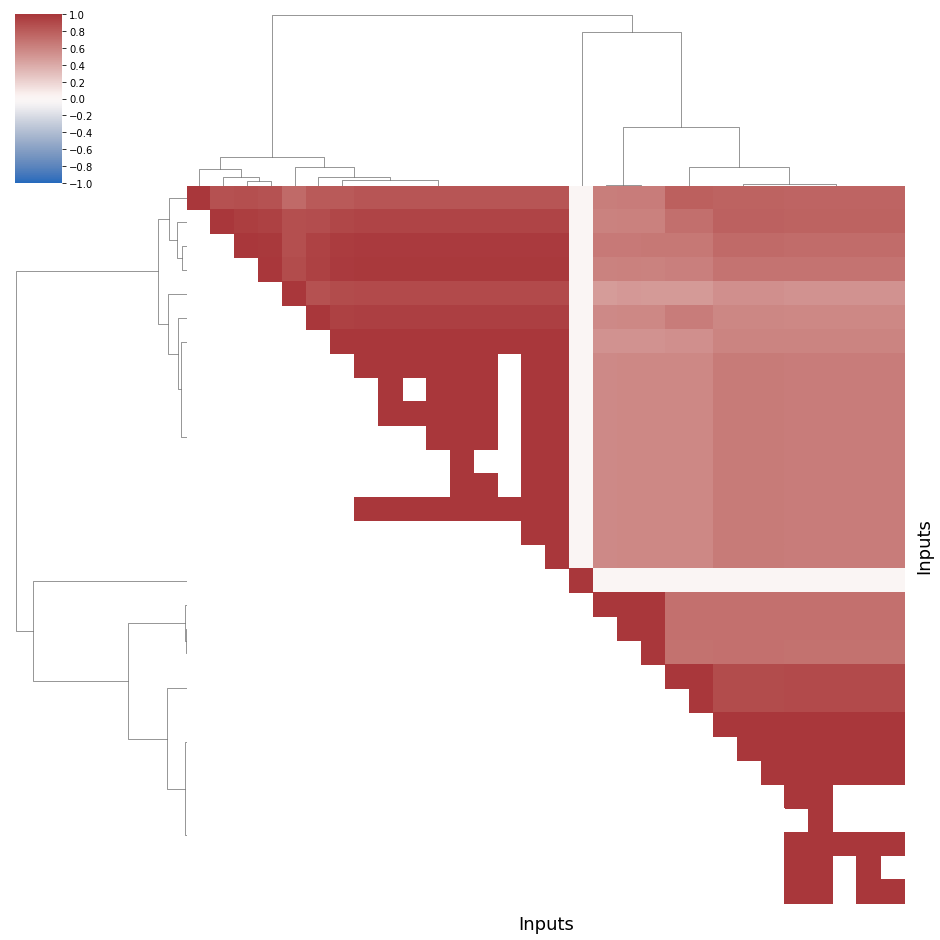

In [83]:
gr = get_groups("gcc", inputs_perf["gcc"][0])

## Properties

In [84]:
def get_properties(groups, id_group, ns):
    
    return inputs_prop[ns].iloc[groups[id_group]].mean()

for i in range(4):
    print(i+1)
    print(get_properties(gr, i, "gcc"))

1
csize             3512.0625
#LOCs              146.0625
number_literal      35.7500
for_statement       11.0000
if_statement         1.0000
dtype: float64
2
csize             2923.4
#LOCs              127.1
number_literal      19.7
for_statement        8.0
if_statement         1.0
dtype: float64
3
csize             3298.666667
#LOCs              144.666667
number_literal      22.666667
for_statement       12.333333
if_statement         1.666667
dtype: float64
4
csize             2943.0
#LOCs              125.0
number_literal      17.0
for_statement       13.0
if_statement         1.0
dtype: float64


In [85]:
gr

{0: [0, 1, 2, 3, 11, 12, 14, 15, 18, 19, 21, 22, 25, 26, 27, 29],
 1: [4, 7, 9, 10, 13, 16, 20, 23, 24, 28],
 2: [5, 6, 17],
 3: [8]}

## RQ2

In [92]:
def compute_importances(ns, dim, id_short=None):
    # input : a list of videos
    # output : a dataframe of feature importances
    
    if not id_short:
        id_short = np.arange(0, inputs_count[ns], 1)
    
    # the final list of importances
    listImportances = []
    
    perfs = [k for k in inputs_perf[ns]]
    perfs.remove(dim)
    
    df = data[ns, 0].drop(perfs, axis =1)
    
    features = [k for k in df.columns]
    features.remove(dim)

    # for each video of the list
    for id_input in id_short:
        
        # we replace missing numbers by 0
        df = data[ns, id_input].drop(perfs, axis =1)
        
        df = df.replace(to_replace = "None", value = '0')
        
        # standardization
        for col in features:
                # we center and reduce the quantitative variables
                # i.e substract the mean, and divide by the standard deviation
                # to avoid the scale of the vars to interfere with the learning process
                # if the variable is categorial
                df[col] = [np.where(k==df[col].unique())[0][0] for k in df[col]]
                arr_col = np.array(df[col], float)
                arr_col = (arr_col-np.mean(arr_col))/(np.std(arr_col)+1e-5)
                df[col] = arr_col
        
        # for each video, we train a model
        clf = RandomForestRegressor(n_estimators=20)
        # we use all the configuration options as predicting variables
        X = df.drop([dim], axis=1)
        # and the bitrate distribution of the video as a variable to predict
        y = df[dim]
        # we train the model on all the data (not train-test since we don't use the model)
        clf.fit(X, y)
        
        # we add feature importances to the list
        listImportances.append(clf.feature_importances_)
    
    # final dataframe of feature importances
    res = pd.DataFrame({'features' : features})
    
    # significative numbers p, cs = 10^p
    cs = 100
    
    # we add the feature imps to the dataframe 
    for id_input in range(len(listImportances)):
        res['input_'+str(id_input)] = np.round(cs*listImportances[id_input])/cs
    
    # transpose it
    res = res.set_index('features').transpose()
    
    # return it 
    return res

In [93]:
compute_importances("gcc", inputs_perf["gcc"][0], id_short= gr[0])

features,-ffloat-store,-floop-interchange,-fno-asm,-fprefetch-loop-arrays,optim_-O0,optim_-O1,optim_-O2,optim_-Ofast,optim_-Og
input_0,0.24,0.00,0.01,0.27,0.11,0.04,0.03,0.20,0.10
input_1,0.27,0.00,0.01,0.23,0.12,0.09,0.08,0.10,0.10
input_2,0.25,0.00,0.01,0.20,0.06,0.00,0.00,0.41,0.07
input_3,0.22,0.01,0.00,0.24,0.07,0.08,0.08,0.26,0.04
input_4,0.18,0.01,0.00,0.17,0.02,0.03,0.04,0.55,0.01
input_5,0.39,0.00,0.00,0.19,0.08,0.00,0.00,0.22,0.11
input_6,0.27,0.00,0.00,0.22,0.08,0.06,0.06,0.24,0.07
input_7,0.27,0.00,0.00,0.23,0.09,0.05,0.05,0.25,0.06
input_8,0.27,0.00,0.02,0.22,0.08,0.04,0.02,0.28,0.07
input_9,0.25,0.00,0.00,0.26,0.11,0.04,0.04,0.20,0.10


In [108]:
def compute_coefs(ns, dim, id_short):
    # input : a list of videos
    # output : a dataframe of feature importances
        
    if not id_short:
        id_short = np.arange(0, inputs_count[ns], 1)
    
    # the final list of coefficients
    listCoefs = []
    
    perfs = [k for k in inputs_perf[ns]]
    perfs.remove(dim)
    
    df = data[ns, 0].drop(perfs, axis =1)
    
    features = [k for k in df.columns]
    features.remove(dim)
    
    # for each video of the list
    for id_input in id_short:
        
        df = data[ns, id_input].drop(perfs, axis =1)
        
        # we replace missing numbers by 0
        df = df.replace(to_replace = "NaN", value = '0')
        df = df.replace(to_replace = "None", value = '0')
        
        # standardization
        for col in df.columns:
            # we center and reduce the quantitative variables
            # i.e substract the mean, and divide by the standard deviation
            # to avoid the scale of the vars to interfere with the learning process
            # if the variable is categorial
            df[col] = [np.where(k==df[col].unique())[0][0] for k in df[col]]
            arr_col = np.array(df[col], float)
            arr_col = (arr_col-np.mean(arr_col))/(np.std(arr_col)+1e-2)
            df[col] = arr_col

        # for each video, we train a model
        indexes = np.array([k for k in range(len(df[dim])) 
                            if df[dim][k] != float("inf") and not np.isnan(df[dim][k])],int)
        lr = LinearRegression()
        # we use all the configuration options as predicting variables
        X = df.drop([dim], axis=1)
        # and the bitrate distribution of the video as a variable to predict
        y = [float(k) for k in df[dim]]
        #print(y)
        # we train the model on all the data (not train-test since we don't use the model)
        lr.fit(X, y)
        # we add feature importances to the list
        listCoefs.append(lr.coef_)
    
    # final dataframe of feature importances
    res = pd.DataFrame({'features' : features})
    
    # significative numbers p, cs = 10^p
    cs = 100
    
    # we add the feature imps to the dataframe 
    for id_input in range(len(listCoefs)):
        res['video_'+str(id_input)] = np.round(cs*listCoefs[id_input])/cs
    
    # transpose it
    res = res.set_index('features').transpose()
    
    # return it 
    return res

In [109]:
compute_coefs("gcc", inputs_perf["gcc"][0], id_short= gr[0])

features,-ffloat-store,-floop-interchange,-fno-asm,-fprefetch-loop-arrays,optim_-O0,optim_-O1,optim_-O2,optim_-Ofast,optim_-Og
video_0,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35
video_1,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35
video_2,-0.25,0.0,-0.0,0.29,0.43,0.00,0.36,0.29,-0.36
video_3,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35
video_4,-0.28,-0.0,-0.0,0.28,0.43,-0.01,0.37,0.31,-0.37
video_5,-0.03,-0.0,-0.0,0.08,0.21,-0.04,0.34,0.18,-0.01
video_6,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35
video_7,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35
video_8,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35
video_9,-0.29,0.0,0.0,0.29,0.43,0.04,0.35,0.23,-0.35


In [113]:
def boxplot_imp(ns, dim, id_short = None, xlim = None, xname='Importances'):
    ### in: 
    #### ns the name of the system
    #### dim the name of the current performance property
    #### xlim limits if needed to focus on the important part of the chart
    #### xname the name of the abcissae and if we compute the importances or the effects
    ### out :
    #### a boxplot (saved in the system file)
    
    if xname == 'Importances':
        res = compute_importances(ns, dim, id_short)
    else:
        res = compute_coefs(ns, dim, id_short)
    
    # sort by names
    listImp = [(np.abs(np.percentile(res[col],75)-np.percentile(res[col],25)),res[col], col) 
               for col in res.columns]
    listImp.sort(key=lambda tup: tup[2], reverse=True)

    # see figures 2a and 2b
    red_square = dict(markerfacecolor='r', marker='s')
    plt.figure(figsize=(15,8))
    plt.grid()
    plt.boxplot([l[1] for l in listImp], flierprops=red_square, 
              vert=False, patch_artist=True, #widths=0.25,
              boxprops=dict(facecolor=(0,0,1,0.5),linewidth=1,edgecolor='k'),
              whiskerprops = dict(linestyle='-.',linewidth=1.0, color='black'))
    plt.xlabel(xname, size=13)
    if xlim:
        plt.xlim(xlim)
    plt.yticks(range(1, len(listImp) + 1), [l[2] for l in listImp])
    plt.show()

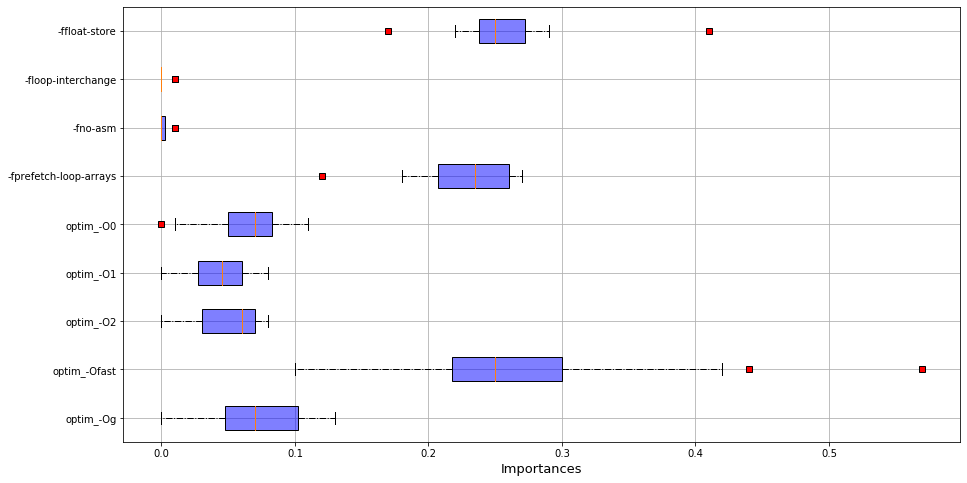

In [114]:
boxplot_imp("gcc", inputs_perf["gcc"][0], id_short= gr[0])

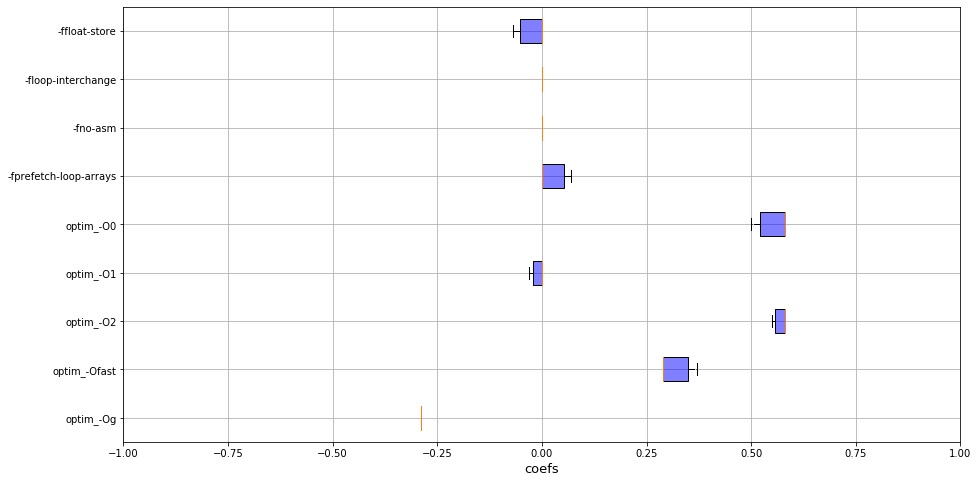

In [116]:
boxplot_imp("gcc", inputs_perf["gcc"][0], id_short= gr[1], xlim=[-1,1], xname="coefs")

## RQ3

In [118]:
def get_ratios(ns, dim, id_short):
    
    ratios = []
    
    nb_inputs = inputs_count[ns]
    
    for index_target in range(len(id_short)):

        list_ratios = []
        s1 = np.max(data[ns, index_target][dim])

        for i in range(10):
            index_source = id_short[np.random.randint(len(id_short))]
            s2 = data[ns, id_short[index_target]][dim][np.argmax(data[ns, index_source][dim])]
            # we drop the ratios that are division per 0 or nan values
            if not np.isnan(s1) and not np.isnan(s2) and s2!=0:
                # we drop the ratios too high because it is just due to the fact that s2 is too low 
                # and it increases the standard deviation
                if int(s1/s2) <= 50 and s1/s2 >1:
                    list_ratios.append(s1/s2)

        ratios.append(np.nanmean(list_ratios))

    return (np.nanmean(ratios), 
            np.nanstd(ratios), 
            np.nanpercentile(ratios,5),
            np.nanpercentile(ratios,25),
            np.nanmedian(ratios),
            np.nanpercentile(ratios,75),
            np.nanpercentile(ratios,95))

In [121]:
get_ratios("gcc", inputs_perf["gcc"][0], id_short= gr[0])

/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


(1.202743023873924,
 0.14870880802073108,
 1.0003779531285597,
 1.1271113409169253,
 1.2140471594320175,
 1.2143156132272916,
 1.450241296104791)

## Compute all once

In [134]:
def compute_all(ns, dim, n_clusters = 4):
    
    print("RQ1 - correlations and groups \n")
    gr = get_groups(ns, dim, n_clusters)
    
    for i in range(n_clusters):
        print("\n--\nGroup ",str(i+1),"\n--")
        
        print("\nProperties\n")
        print(get_properties(gr, i, ns))
        
        boxplot_imp(ns, dim, id_short= gr[i])
        boxplot_imp(ns, dim, id_short= gr[i], xlim=[-1,1], xname="coefs")
        
        print("\n RQ3 - Performance ratios\n")
        
        ratios = get_ratios(ns, dim, id_short= gr[i])
        print("Mean = ", ratios[0])
        print("Std = ", ratios[1])

## Results for all systems


-----
 nodejs 
-----


---
 ops 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


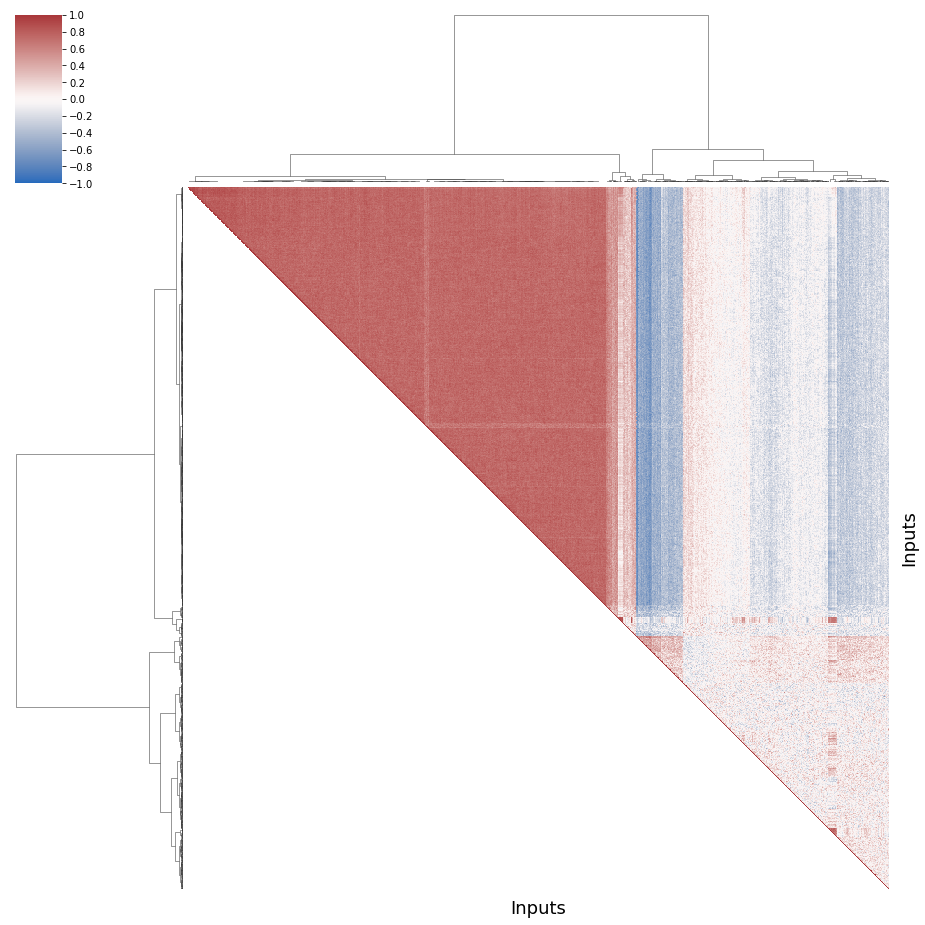


--
Group  1 
--

Properties

name                     961.553004
csize                   1550.505300
#LOCs                     65.051237
variable_declarator       12.296820
for_statement              0.980565
if_statement               1.634276
function_declaration       2.791519
dtype: float64


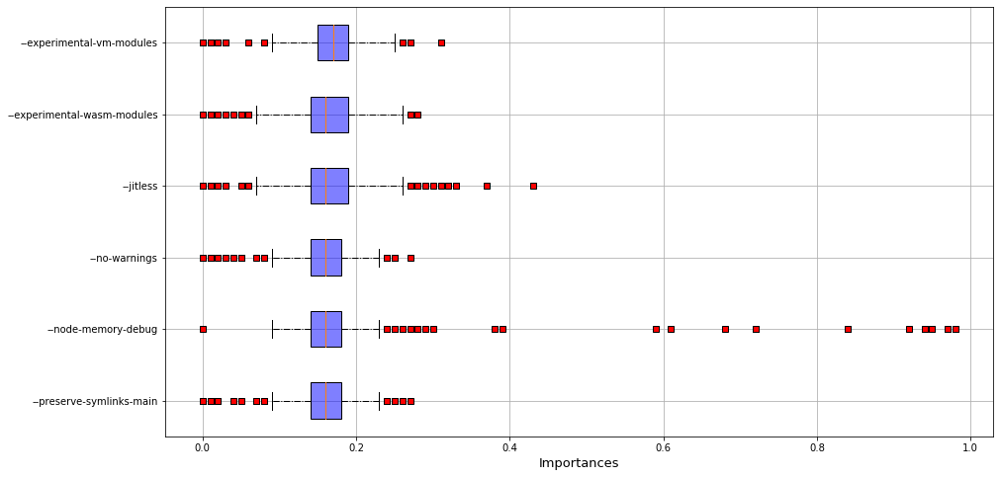

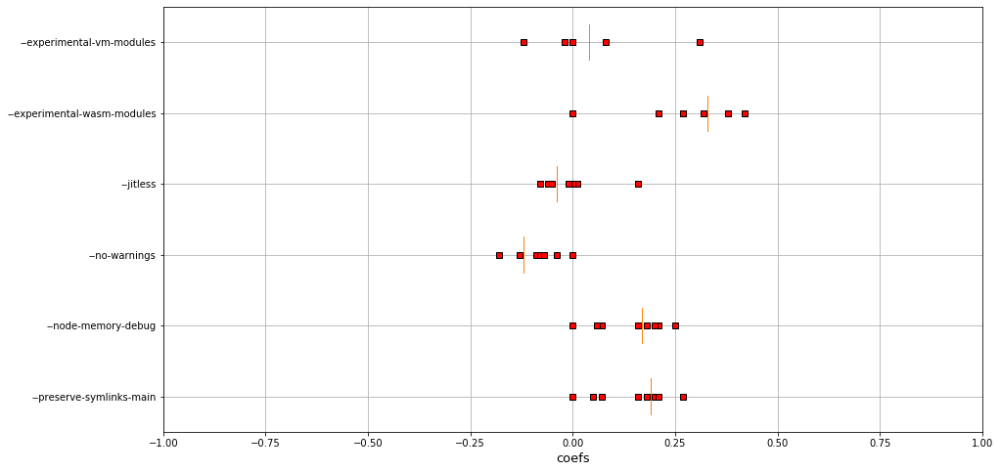


 RQ3 - Performance ratios

Mean =  11.180509050699113
Std =  12.28927623074926

--
Group  2 
--

Properties

name                     981.986123
csize                   1252.281006
#LOCs                     56.452732
variable_declarator        9.333044
for_statement              1.934952
if_statement               1.265395
function_declaration       2.018213
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


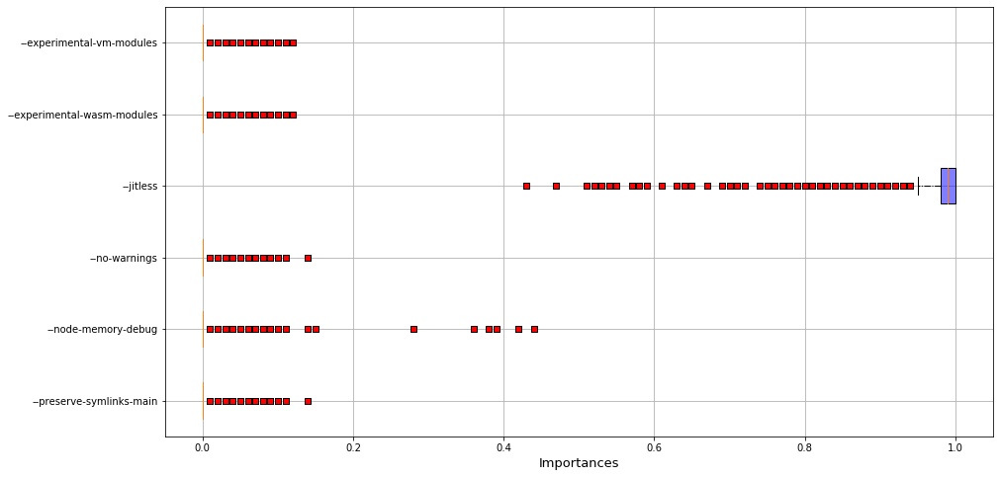

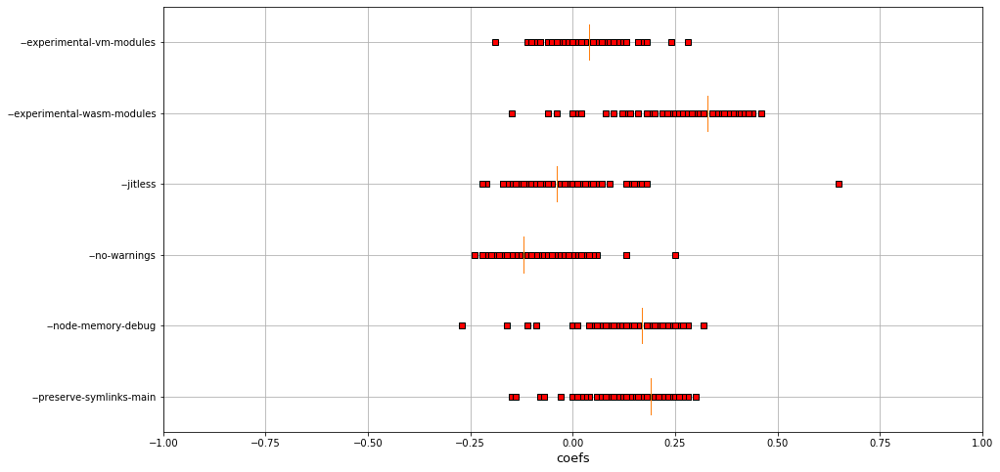


 RQ3 - Performance ratios

Mean =  11.2292010770449
Std =  12.291688306118807

--
Group  3 
--

Properties

name                     785.428571
csize                   1248.976190
#LOCs                     55.500000
variable_declarator       10.547619
for_statement              1.154762
if_statement               0.833333
function_declaration       1.678571
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


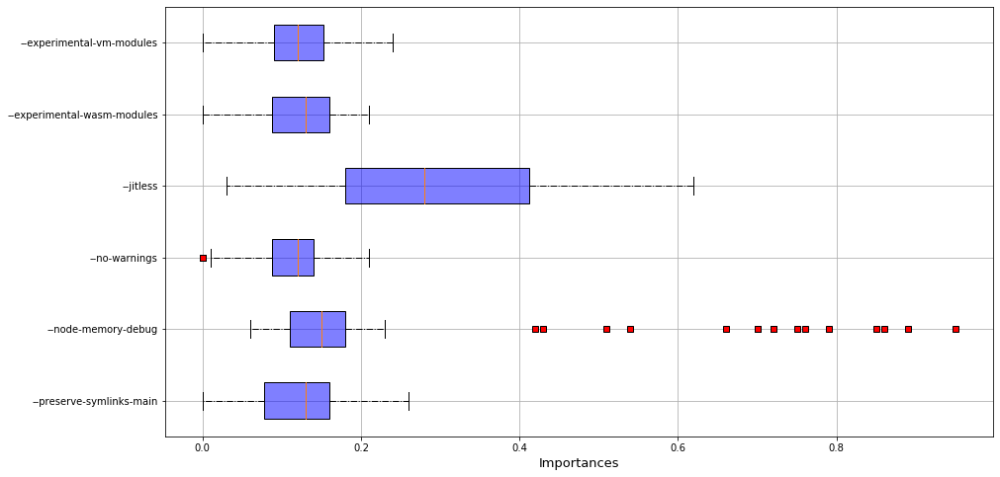

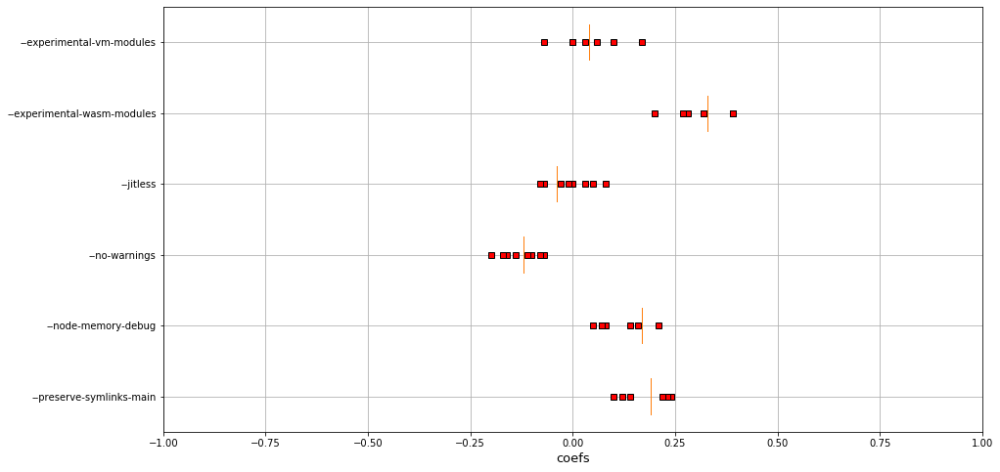


 RQ3 - Performance ratios

Mean =  9.95196672968563
Std =  6.603498609599454

--
Group  4 
--

Properties

name                     982.581395
csize                   1351.775194
#LOCs                     59.031008
variable_declarator        9.922481
for_statement              3.062016
if_statement               1.511628
function_declaration       2.682171
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


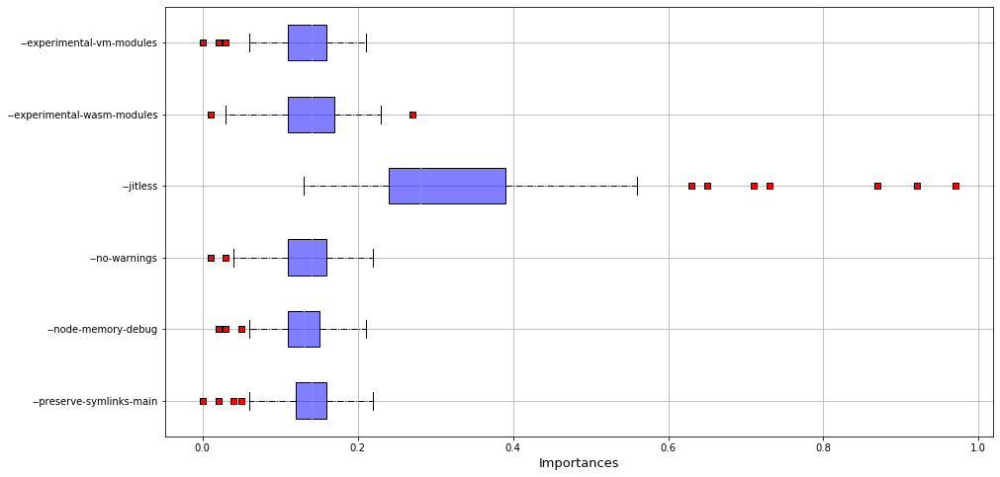

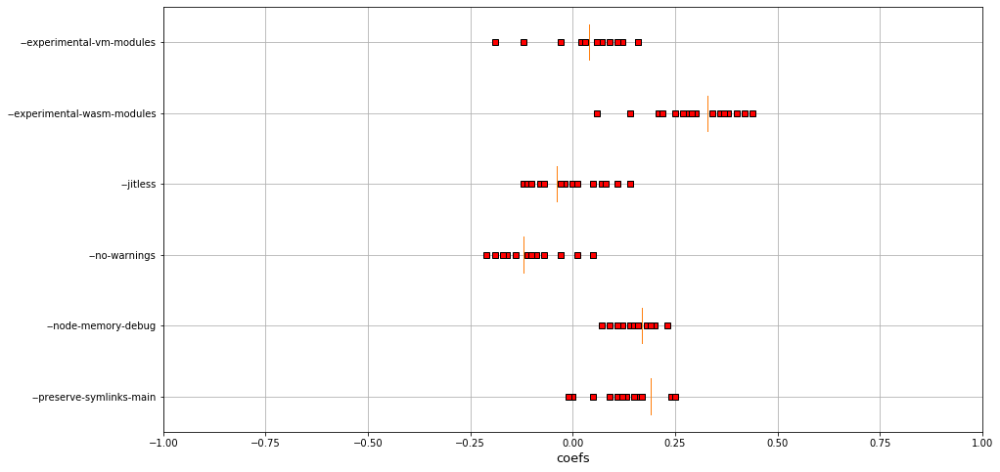


 RQ3 - Performance ratios

Mean =  5.101043194668722
Std =  9.165396326295975

-----
 poppler 
-----


---
 size 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


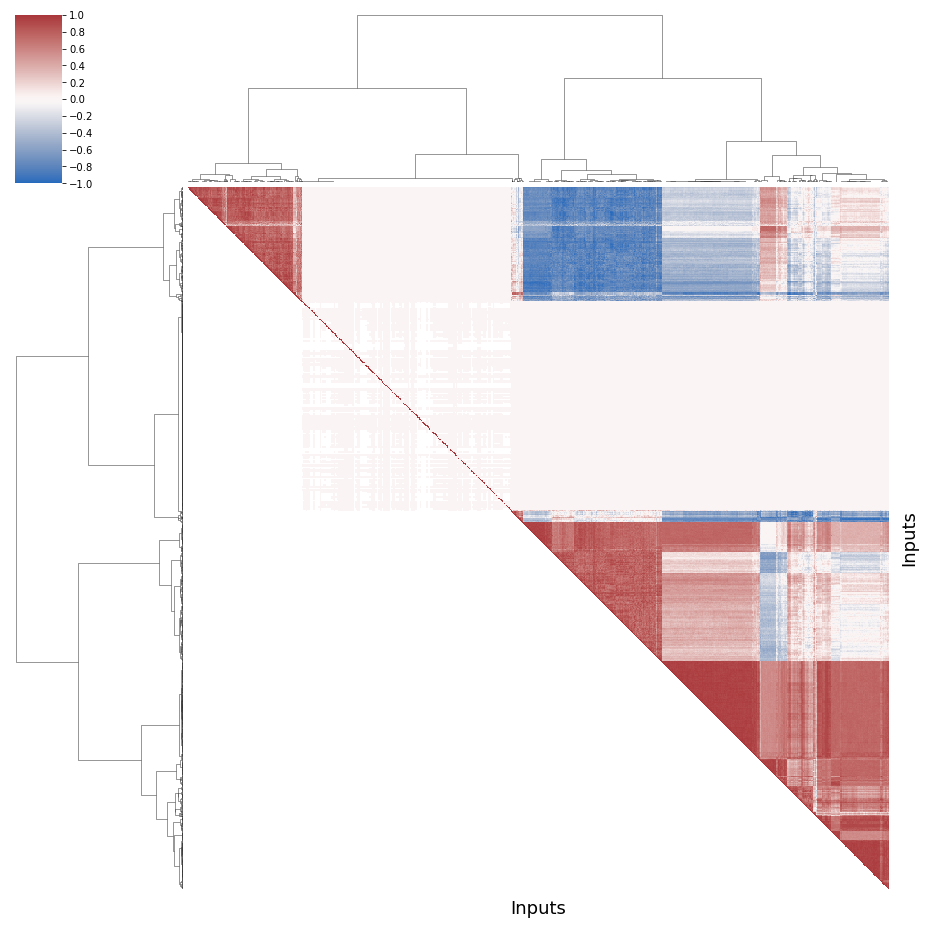


--
Group  1 
--

Properties

name            769.673820
pdfsize      743437.854077
hpage           796.148271
wpage           641.660817
nbpages          70.189247
imagesize      1595.570815
nbimage          49.218884
dtype: float64


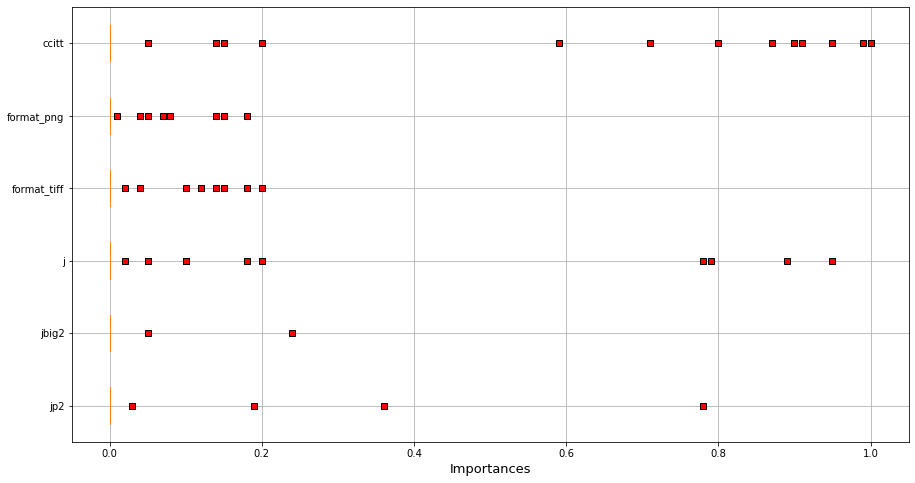

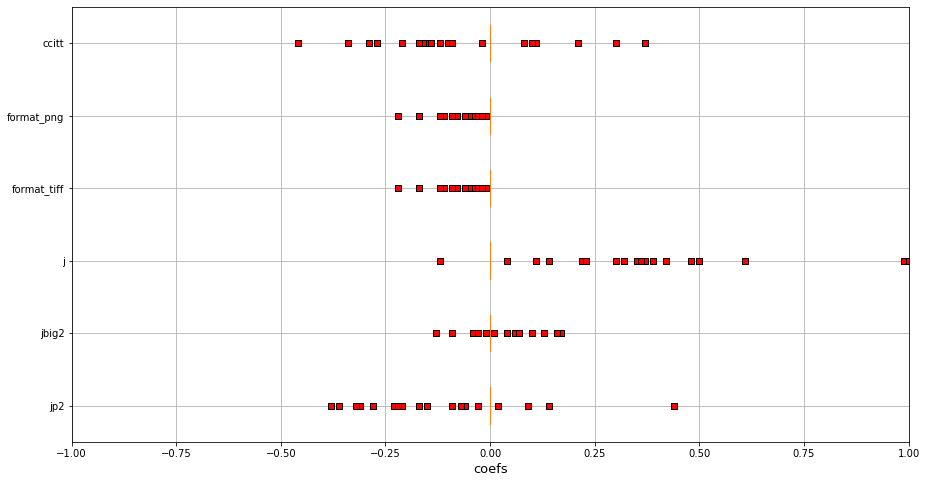


 RQ3 - Performance ratios

Mean =  12.254285941598301
Std =  14.782835807302511

--
Group  2 
--

Properties

name         7.512273e+02
pdfsize      1.286563e+06
hpage        7.861399e+02
wpage        6.153412e+02
nbpages      1.260620e+02
imagesize    8.186463e+03
nbimage      7.119463e+02
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


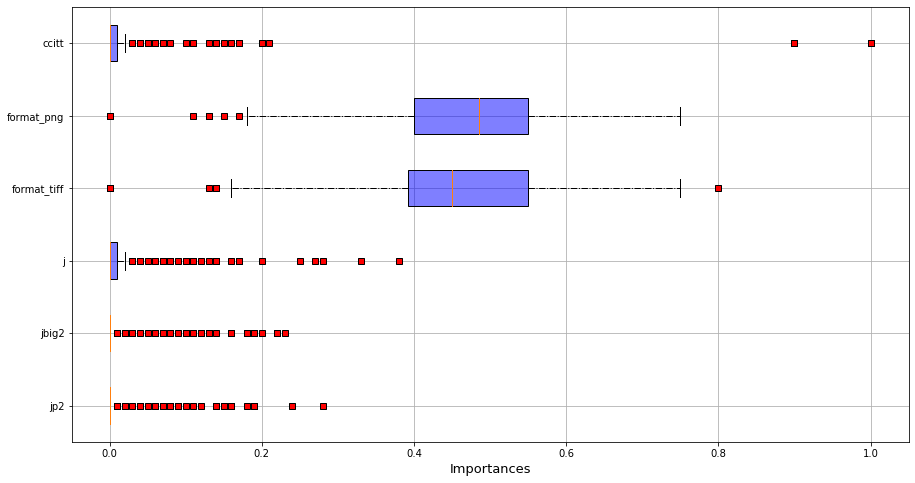

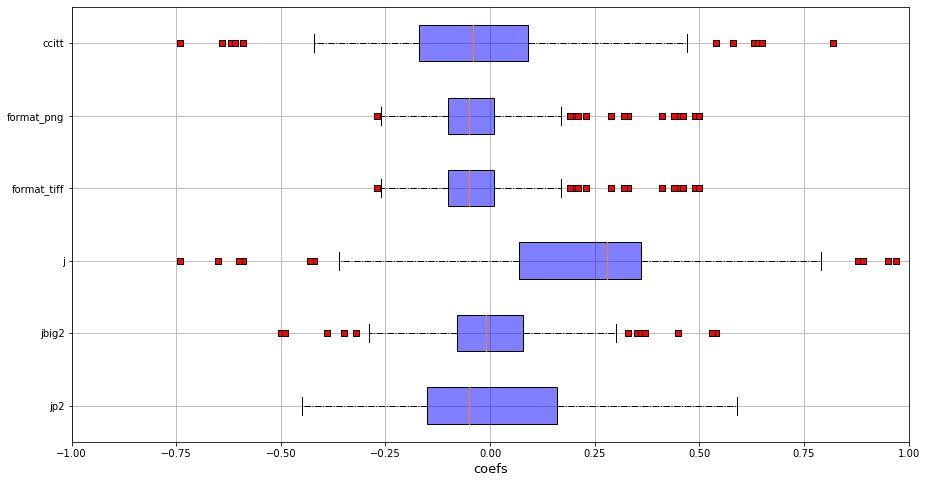


 RQ3 - Performance ratios

Mean =  13.27549424978909
Std =  14.109580243373227

--
Group  3 
--

Properties

name         7.036213e+02
pdfsize      3.613301e+06
hpage        7.093749e+02
wpage        6.602222e+02
nbpages      1.939686e+02
imagesize    8.806628e+04
nbimage      6.029770e+02
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


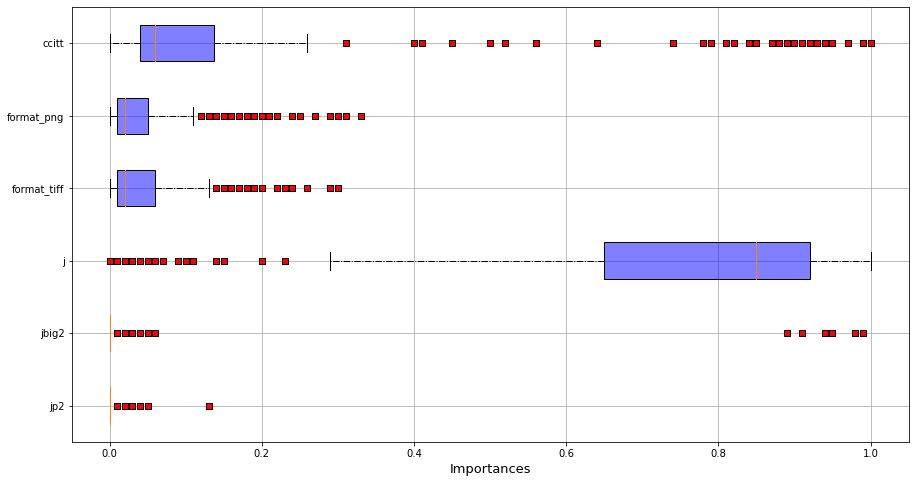

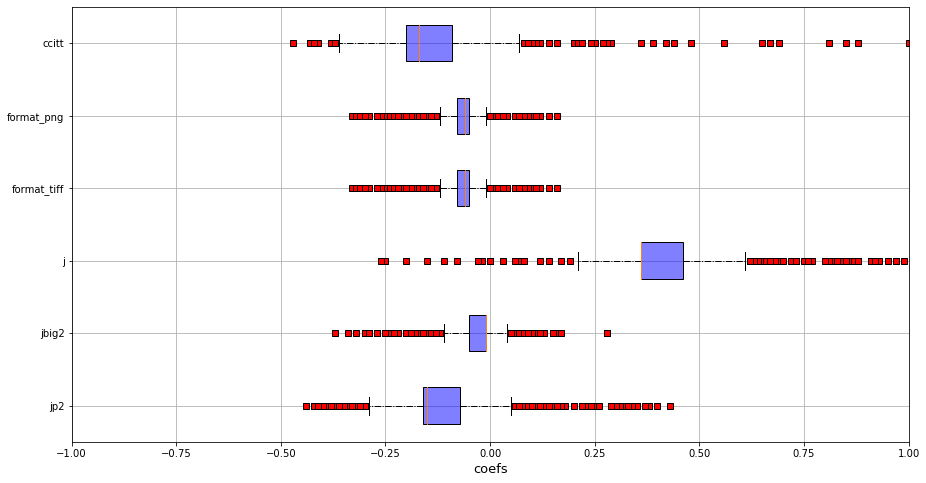


 RQ3 - Performance ratios

Mean =  8.6173849921688
Std =  9.985355857161151

--
Group  4 
--

Properties

name         7.513993e+02
pdfsize      2.263131e+06
hpage        7.670978e+02
wpage        6.761289e+02
nbpages      9.980546e+01
imagesize    5.939578e+04
nbimage      3.773515e+02
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


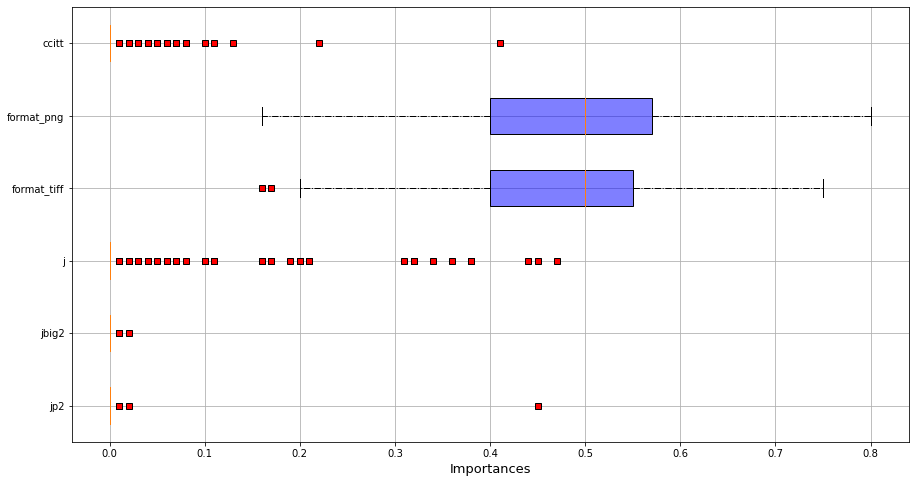

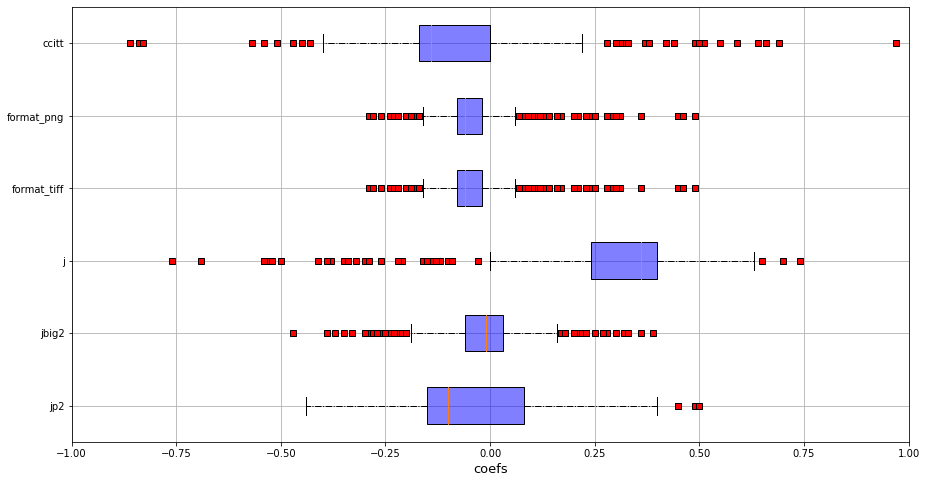


 RQ3 - Performance ratios

Mean =  10.302476582162253
Std =  11.548795139690734

---
 time 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


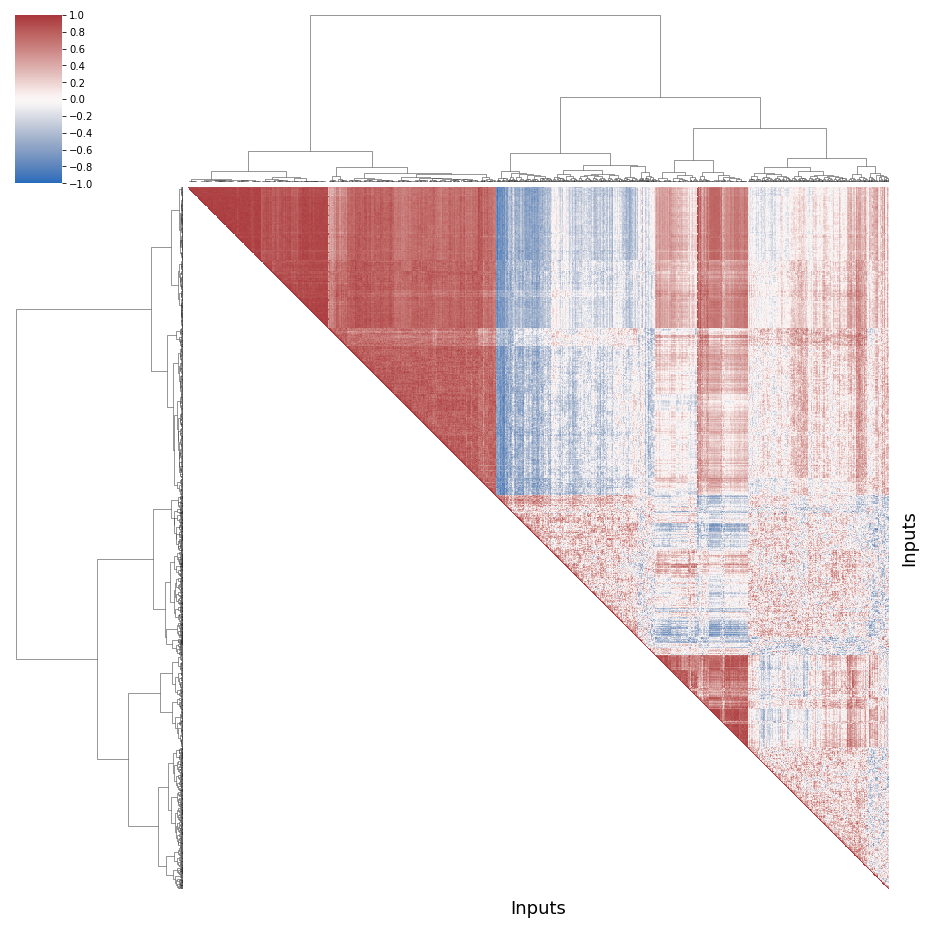


--
Group  1 
--

Properties

name         7.711347e+02
pdfsize      1.486510e+06
hpage        7.963293e+02
wpage        6.554314e+02
nbpages      1.519493e+02
imagesize    1.290370e+04
nbimage      1.120202e+02
dtype: float64


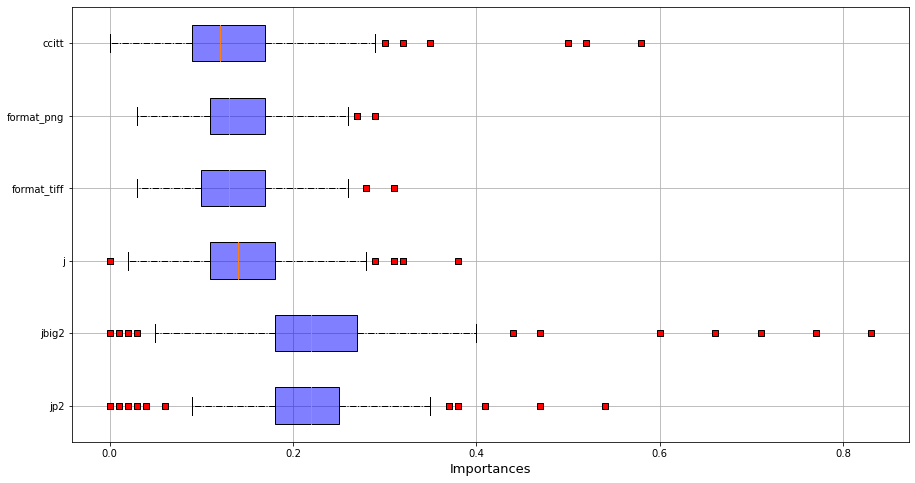

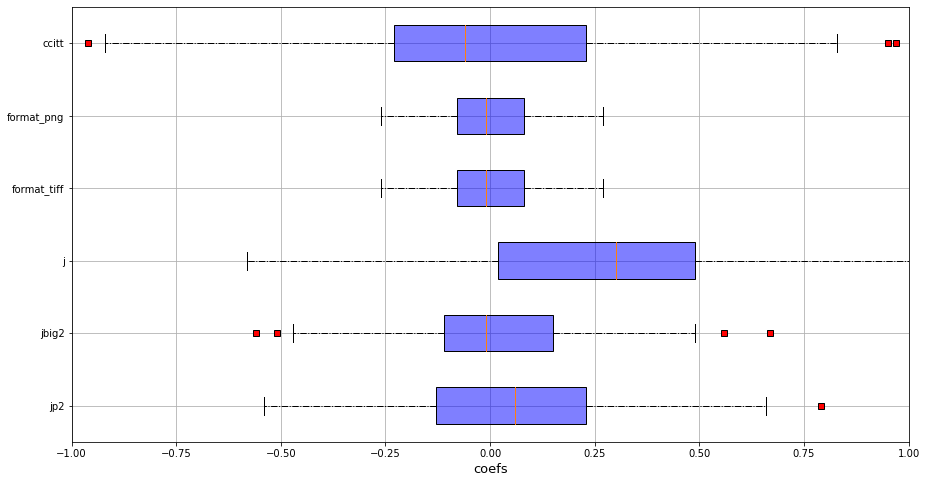


 RQ3 - Performance ratios

Mean =  10.39456517537285
Std =  12.410813409523108

--
Group  2 
--

Properties

name            727.598214
pdfsize      696423.226190
hpage           792.839720
wpage           609.357226
nbpages          66.565476
imagesize      1880.238095
nbimage         453.833333
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


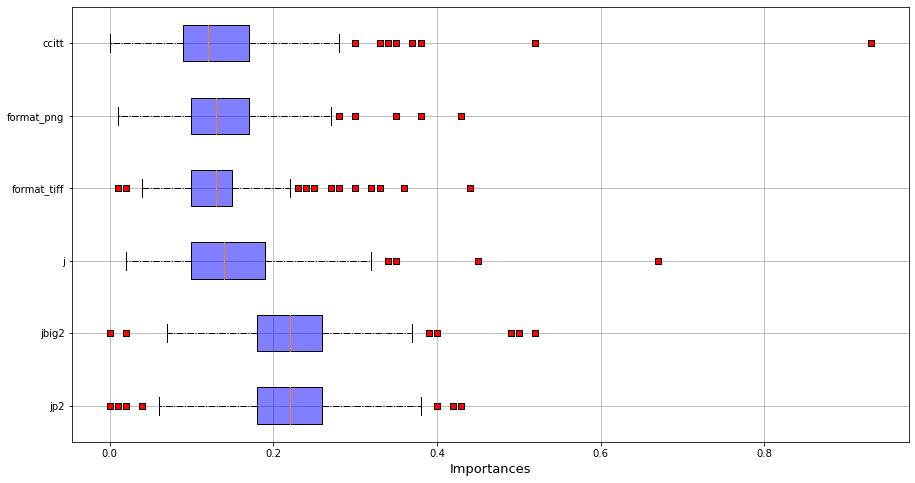

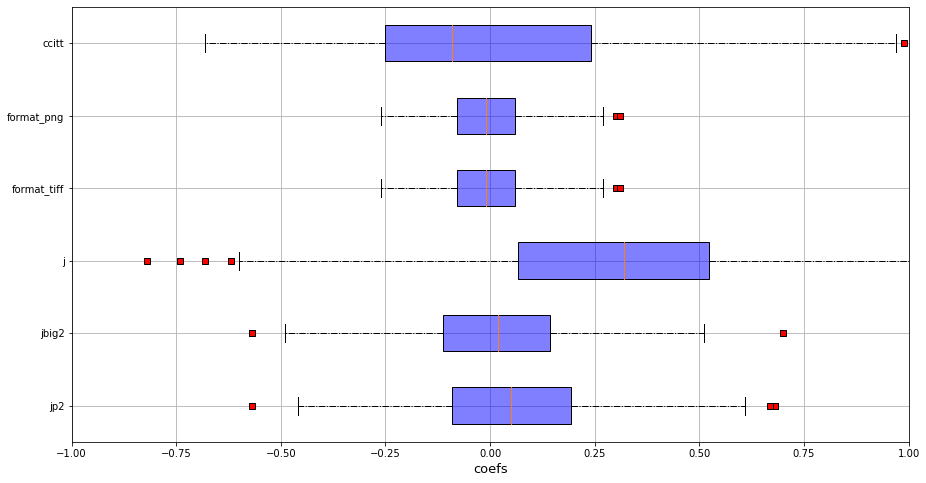


 RQ3 - Performance ratios

Mean =  9.971055825829254
Std =  12.310003746911987

--
Group  3 
--

Properties

name         7.426114e+02
pdfsize      2.976313e+06
hpage        7.317492e+02
wpage        6.781827e+02
nbpages      1.419171e+02
imagesize    7.013086e+04
nbimage      3.054869e+02
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


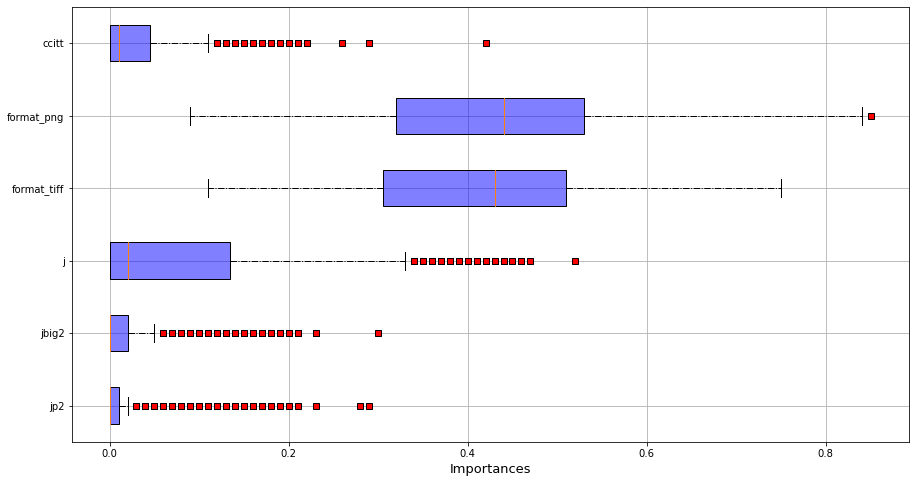

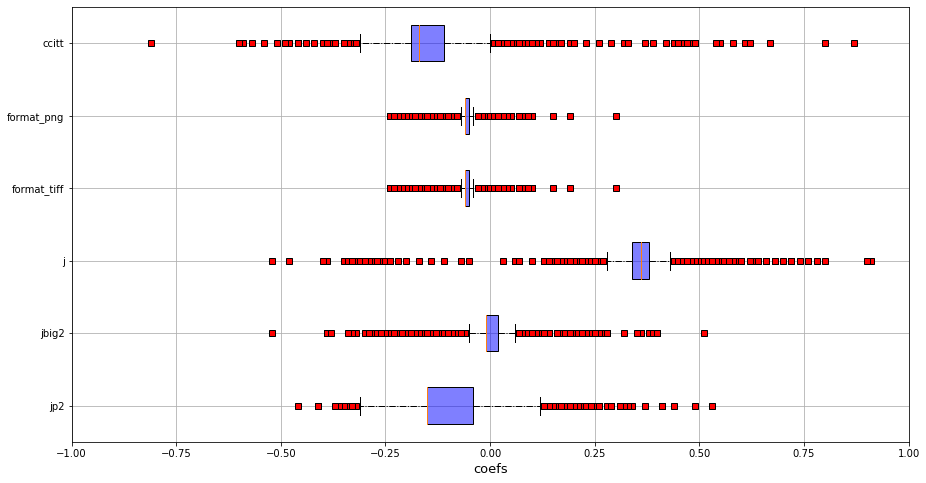


 RQ3 - Performance ratios



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


Mean =  6.895999730712211
Std =  8.196312897936368

--
Group  4 
--

Properties

name         7.180308e+02
pdfsize      2.230640e+06
hpage        7.477912e+02
wpage        6.191188e+02
nbpages      1.301231e+02
imagesize    6.207157e+04
nbimage      1.073764e+03
dtype: float64


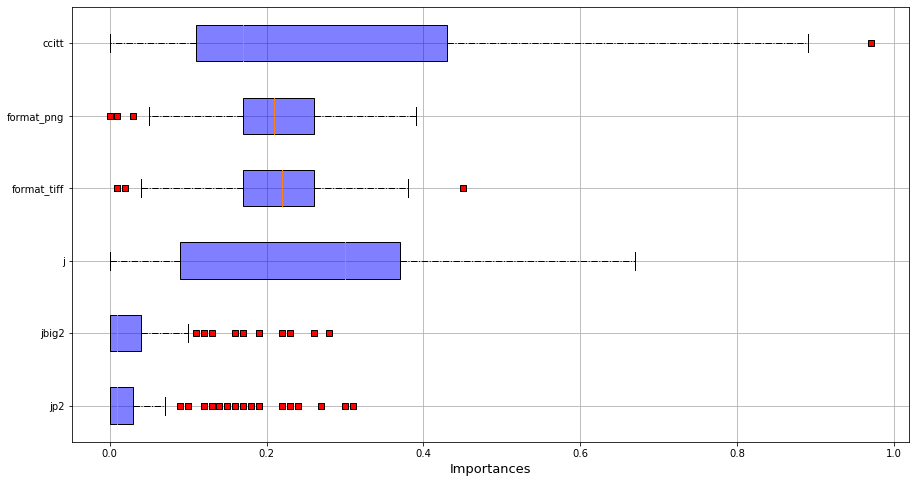

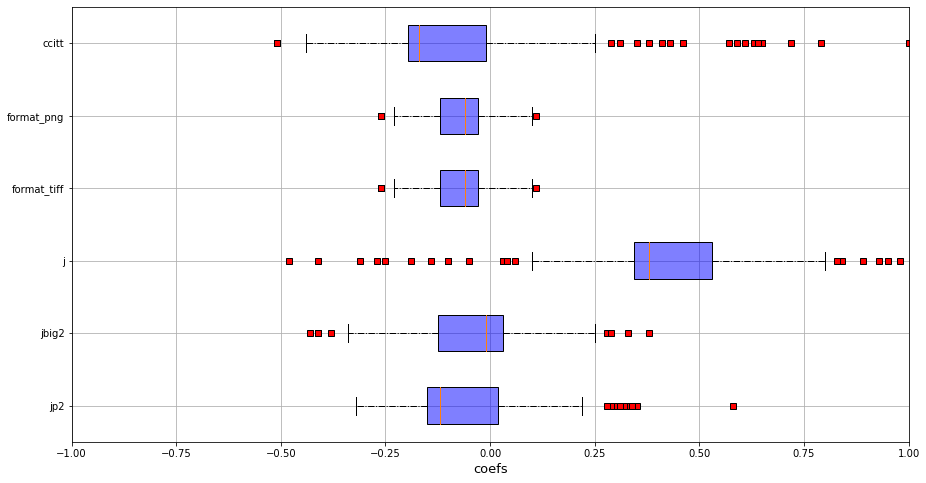


 RQ3 - Performance ratios

Mean =  7.699165925914735
Std =  9.621430574741003

-----
 xz 
-----


---
 size 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


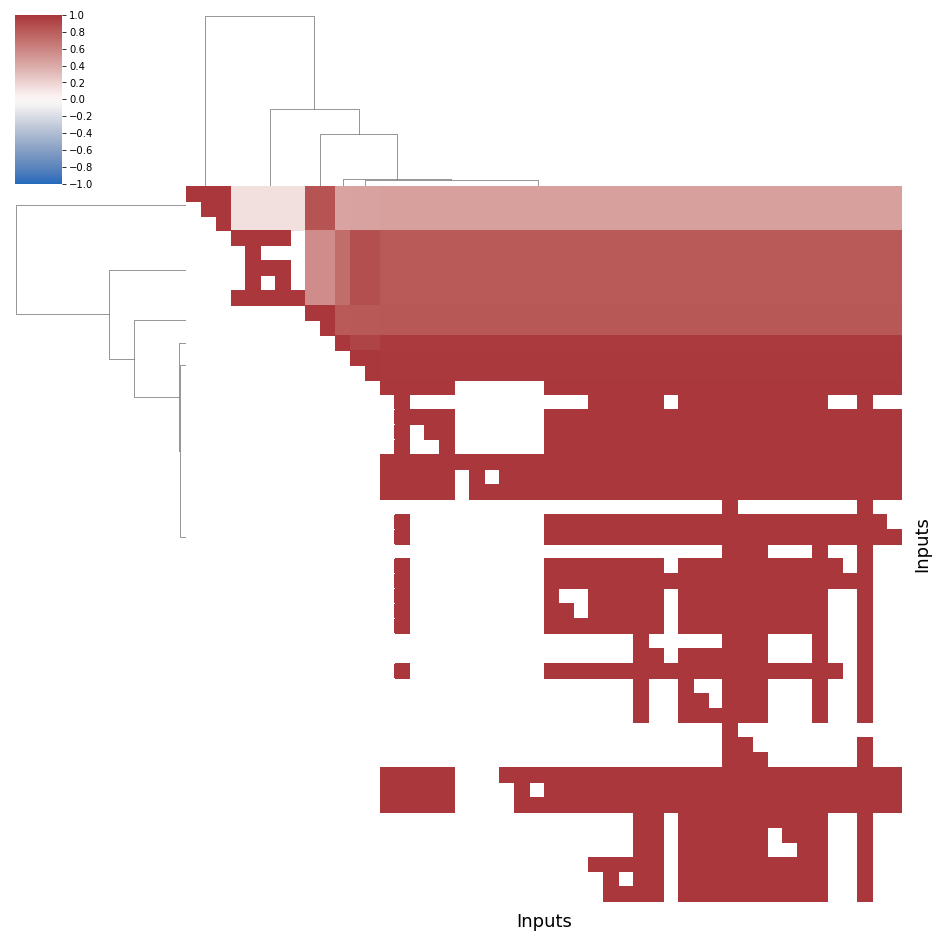


--
Group  1 
--

Properties

size    1.874235e+06
dtype: float64


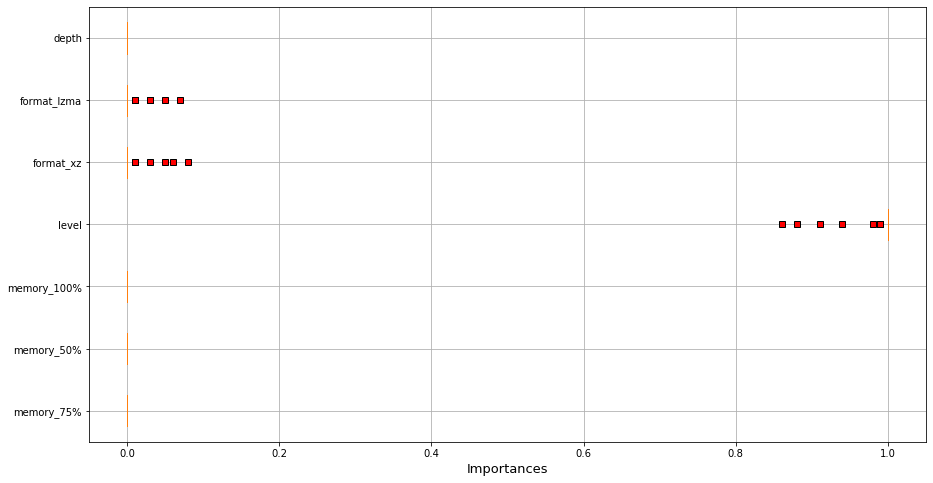

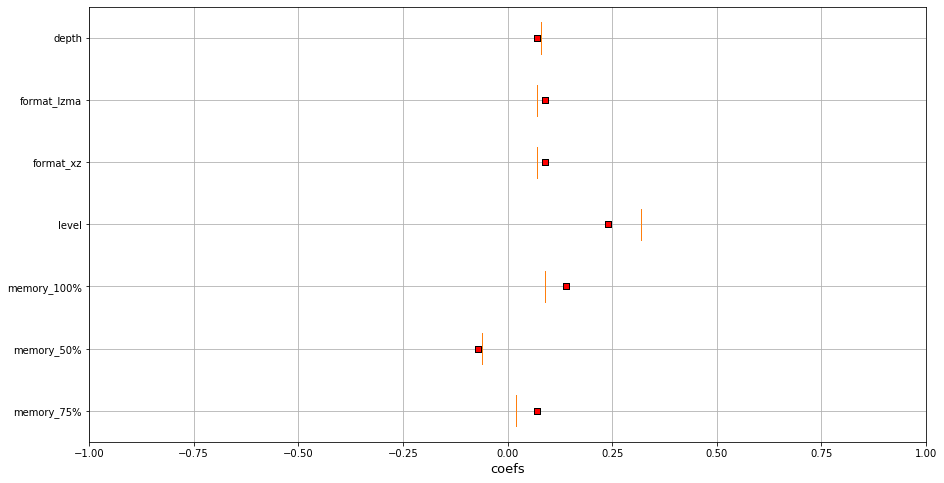


 RQ3 - Performance ratios

Mean =  5.719518759493845
Std =  7.250904573507294

--
Group  2 
--

Properties

size    66667.0
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


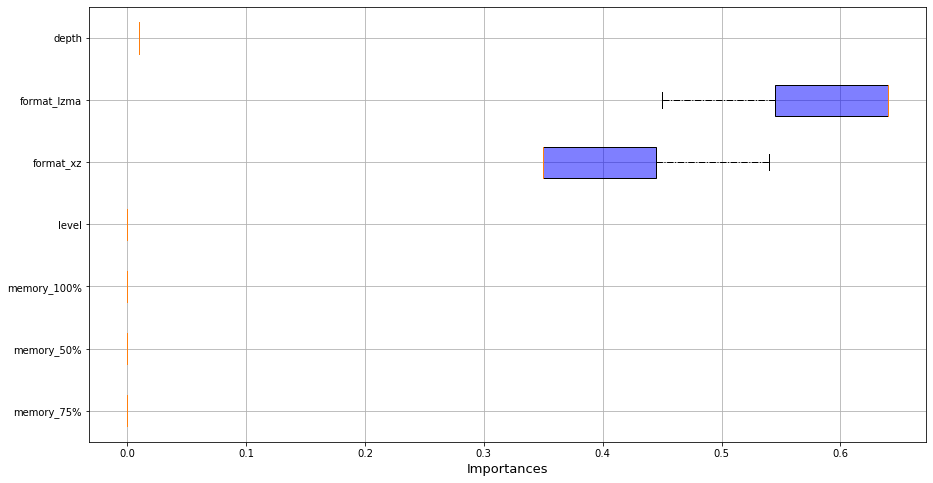

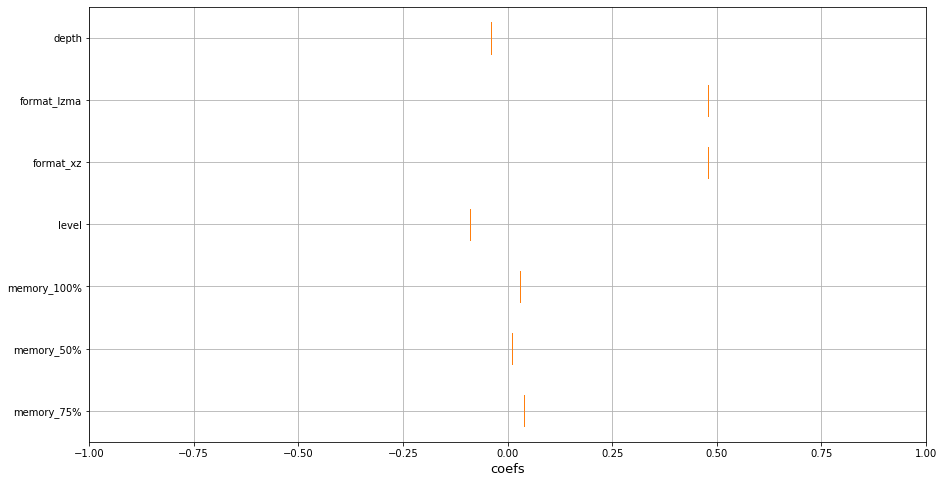


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

size    31606294.8
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


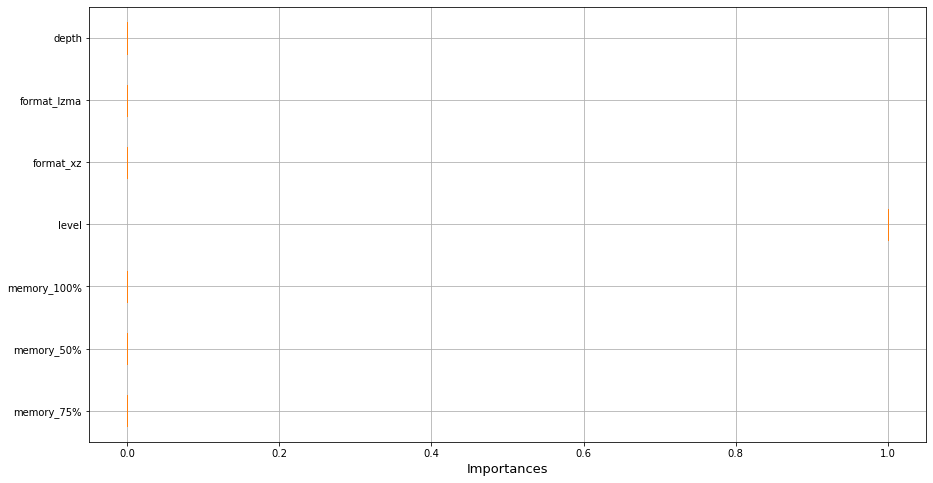

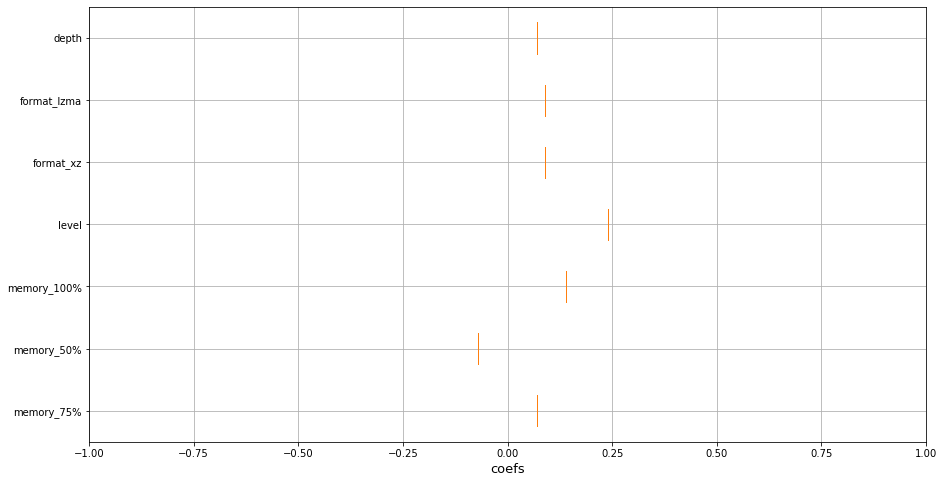


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

size    3974.0
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


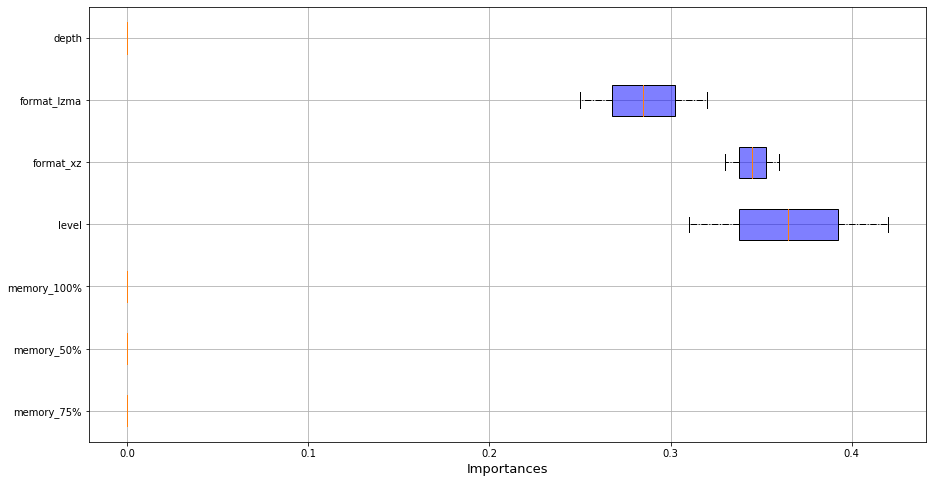

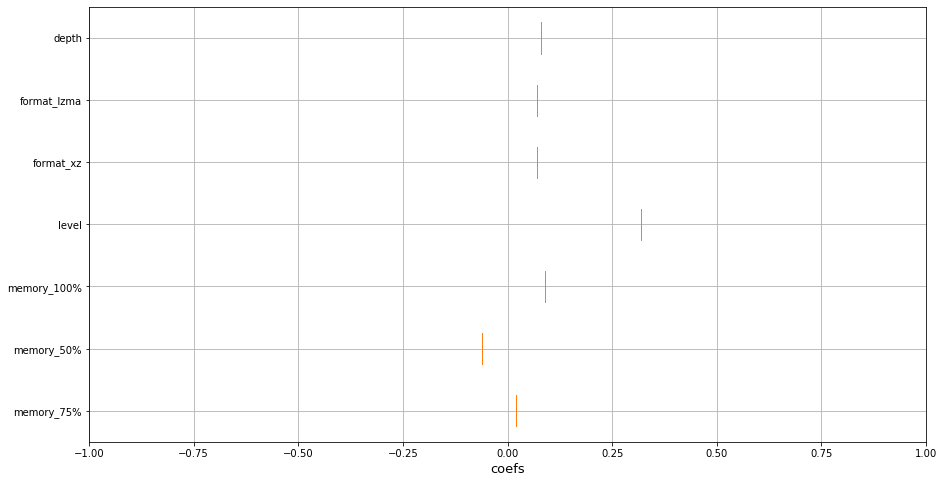


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 time 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


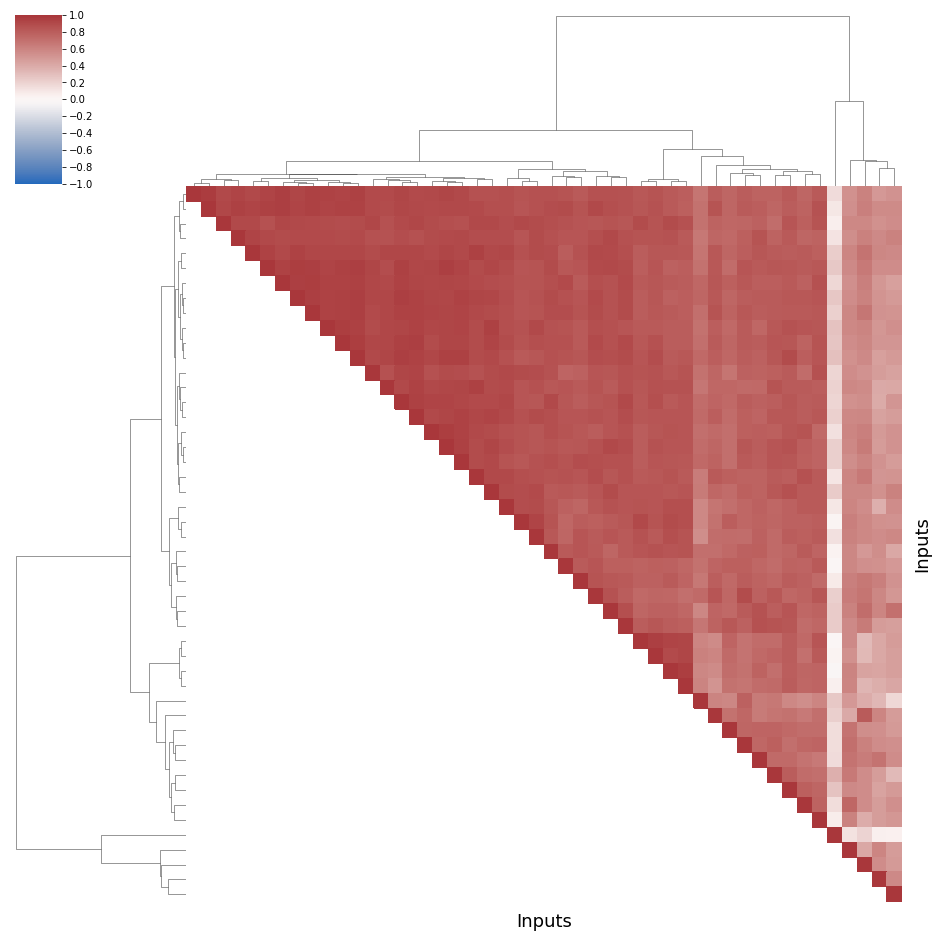


--
Group  1 
--

Properties

size    1.307096e+07
dtype: float64


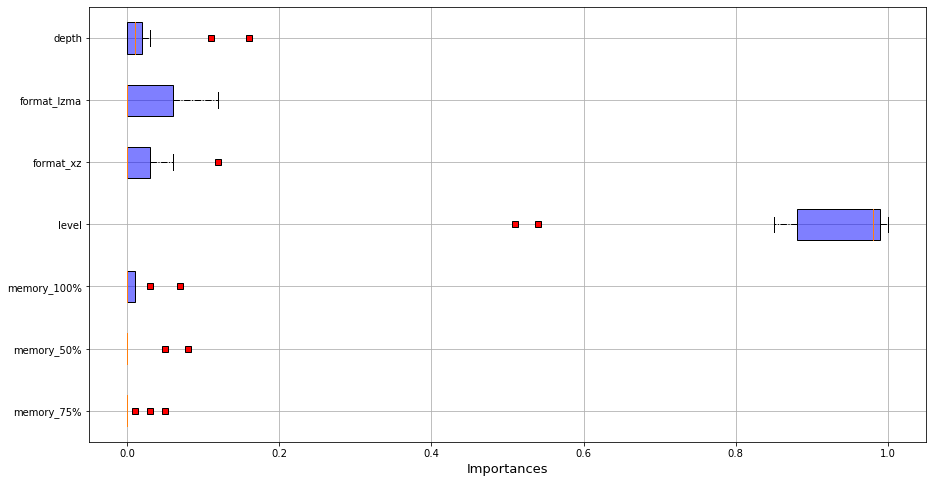

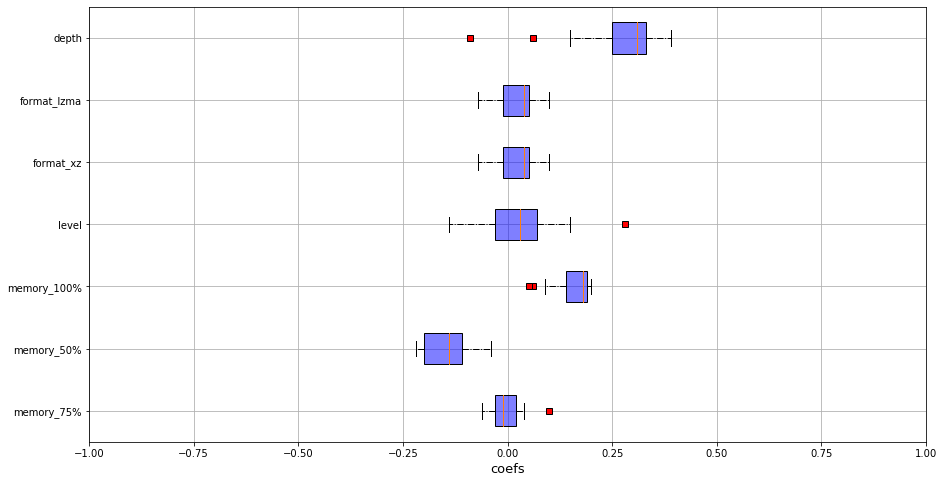


 RQ3 - Performance ratios

Mean =  1.8456519701734997
Std =  0.9332473692301549

--
Group  2 
--

Properties

size    1.0
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


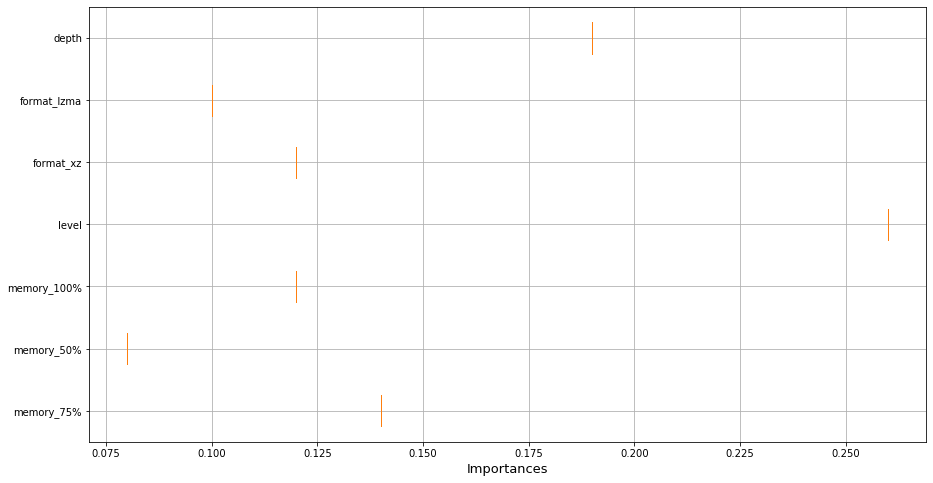

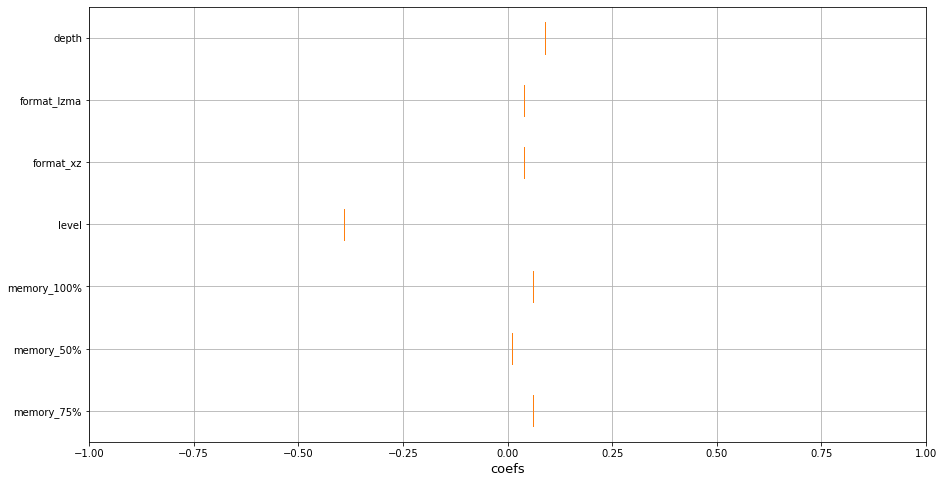


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

size    1.739267e+06
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


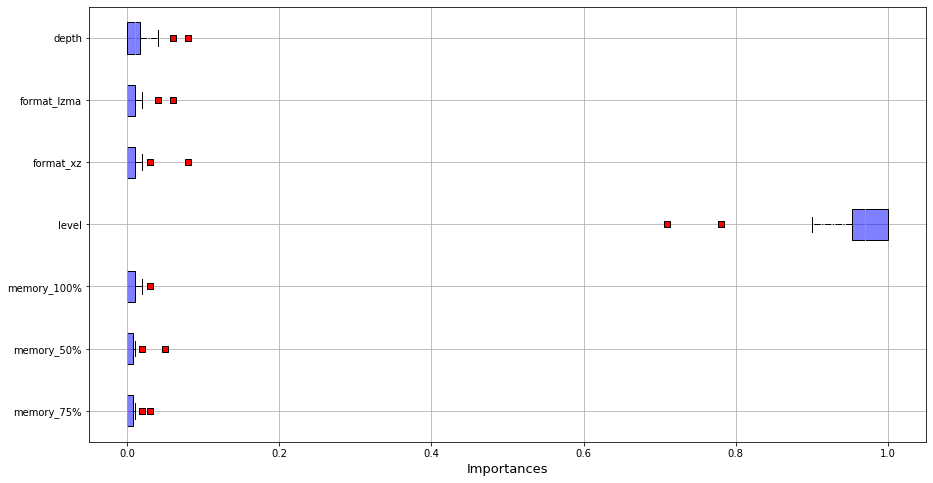

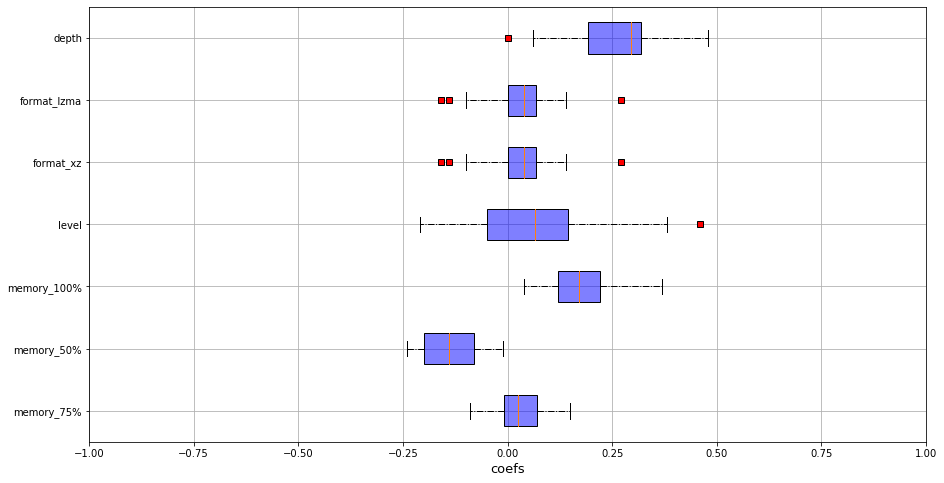


 RQ3 - Performance ratios

Mean =  16.70024765904424
Std =  17.71133318212704

--
Group  4 
--

Properties

size    1839973.0
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


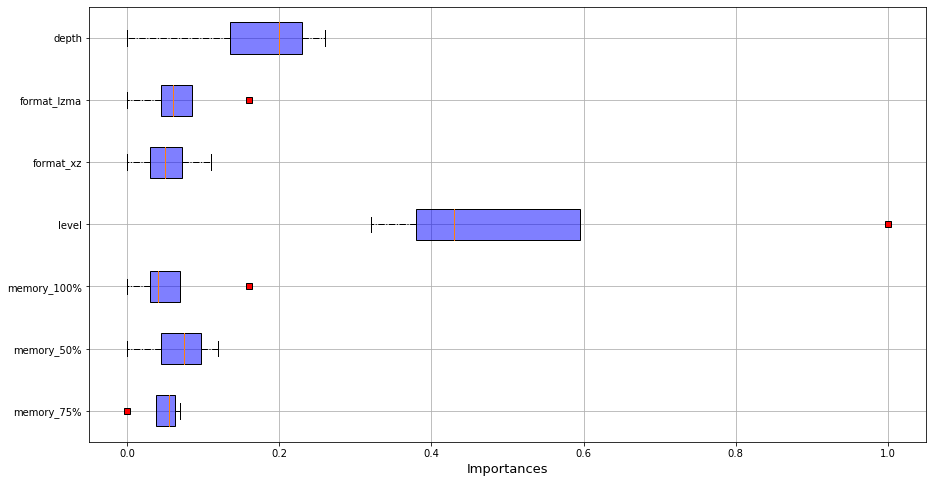

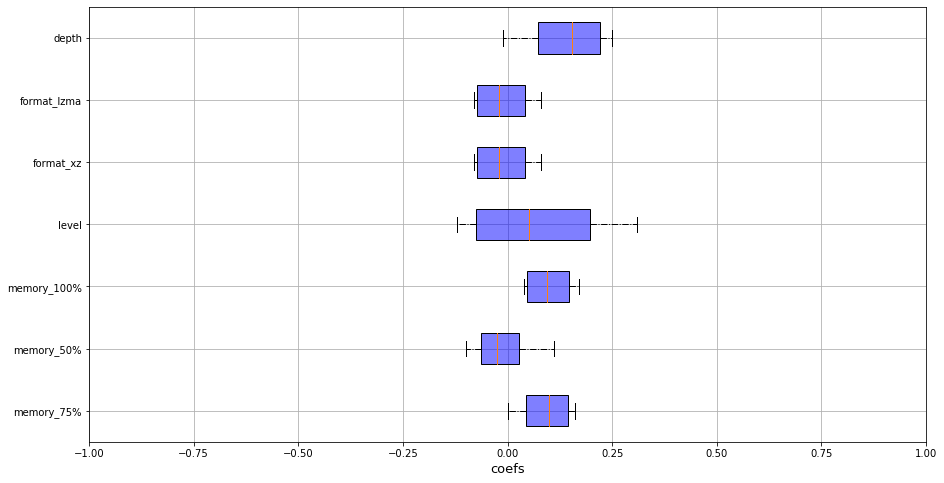


 RQ3 - Performance ratios

Mean =  3.4017721017721017
Std =  0.0

-----
 x264 
-----


---
 size 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


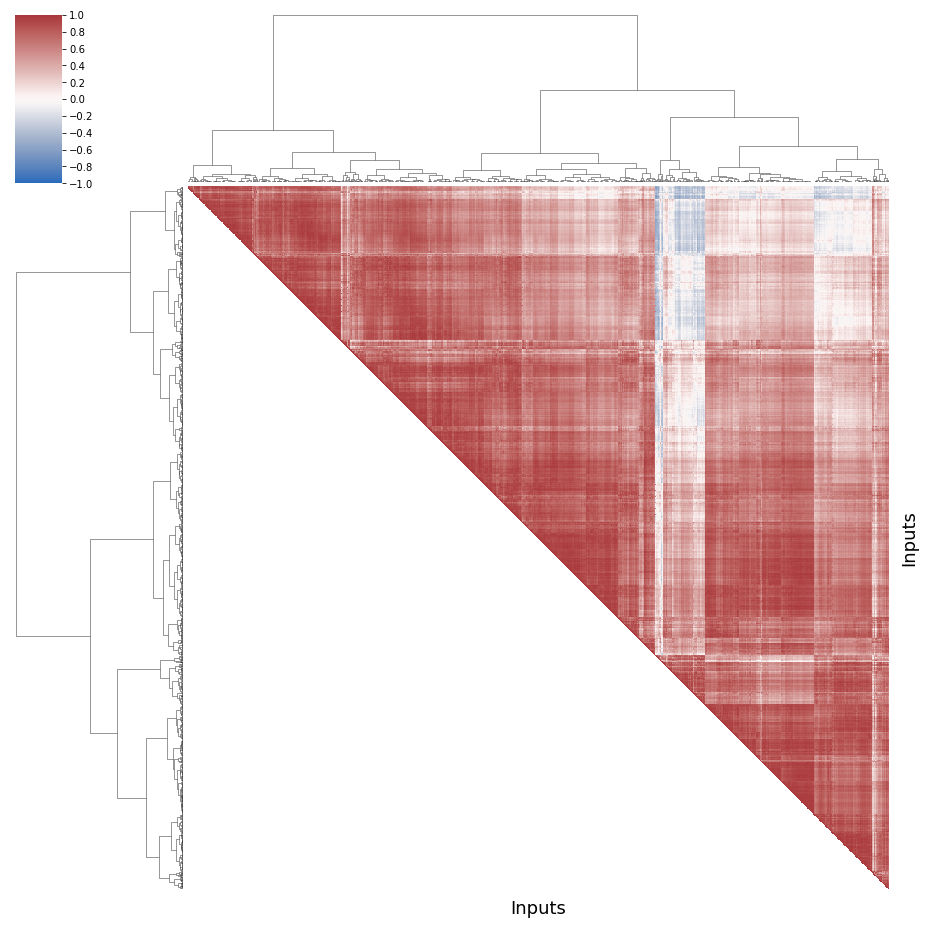


--
Group  1 
--

Properties

resolution                     943.976261
WIDTH                         1661.074184
HEIGHT                         962.818991
SPATIAL_COMPLEXITY               0.816552
TEMPORAL_COMPLEXITY              0.283282
CHUNK_COMPLEXITY_VARIATION       1.938682
COLOR_COMPLEXITY                 0.289131
dtype: float64


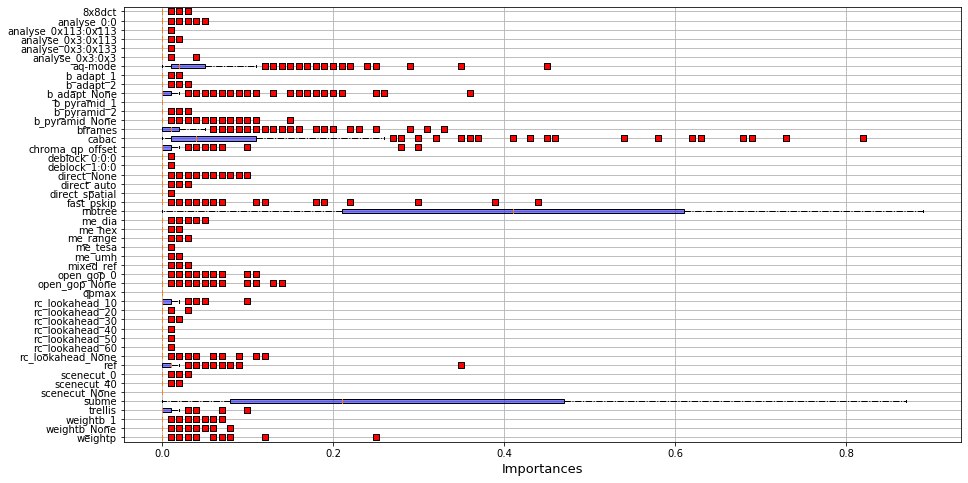

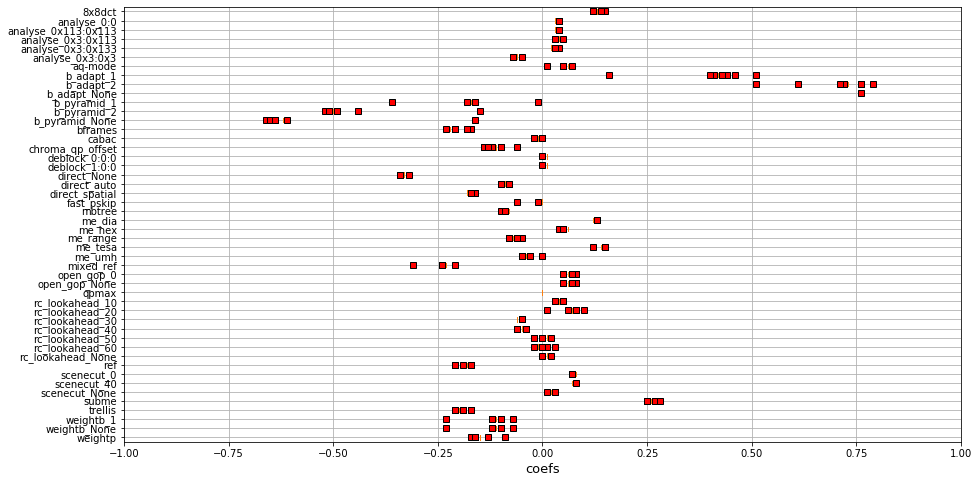


 RQ3 - Performance ratios



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


Mean =  8.317855101366563
Std =  10.102452103600232

--
Group  2 
--

Properties

resolution                     803.703704
WIDTH                         1364.679012
HEIGHT                         817.650206
SPATIAL_COMPLEXITY               1.973669
TEMPORAL_COMPLEXITY              0.408963
CHUNK_COMPLEXITY_VARIATION       6.865842
COLOR_COMPLEXITY                 0.263426
dtype: float64


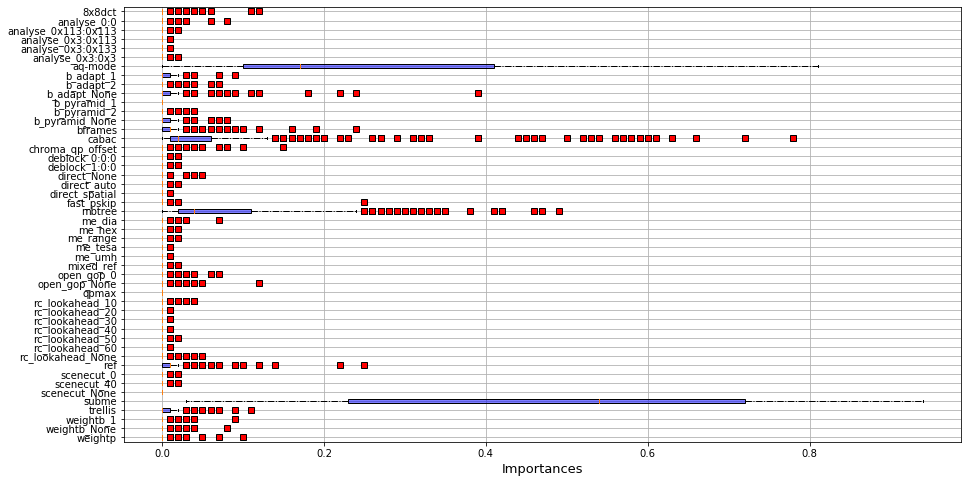

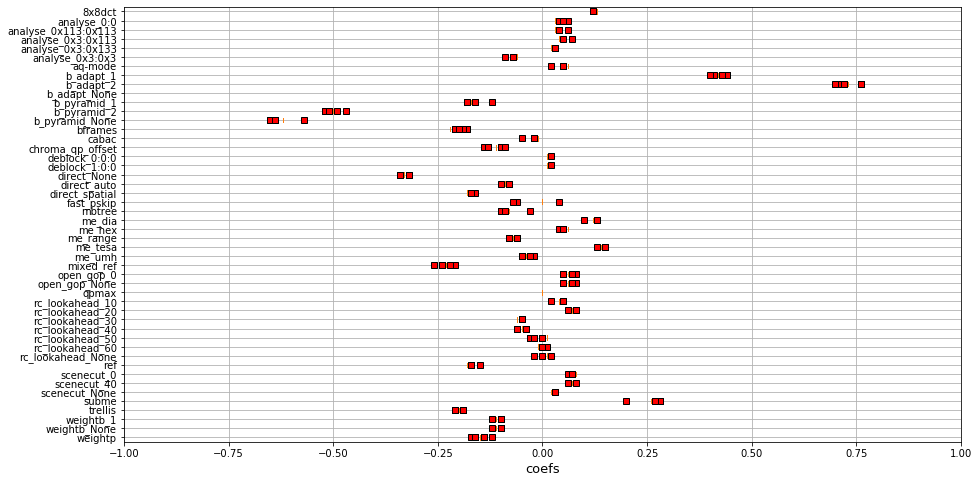


 RQ3 - Performance ratios

Mean =  5.1006201393255495
Std =  6.511823111783452

--
Group  3 
--

Properties

resolution                     735.764075
WIDTH                         1230.477212
HEIGHT                         769.882038
SPATIAL_COMPLEXITY               1.269029
TEMPORAL_COMPLEXITY              0.285737
CHUNK_COMPLEXITY_VARIATION       3.560445
COLOR_COMPLEXITY                 0.299869
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


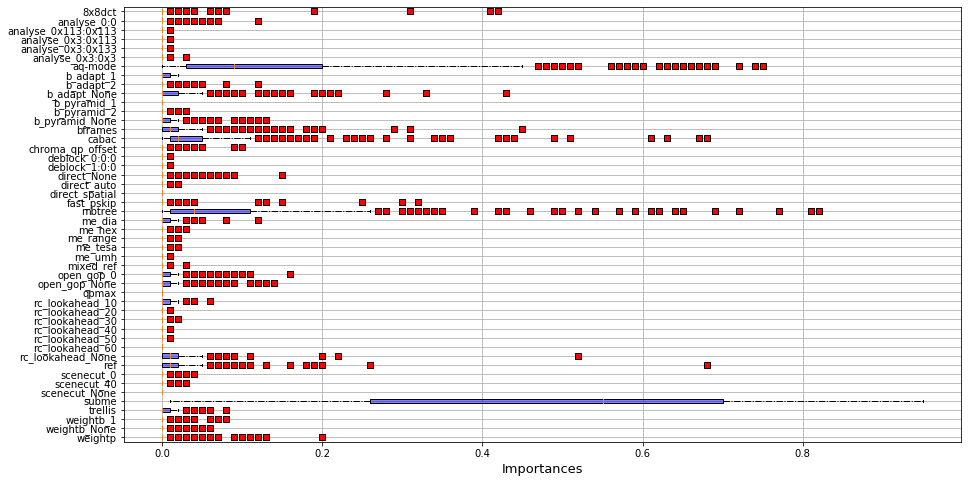

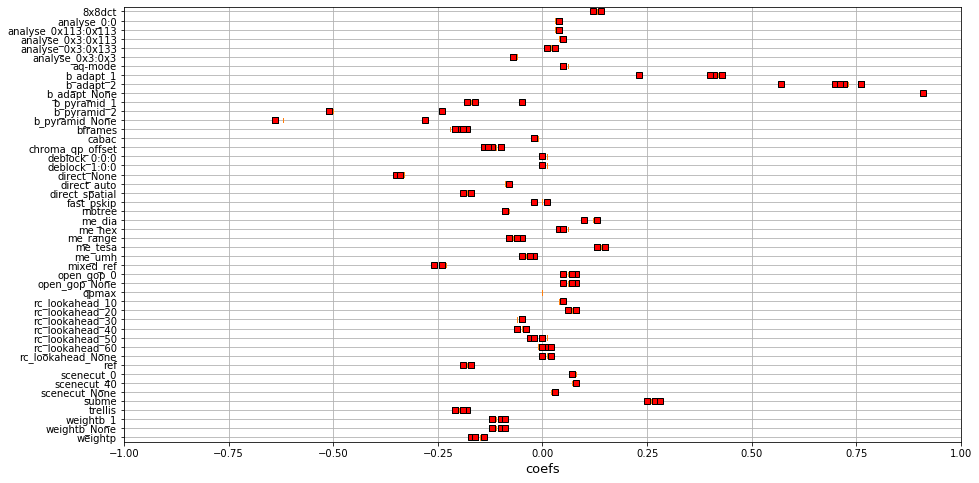


 RQ3 - Performance ratios

Mean =  8.008114585576545
Std =  10.046002926771473

--
Group  4 
--

Properties

resolution                    1124.835165
WIDTH                         1959.428571
HEIGHT                        1149.802198
SPATIAL_COMPLEXITY               0.503736
TEMPORAL_COMPLEXITY              0.601451
CHUNK_COMPLEXITY_VARIATION       2.322187
COLOR_COMPLEXITY                 0.356275
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


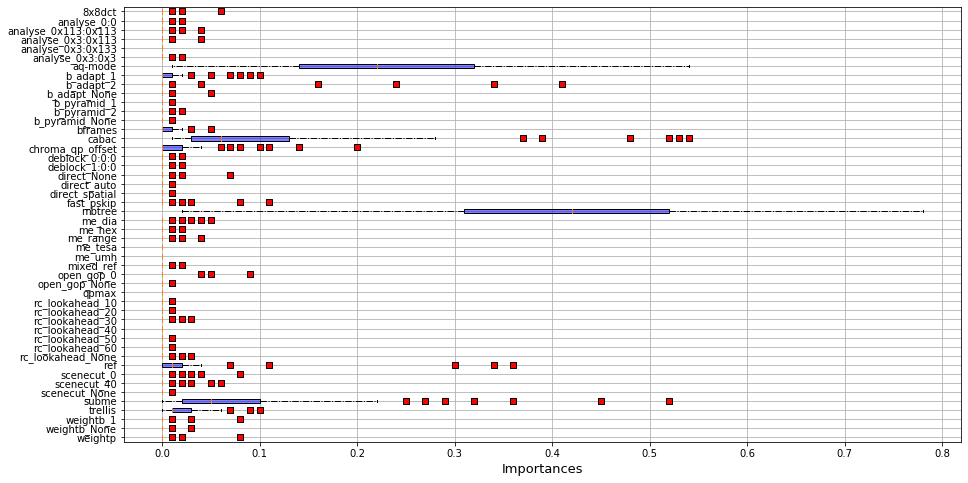

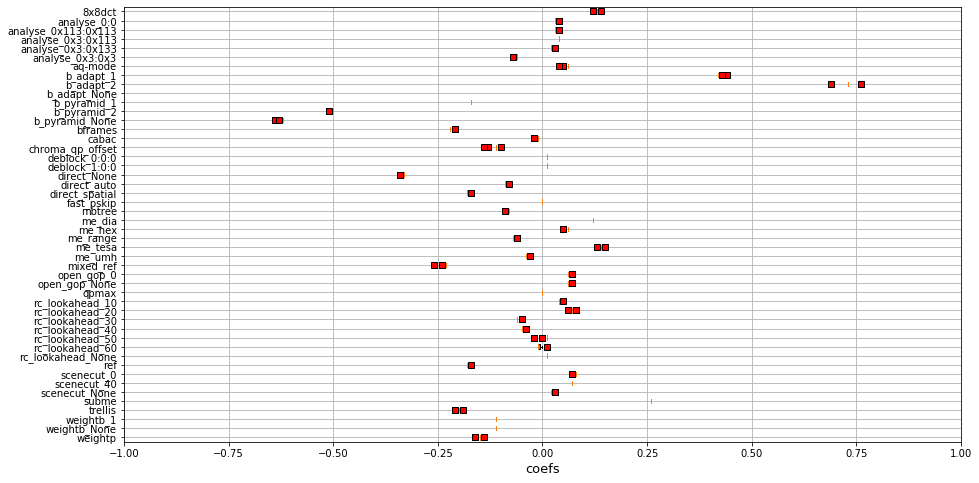


 RQ3 - Performance ratios

Mean =  5.078440180400339
Std =  6.793538399769586

---
 kbs 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


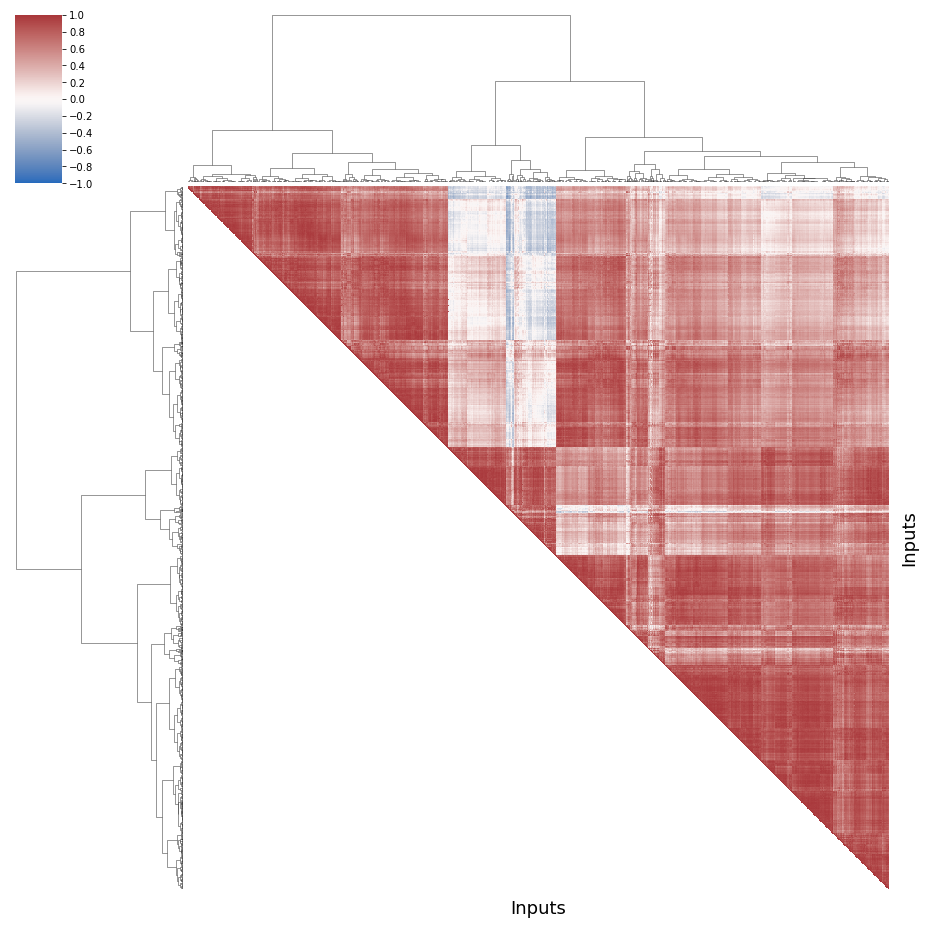


--
Group  1 
--

Properties

resolution                     780.490998
WIDTH                         1328.045827
HEIGHT                         808.592471
SPATIAL_COMPLEXITY               1.151923
TEMPORAL_COMPLEXITY              0.266764
CHUNK_COMPLEXITY_VARIATION       2.966069
COLOR_COMPLEXITY                 0.296157
dtype: float64


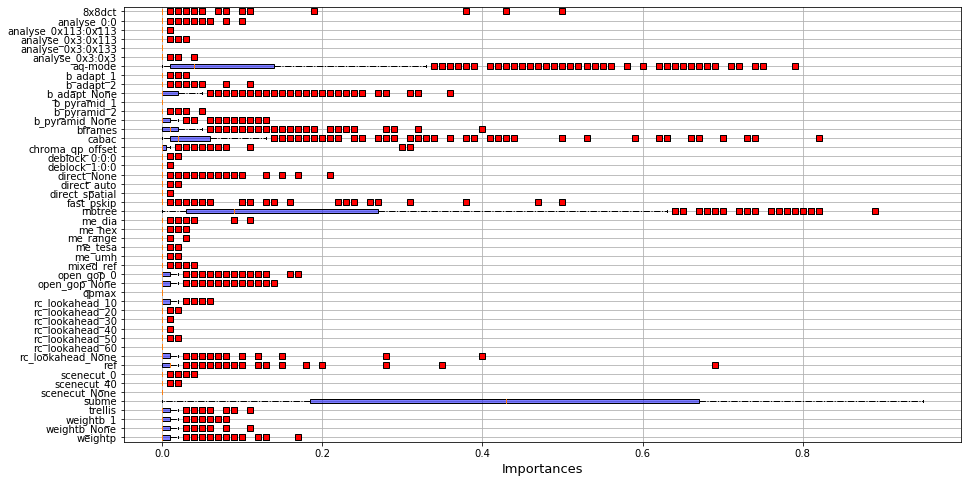

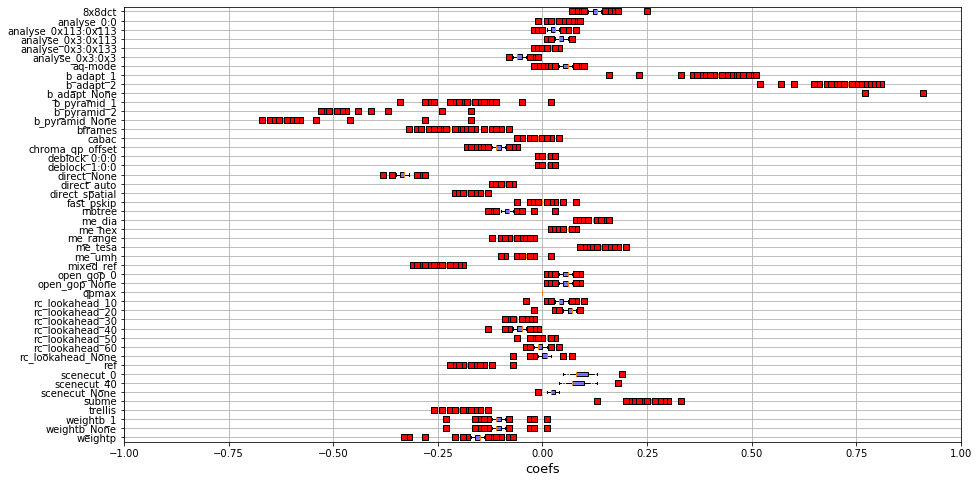


 RQ3 - Performance ratios



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


Mean =  6.970312771078188
Std =  9.419733818941756

--
Group  2 
--

Properties

resolution                     764.228571
WIDTH                         1292.862857
HEIGHT                         775.777143
SPATIAL_COMPLEXITY               1.788071
TEMPORAL_COMPLEXITY              0.381546
CHUNK_COMPLEXITY_VARIATION       6.154074
COLOR_COMPLEXITY                 0.268843
dtype: float64


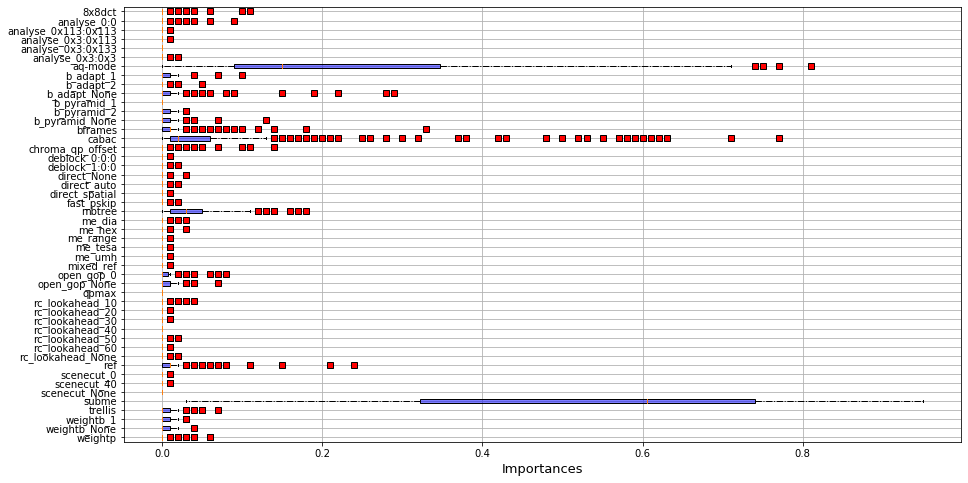

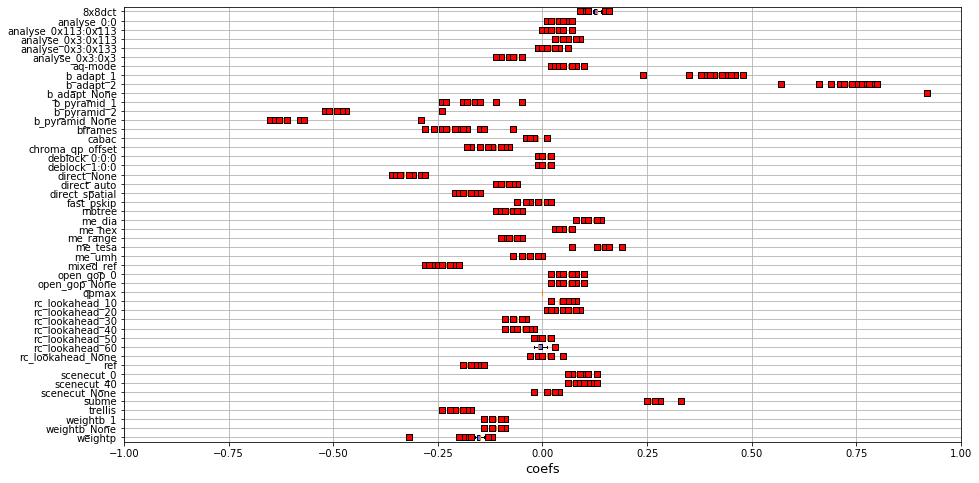


 RQ3 - Performance ratios

Mean =  4.974318257896334
Std =  5.2428131295516165

--
Group  3 
--

Properties

resolution                     917.209302
WIDTH                         1569.085271
HEIGHT                         938.418605
SPATIAL_COMPLEXITY               2.476357
TEMPORAL_COMPLEXITY              0.495891
CHUNK_COMPLEXITY_VARIATION       8.961620
COLOR_COMPLEXITY                 0.246674
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


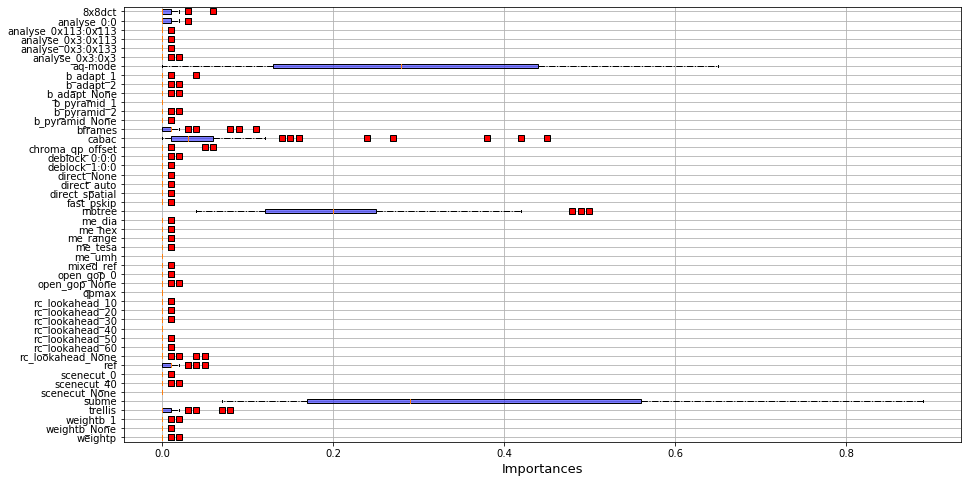

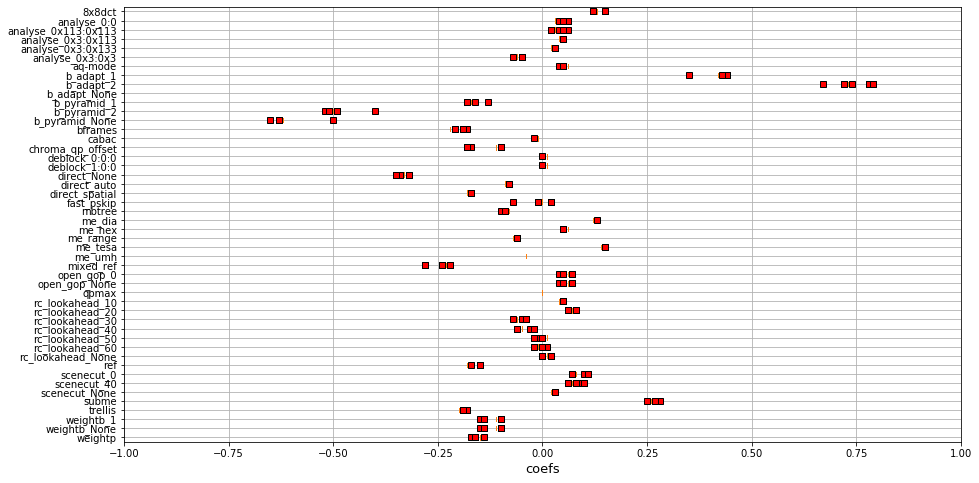


 RQ3 - Performance ratios

Mean =  3.007599218667978
Std =  3.415953050012334

--
Group  4 
--

Properties

resolution                    1131.167513
WIDTH                         1999.705584
HEIGHT                        1152.375635
SPATIAL_COMPLEXITY               0.530299
TEMPORAL_COMPLEXITY              0.482386
CHUNK_COMPLEXITY_VARIATION       2.067294
COLOR_COMPLEXITY                 0.319117
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


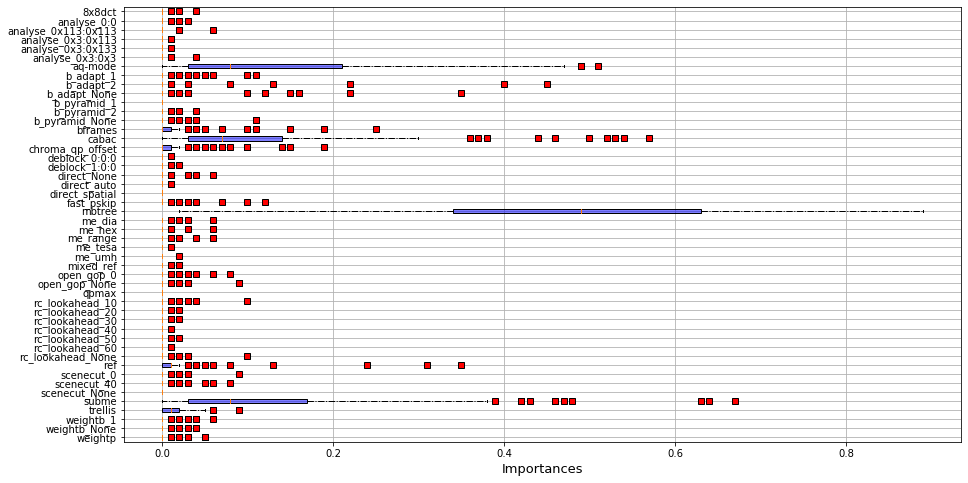

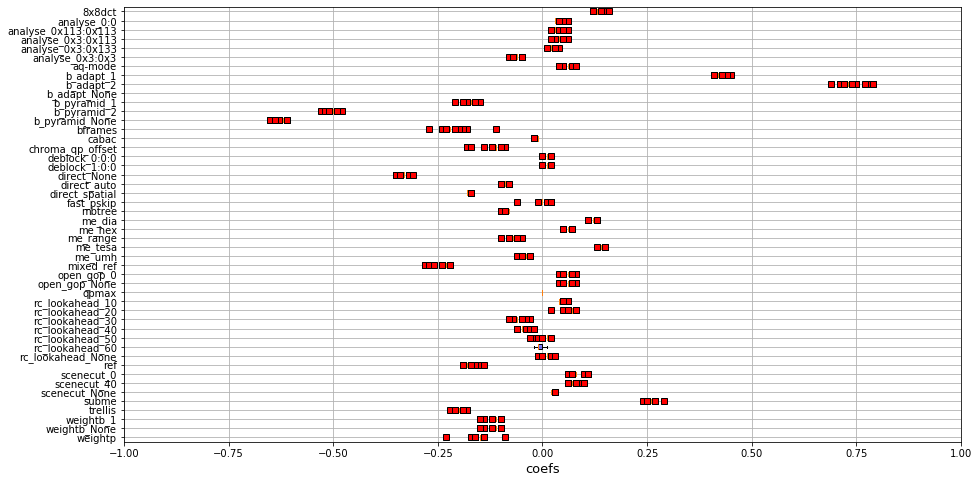


 RQ3 - Performance ratios

Mean =  5.693683321039605
Std =  6.120093615772585

---
 fps 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


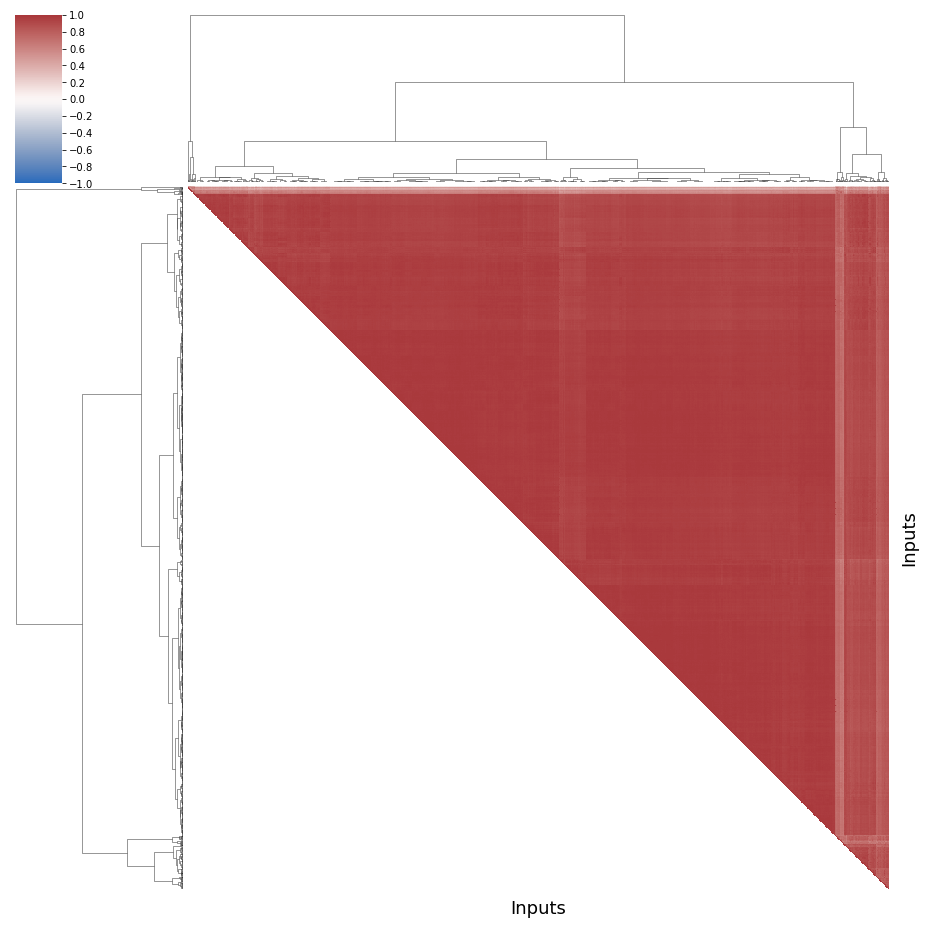


--
Group  1 
--

Properties

resolution                    1339.024390
WIDTH                         2330.512195
HEIGHT                        1395.292683
SPATIAL_COMPLEXITY               0.714451
TEMPORAL_COMPLEXITY              0.311329
CHUNK_COMPLEXITY_VARIATION       1.696780
COLOR_COMPLEXITY                 0.317561
dtype: float64


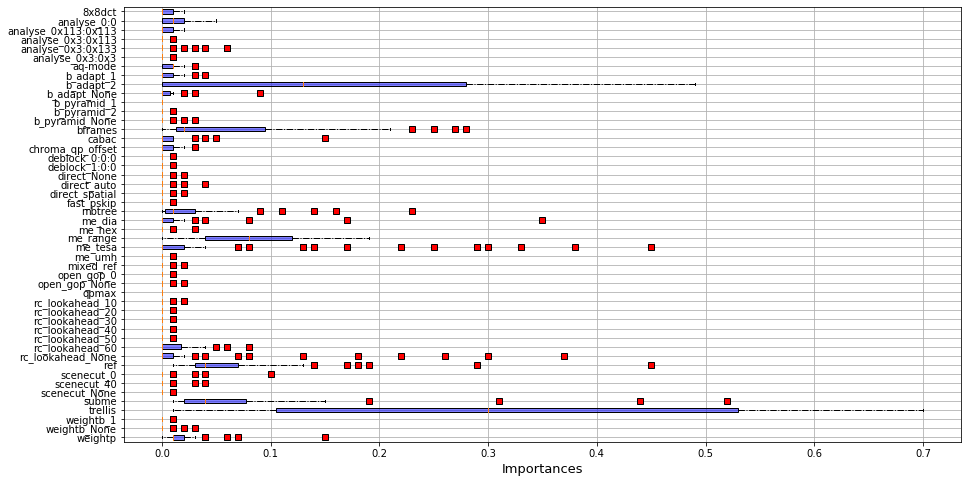

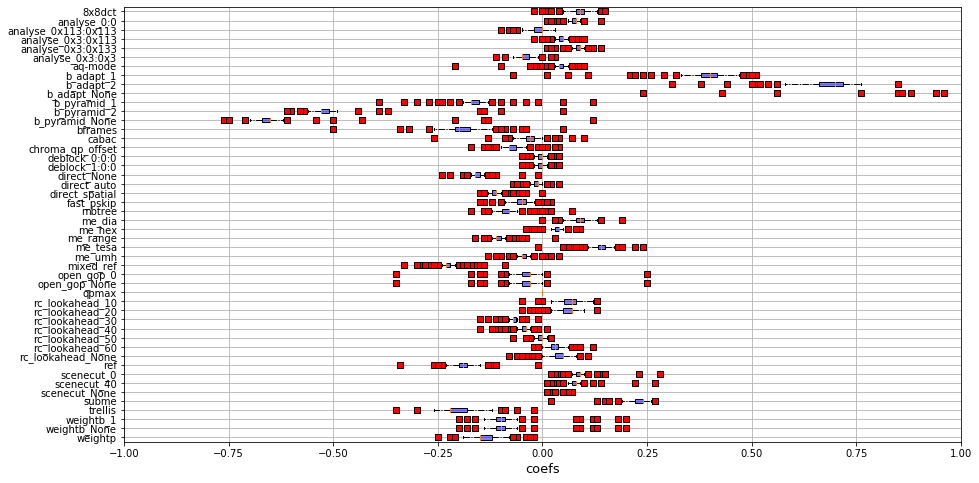


 RQ3 - Performance ratios

Mean =  8.738844405180364
Std =  10.873159266953895

--
Group  2 
--

Properties

resolution                     781.022147
WIDTH                         1332.652470
HEIGHT                         800.538330
SPATIAL_COMPLEXITY               1.425432
TEMPORAL_COMPLEXITY              0.358086
CHUNK_COMPLEXITY_VARIATION       4.534147
COLOR_COMPLEXITY                 0.283657
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


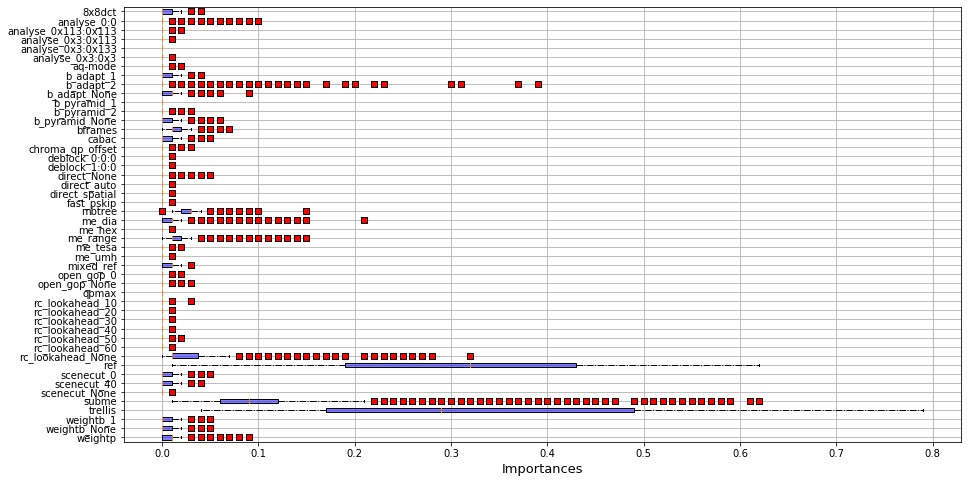

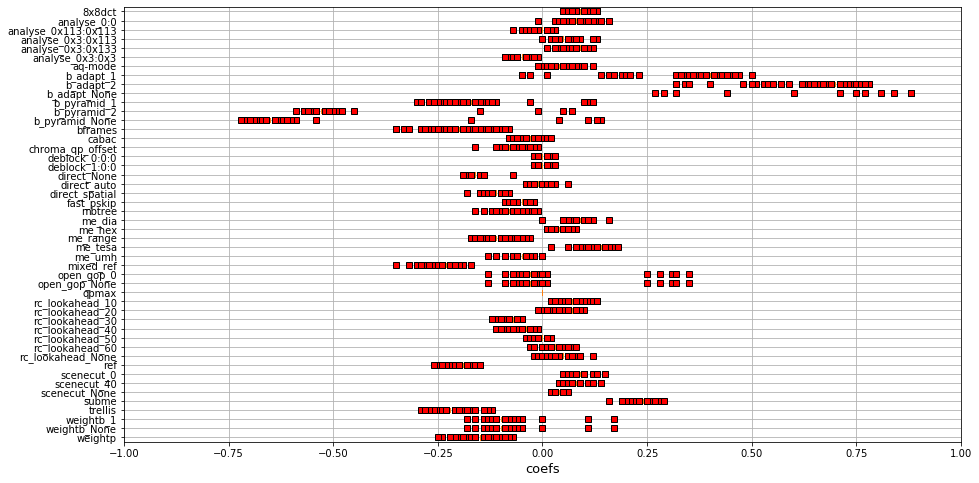


 RQ3 - Performance ratios

Mean =  4.60290414625331
Std =  8.084612448751841

--
Group  3 
--

Properties

resolution                    1650.000000
WIDTH                         2941.000000
HEIGHT                        1687.500000
SPATIAL_COMPLEXITY               0.625312
TEMPORAL_COMPLEXITY              0.288562
CHUNK_COMPLEXITY_VARIATION       2.206437
COLOR_COMPLEXITY                 0.465187
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


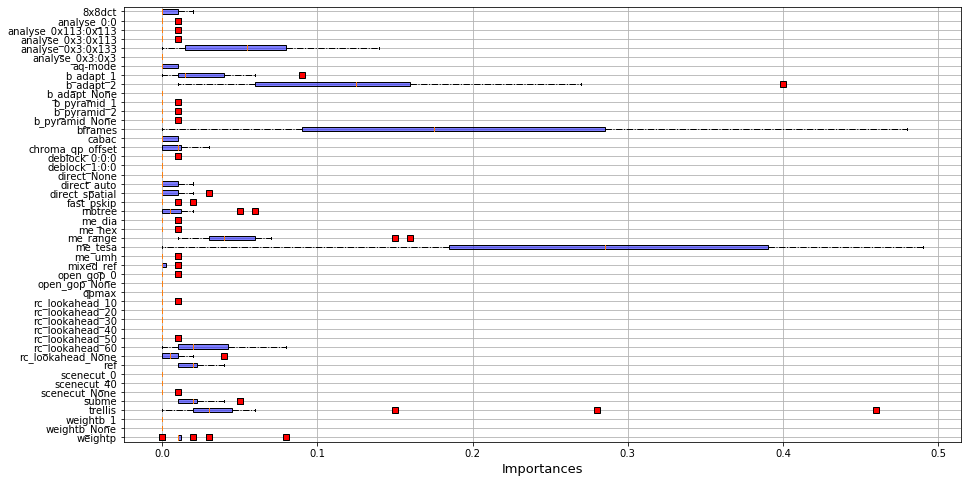

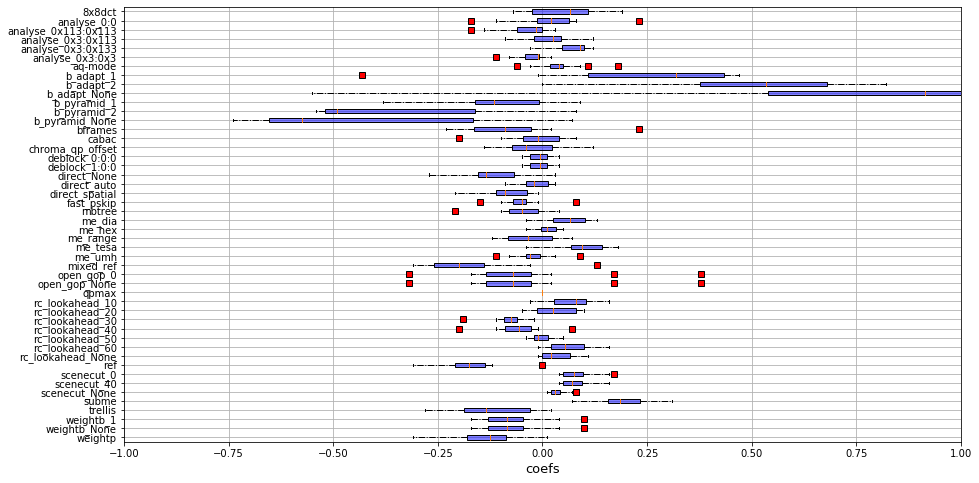


 RQ3 - Performance ratios

Mean =  24.293107504792246
Std =  14.77054850661407

--
Group  4 
--

Properties

resolution                    2160.000000
WIDTH                         3840.000000
HEIGHT                        2160.000000
SPATIAL_COMPLEXITY               0.768133
TEMPORAL_COMPLEXITY              0.333000
CHUNK_COMPLEXITY_VARIATION       2.131467
COLOR_COMPLEXITY                 0.215867
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


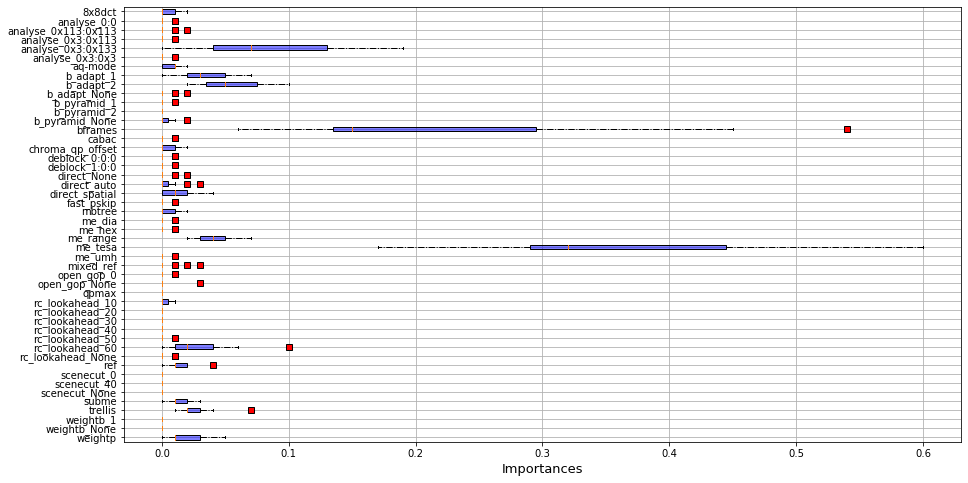

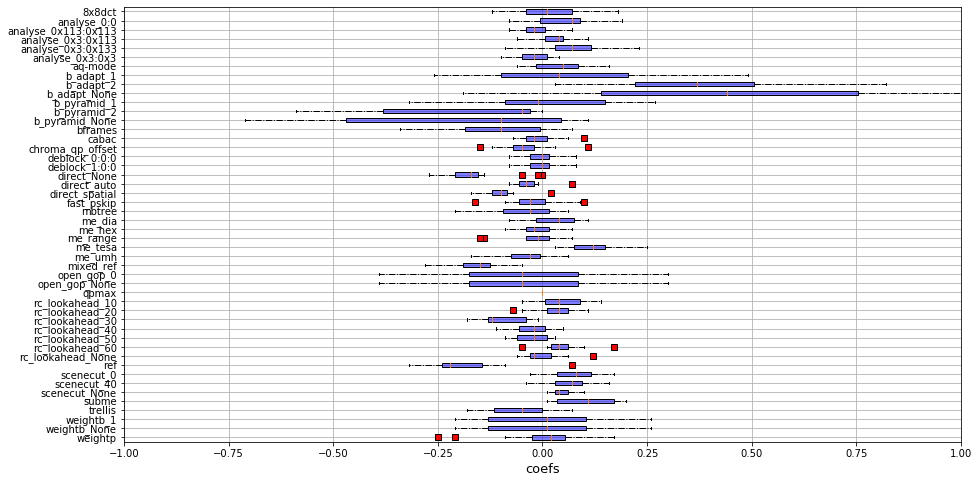


 RQ3 - Performance ratios

Mean =  34.47282400005441
Std =  4.741500403931107

---
 etime 
---

RQ1 - correlations and groups 



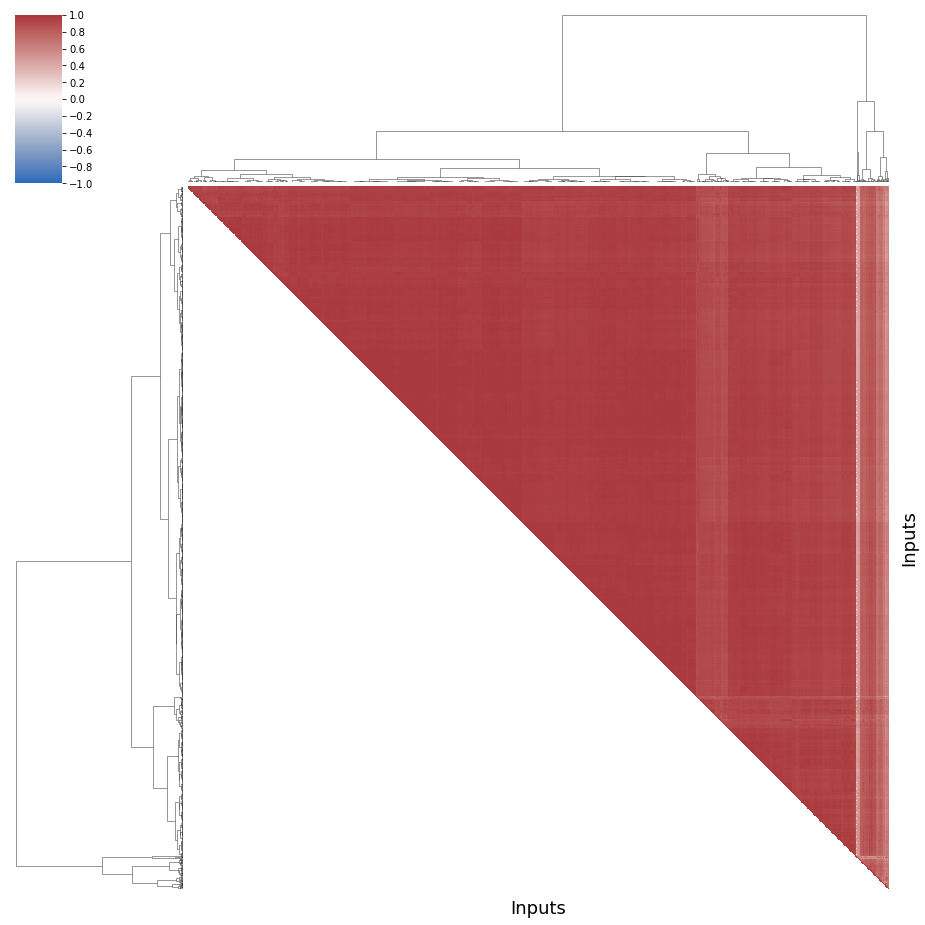


--
Group  1 
--

Properties

resolution                    1530.566038
WIDTH                         2747.471698
HEIGHT                        1541.886792
SPATIAL_COMPLEXITY               0.684962
TEMPORAL_COMPLEXITY              0.349491
CHUNK_COMPLEXITY_VARIATION       2.210528
COLOR_COMPLEXITY                 0.395736
dtype: float64


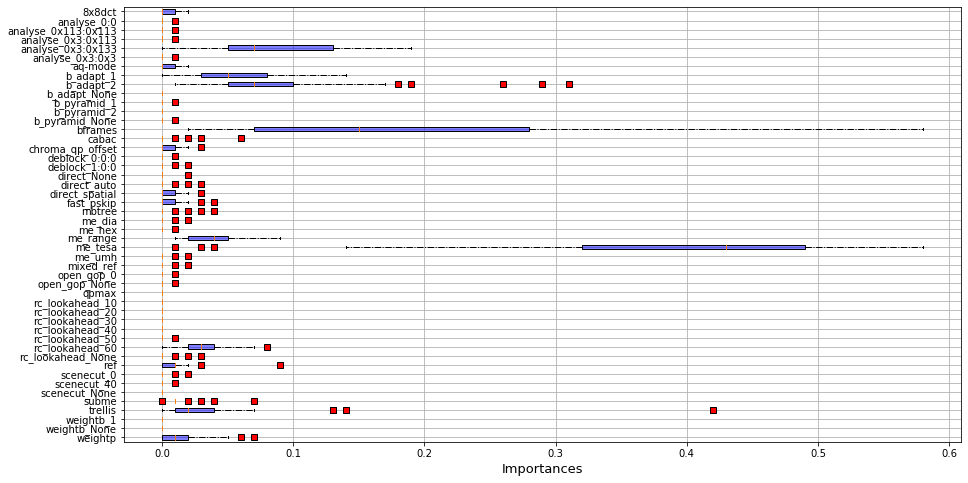

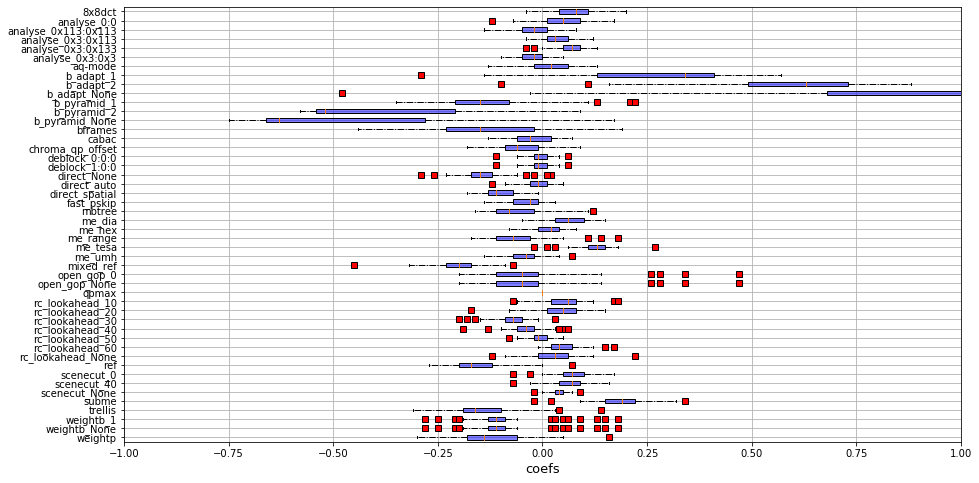


 RQ3 - Performance ratios

Mean =  2.81921112712583
Std =  2.6693154056280806

--
Group  2 
--

Properties

resolution                     647.537473
WIDTH                         1084.580300
HEIGHT                         662.289079
SPATIAL_COMPLEXITY               1.601156
TEMPORAL_COMPLEXITY              0.327328
CHUNK_COMPLEXITY_VARIATION       4.811913
COLOR_COMPLEXITY                 0.297336
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


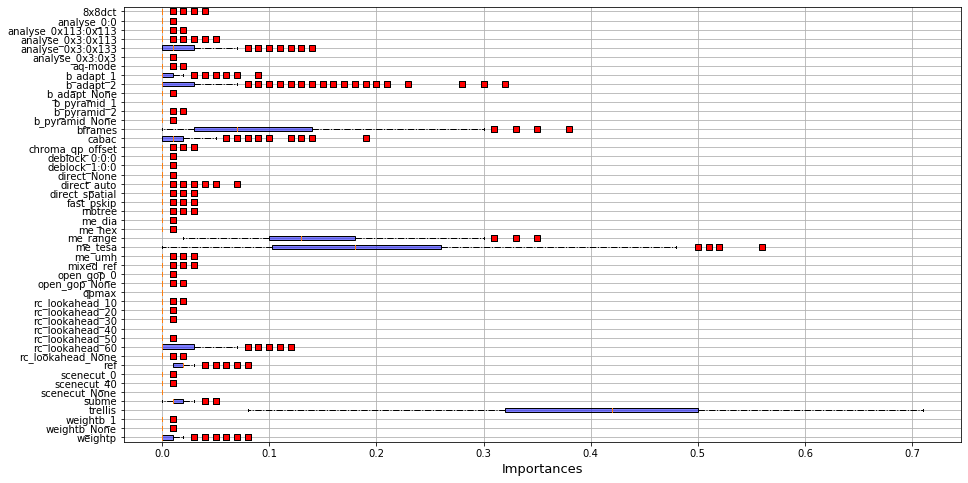

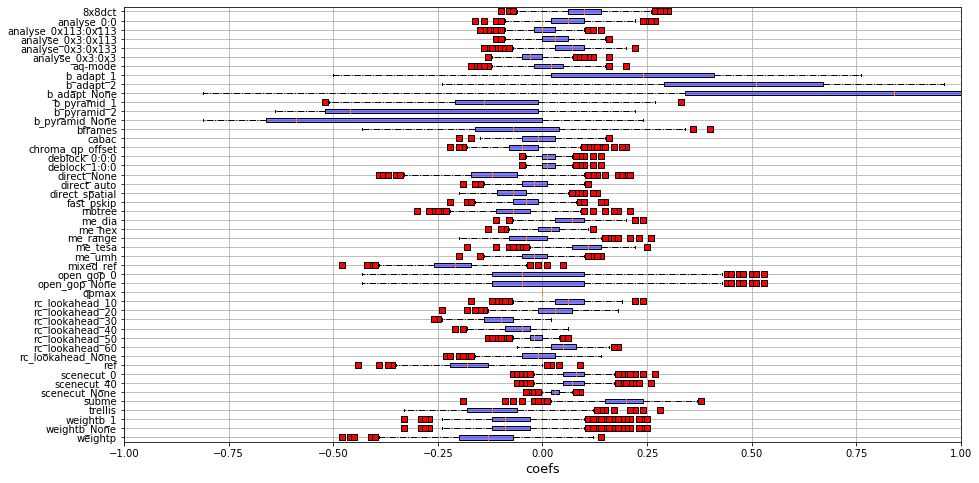


 RQ3 - Performance ratios

Mean =  4.9679923143836024
Std =  6.707084743495012

--
Group  3 
--

Properties

resolution                    1312.218430
WIDTH                         2303.064846
HEIGHT                        1359.139932
SPATIAL_COMPLEXITY               0.745242
TEMPORAL_COMPLEXITY              0.442427
CHUNK_COMPLEXITY_VARIATION       3.096990
COLOR_COMPLEXITY                 0.238973
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


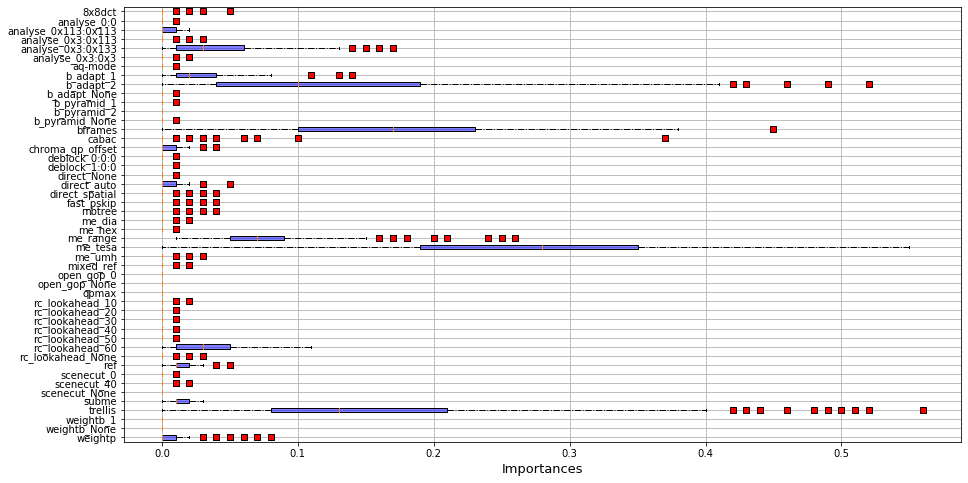

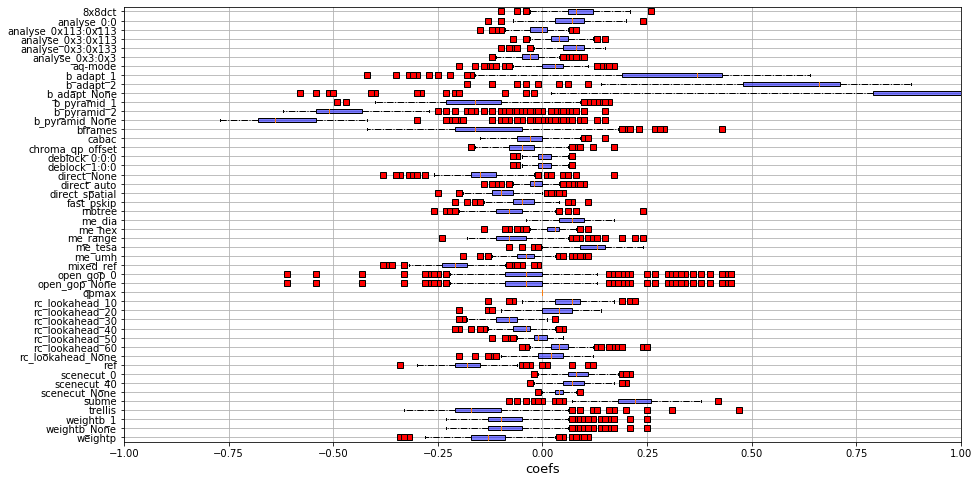


 RQ3 - Performance ratios



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


Mean =  4.024167043543337
Std =  4.8691893334809215

--
Group  4 
--

Properties

resolution                    2160.000000
WIDTH                         3840.000000
HEIGHT                        2160.000000
SPATIAL_COMPLEXITY               0.490000
TEMPORAL_COMPLEXITY              0.236571
CHUNK_COMPLEXITY_VARIATION       1.513857
COLOR_COMPLEXITY                 0.147000
dtype: float64


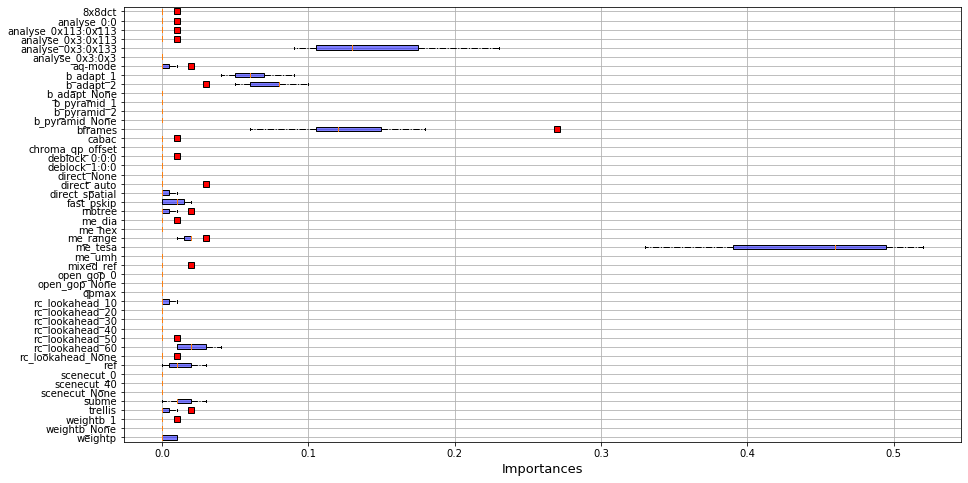

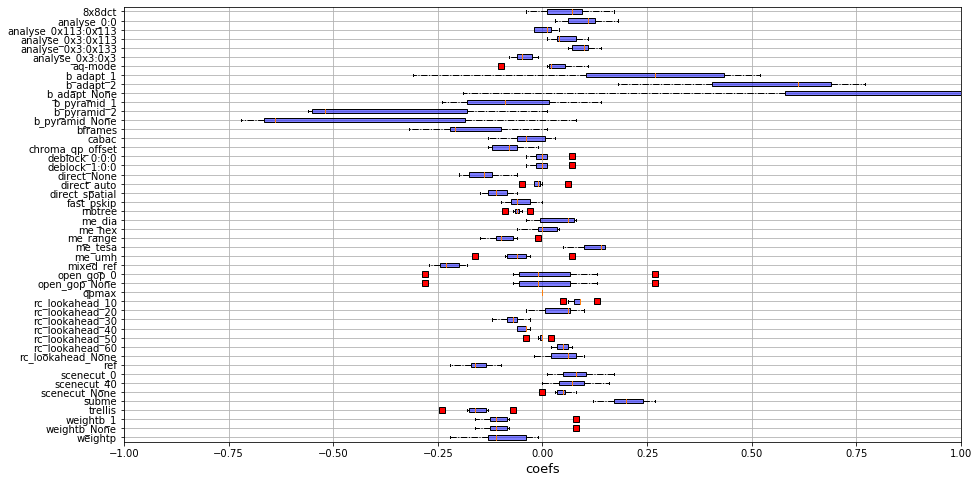


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 cpu 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


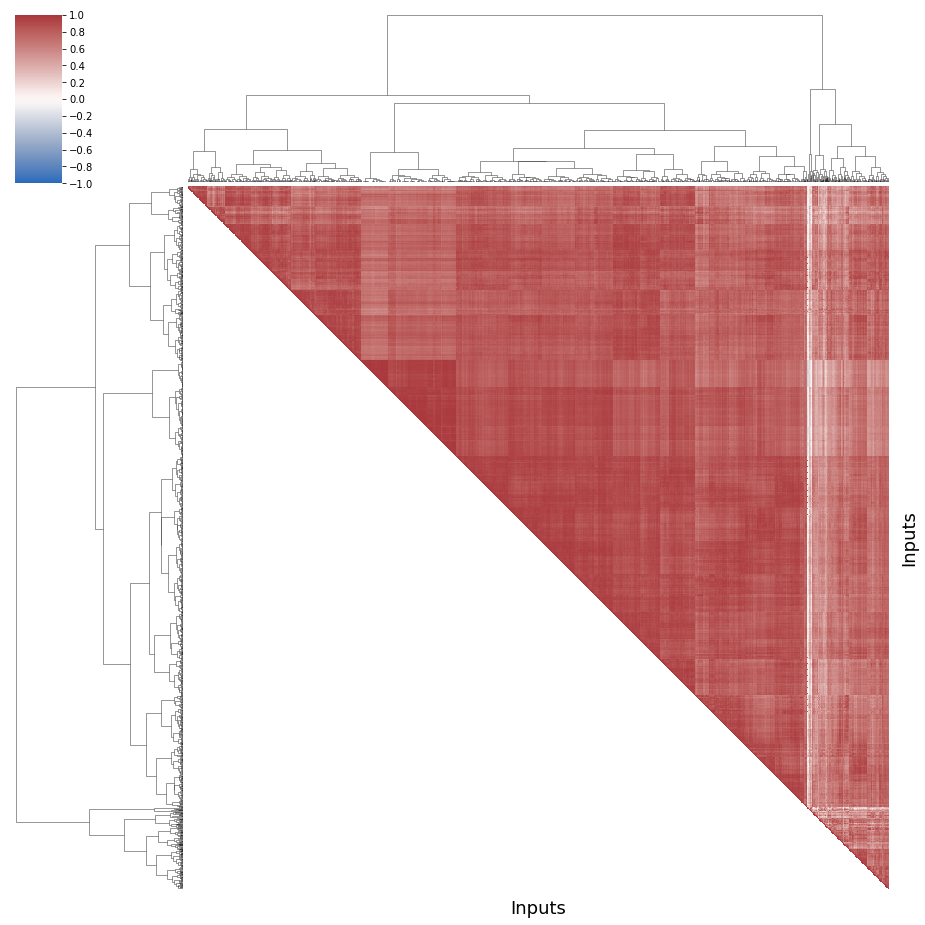


--
Group  1 
--

Properties

resolution                    537.872340
WIDTH                         874.184397
HEIGHT                        549.730496
SPATIAL_COMPLEXITY              1.318213
TEMPORAL_COMPLEXITY             0.258397
CHUNK_COMPLEXITY_VARIATION      2.514816
COLOR_COMPLEXITY                0.271149
dtype: float64


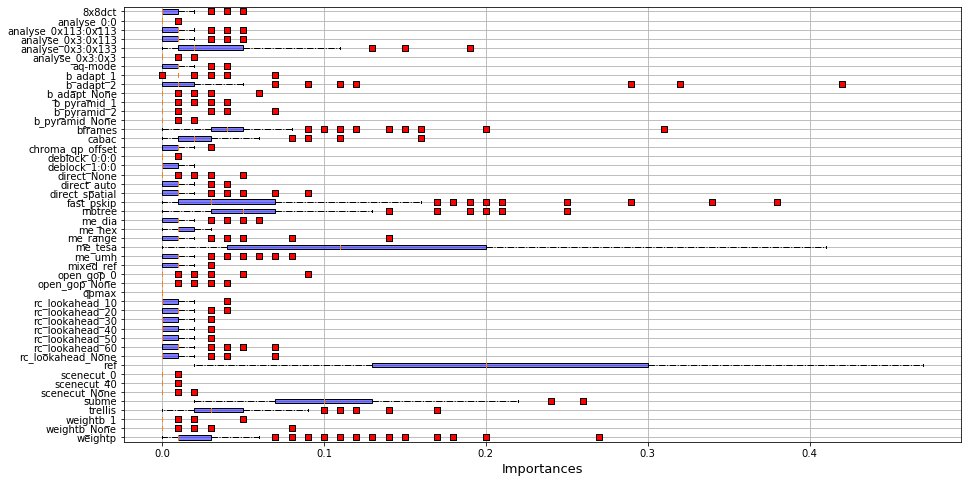

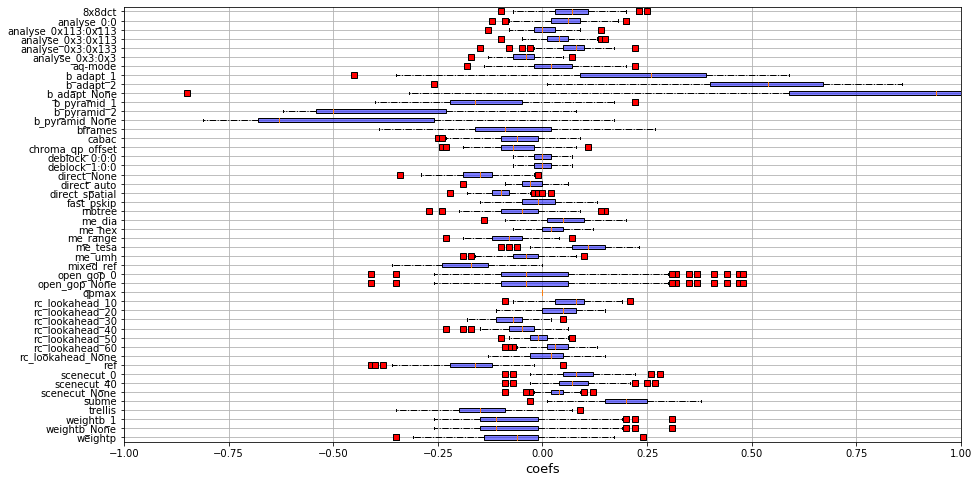


 RQ3 - Performance ratios

Mean =  2.2969981590872264
Std =  1.1510571759854331

--
Group  2 
--

Properties

resolution                    1043.516484
WIDTH                         1815.269841
HEIGHT                        1072.984127
SPATIAL_COMPLEXITY               1.250643
TEMPORAL_COMPLEXITY              0.360347
CHUNK_COMPLEXITY_VARIATION       4.319348
COLOR_COMPLEXITY                 0.281576
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


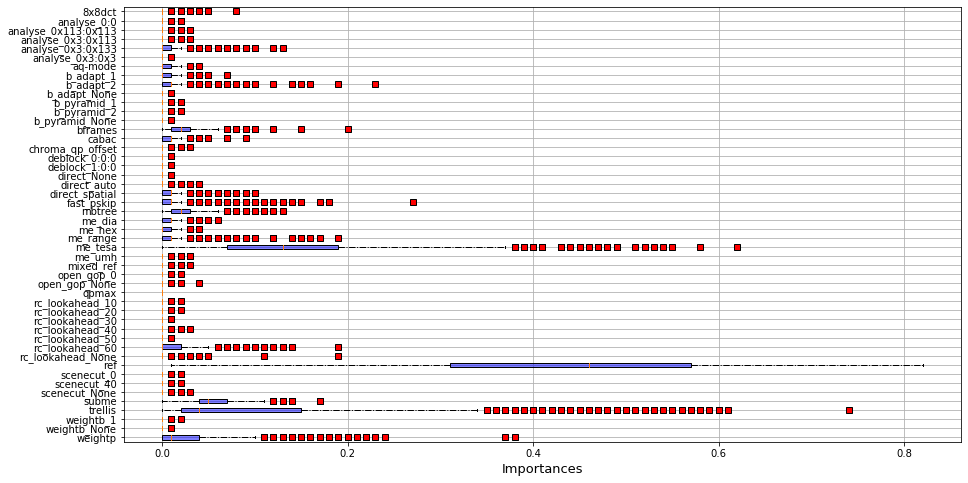

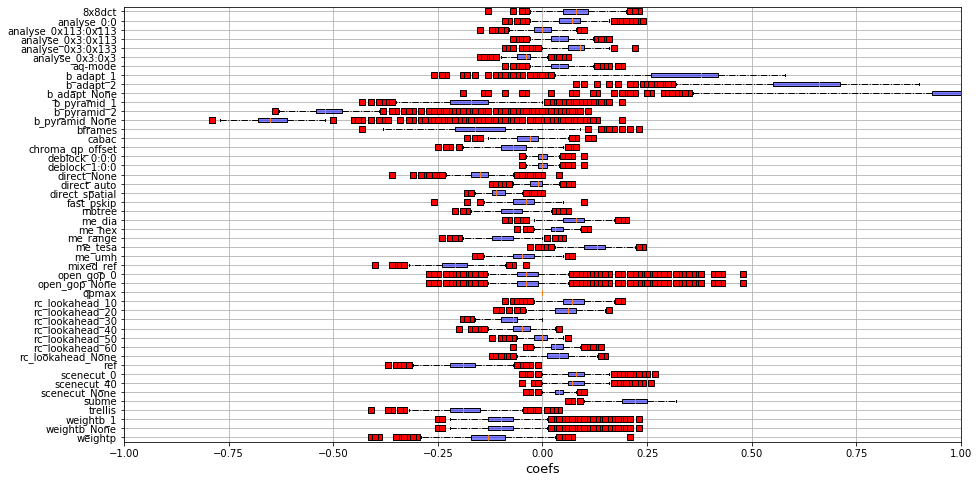


 RQ3 - Performance ratios

Mean =  1.4969262557965308
Std =  0.6519994940376785

--
Group  3 
--

Properties

resolution                    467.586207
WIDTH                         756.131661
HEIGHT                        474.858934
SPATIAL_COMPLEXITY              1.679815
TEMPORAL_COMPLEXITY             0.381799
CHUNK_COMPLEXITY_VARIATION      5.120571
COLOR_COMPLEXITY                0.313144
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


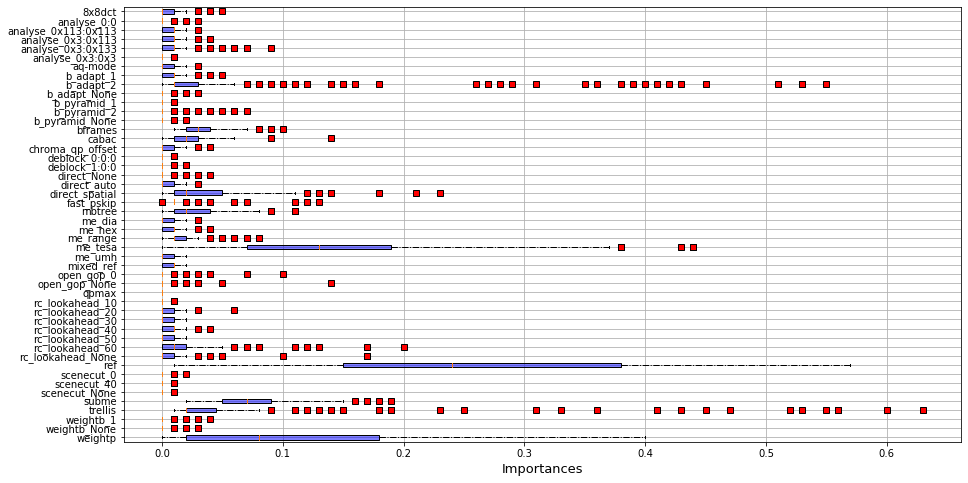

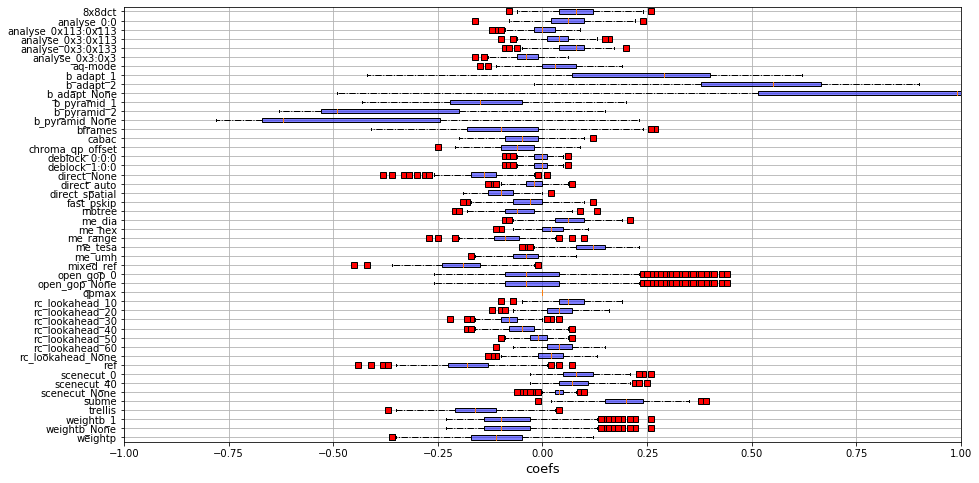


 RQ3 - Performance ratios

Mean =  2.1412720702292503
Std =  1.1105640650856528

--
Group  4 
--

Properties

resolution                     735.000000
WIDTH                         1140.000000
HEIGHT                         735.000000
SPATIAL_COMPLEXITY               0.945375
TEMPORAL_COMPLEXITY              0.272750
CHUNK_COMPLEXITY_VARIATION       0.487875
COLOR_COMPLEXITY                 0.124750
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


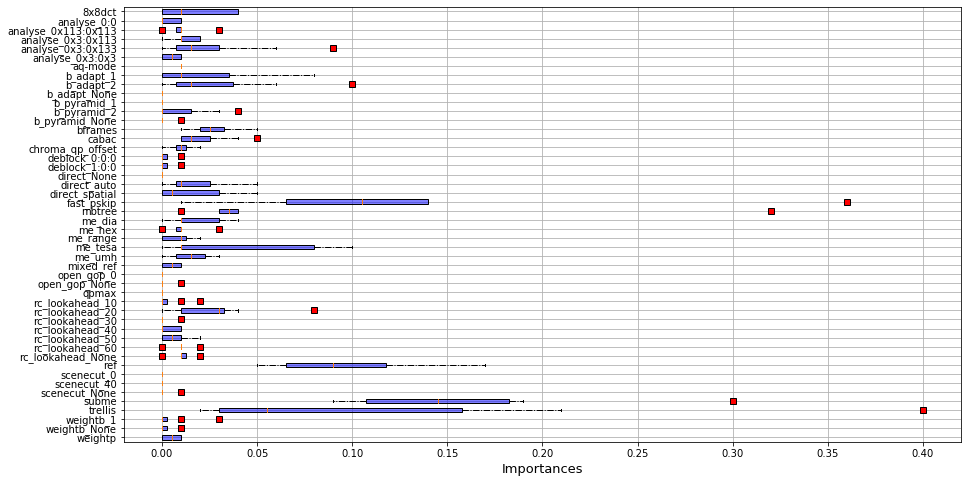

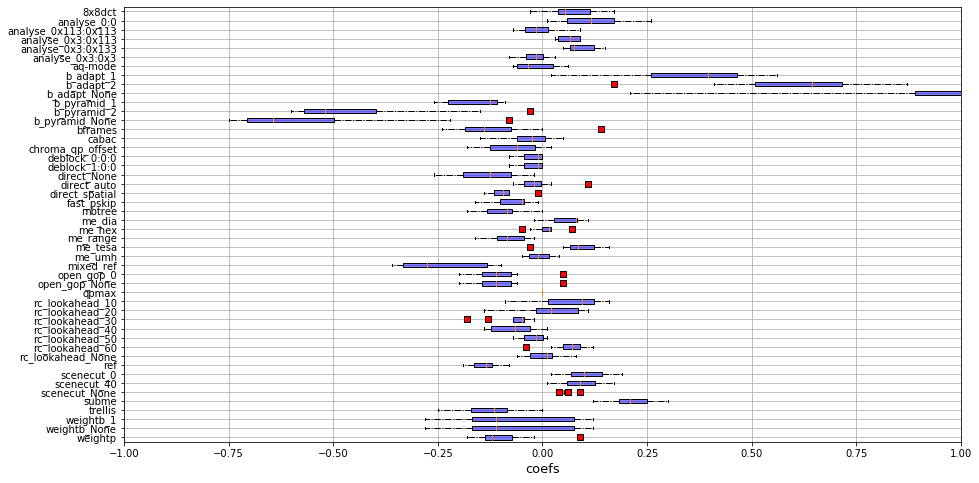


 RQ3 - Performance ratios

Mean =  3.4616558883674977
Std =  1.3585522262976684

-----
 gcc 
-----


---
 size 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


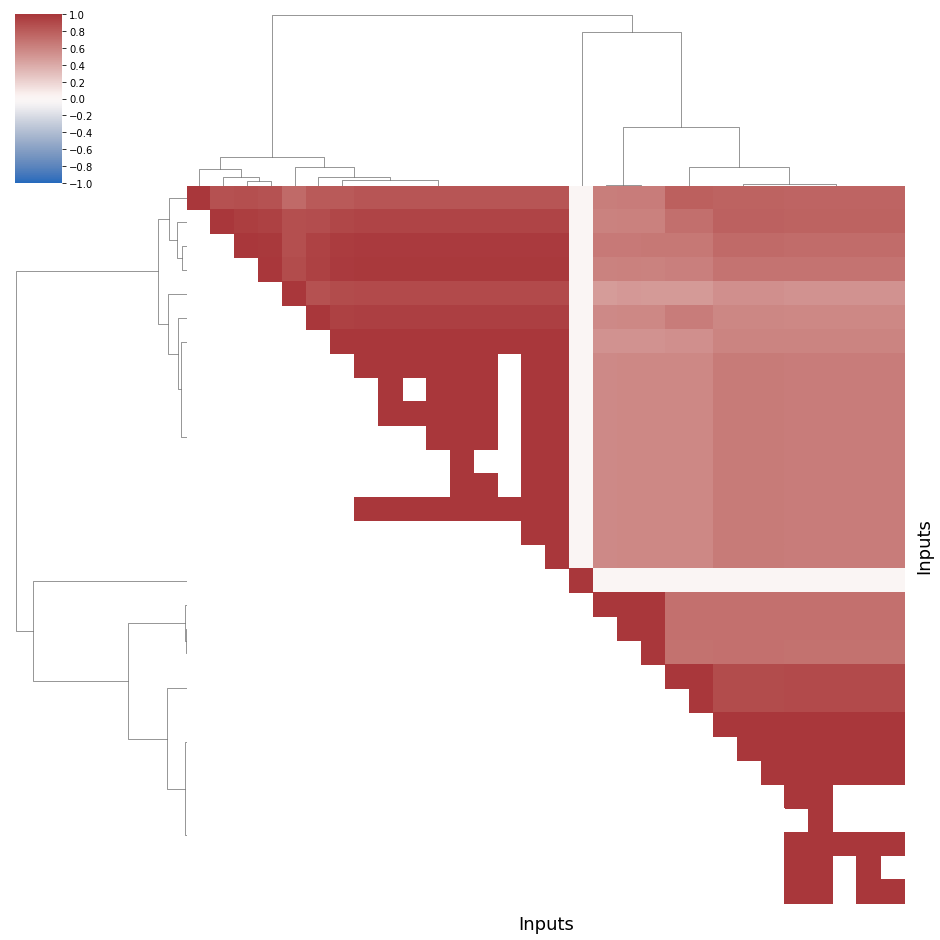


--
Group  1 
--

Properties

csize             3512.0625
#LOCs              146.0625
number_literal      35.7500
for_statement       11.0000
if_statement         1.0000
dtype: float64


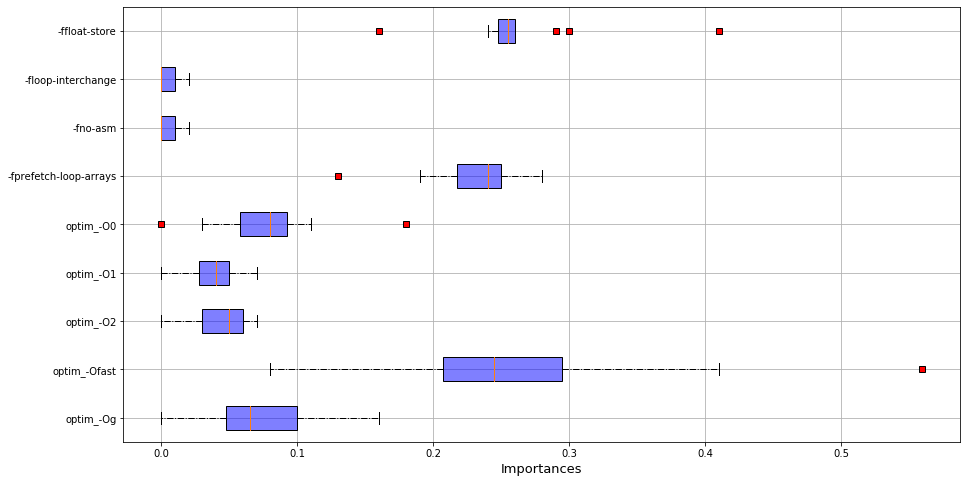

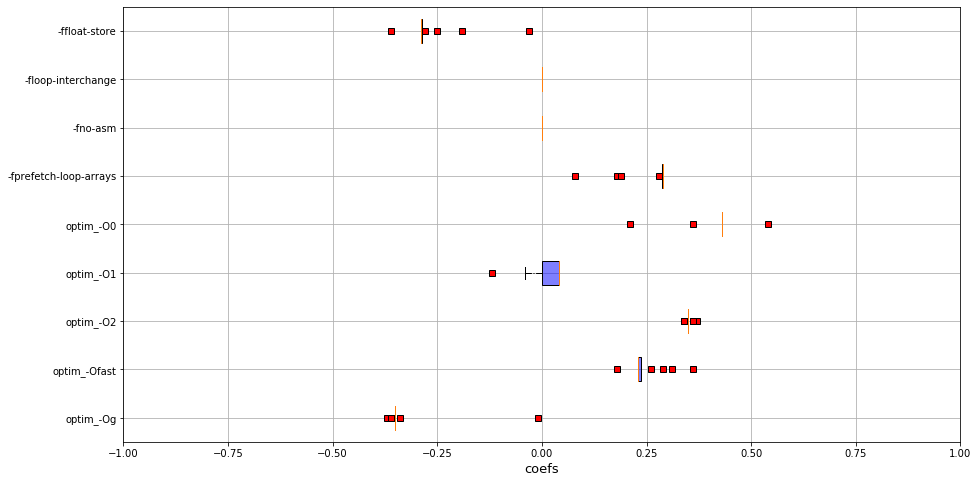


 RQ3 - Performance ratios

Mean =  1.2162422646996185
Std =  0.18447390694616028

--
Group  2 
--

Properties

csize             2923.4
#LOCs              127.1
number_literal      19.7
for_statement        8.0
if_statement         1.0
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


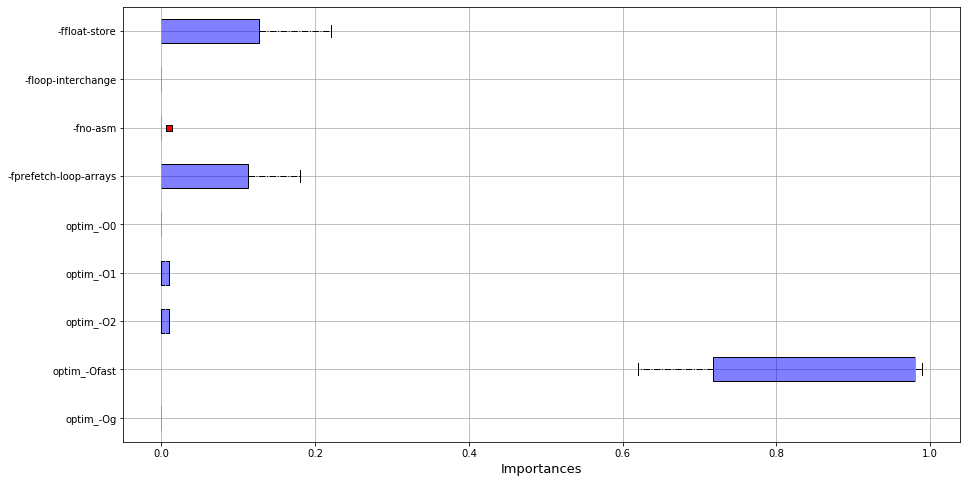

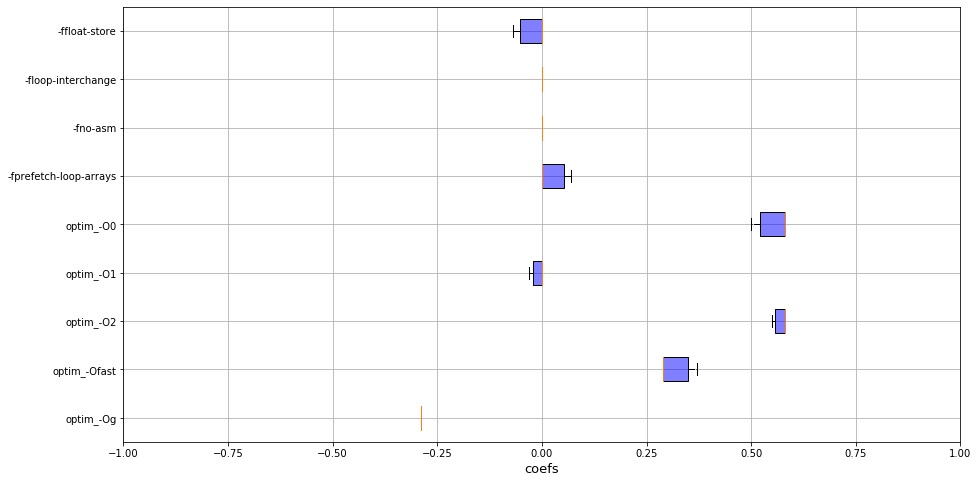


 RQ3 - Performance ratios

Mean =  1.226716657364015
Std =  0.13836065602925324

--
Group  3 
--

Properties

csize             3298.666667
#LOCs              144.666667
number_literal      22.666667
for_statement       12.333333
if_statement         1.666667
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


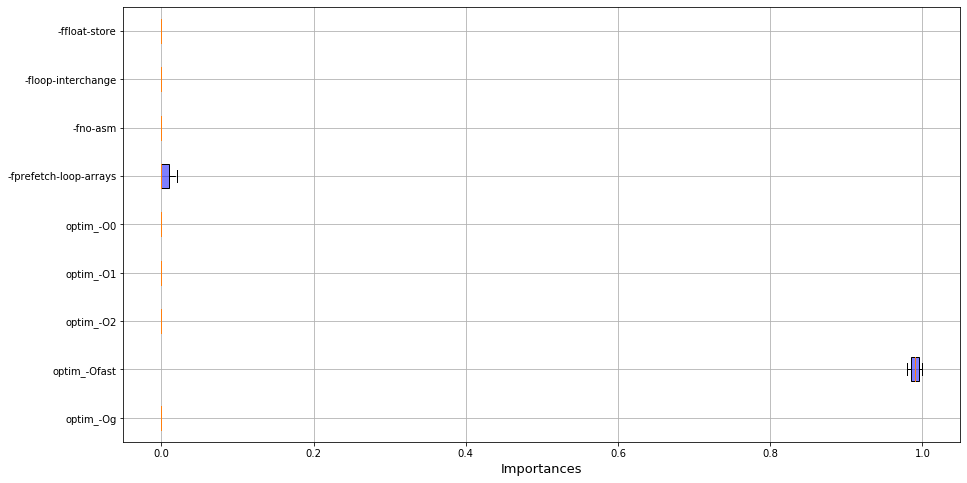

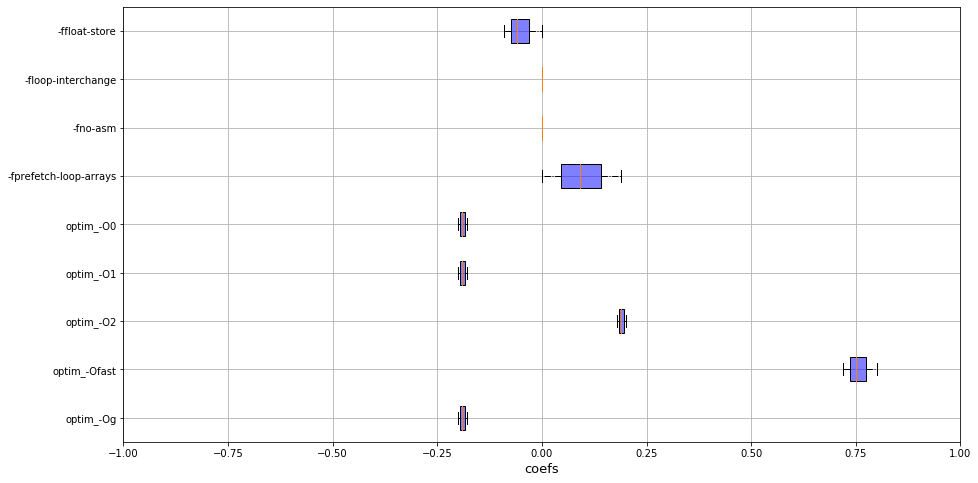


 RQ3 - Performance ratios

Mean =  1.2249035539343427
Std =  0.05712884757777692

--
Group  4 
--

Properties

csize             2943.0
#LOCs              125.0
number_literal      17.0
for_statement       13.0
if_statement         1.0
dtype: float64


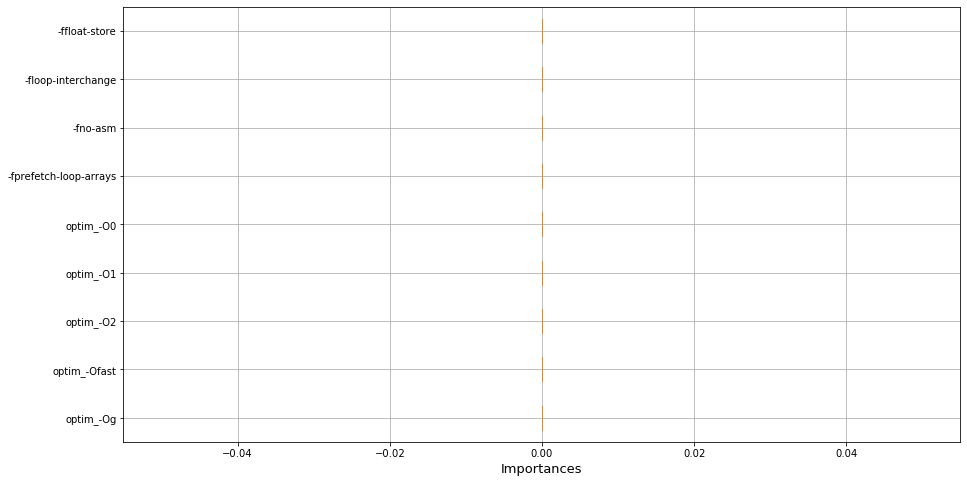

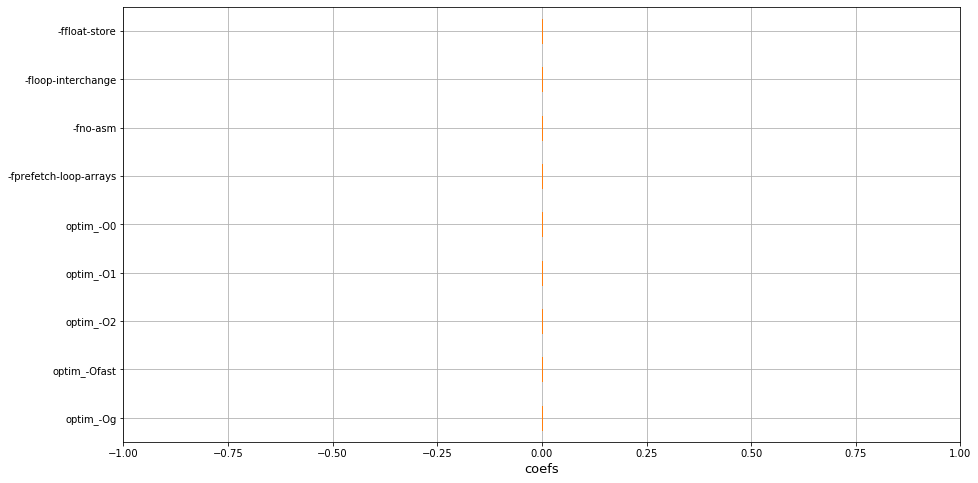


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 ctime 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


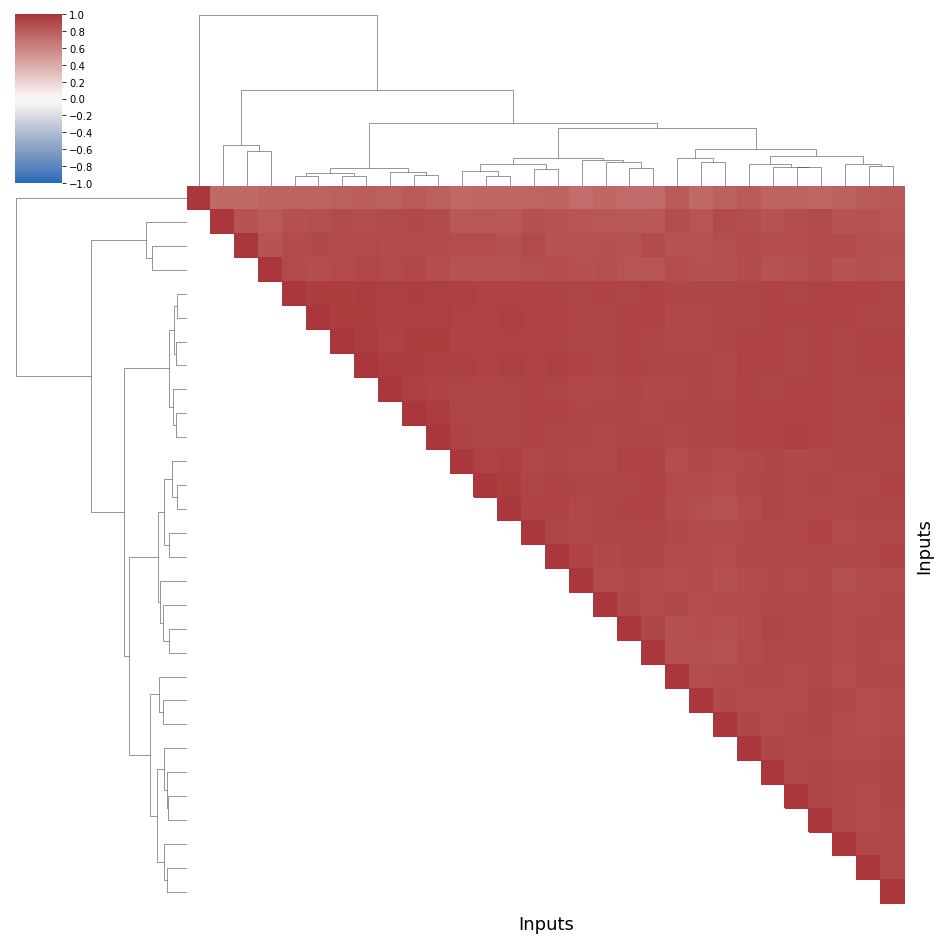


--
Group  1 
--

Properties

csize             2970.842105
#LOCs              130.052632
number_literal      18.842105
for_statement        9.368421
if_statement         1.000000
dtype: float64


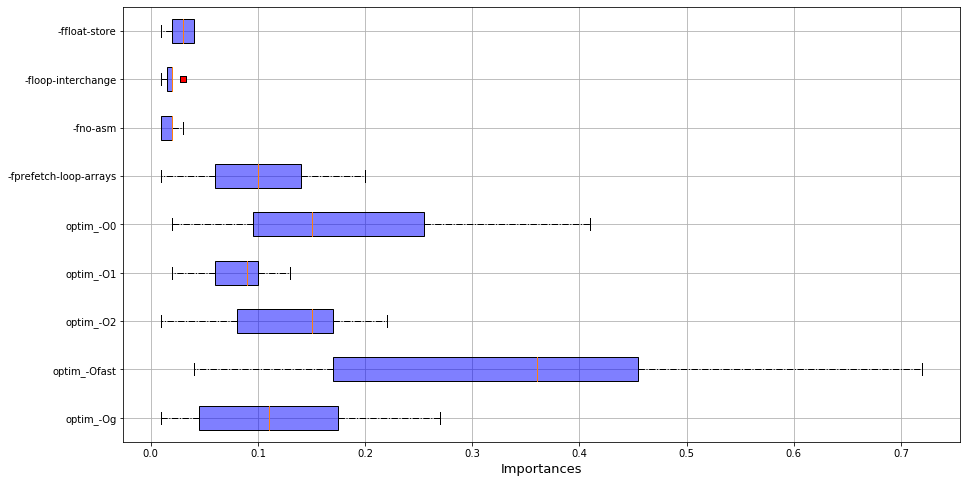

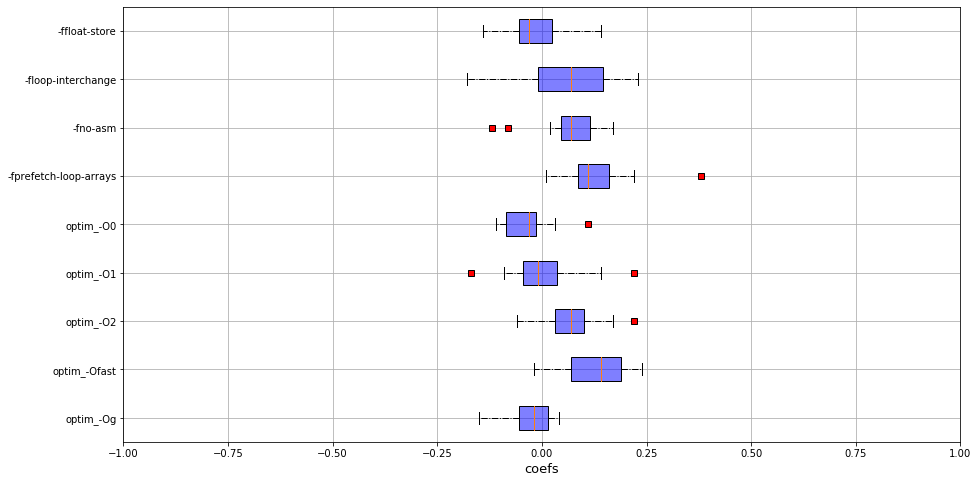


 RQ3 - Performance ratios

Mean =  1.4065690880424666
Std =  0.39347286793526204

--
Group  2 
--

Properties

csize             4361.714286
#LOCs              171.714286
number_literal      61.285714
for_statement       13.142857
if_statement         1.285714
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


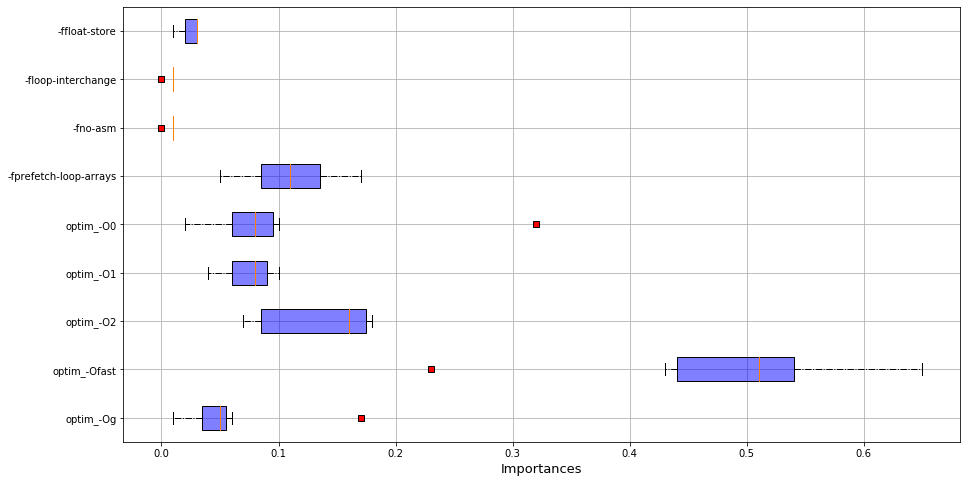

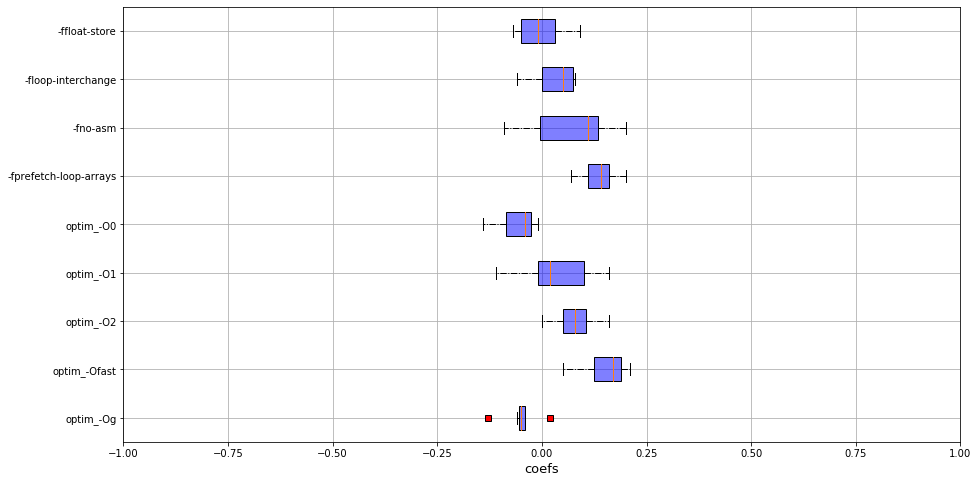


 RQ3 - Performance ratios

Mean =  1.2556671864814235
Std =  0.06487579994391612

--
Group  3 
--

Properties

csize             2781.666667
#LOCs              123.000000
number_literal      16.666667
for_statement        7.666667
if_statement         1.000000
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


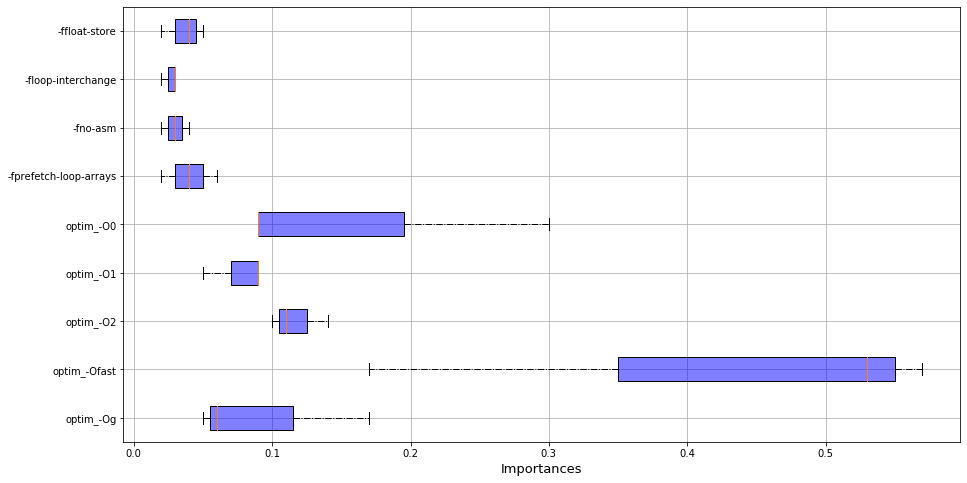

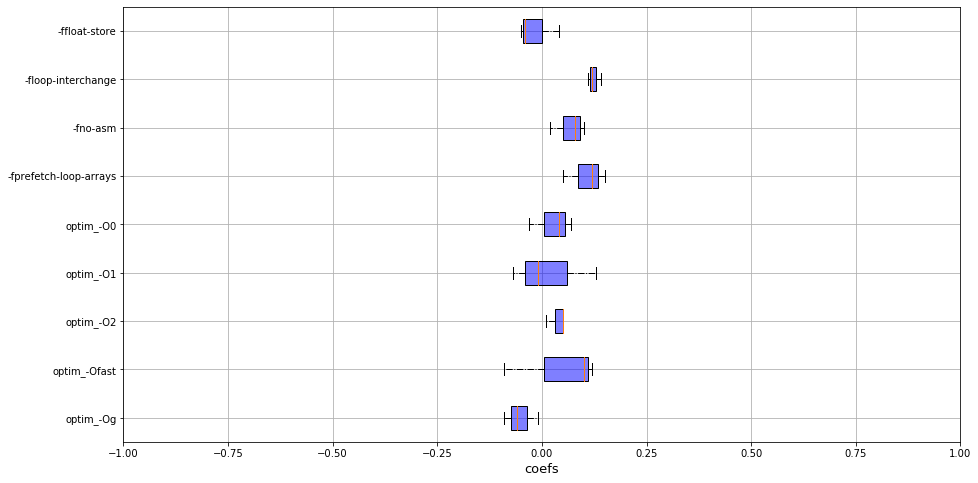


 RQ3 - Performance ratios

Mean =  1.8311965379225297
Std =  0.48467436914498757

--
Group  4 
--

Properties

csize             2943.0
#LOCs              125.0
number_literal      17.0
for_statement       13.0
if_statement         1.0
dtype: float64


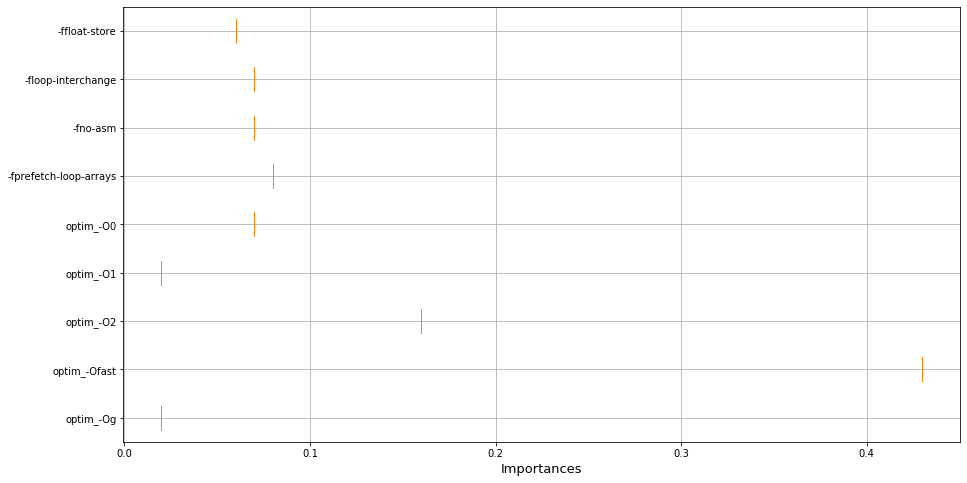

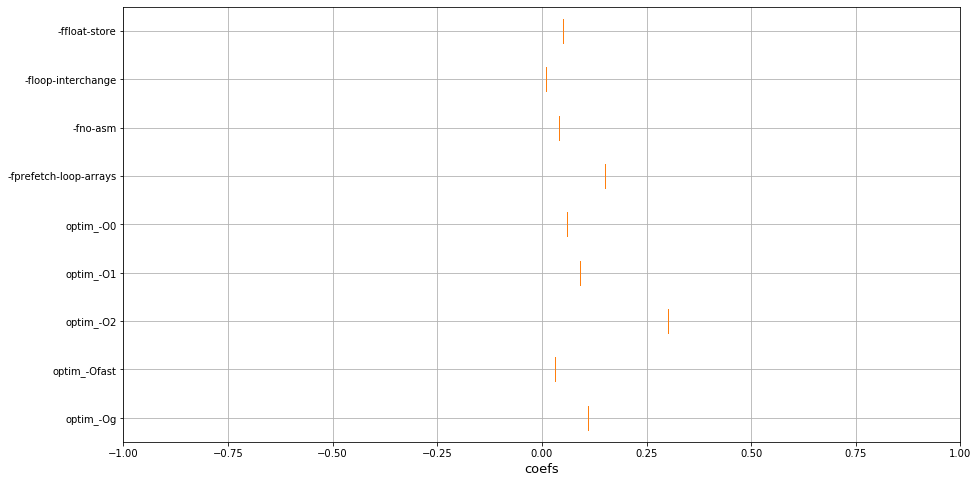


 RQ3 - Performance ratios

Mean =  2.8923076923076922
Std =  0.0

---
 exec 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


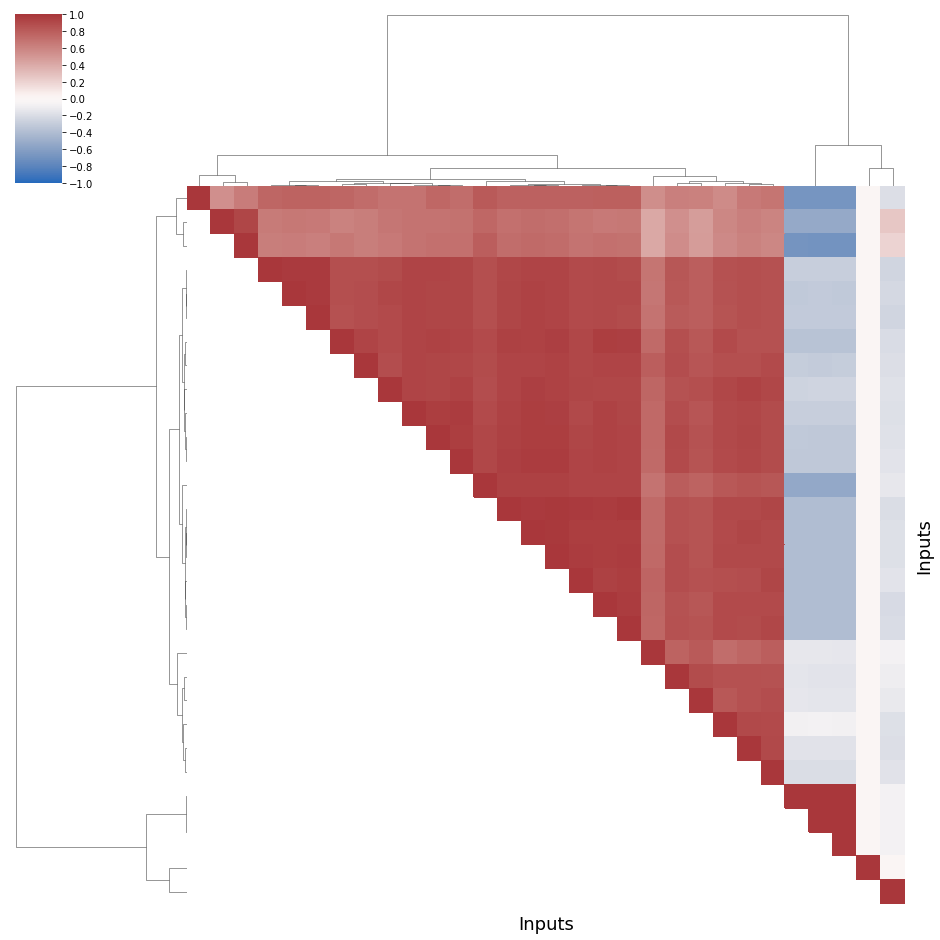


--
Group  1 
--

Properties

csize             3289.090909
#LOCs              139.954545
number_literal      29.545455
for_statement       10.000000
if_statement         1.045455
dtype: float64


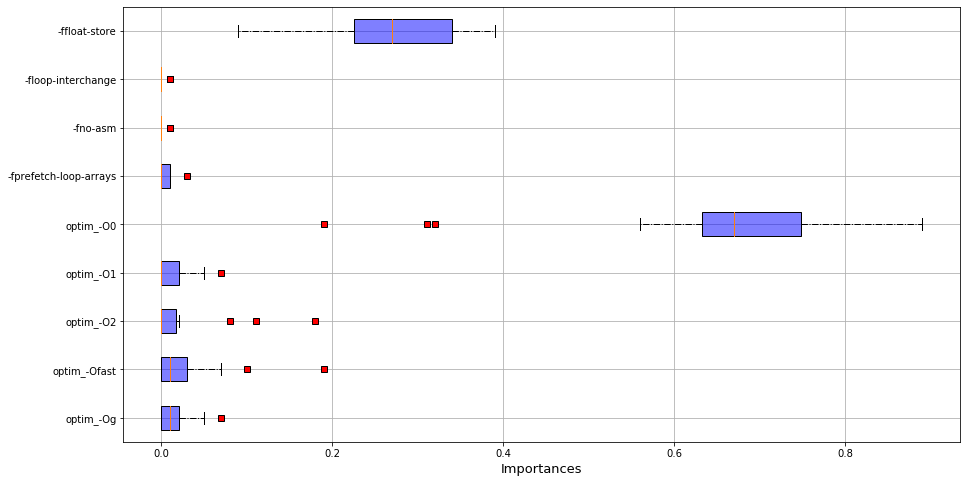

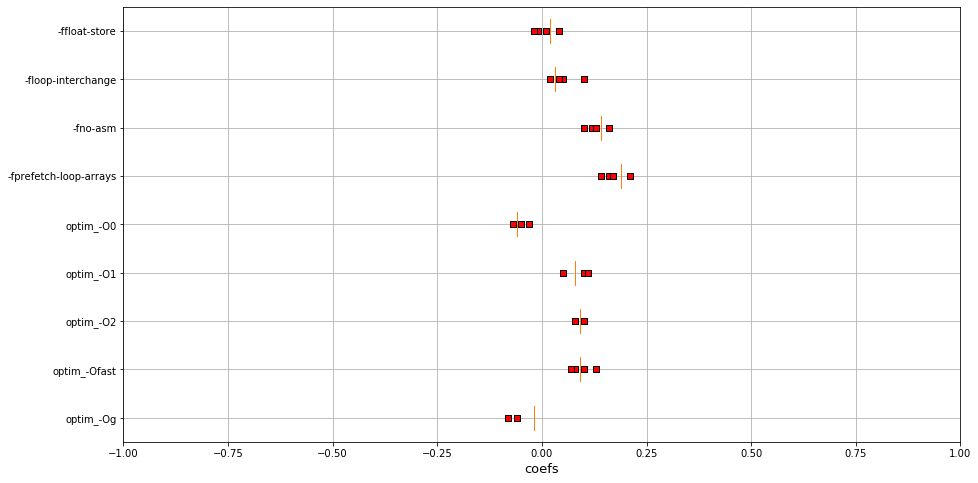


 RQ3 - Performance ratios

Mean =  8.9557141618616
Std =  13.917455147375621

--
Group  2 
--

Properties

csize             3298.666667
#LOCs              144.666667
number_literal      22.666667
for_statement       12.333333
if_statement         1.666667
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


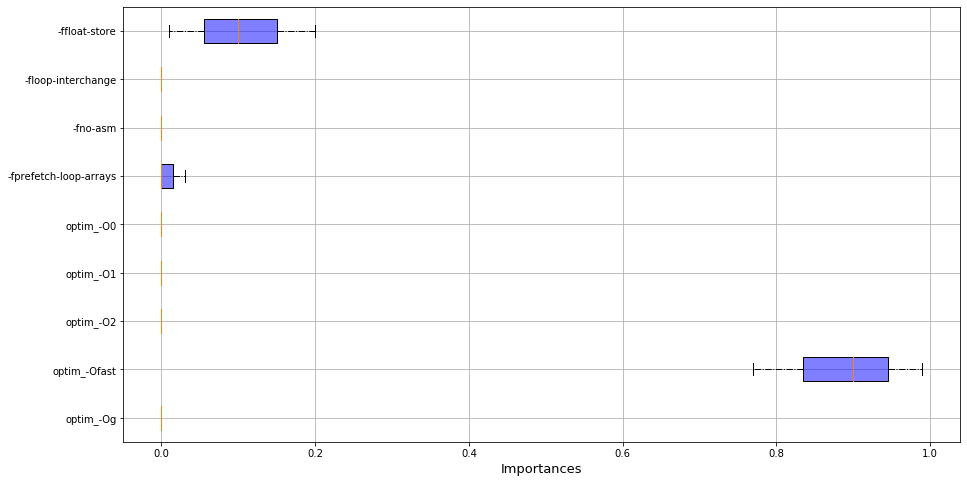

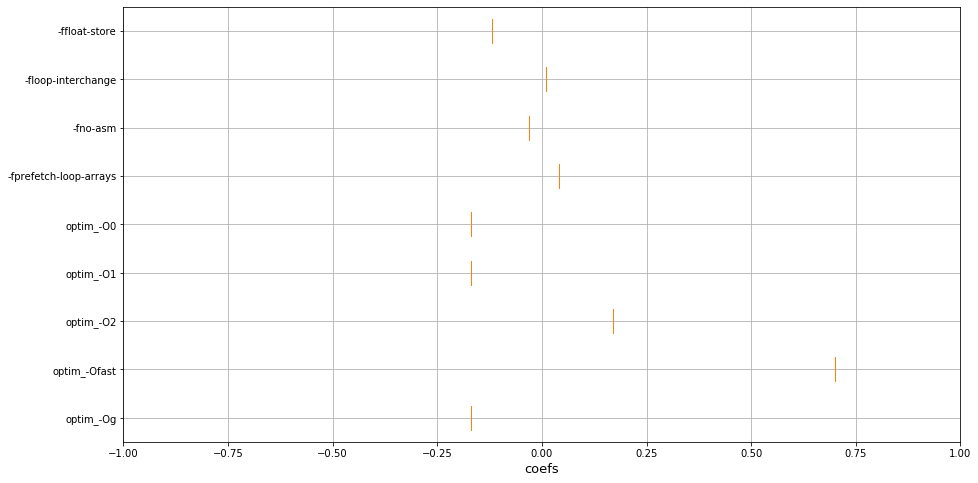


 RQ3 - Performance ratios

Mean =  12.054057061910479
Std =  9.25965897525161

--
Group  3 
--

Properties

csize             3209.5
#LOCs              137.0
number_literal      26.0
for_statement       10.0
if_statement         1.0
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


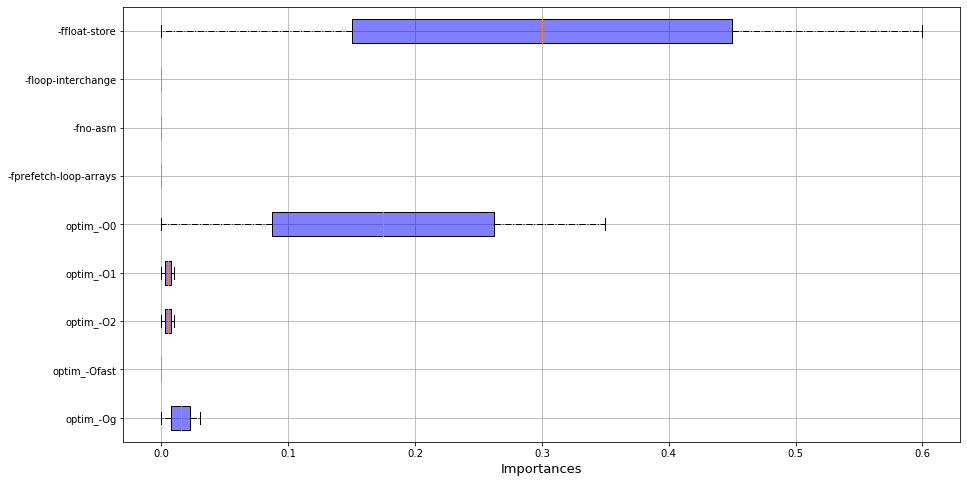

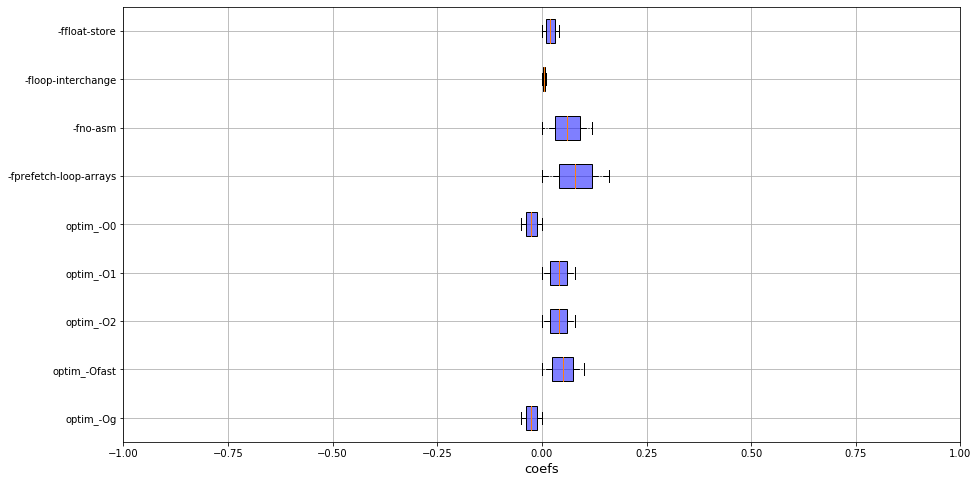


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

csize             3197.000000
#LOCs              126.666667
number_literal      28.000000
for_statement        9.666667
if_statement         0.666667
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


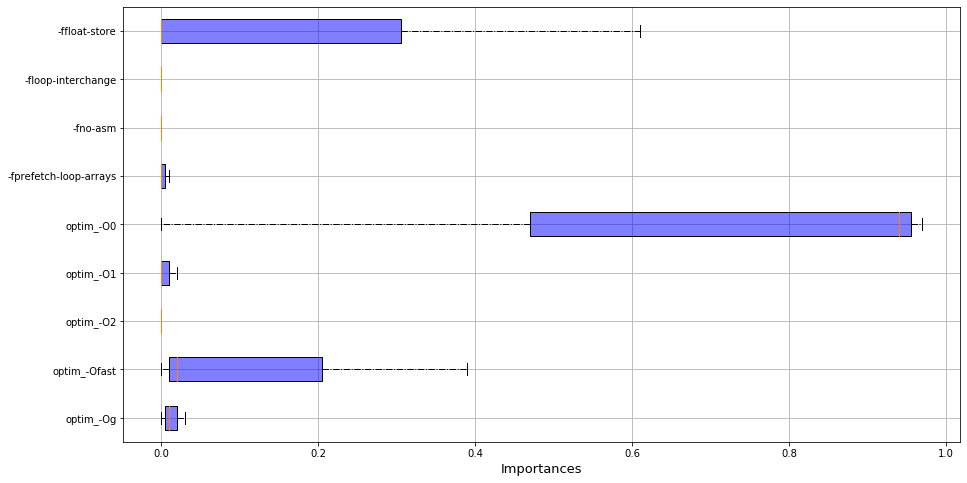

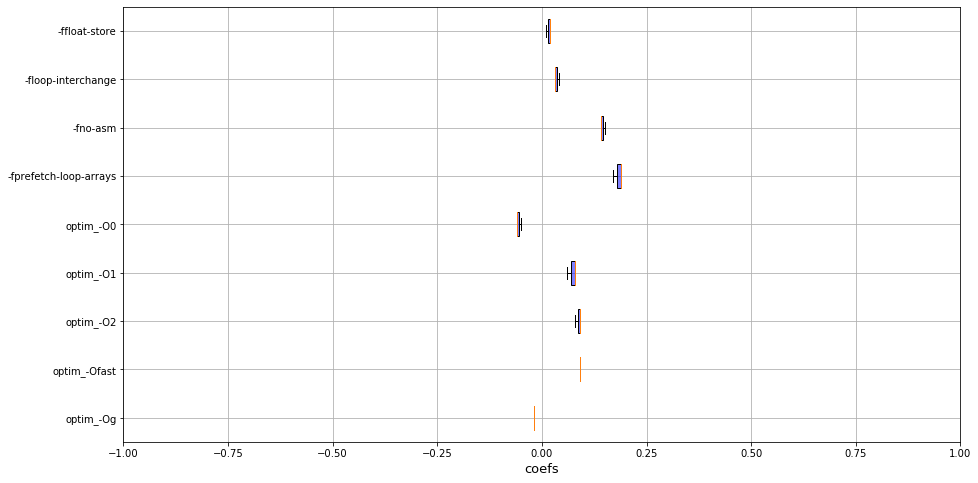


 RQ3 - Performance ratios

Mean =  14.252247294254744
Std =  8.744259453531537

-----
 lingeling 
-----


---
 conflicts 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


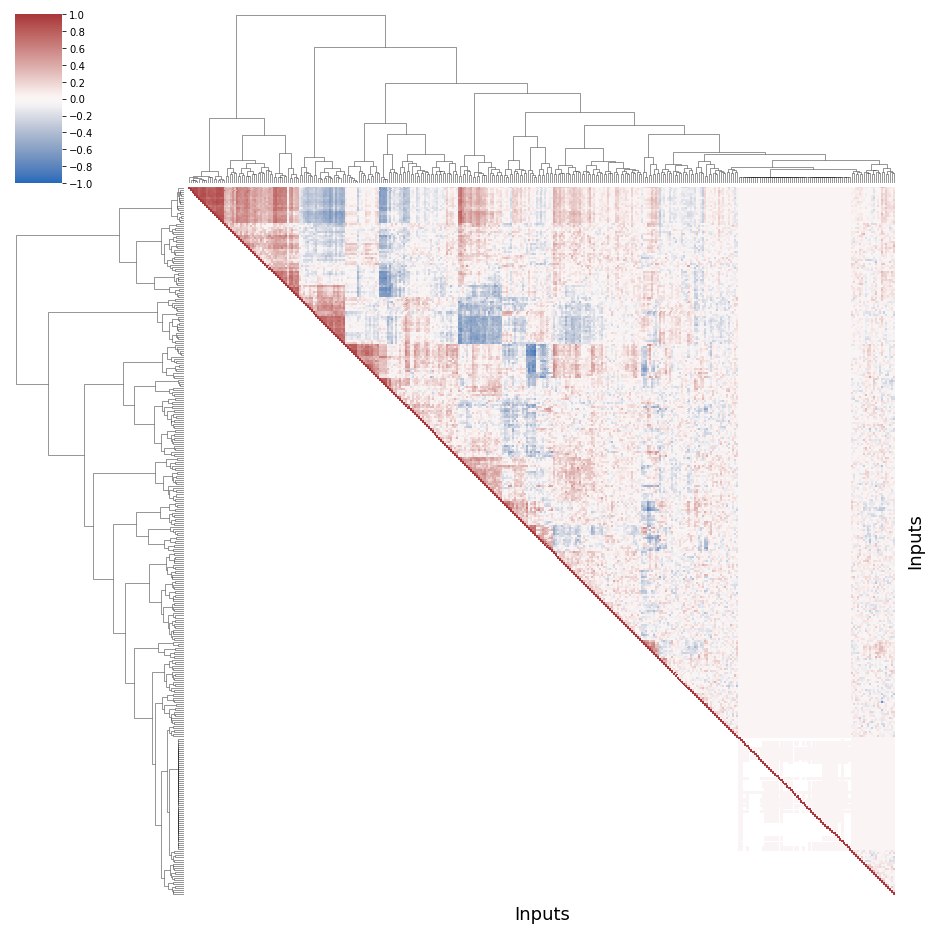


--
Group  1 
--

Properties

nbOR     9.330491e+05
nbAND    6.011311e+05
nbVAR    1.664205e+05
size     1.175067e+07
dtype: float64


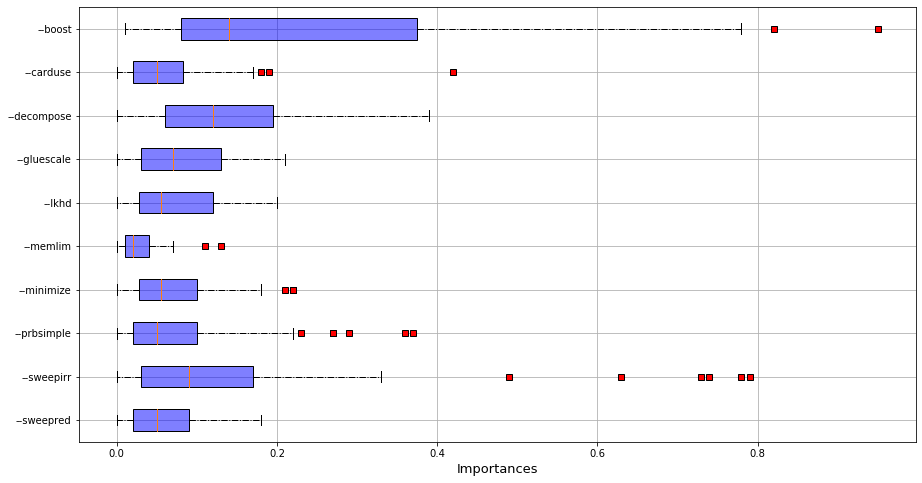

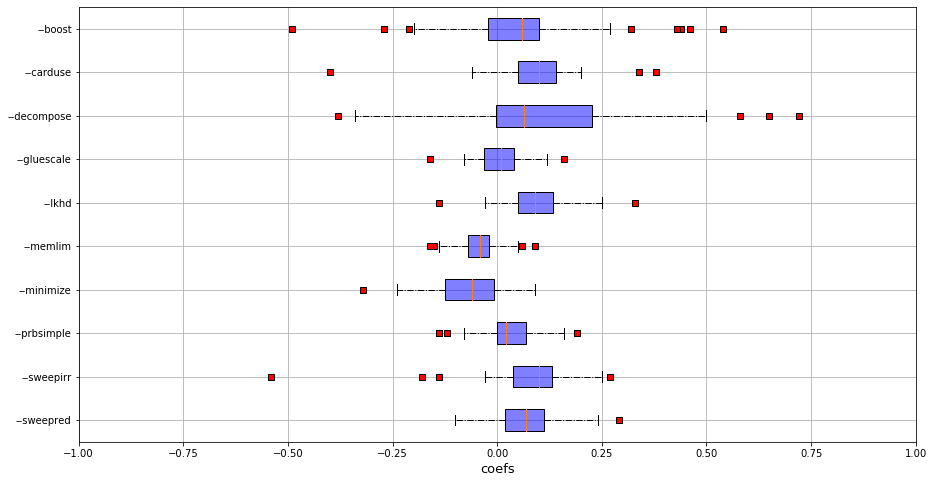


 RQ3 - Performance ratios

Mean =  12.595690680869653
Std =  0.0

--
Group  2 
--

Properties

nbOR     4.609170e+06
nbAND    2.863175e+06
nbVAR    7.965972e+05
size     6.450295e+07
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


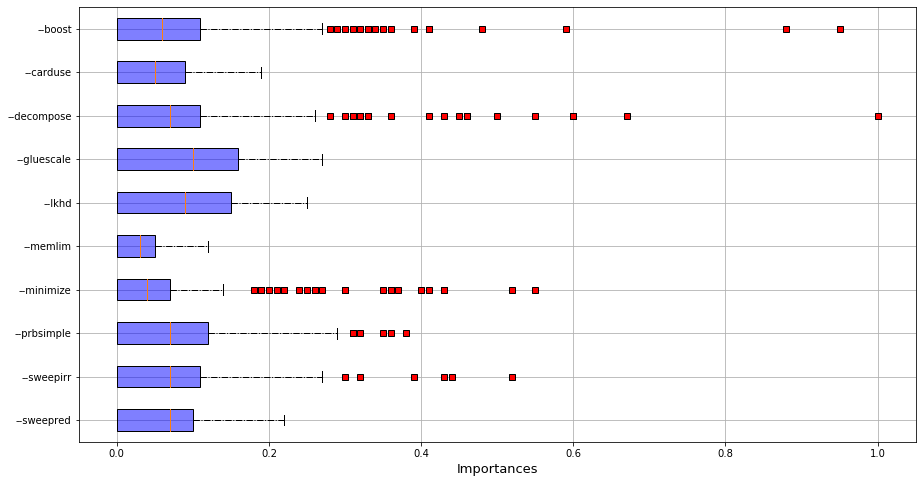

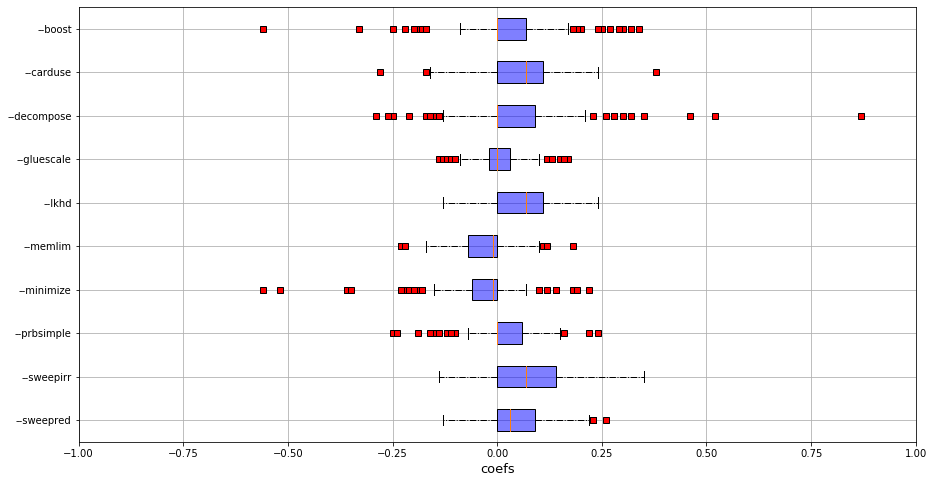


 RQ3 - Performance ratios

Mean =  5.0084337409184165
Std =  7.6440972703316366

--
Group  3 
--

Properties

nbOR      88357.363636
nbAND     39294.327273
nbVAR      5827.618182
size     751268.454545
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


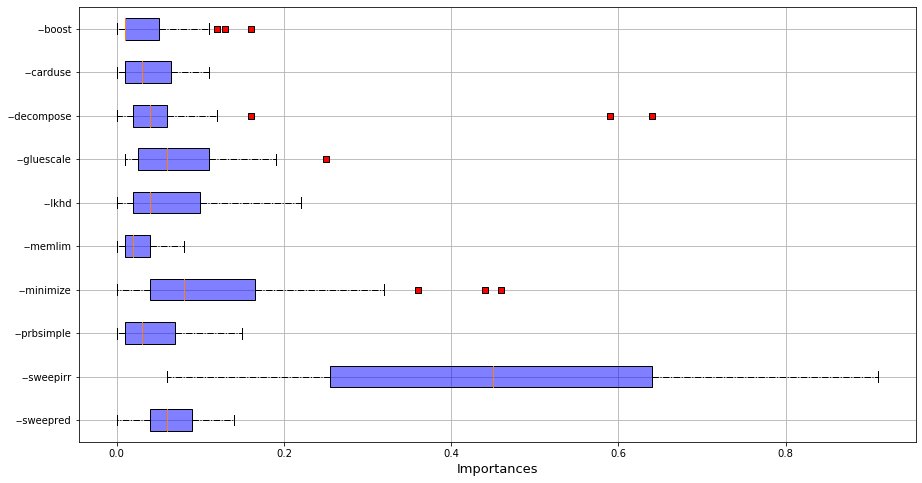

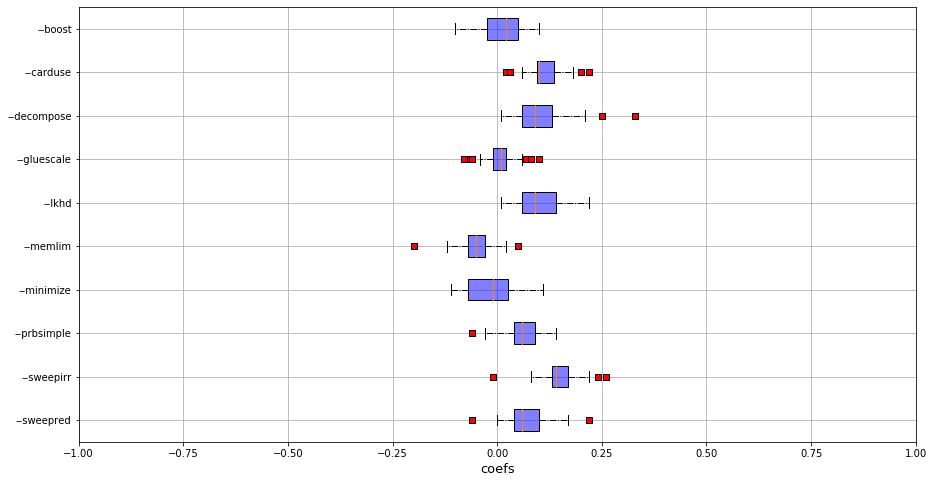


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

nbOR      31981.869565
nbAND     23809.173913
nbVAR      7947.826087
size     365180.217391
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


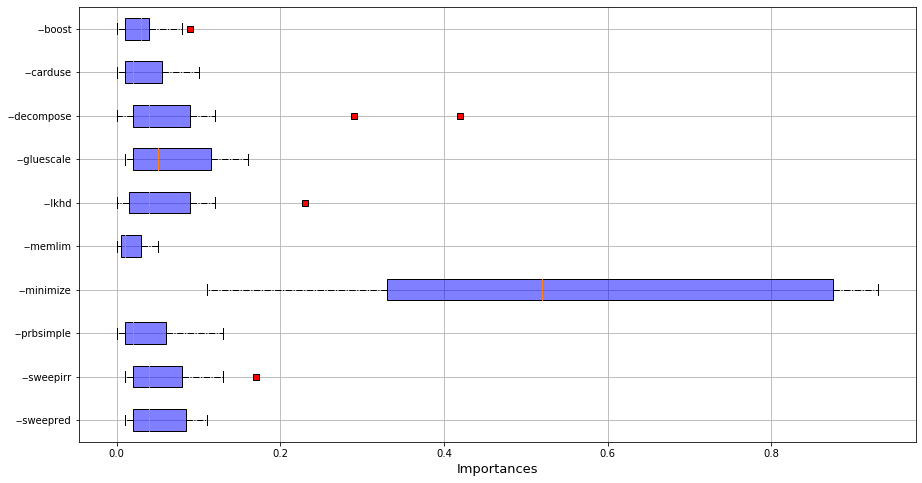

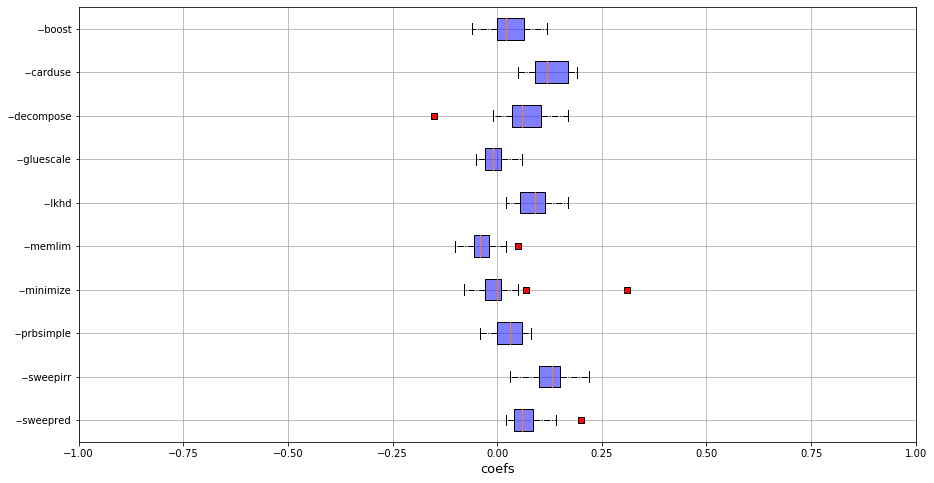


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 cps 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanR

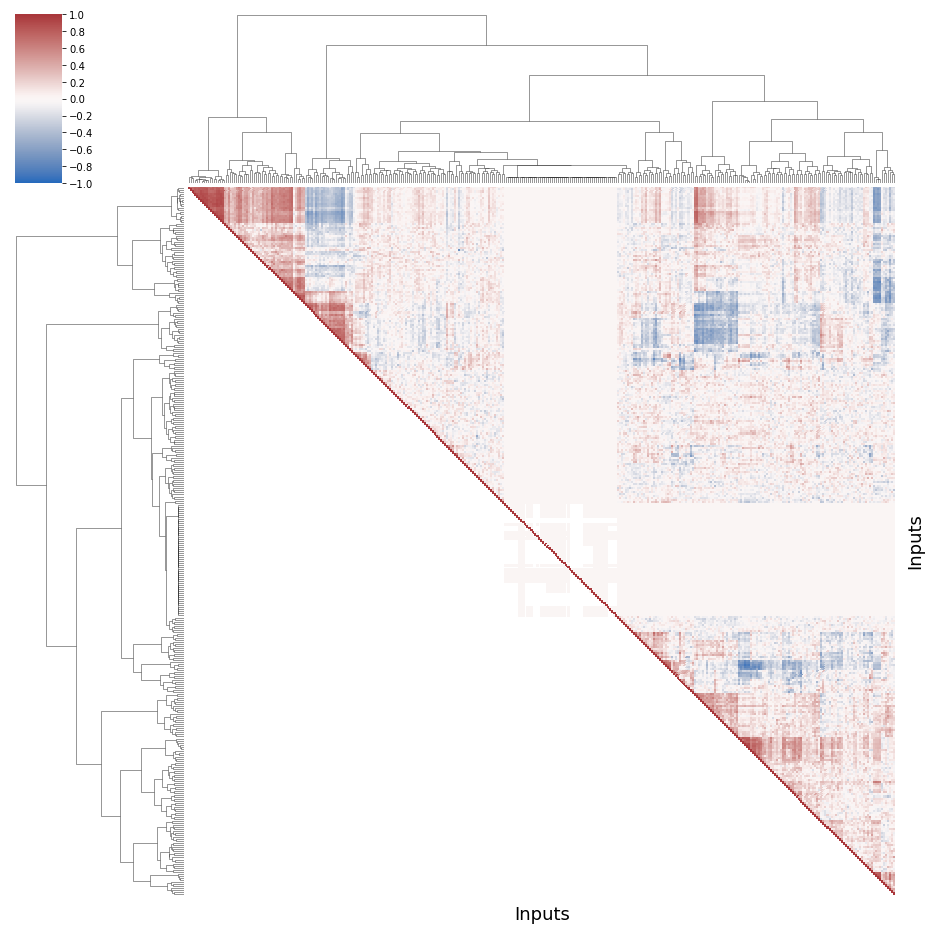


--
Group  1 
--

Properties

nbOR       845505.43
nbAND      537830.07
nbVAR      121750.60
size     10207614.76
dtype: float64


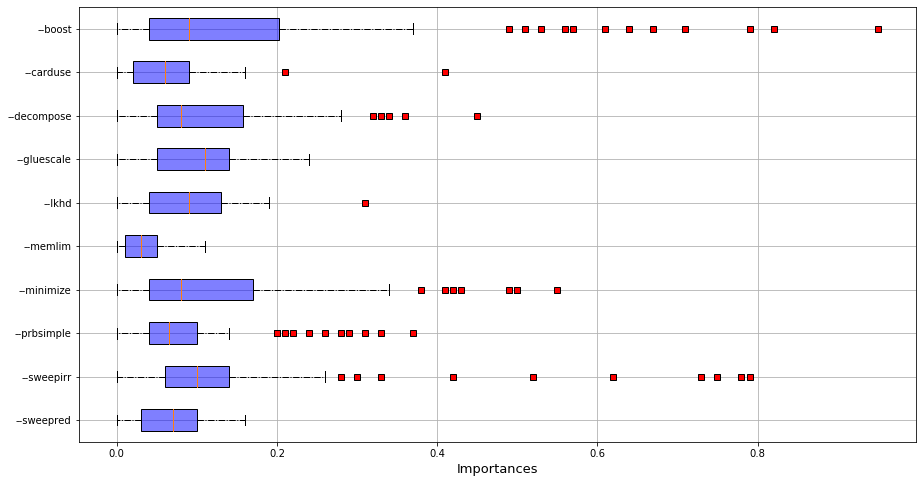

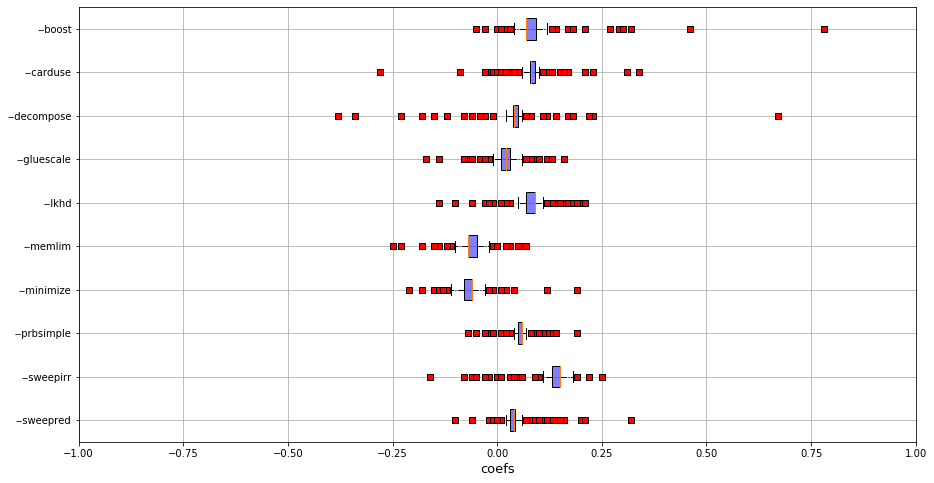


 RQ3 - Performance ratios

Mean =  4.936423933154825
Std =  4.7583626313472775

--
Group  2 
--

Properties

nbOR     5.723105e+06
nbAND    3.555097e+06
nbVAR    1.005464e+06
size     8.063268e+07
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


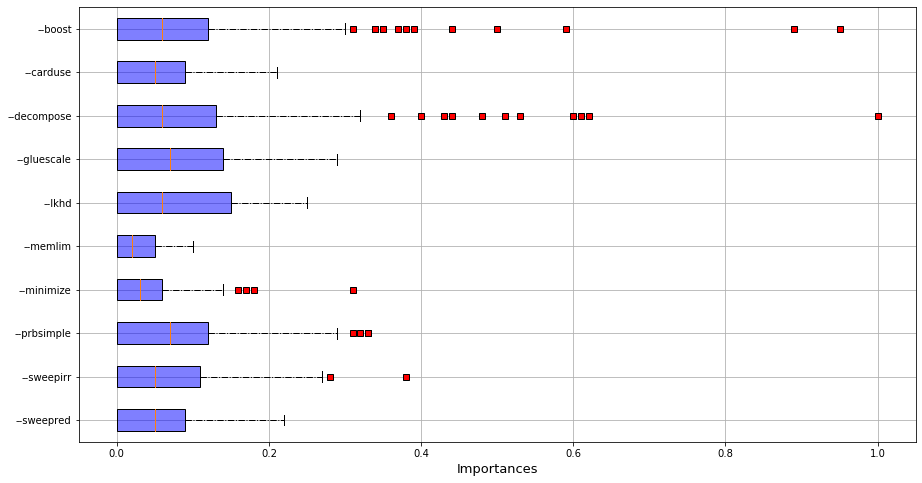

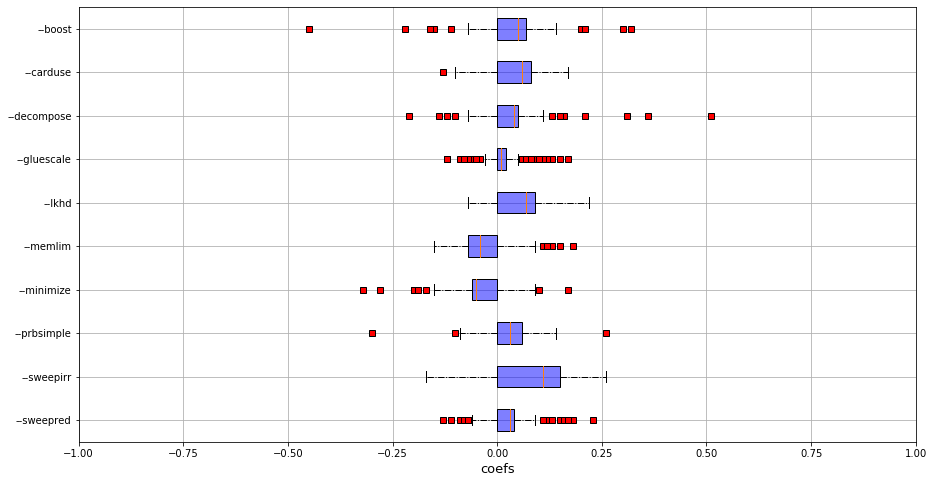


 RQ3 - Performance ratios

Mean =  5.612713401029628
Std =  6.625707329041566

--
Group  3 
--

Properties

nbOR      89167.810345
nbAND     40086.655172
nbVAR      6019.517241
size     765314.844828
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


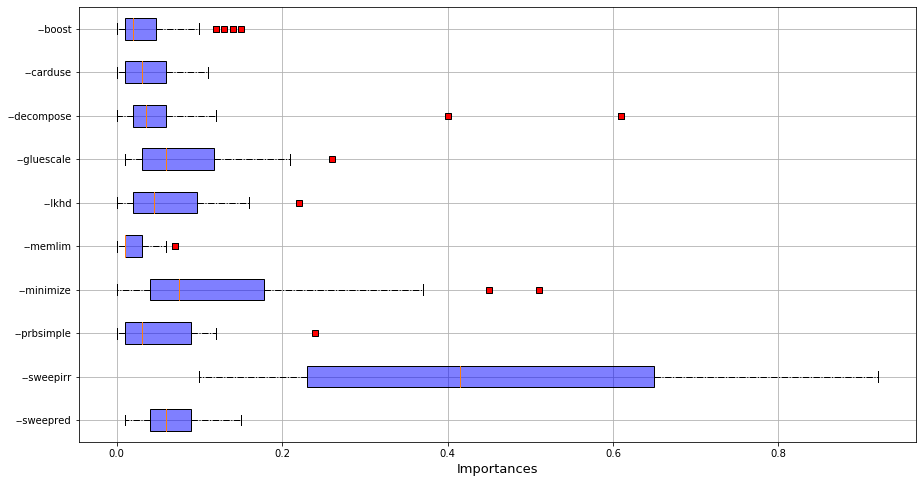

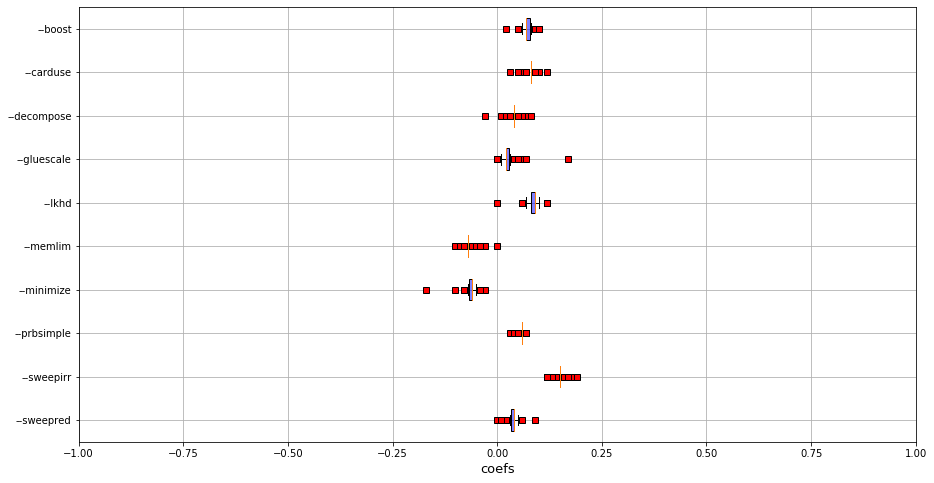


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

nbOR      46202.708333
nbAND     31735.083333
nbVAR      9868.000000
size     534312.083333
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


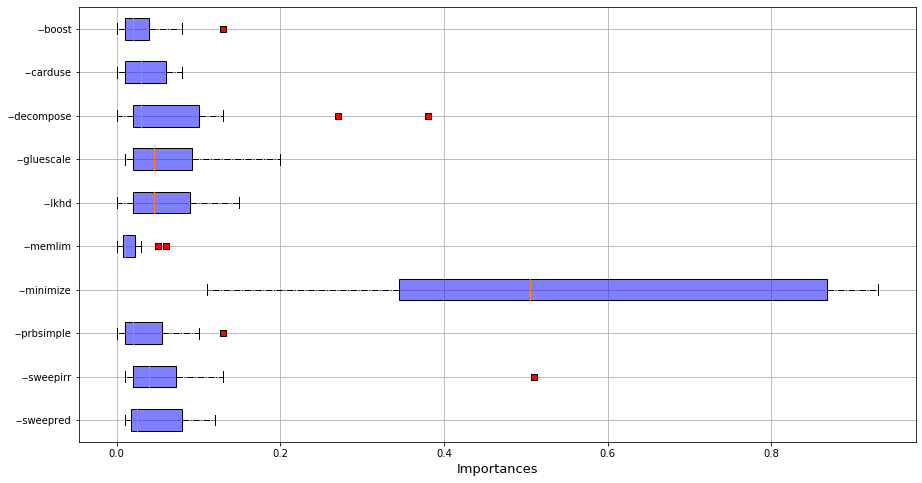

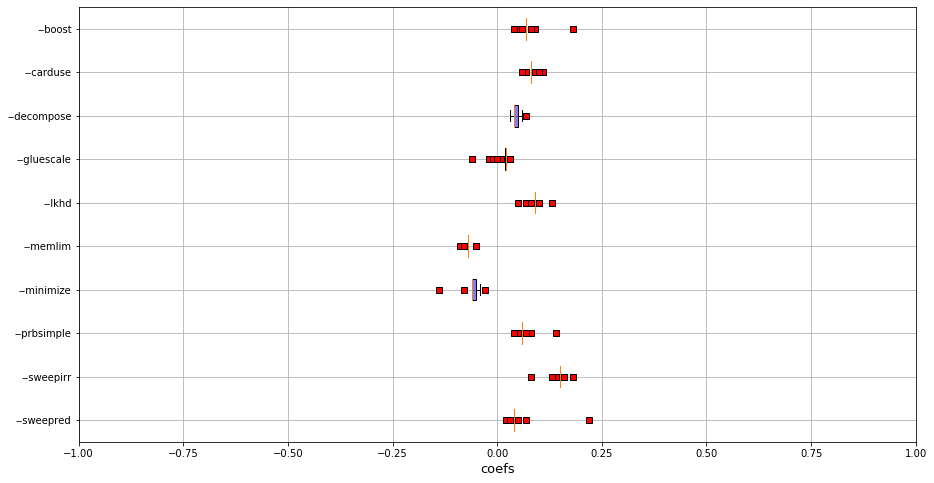


 RQ3 - Performance ratios

Mean =  3.157421755604553
Std =  0.0

---
 reductions 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


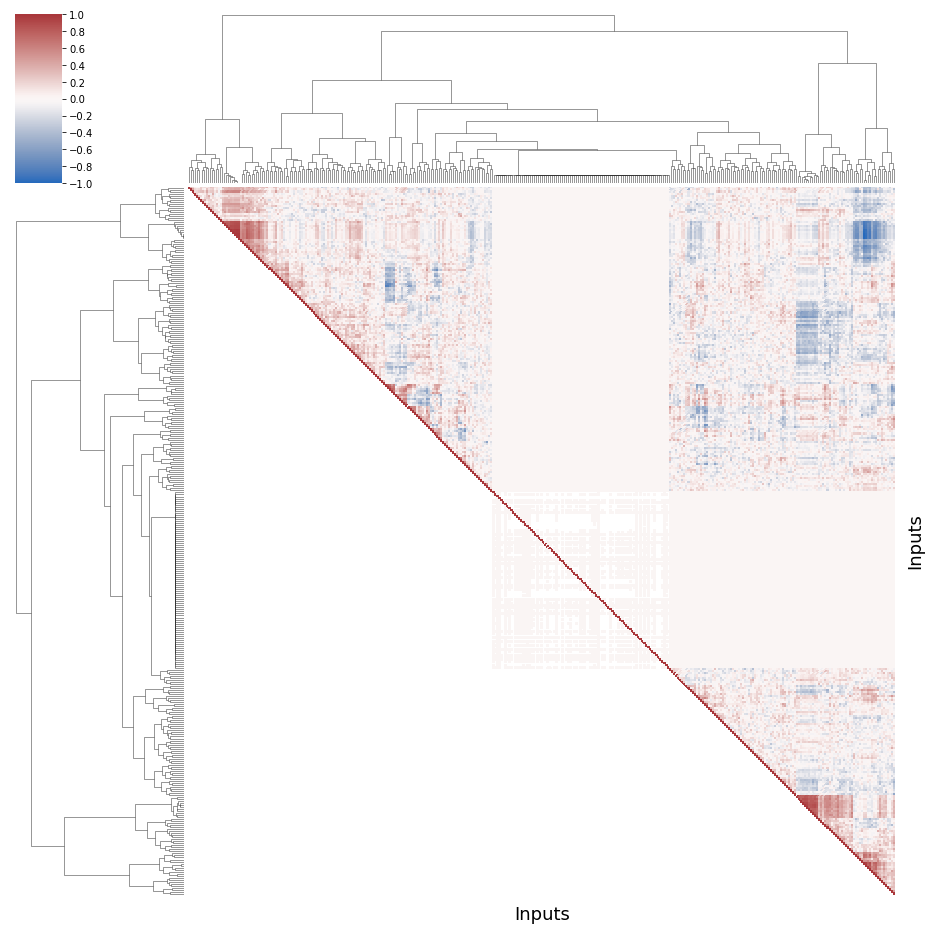


--
Group  1 
--

Properties

nbOR     3.959825e+06
nbAND    2.463118e+06
nbVAR    6.866645e+05
size     5.518374e+07
dtype: float64


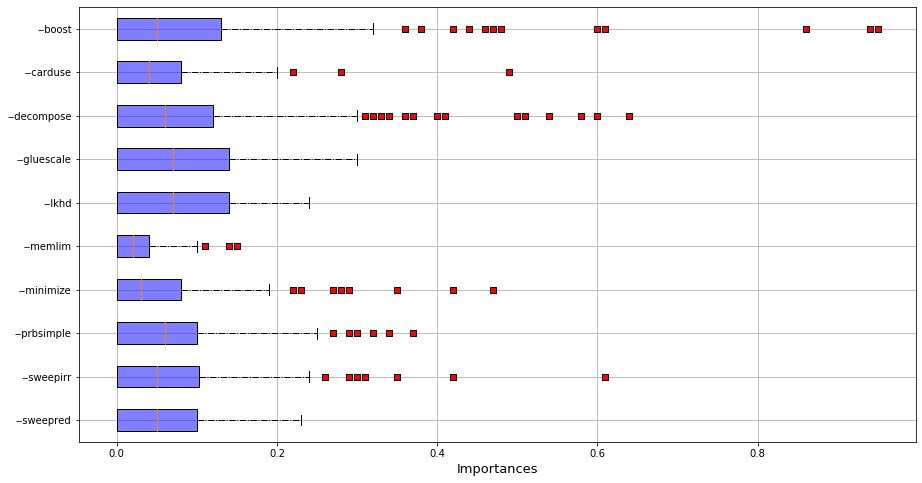

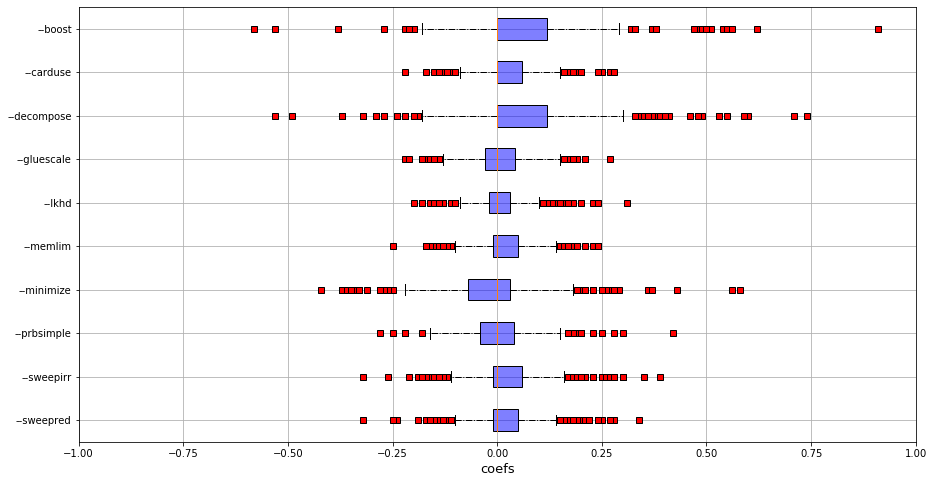


 RQ3 - Performance ratios

Mean =  2.3632967067598405
Std =  2.5313395076904746

--
Group  2 
--

Properties

nbOR     1.579042e+05
nbAND    7.600116e+04
nbVAR    1.124779e+04
size     1.517848e+06
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


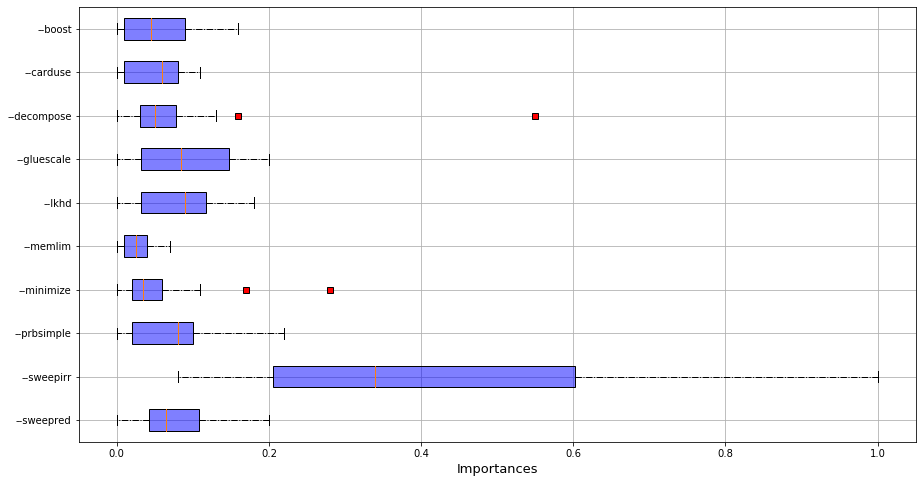

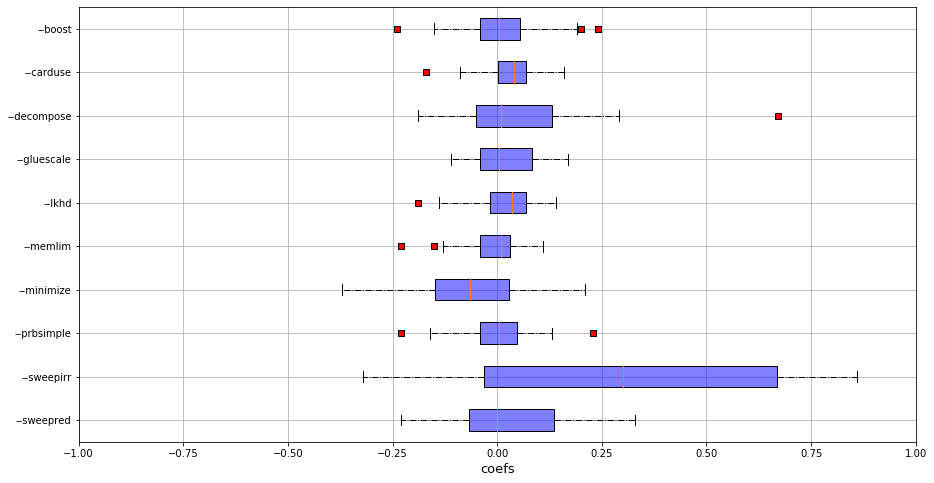


 RQ3 - Performance ratios

Mean =  2.3528571428571428
Std =  0.0

--
Group  3 
--

Properties

nbOR     2.702855e+05
nbAND    1.847109e+05
nbVAR    3.727043e+04
size     3.261693e+06
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


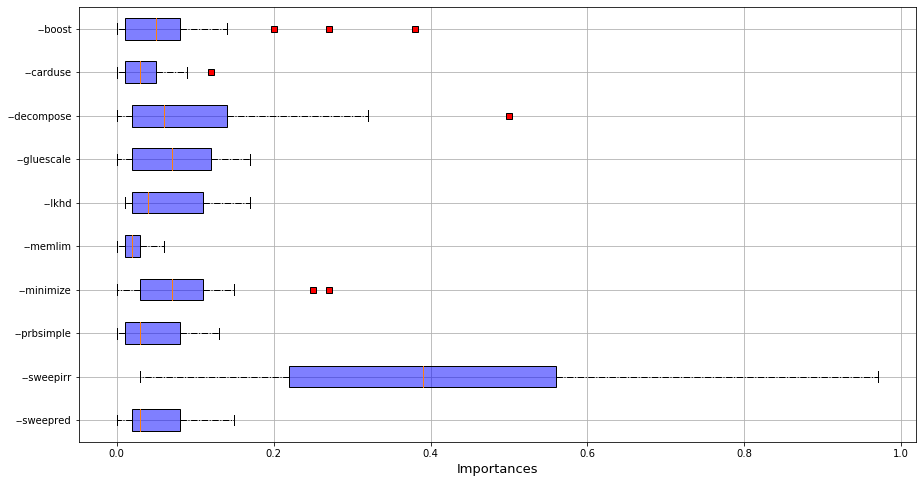

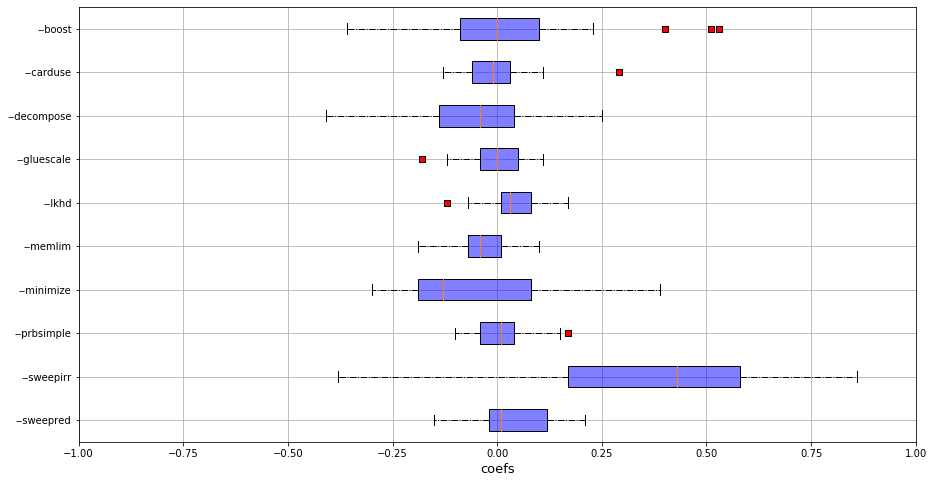


 RQ3 - Performance ratios

Mean =  1.2454945054945057
Std =  0.0

--
Group  4 
--

Properties

nbOR      34486.035714
nbAND     23252.178571
nbVAR      6961.678571
size     364851.642857
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


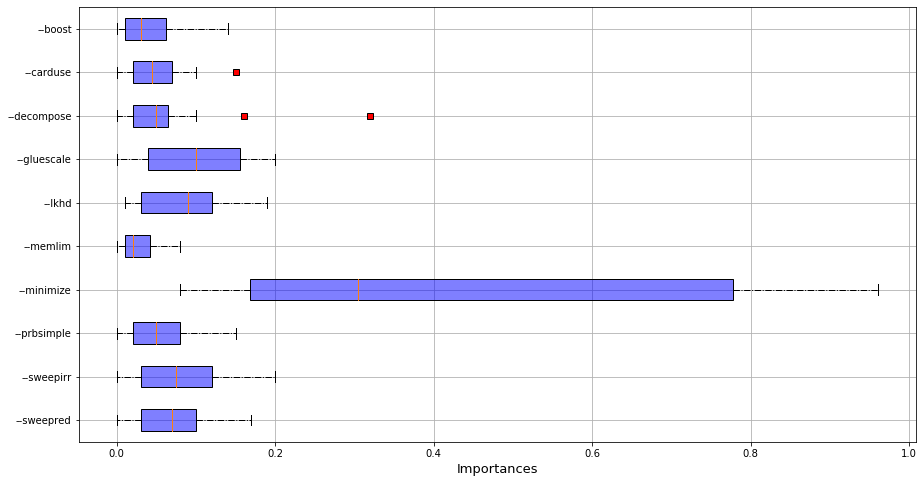

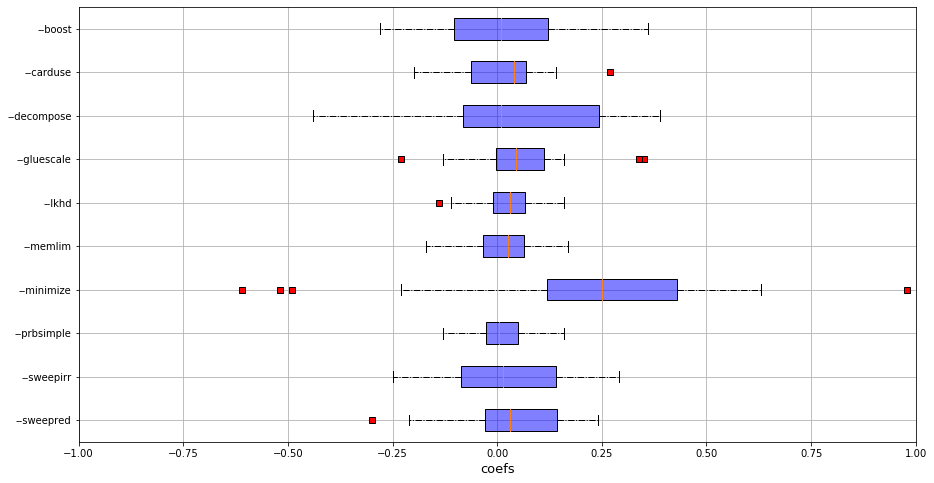


 RQ3 - Performance ratios

Mean =  1.5
Std =  0.0

-----
 sqlite 
-----


---
 q1 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


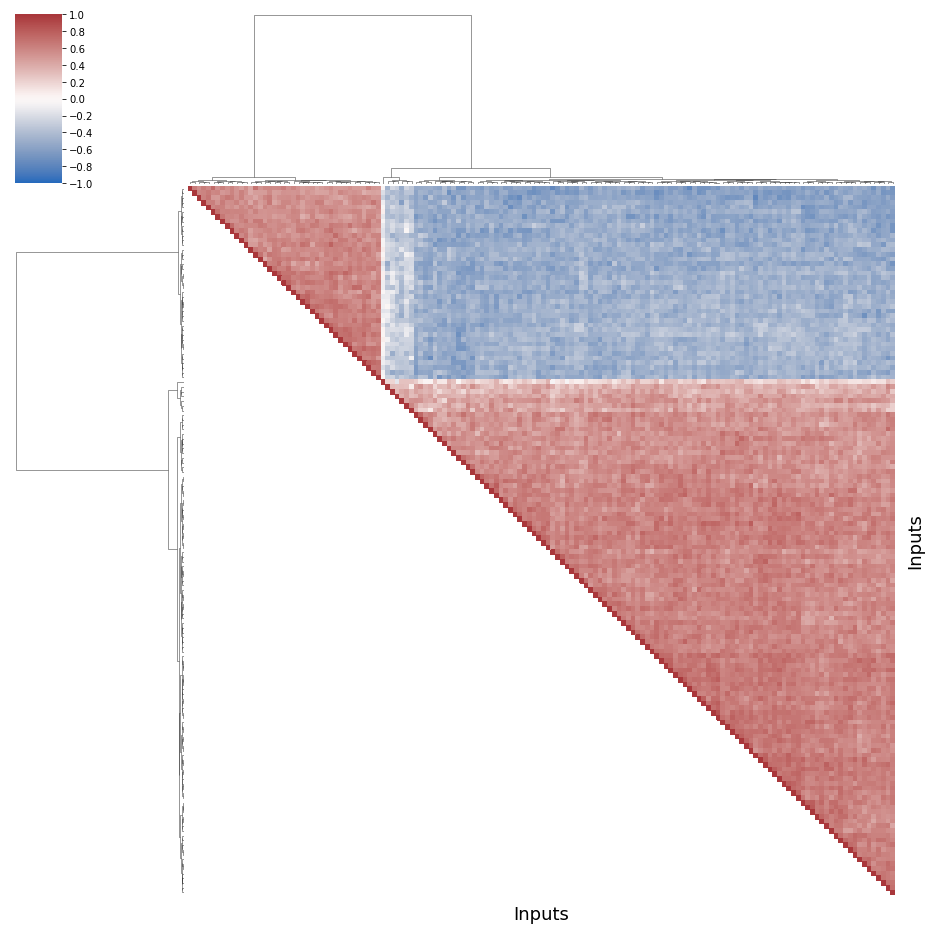


--
Group  1 
--

Properties

name         0.040000
tab1      6000.000000
tab2    240136.428571
tab4     60000.000000
tab5      8000.000000
tab6     32000.000000
tab8       400.000000
dtype: float64


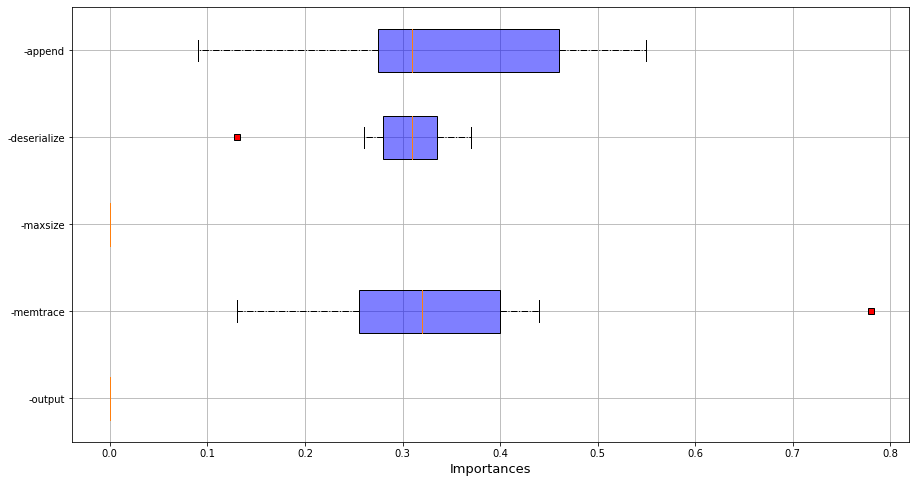

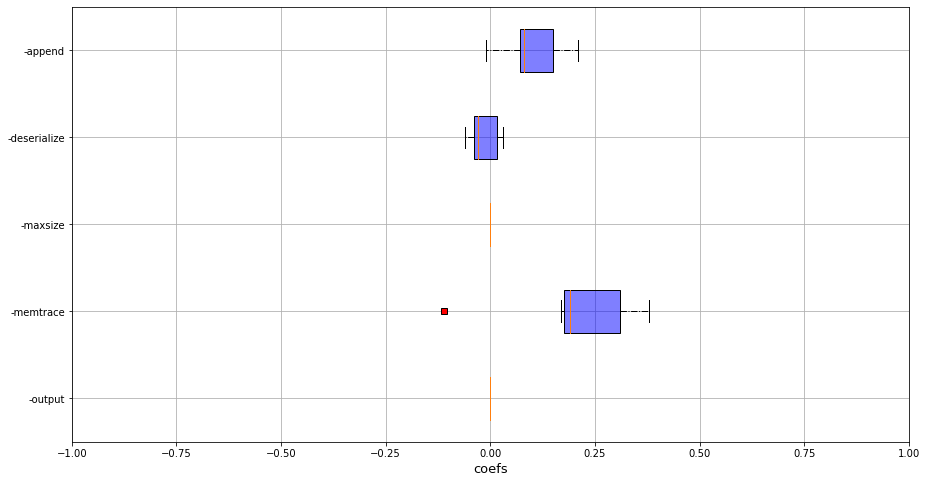


 RQ3 - Performance ratios

Mean =  1.055372796356197
Std =  0.017789422502816565

--
Group  2 
--

Properties

name    2.623077e-01
tab1    3.934615e+04
tab2    1.573966e+06
tab4    3.934615e+05
tab5    5.246154e+04
tab6    2.098462e+05
tab8    2.623077e+03
dtype: float64


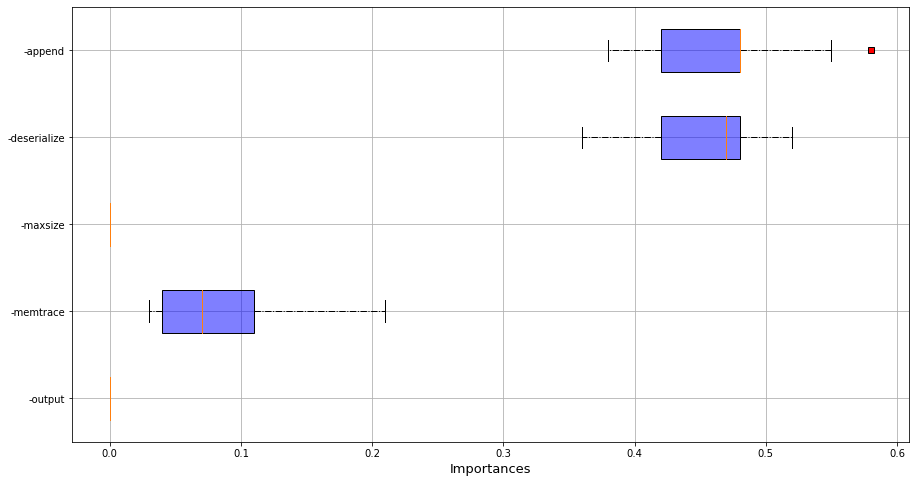

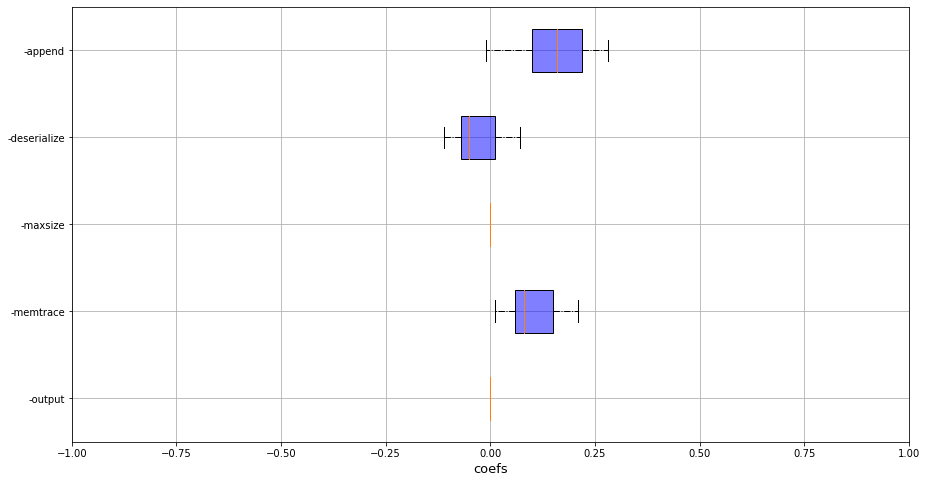


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    6.776404e-01
tab1    9.406180e+04
tab2    3.762928e+06
tab4    9.406180e+05
tab5    1.254157e+05
tab6    5.016629e+05
tab8    6.270787e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


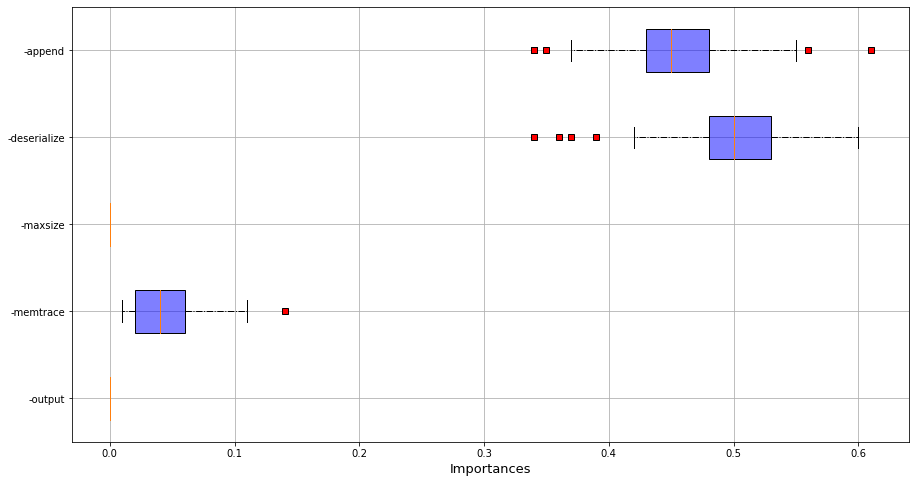

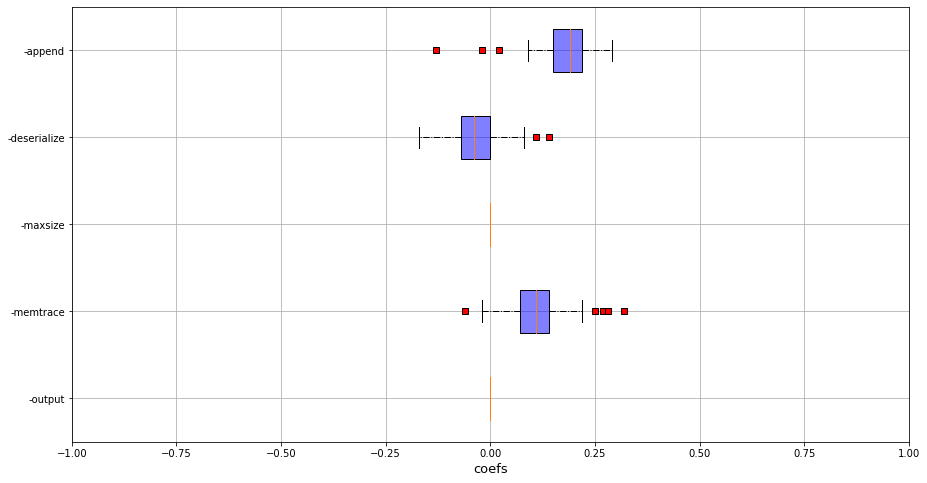


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


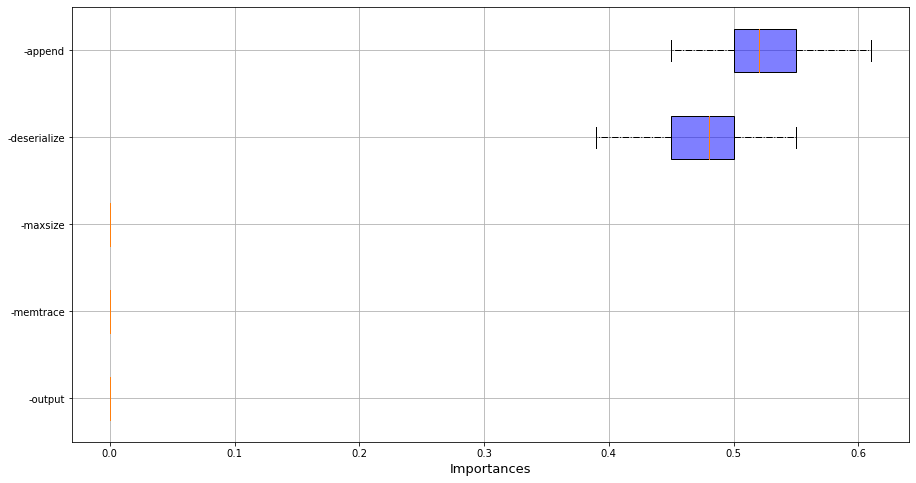

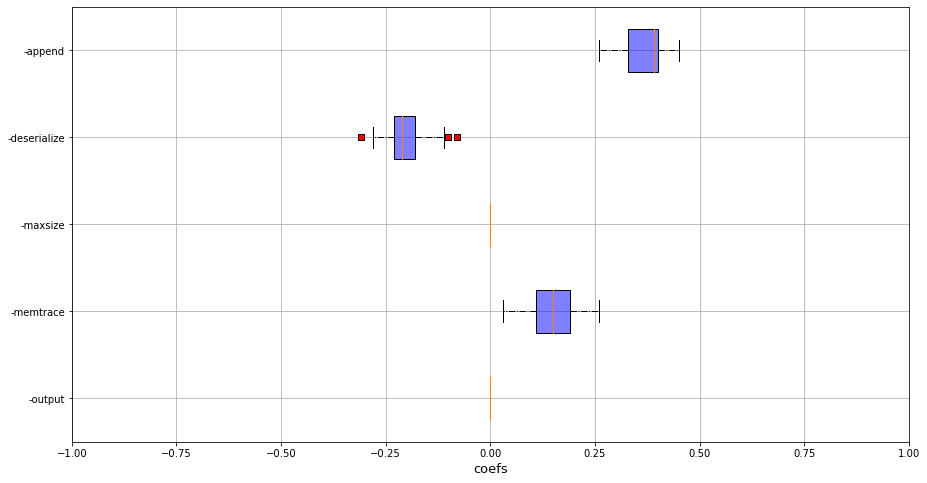


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q2 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


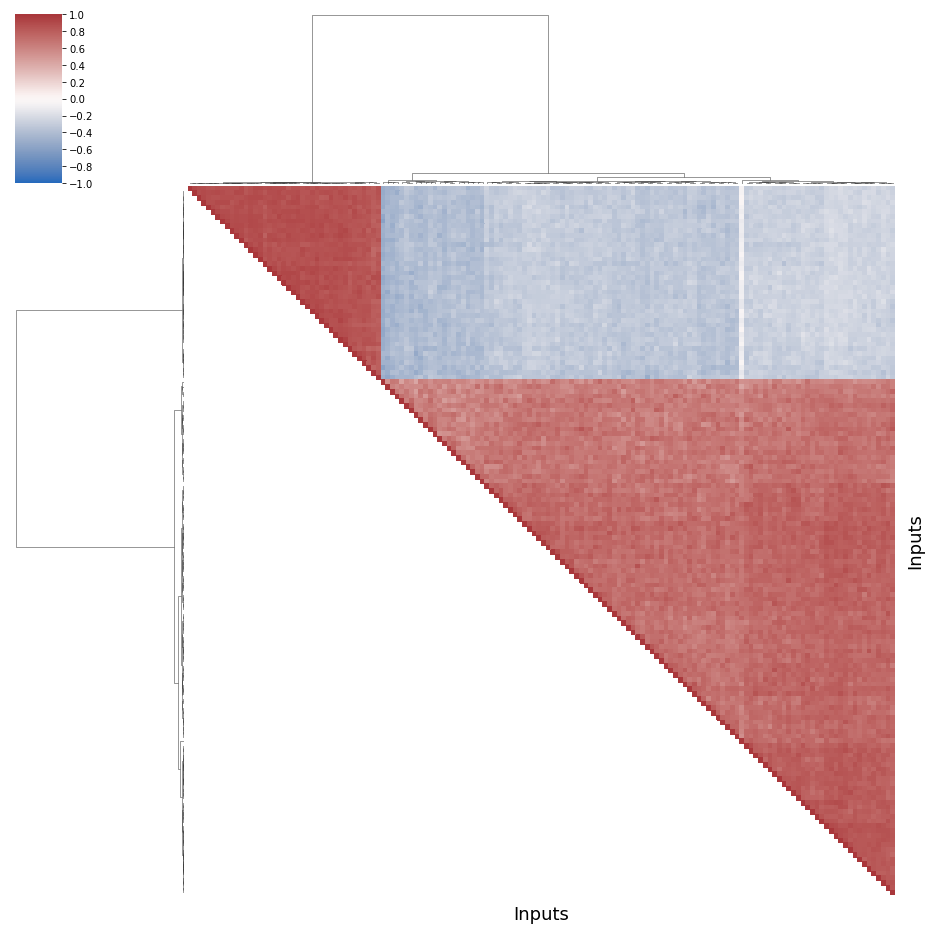


--
Group  1 
--

Properties

name    6.639394e-01
tab1    8.595455e+04
tab2    3.438726e+06
tab4    8.595455e+05
tab5    1.146061e+05
tab6    4.584242e+05
tab8    5.730303e+03
dtype: float64


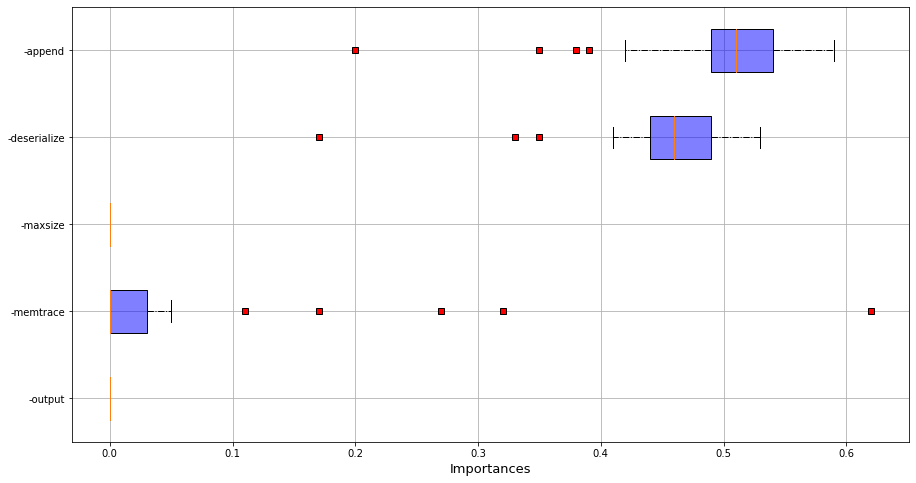

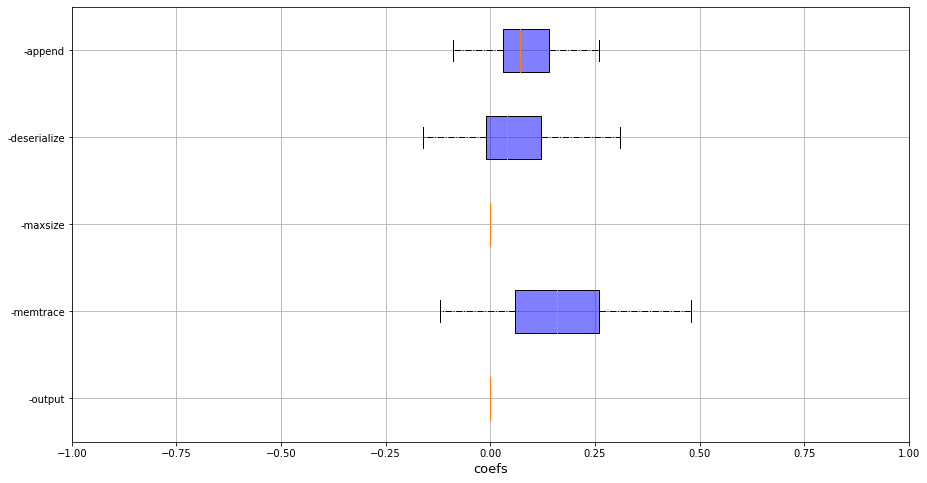


 RQ3 - Performance ratios

Mean =  1.1286794357321812
Std =  0.07672304758204104

--
Group  2 
--

Properties

name    6.120370e-01
tab1    8.763889e+04
tab2    3.505997e+06
tab4    8.763889e+05
tab5    1.168519e+05
tab6    4.674074e+05
tab8    5.842593e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


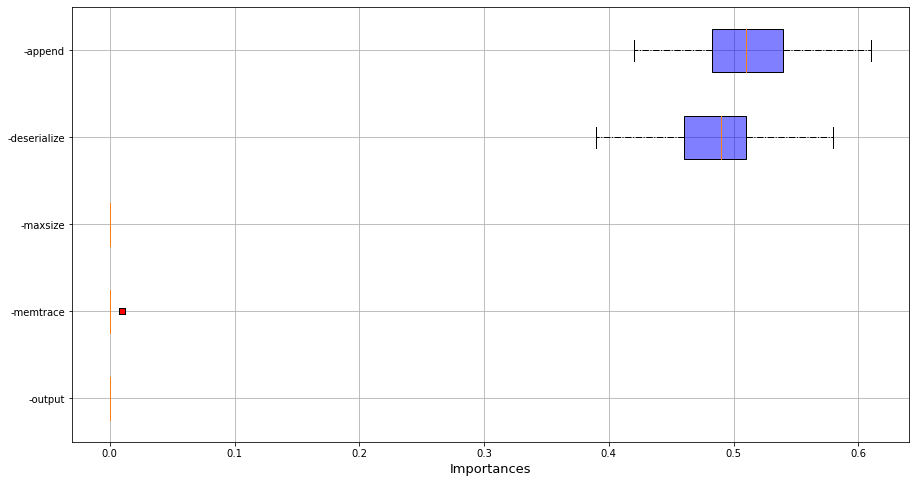

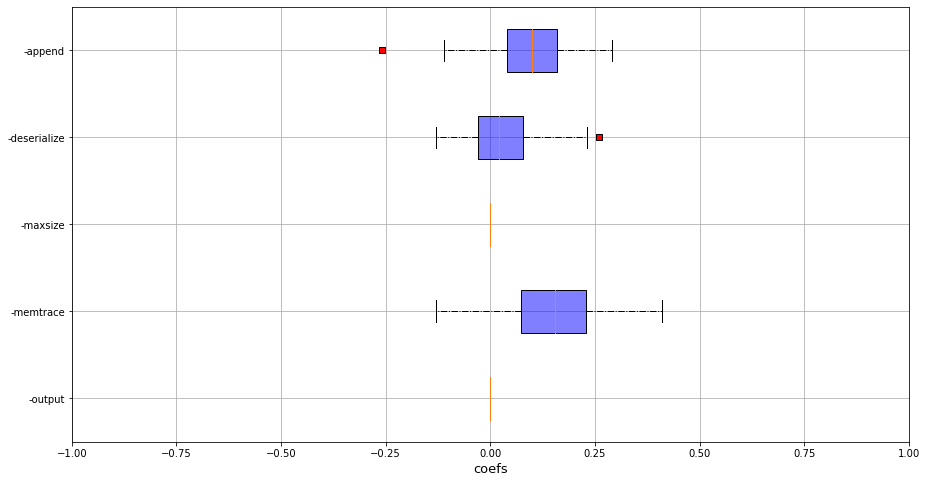


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    4.109091e-01
tab1    6.163636e+04
tab2    2.465515e+06
tab4    6.163636e+05
tab5    8.218182e+04
tab6    3.287273e+05
tab8    4.109091e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


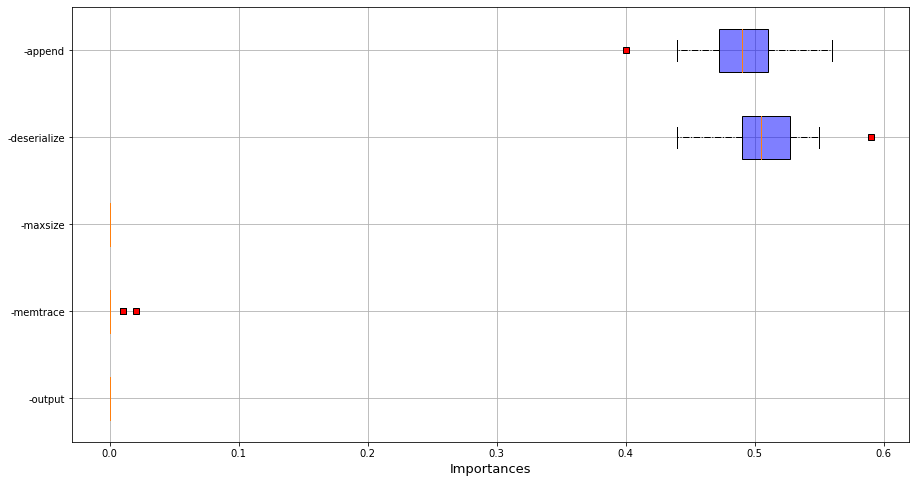

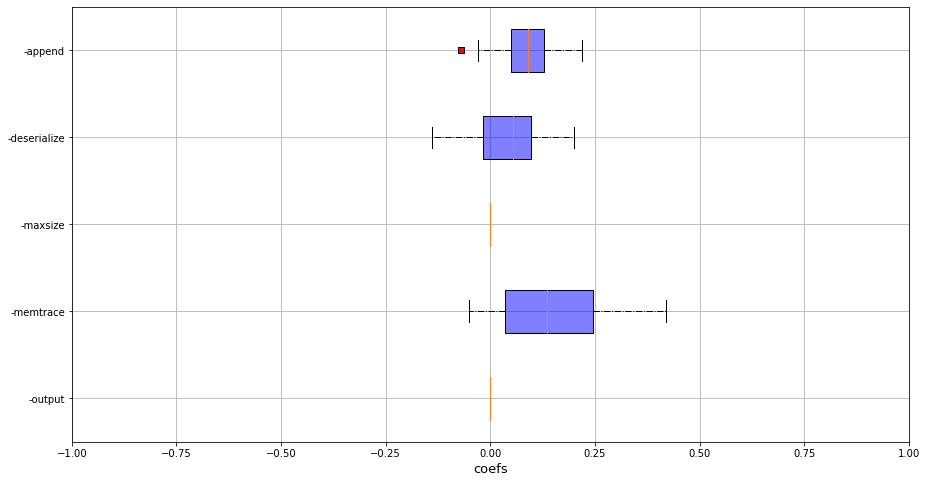


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


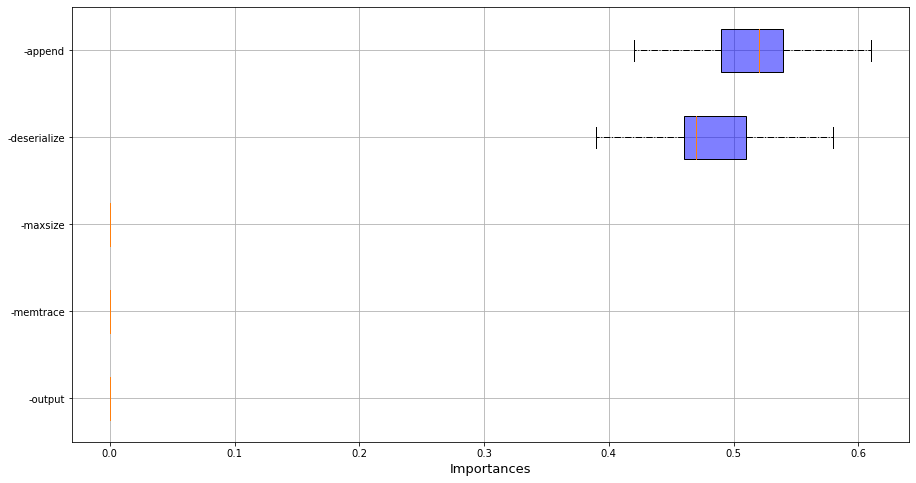

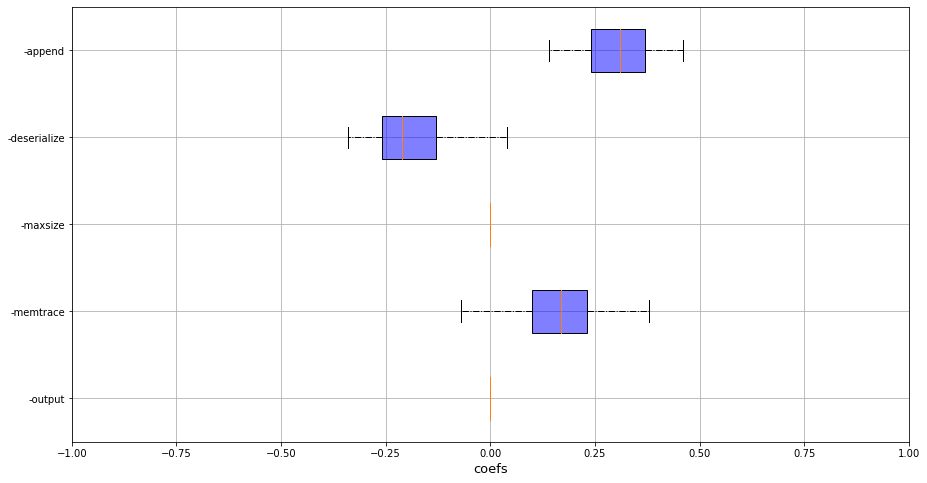


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q3 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


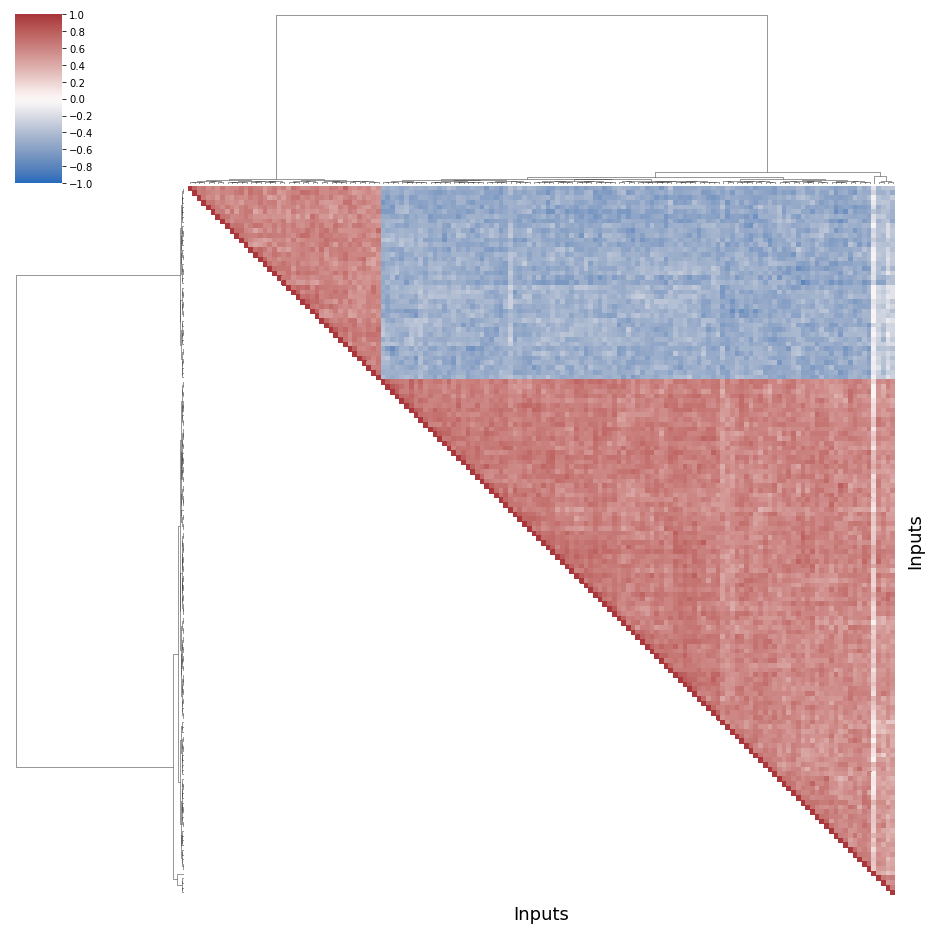


--
Group  1 
--

Properties

name         0.0275
tab1      4125.0000
tab2    165267.5000
tab4     41250.0000
tab5      5500.0000
tab6     22000.0000
tab8       275.0000
dtype: float64


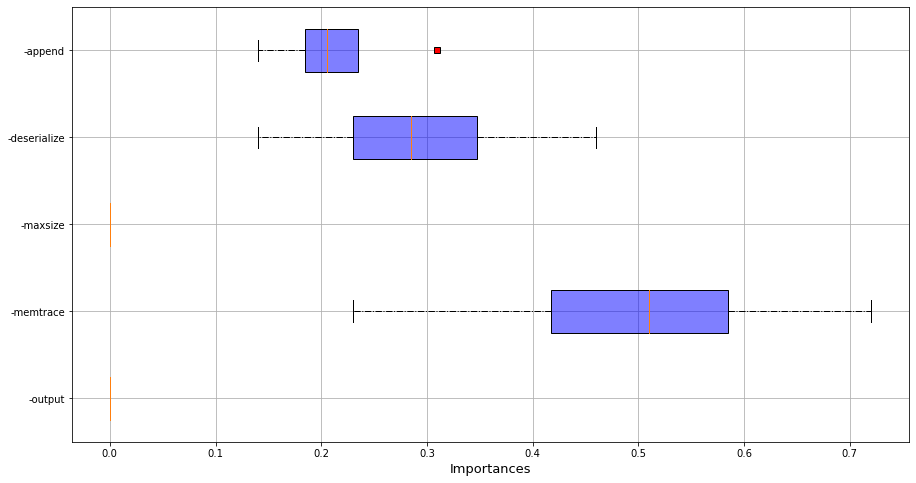

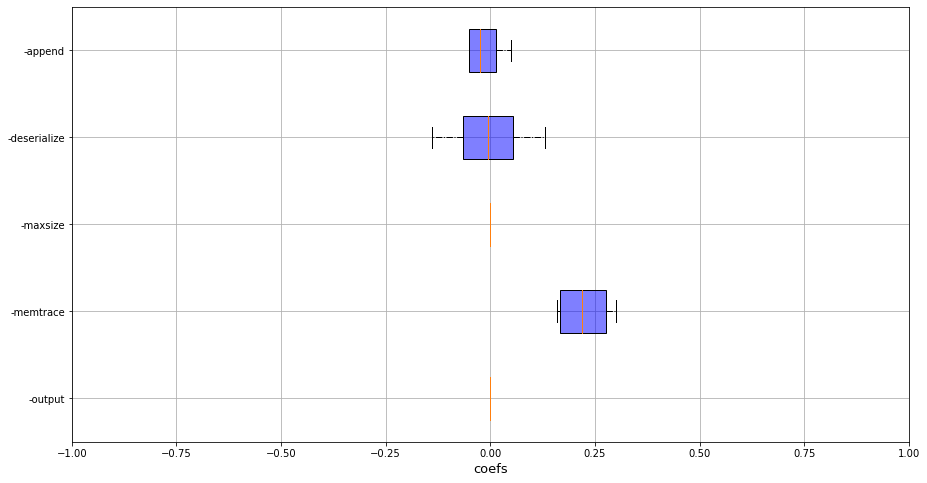


 RQ3 - Performance ratios

Mean =  1.1101565148201722
Std =  0.01106304642534923

--
Group  2 
--

Properties

name         0.04
tab1      6000.00
tab2    240292.00
tab4     60000.00
tab5      8000.00
tab6     32000.00
tab8       400.00
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


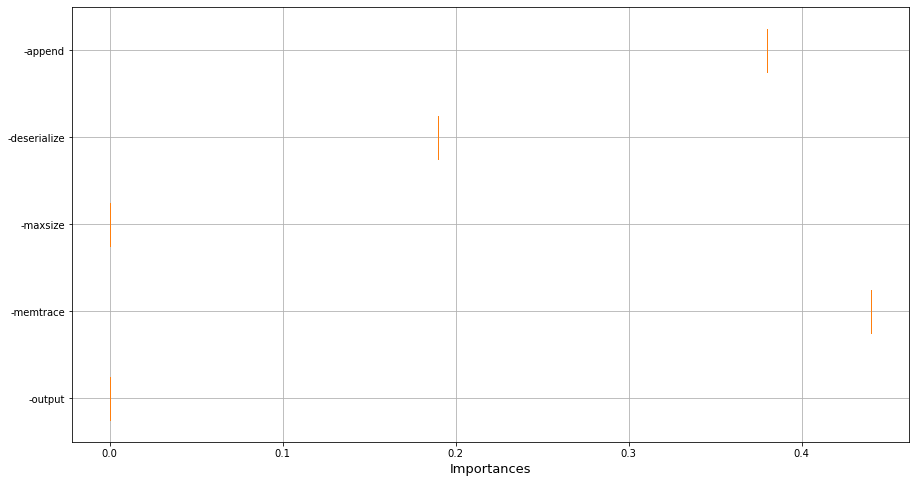

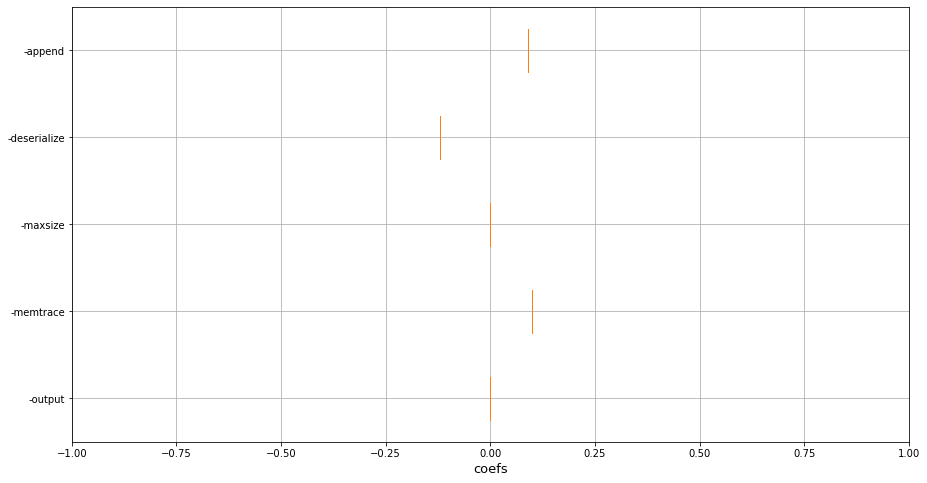


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    6.139423e-01
tab1    8.560096e+04
tab2    3.424440e+06
tab4    8.560096e+05
tab5    1.141346e+05
tab6    4.565385e+05
tab8    5.706731e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


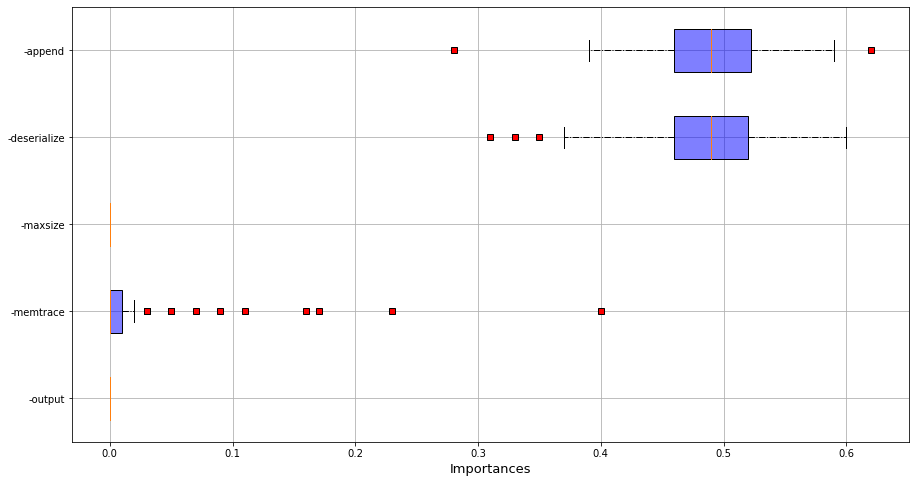

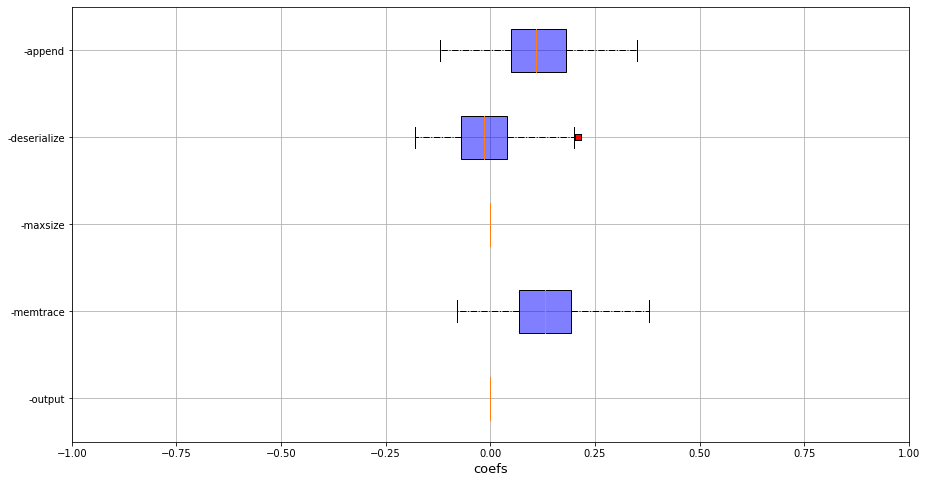


 RQ3 - Performance ratios

Mean =  1.0097504203339307
Std =  0.007141914490303204

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


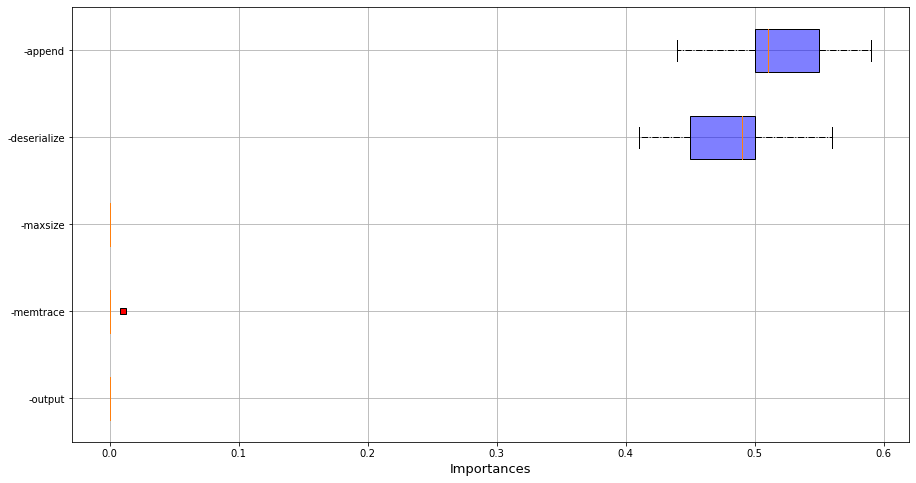

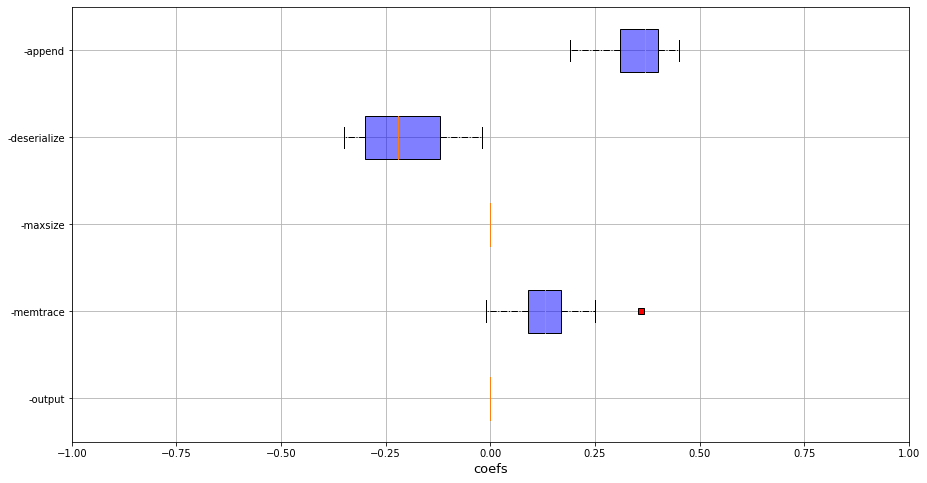


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q4 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


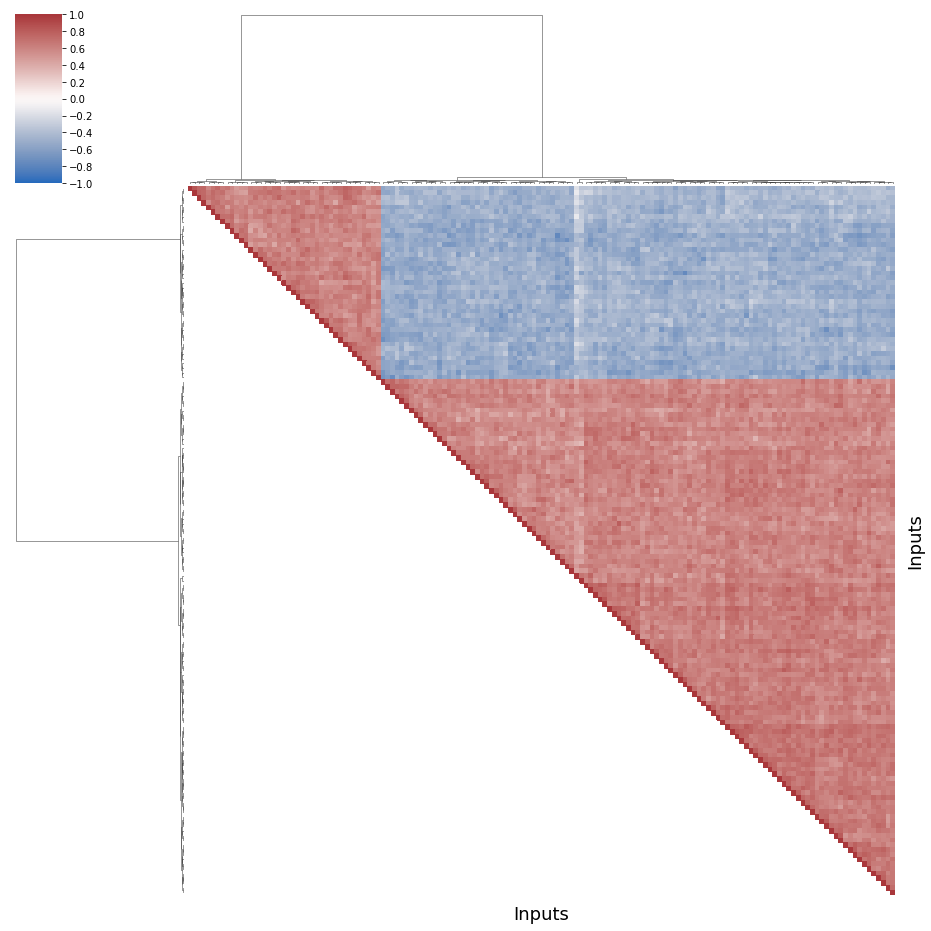


--
Group  1 
--

Properties

name        0.015
tab1     2250.000
tab2    90345.000
tab4    22500.000
tab5     3000.000
tab6    12000.000
tab8      150.000
dtype: float64


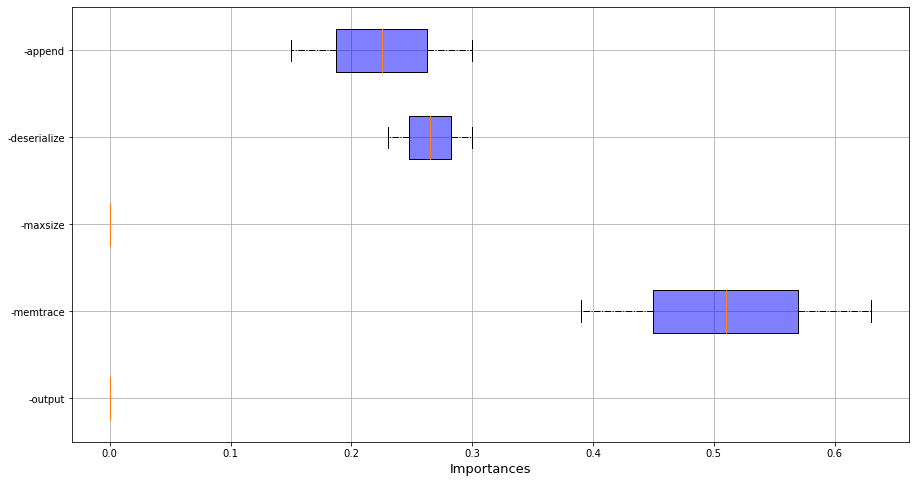

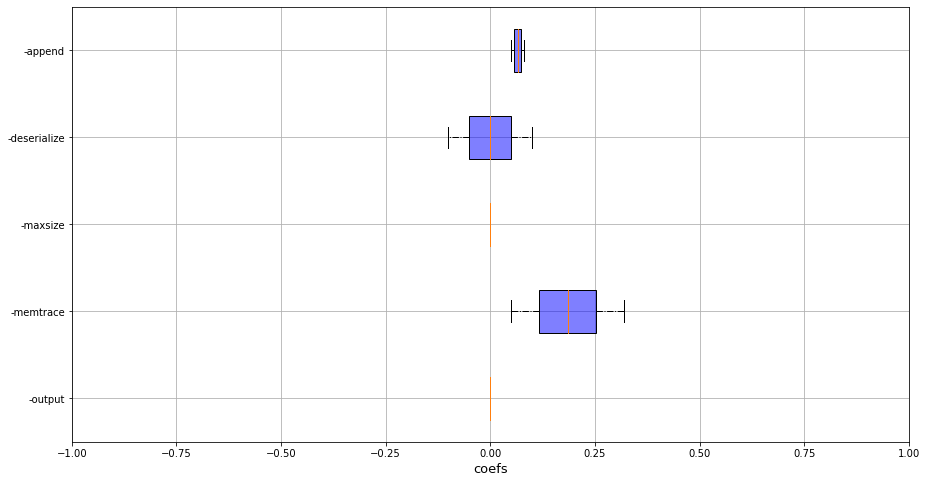


 RQ3 - Performance ratios

Mean =  1.0826203208556149
Std =  0.0644385026737968

--
Group  2 
--

Properties

name    5.481818e-01
tab1    7.631818e+04
tab2    3.053100e+06
tab4    7.631818e+05
tab5    1.017576e+05
tab6    4.070303e+05
tab8    5.087879e+03
dtype: float64


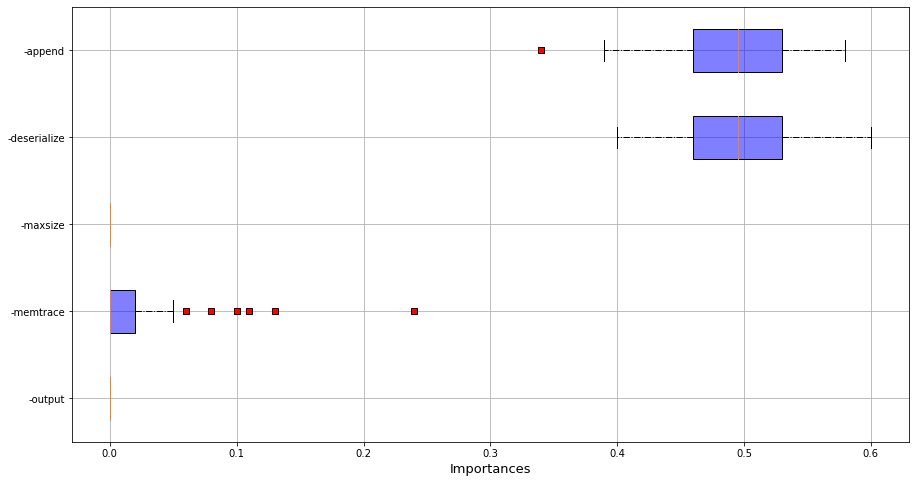

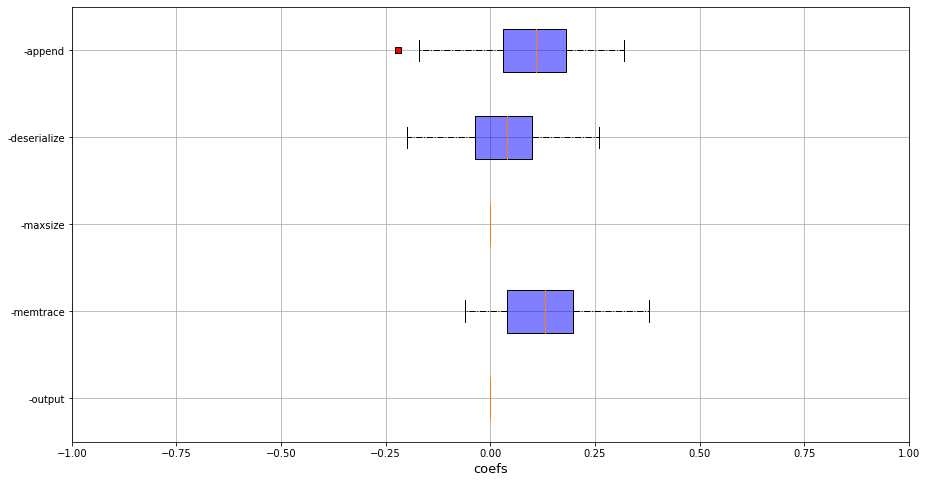


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    6.778049e-01
tab1    9.471951e+04
tab2    3.789216e+06
tab4    9.471951e+05
tab5    1.262927e+05
tab6    5.051707e+05
tab8    6.314634e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


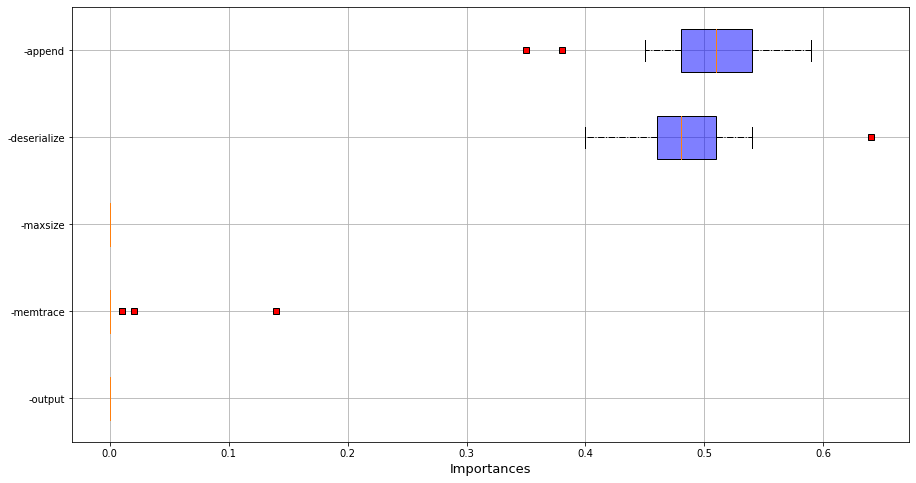

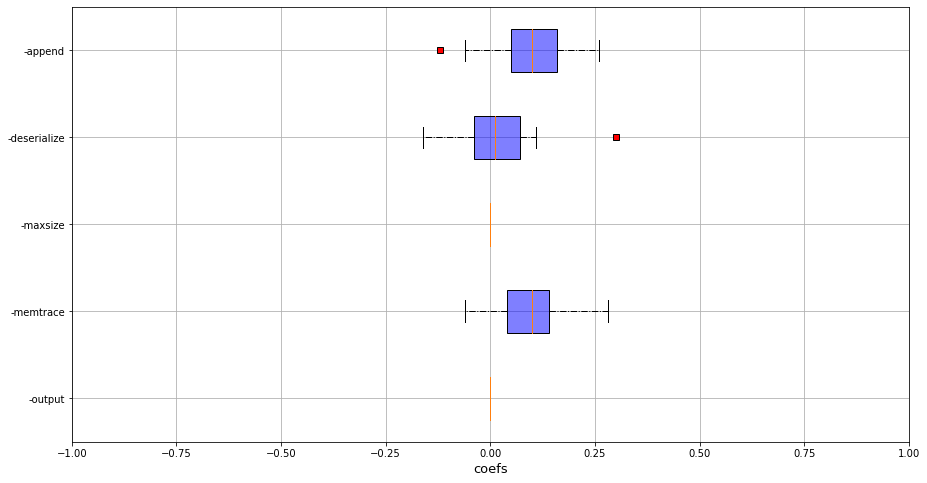


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


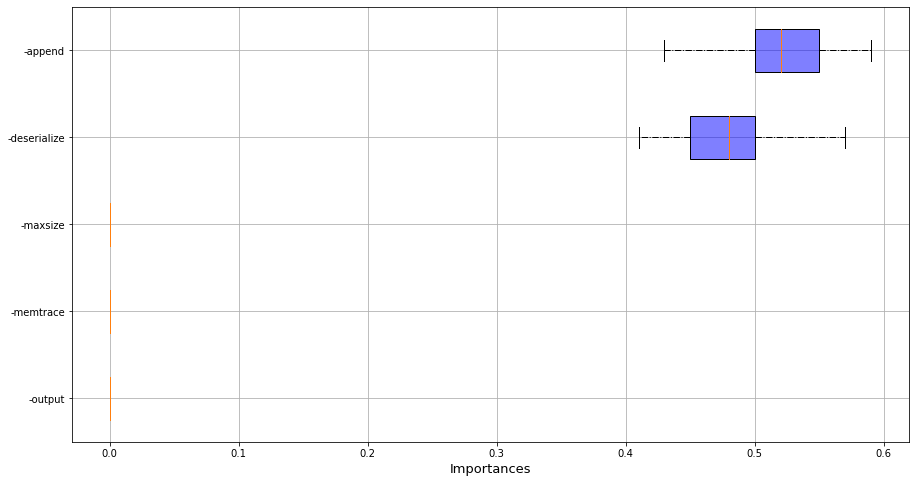

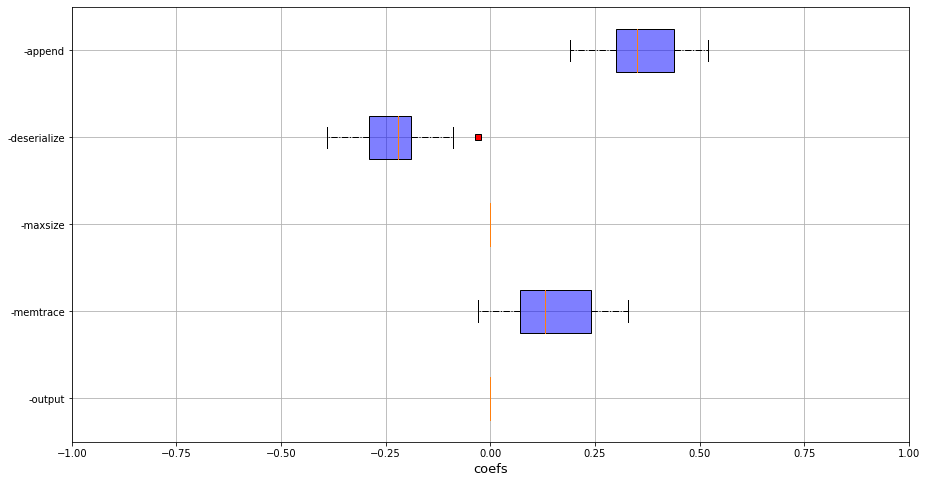


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q5 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


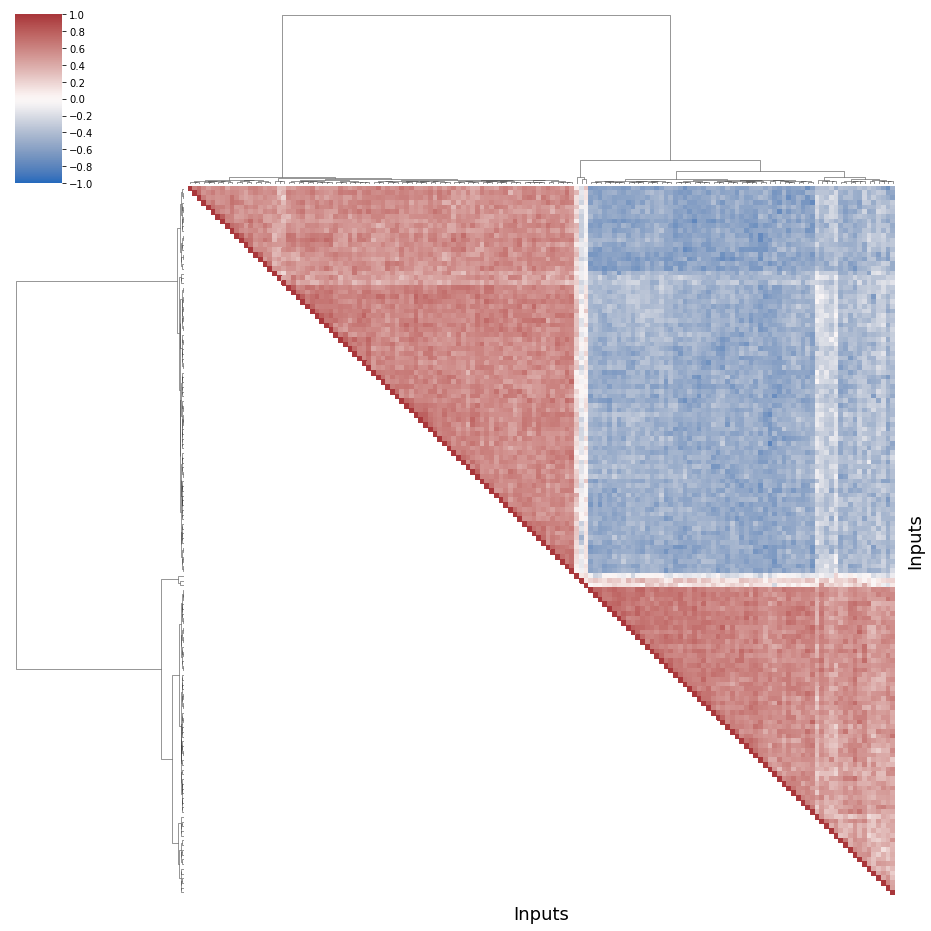


--
Group  1 
--

Properties

name    3.205882e-01
tab1    4.808824e+04
tab2    1.923962e+06
tab4    4.808824e+05
tab5    6.411765e+04
tab6    2.564706e+05
tab8    3.205882e+03
dtype: float64


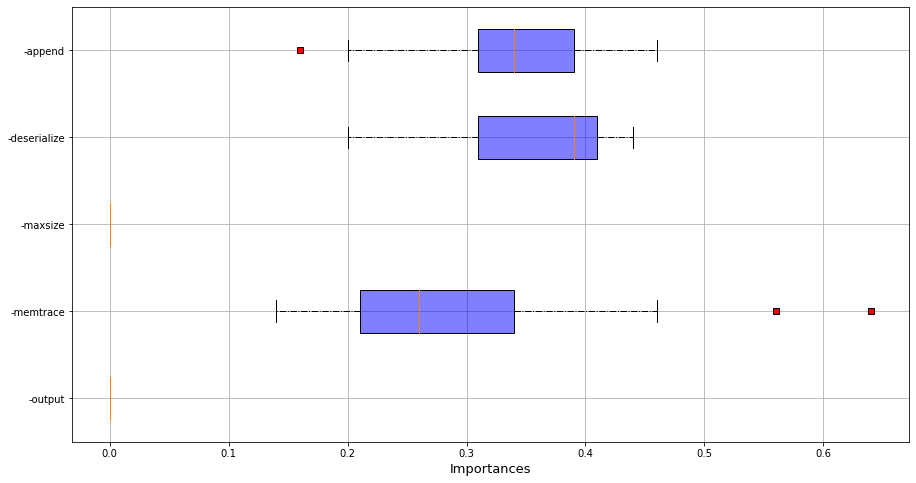

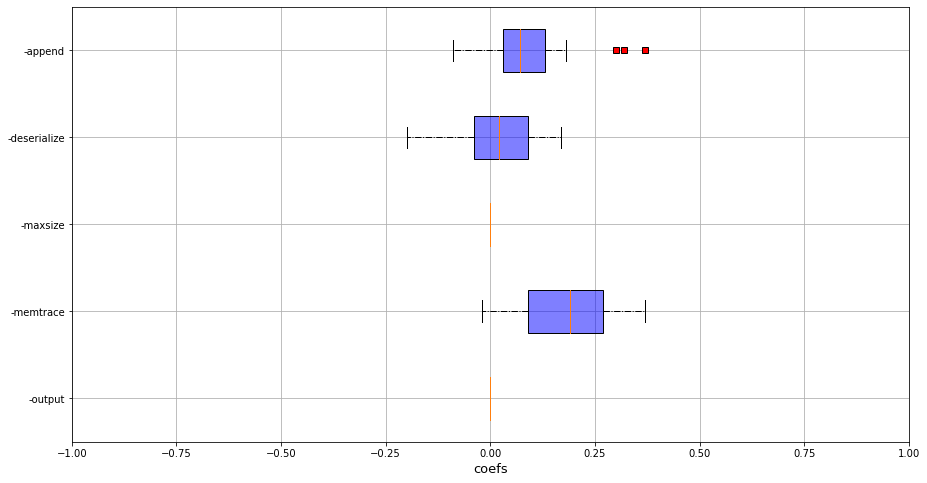


 RQ3 - Performance ratios

Mean =  1.1026195253399365
Std =  0.061722447983804815

--
Group  2 
--

Properties

name    4.633333e-01
tab1    6.950000e+04
tab2    2.780373e+06
tab4    6.950000e+05
tab5    9.266667e+04
tab6    3.706667e+05
tab8    4.633333e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


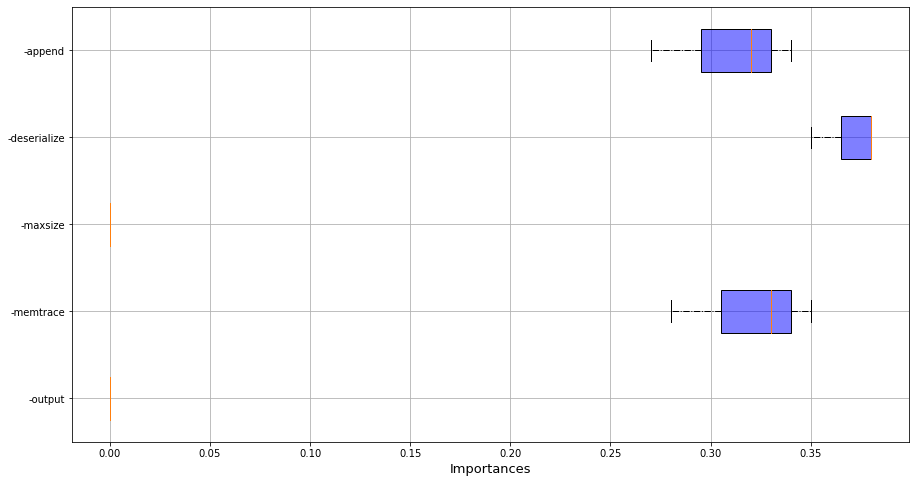

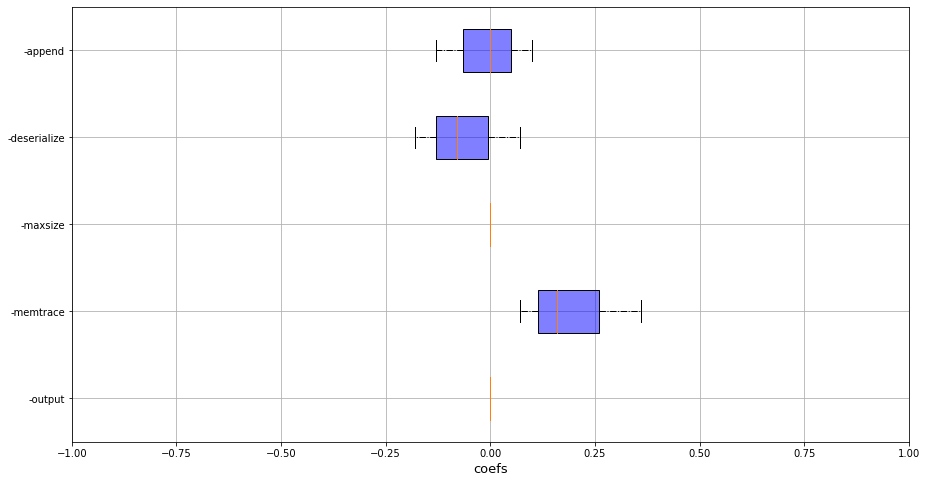


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    3.462500e-01
tab1    5.193750e+04
tab2    2.077531e+06
tab4    5.193750e+05
tab5    6.925000e+04
tab6    2.770000e+05
tab8    3.462500e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


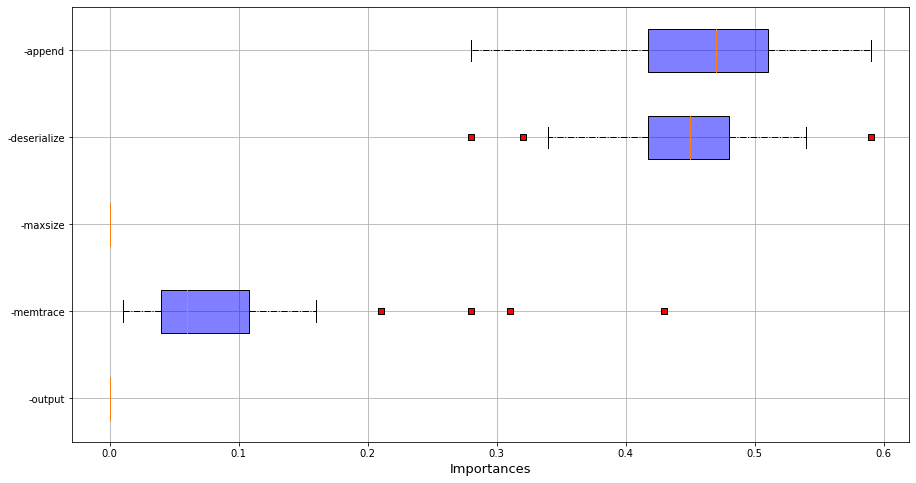

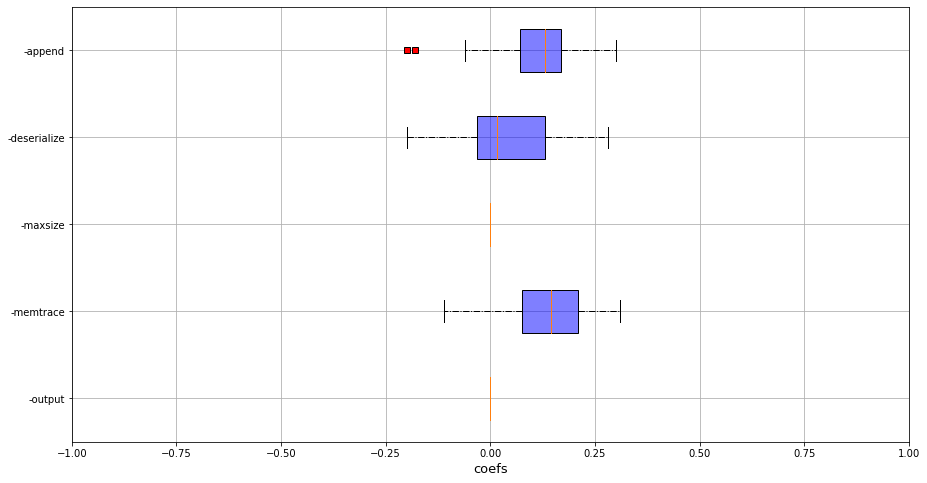


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    2.494390e+00
tab1    3.330000e+05
tab2    1.331931e+07
tab4    3.330000e+06
tab5    4.440000e+05
tab6    1.776000e+06
tab8    2.220000e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


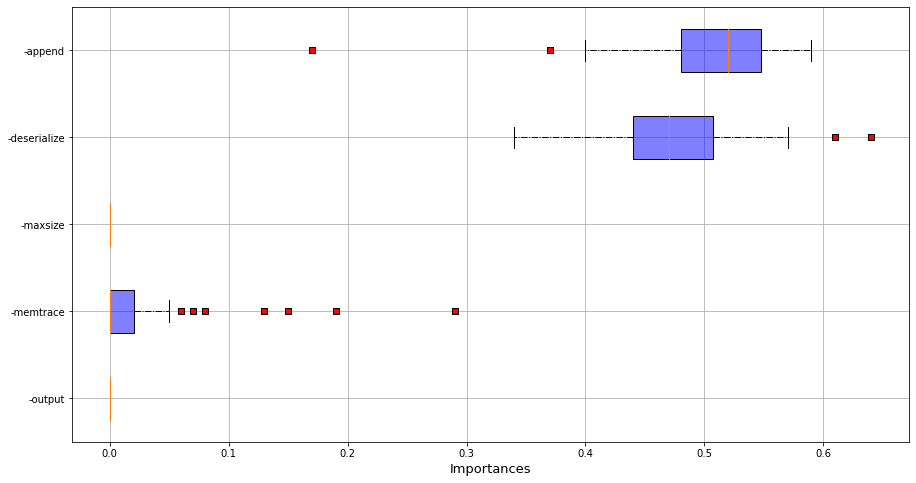

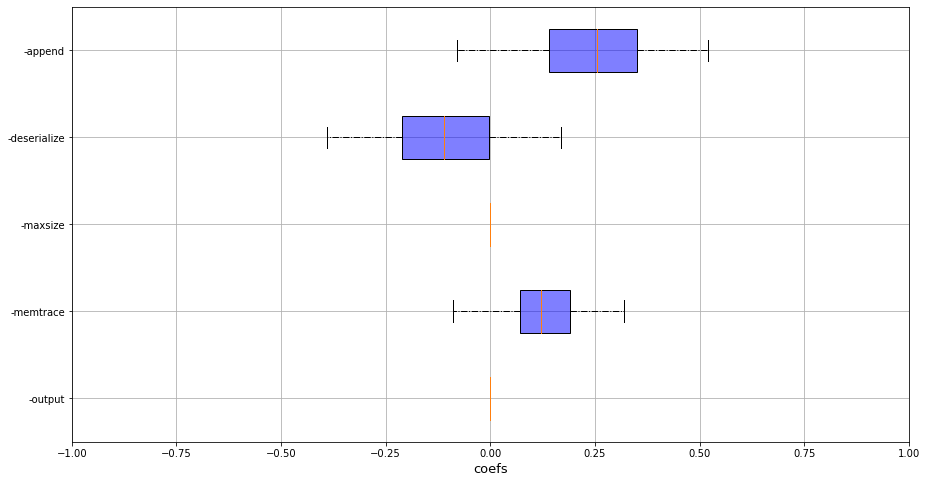


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q6 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


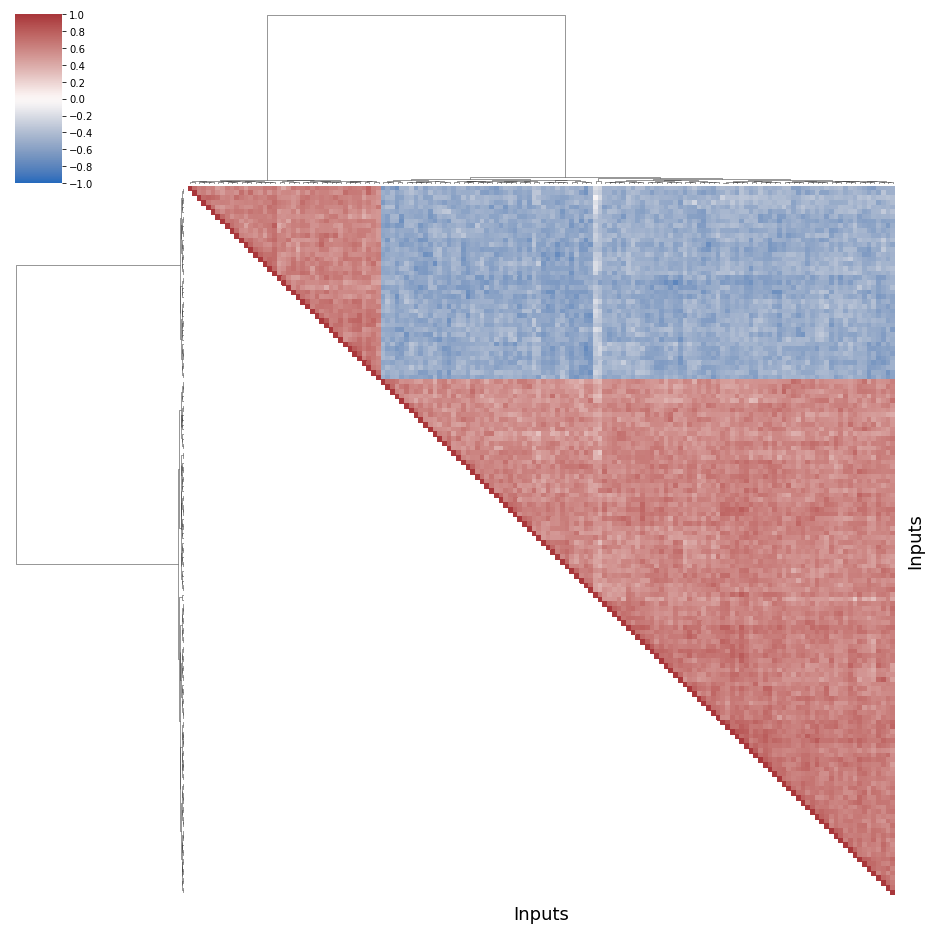


--
Group  1 
--

Properties

name        0.015
tab1     2250.000
tab2    90345.000
tab4    22500.000
tab5     3000.000
tab6    12000.000
tab8      150.000
dtype: float64


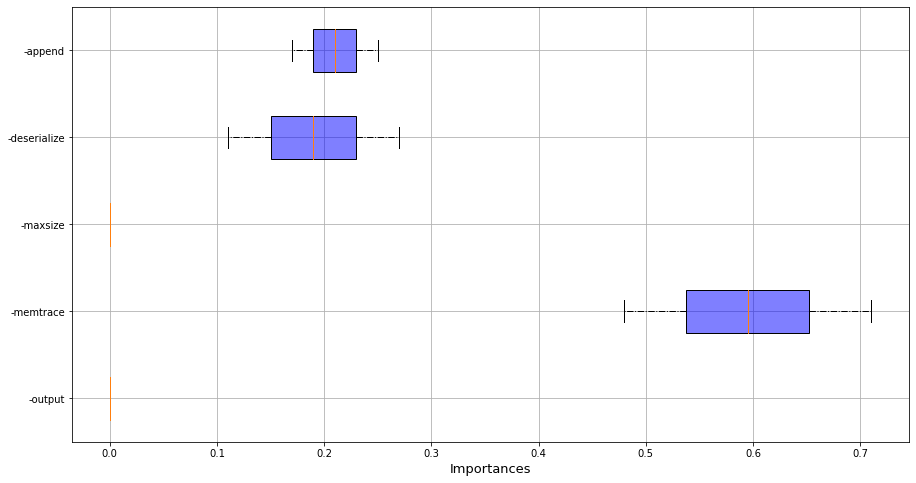

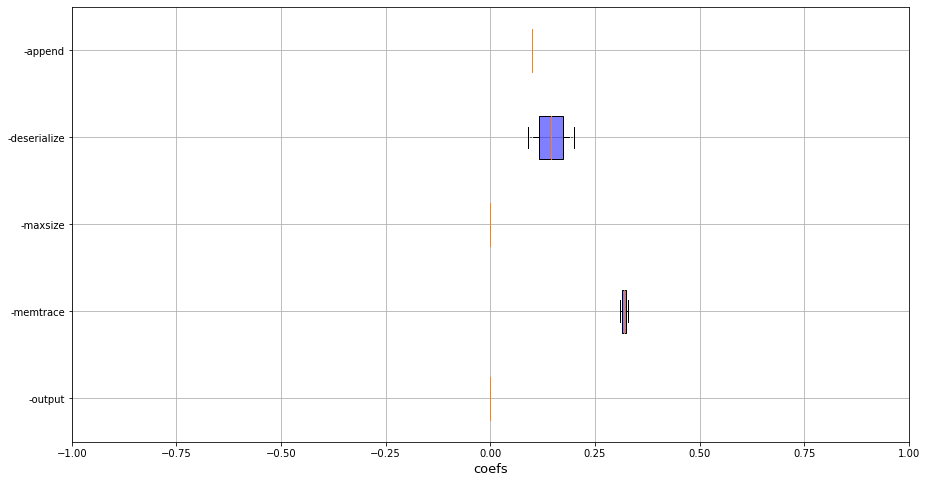


 RQ3 - Performance ratios

Mean =  1.2142353770260748
Std =  0.028188865398167562

--
Group  2 
--

Properties

name    5.884444e-01
tab1    8.126667e+04
tab2    3.250989e+06
tab4    8.126667e+05
tab5    1.083556e+05
tab6    4.334222e+05
tab8    5.417778e+03
dtype: float64


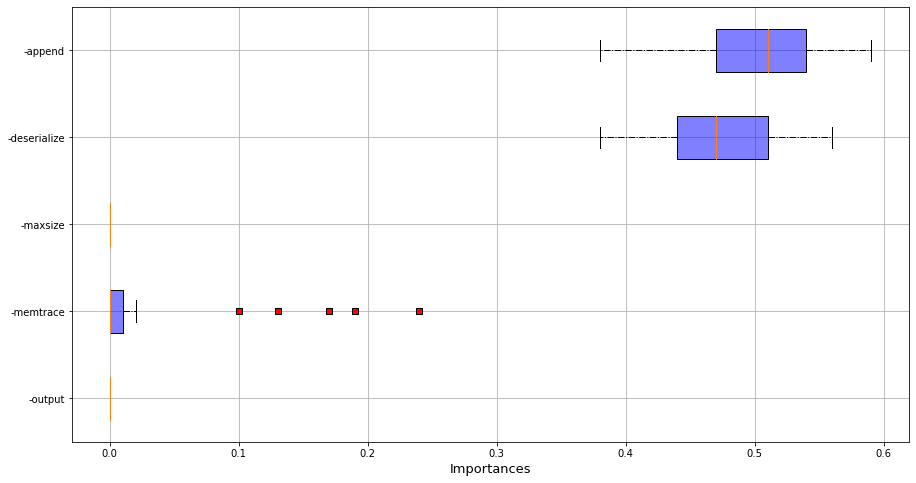

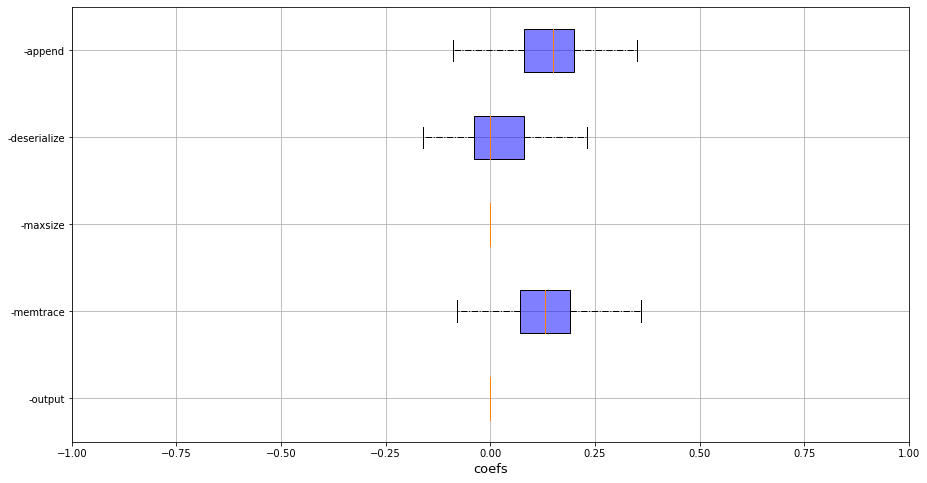


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    6.046774e-01
tab1    8.489516e+04
tab2    3.396257e+06
tab4    8.489516e+05
tab5    1.131935e+05
tab6    4.527742e+05
tab8    5.659677e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


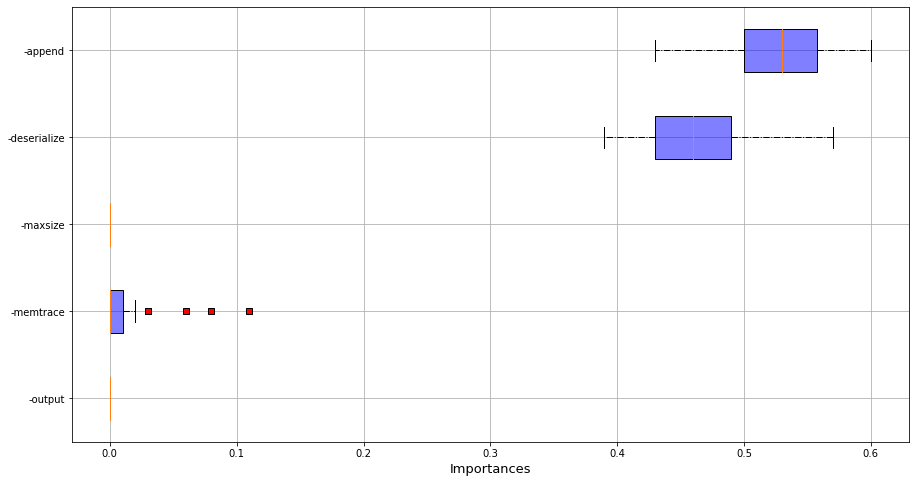

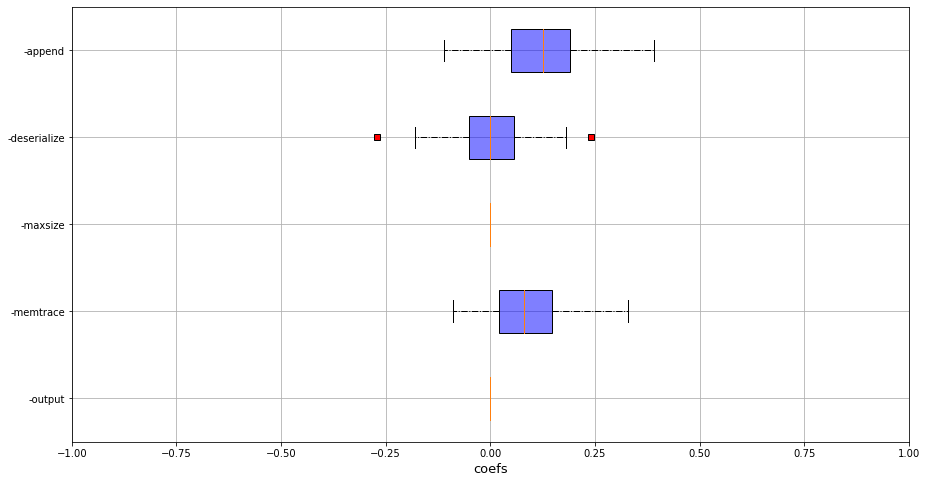


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


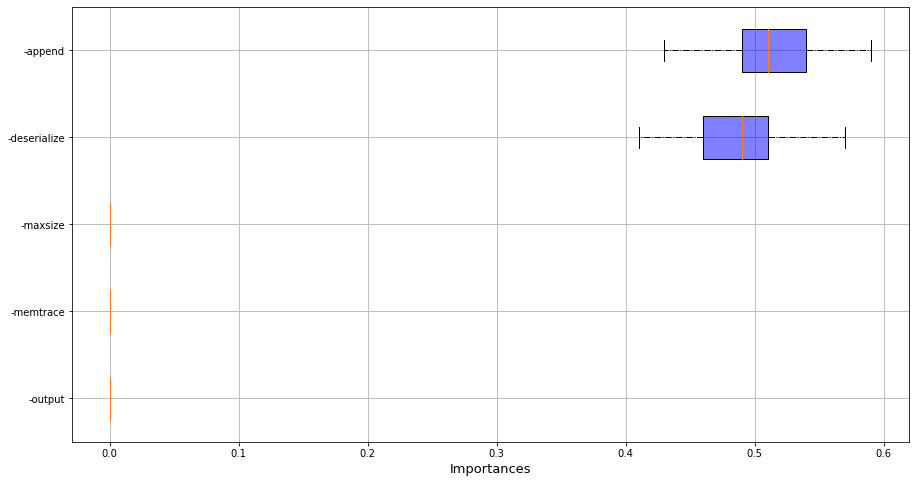

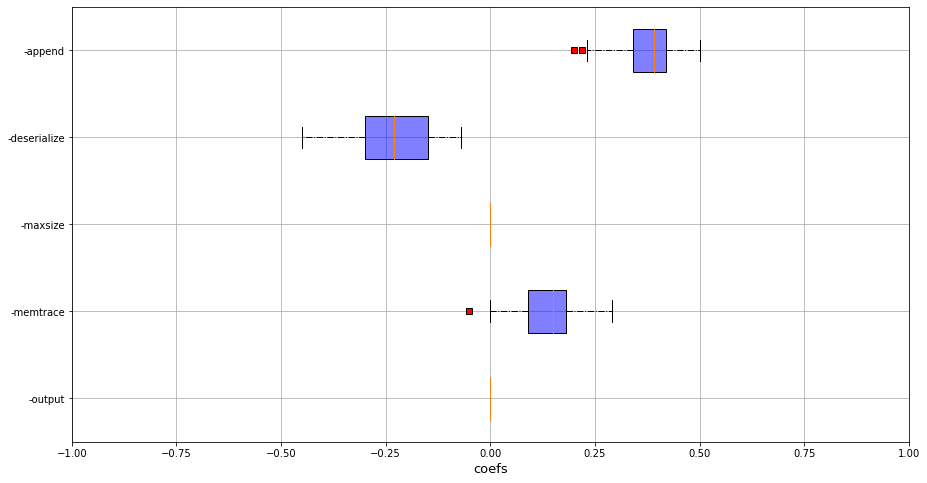


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q7 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


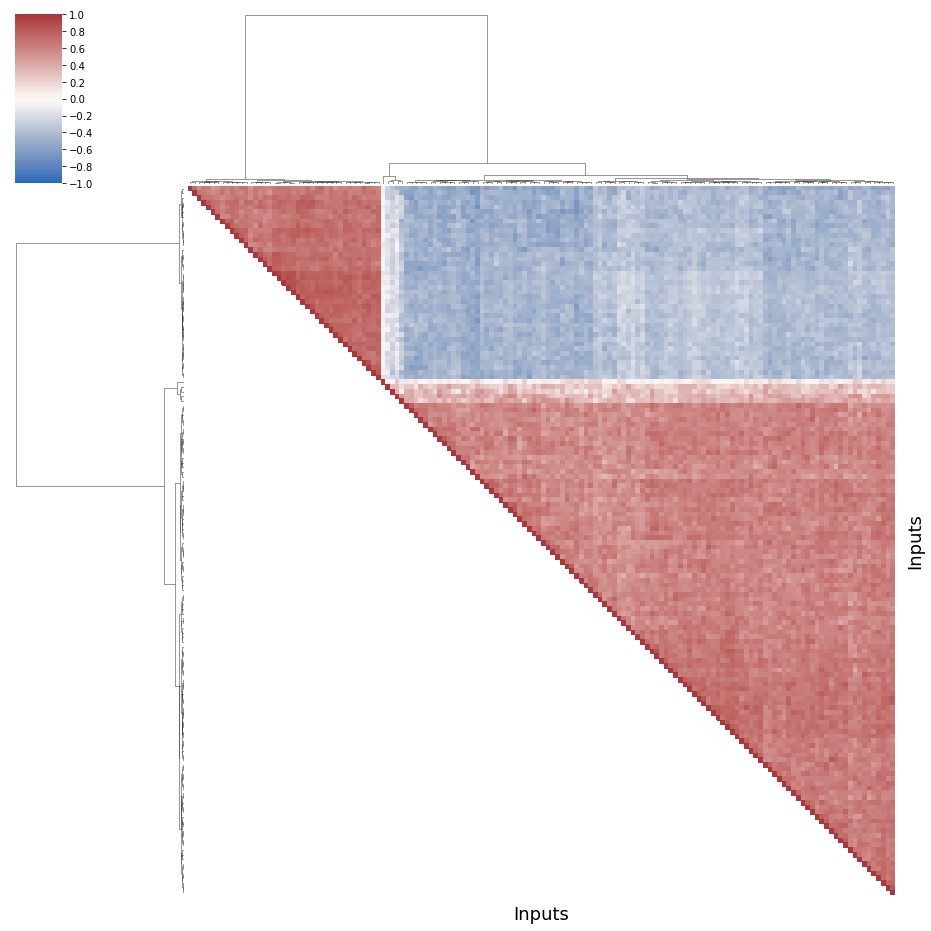


--
Group  1 
--

Properties

name         0.03
tab1      4500.00
tab2    180272.40
tab4     45000.00
tab5      6000.00
tab6     24000.00
tab8       300.00
dtype: float64


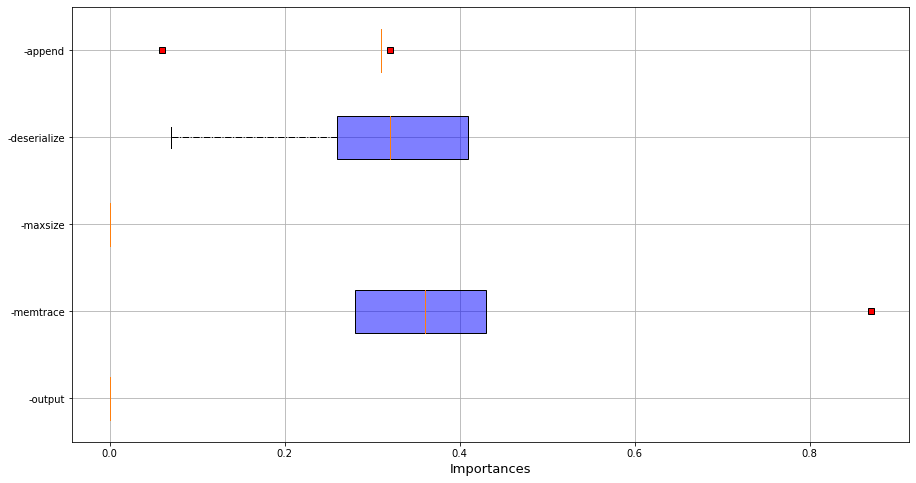

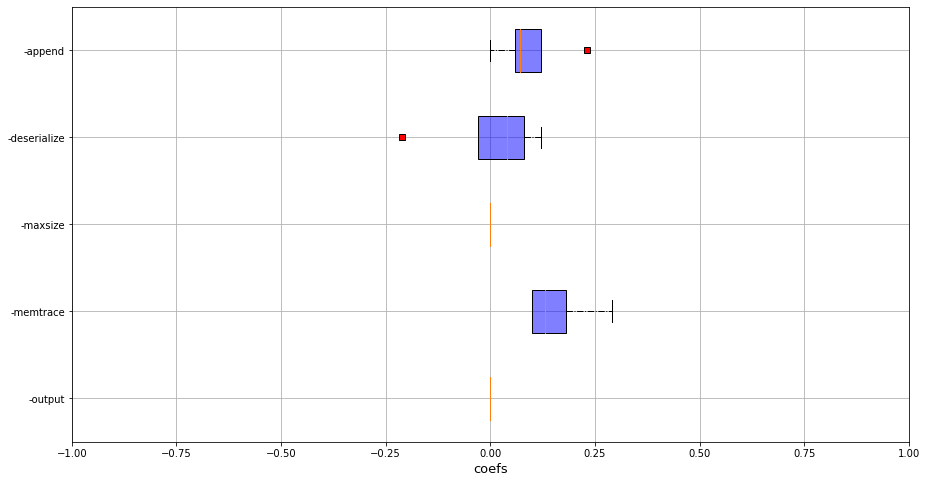


 RQ3 - Performance ratios

Mean =  1.050494776798098
Std =  0.03395598304215958

--
Group  2 
--

Properties

name    7.346875e-01
tab1    9.965625e+04
tab2    3.986745e+06
tab4    9.965625e+05
tab5    1.328750e+05
tab6    5.315000e+05
tab8    6.643750e+03
dtype: float64


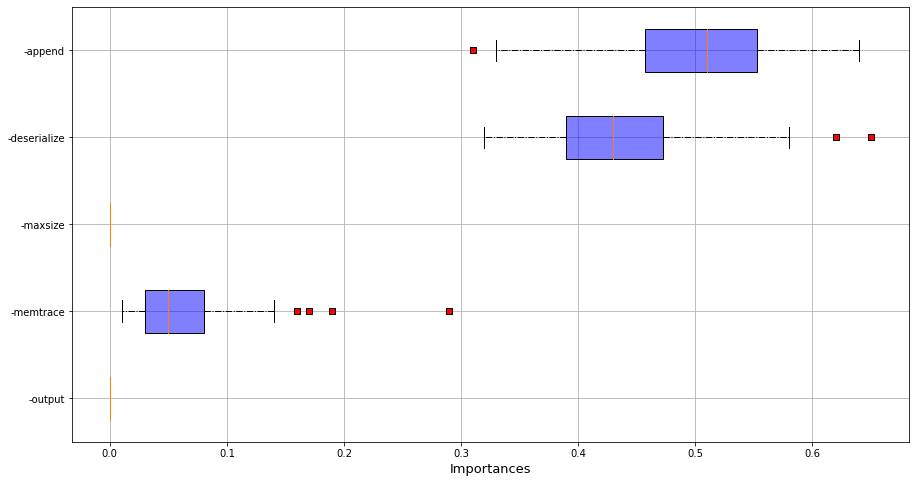

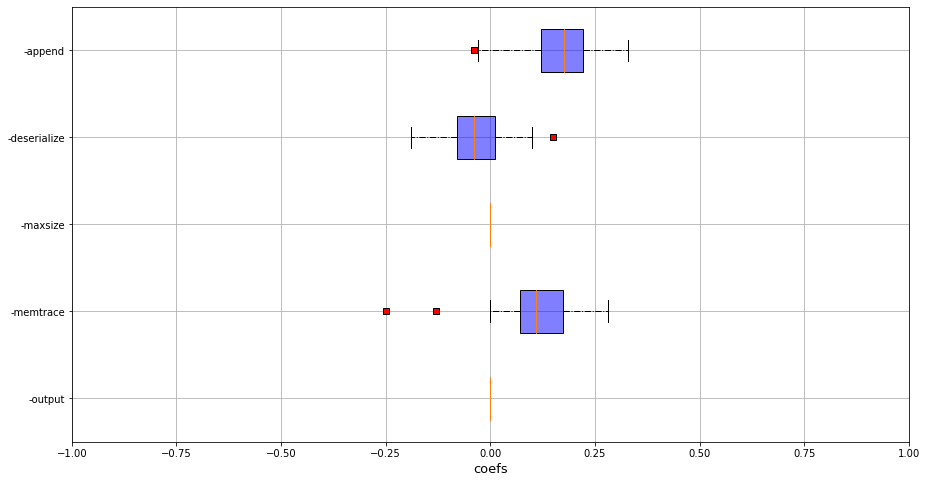


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    4.207500e-01
tab1    6.311250e+04
tab2    2.524752e+06
tab4    6.311250e+05
tab5    8.415000e+04
tab6    3.366000e+05
tab8    4.207500e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


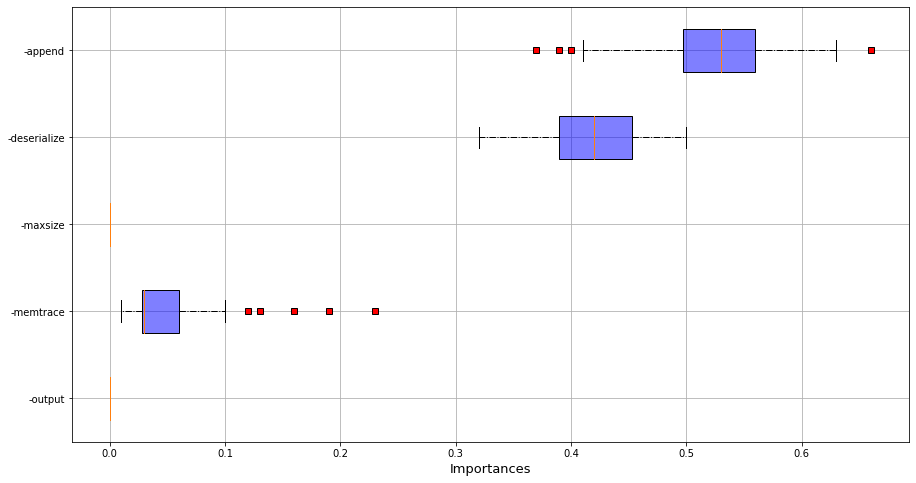

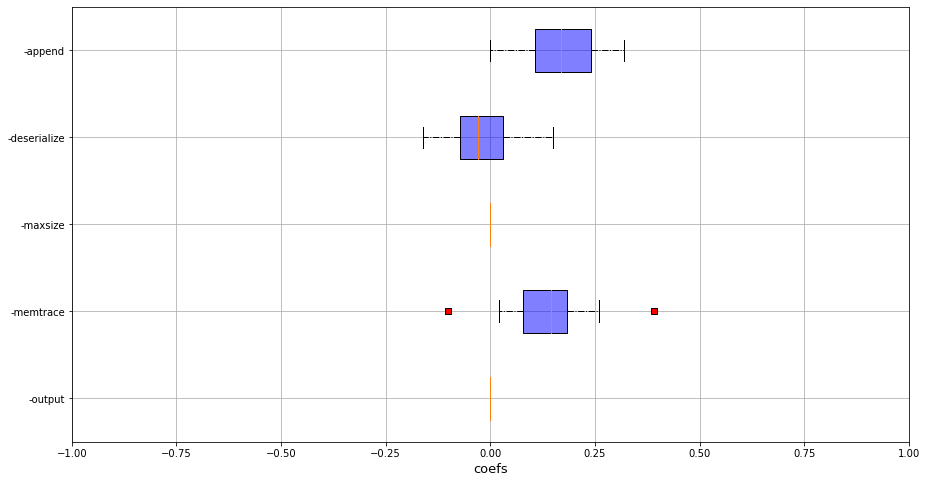


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


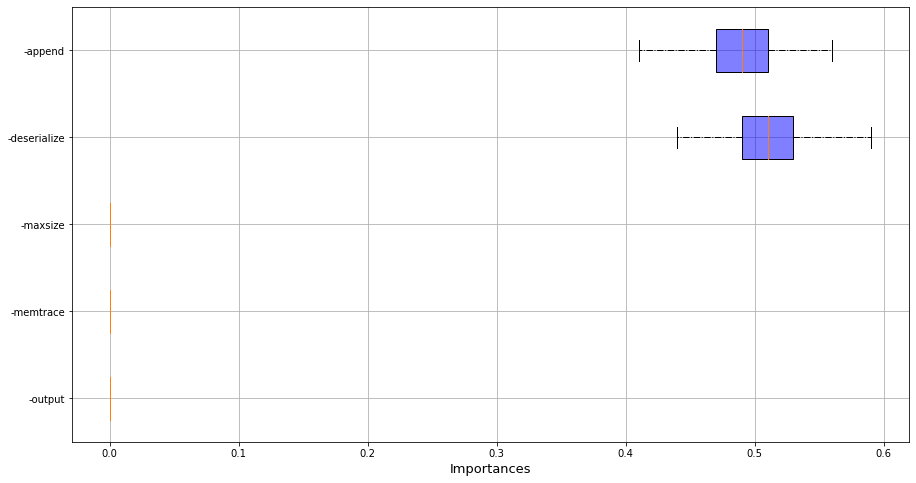

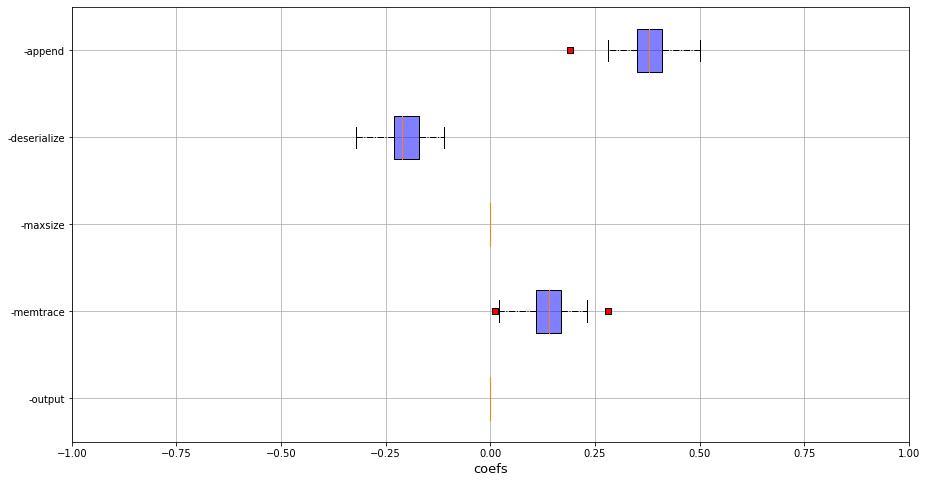


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q8 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


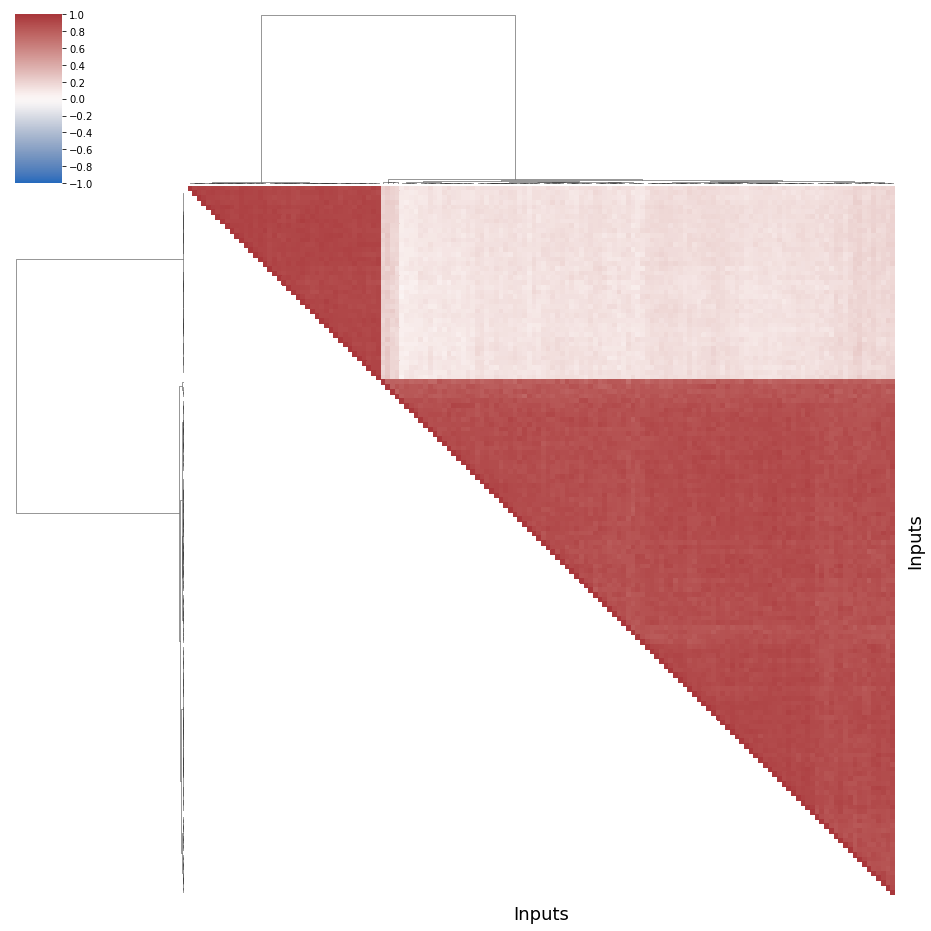


--
Group  1 
--

Properties

name         0.025
tab1      3750.000
tab2    150387.000
tab4     37500.000
tab5      5000.000
tab6     20000.000
tab8       250.000
dtype: float64


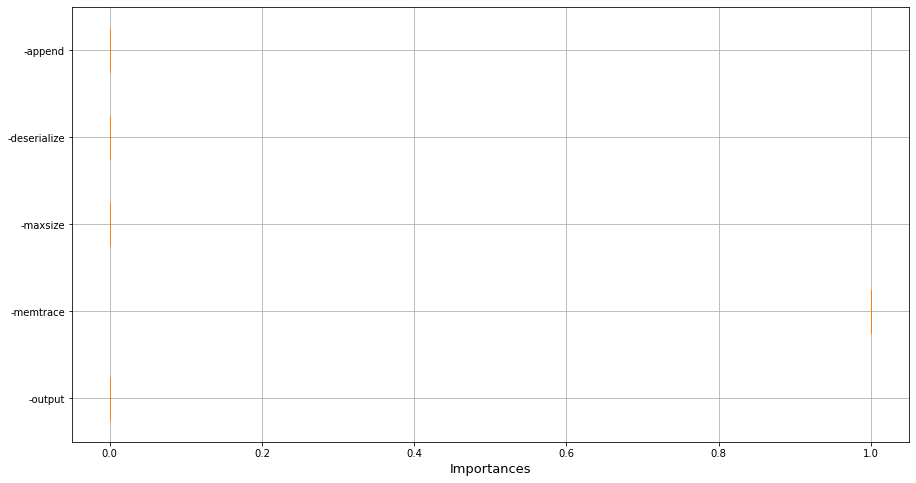

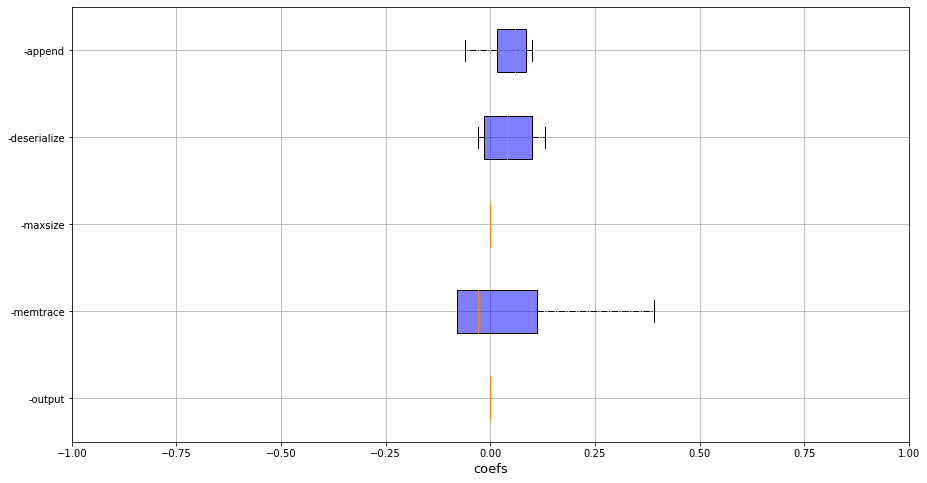


 RQ3 - Performance ratios

Mean =  1.1016264145660286
Std =  0.03461339662070167

--
Group  2 
--

Properties

name    4.450000e-01
tab1    6.415385e+04
tab2    2.566355e+06
tab4    6.415385e+05
tab5    8.553846e+04
tab6    3.421538e+05
tab8    4.276923e+03
dtype: float64


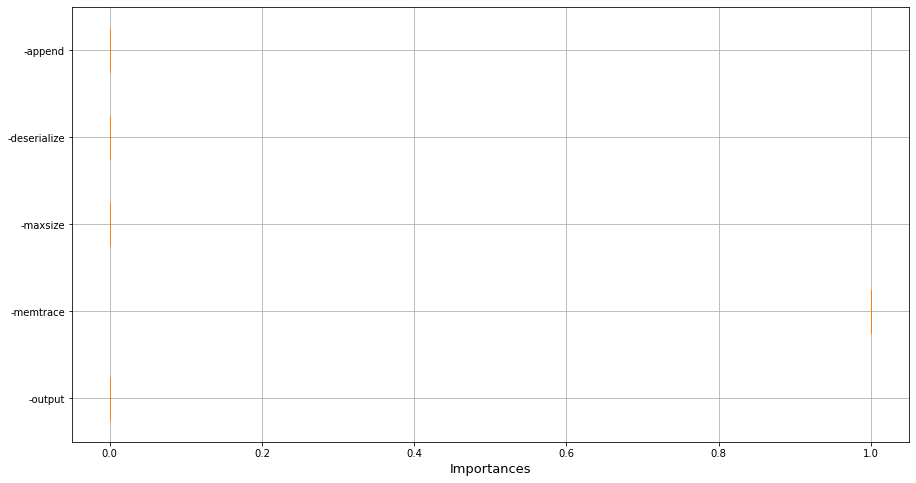

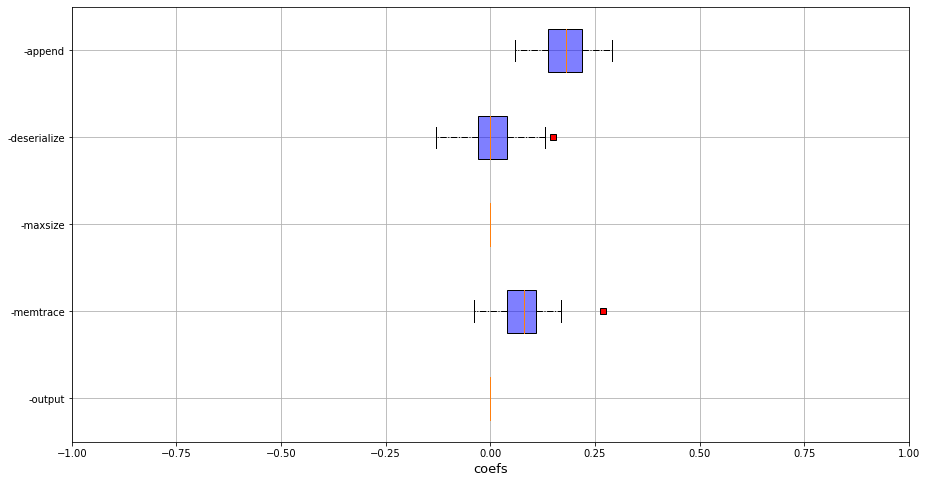


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    7.690566e-01
tab1    1.051698e+05
tab2    4.207380e+06
tab4    1.051698e+06
tab5    1.402264e+05
tab6    5.609057e+05
tab8    7.011321e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


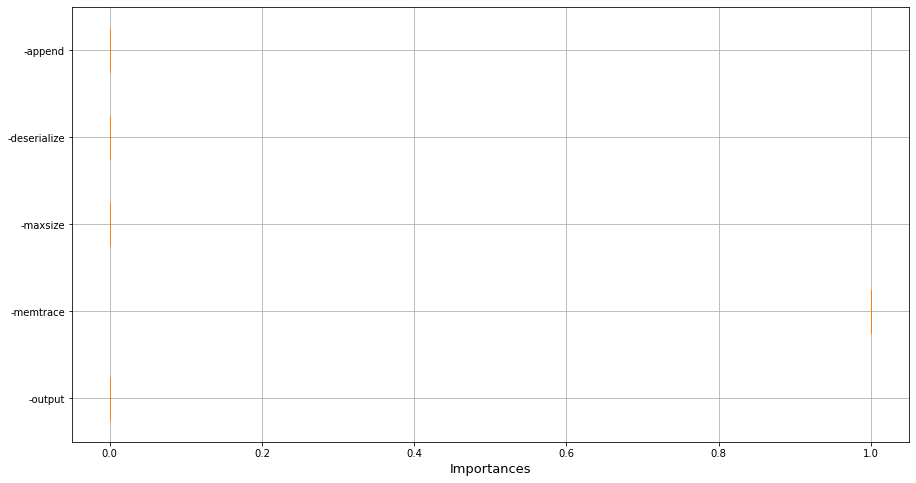

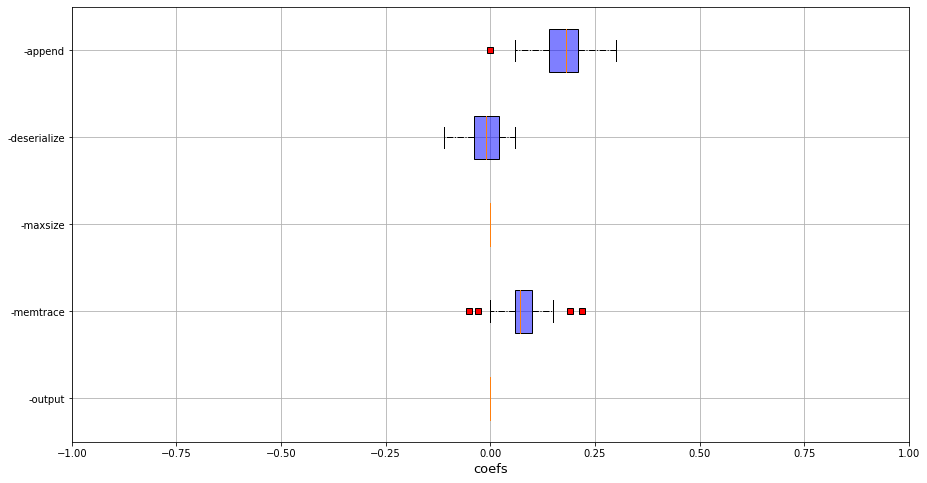


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


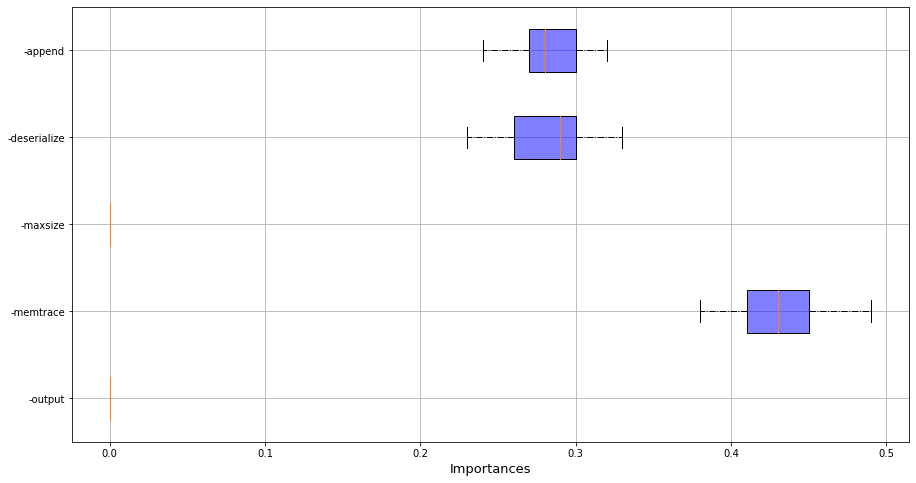

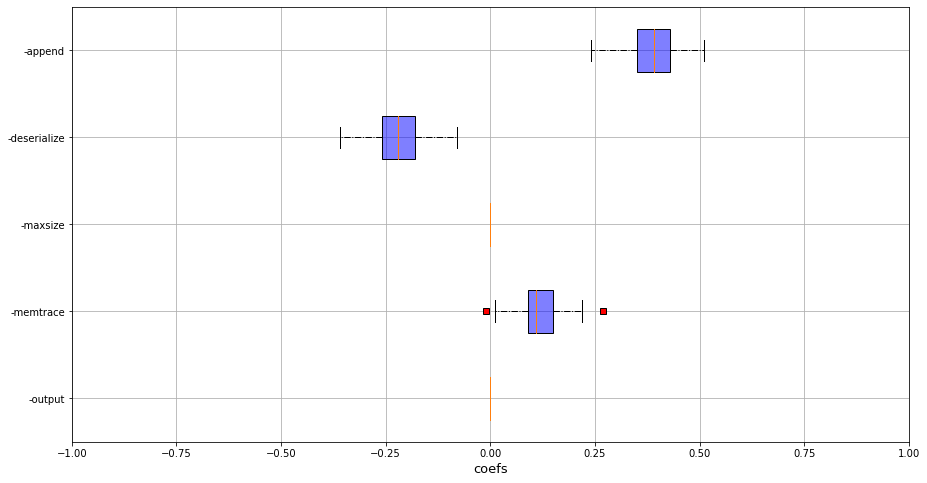


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q9 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


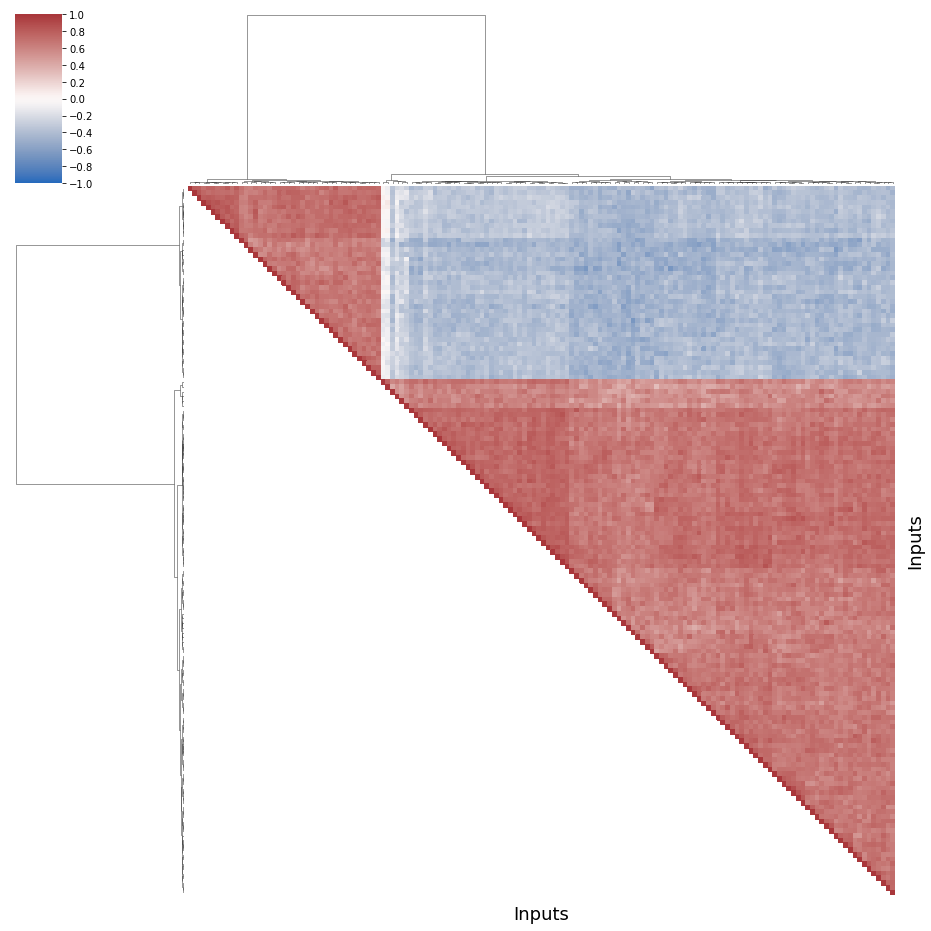


--
Group  1 
--

Properties

name         0.035
tab1      5250.000
tab2    210181.500
tab4     52500.000
tab5      7000.000
tab6     28000.000
tab8       350.000
dtype: float64


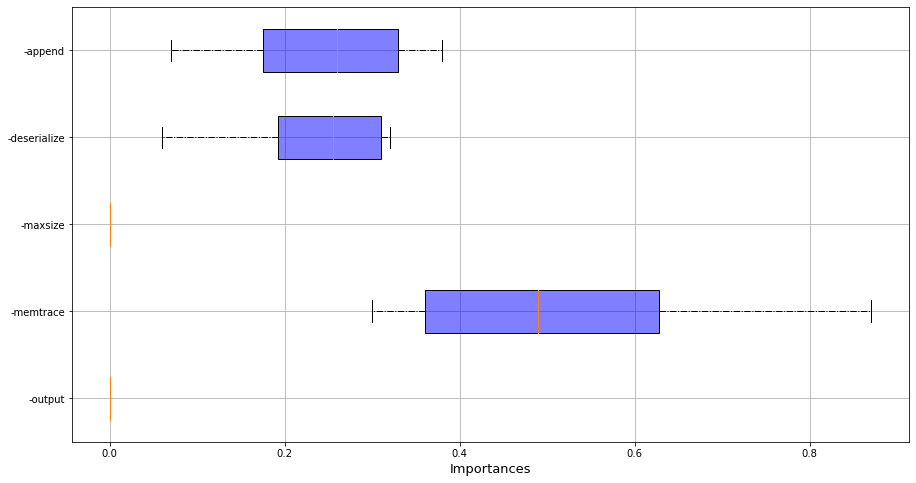

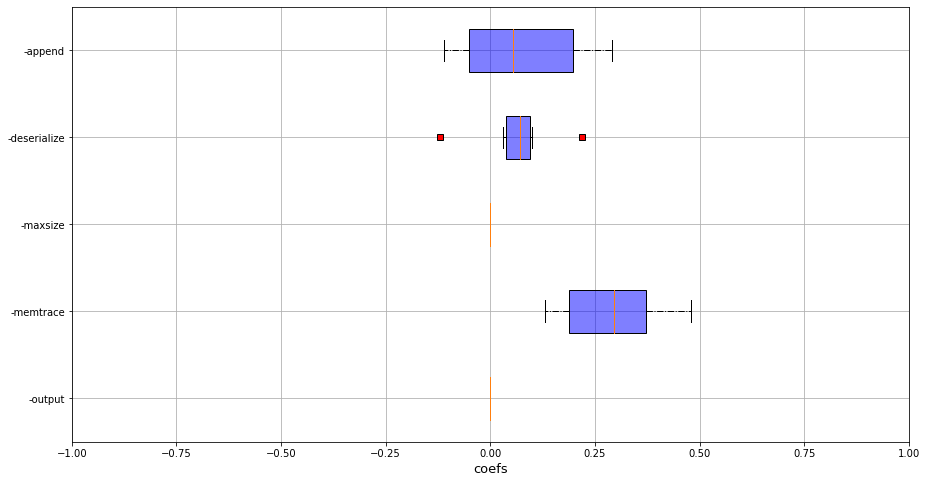


 RQ3 - Performance ratios

Mean =  1.1090252876794988
Std =  0.06994306066983891

--
Group  2 
--

Properties

name    4.994118e-01
tab1    6.917647e+04
tab2    2.767318e+06
tab4    6.917647e+05
tab5    9.223529e+04
tab6    3.689412e+05
tab8    4.611765e+03
dtype: float64


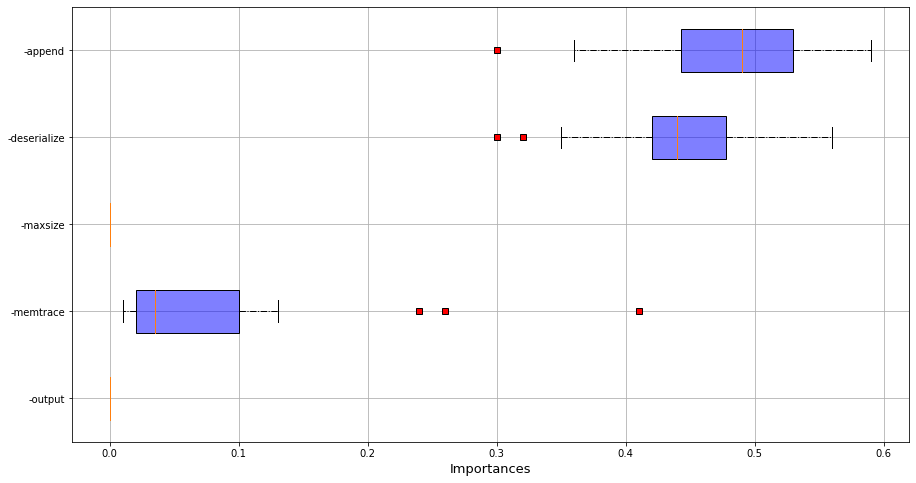

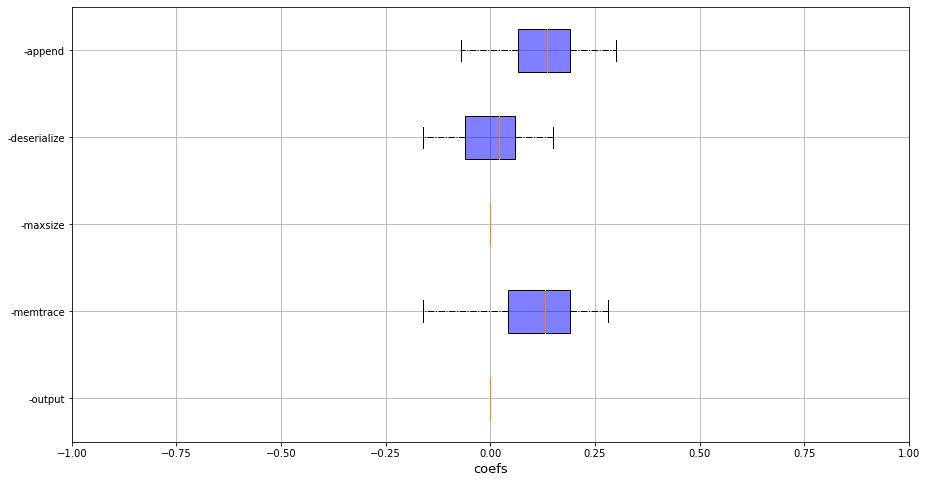


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    6.784058e-01
tab1    9.480435e+04
tab2    3.792655e+06
tab4    9.480435e+05
tab5    1.264058e+05
tab6    5.056232e+05
tab8    6.320290e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


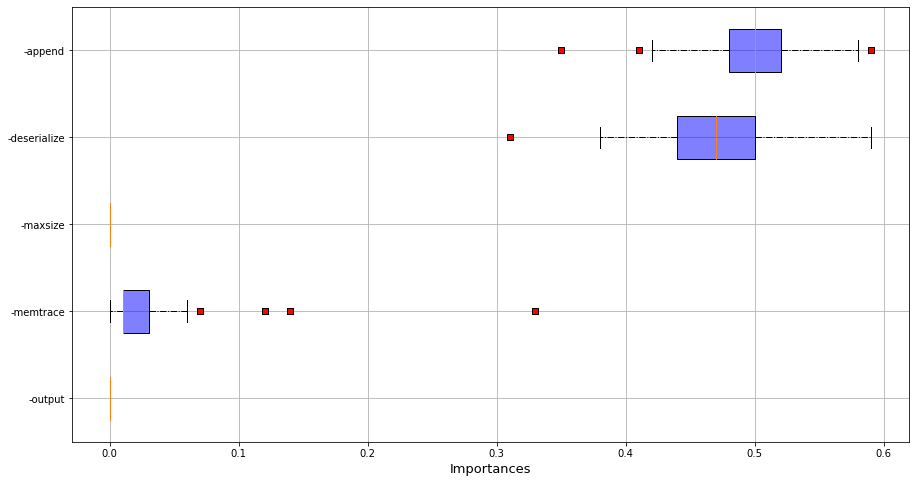

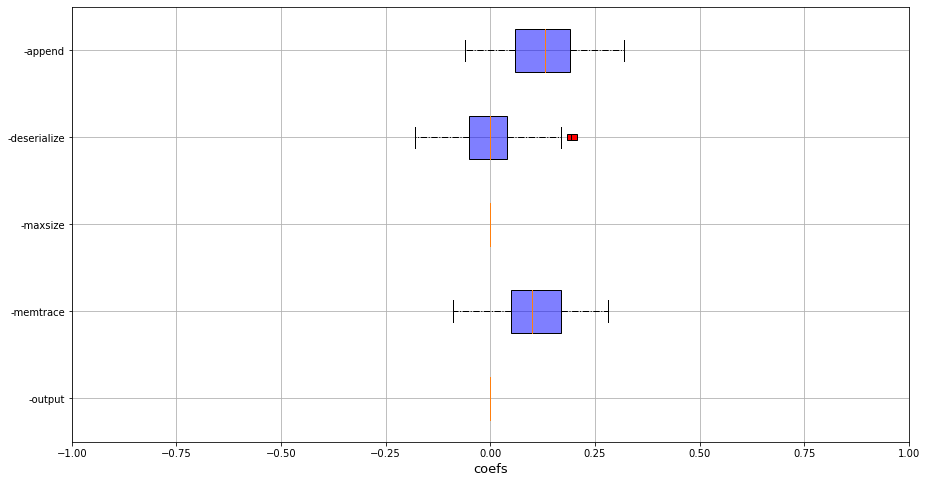


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


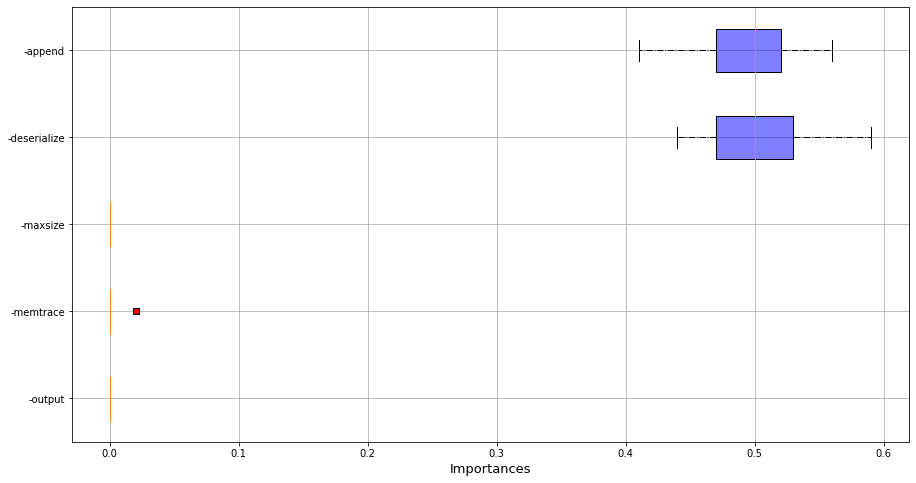

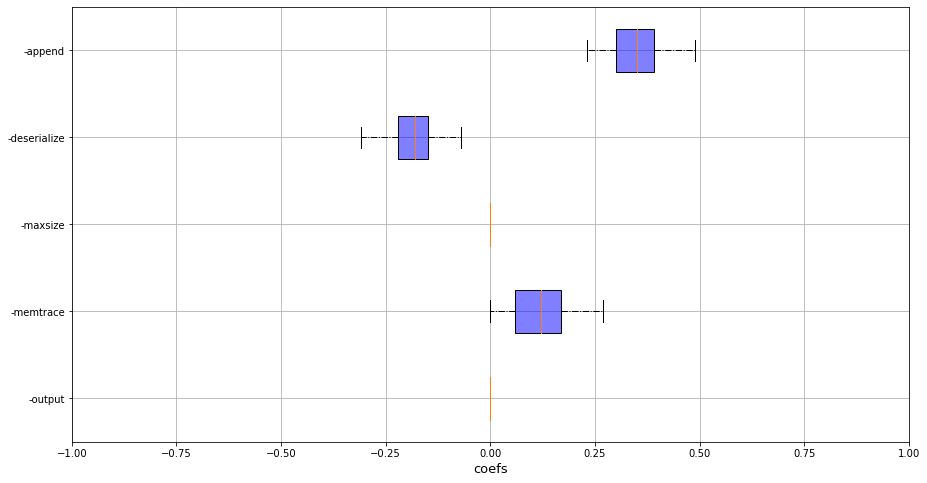


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q10 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


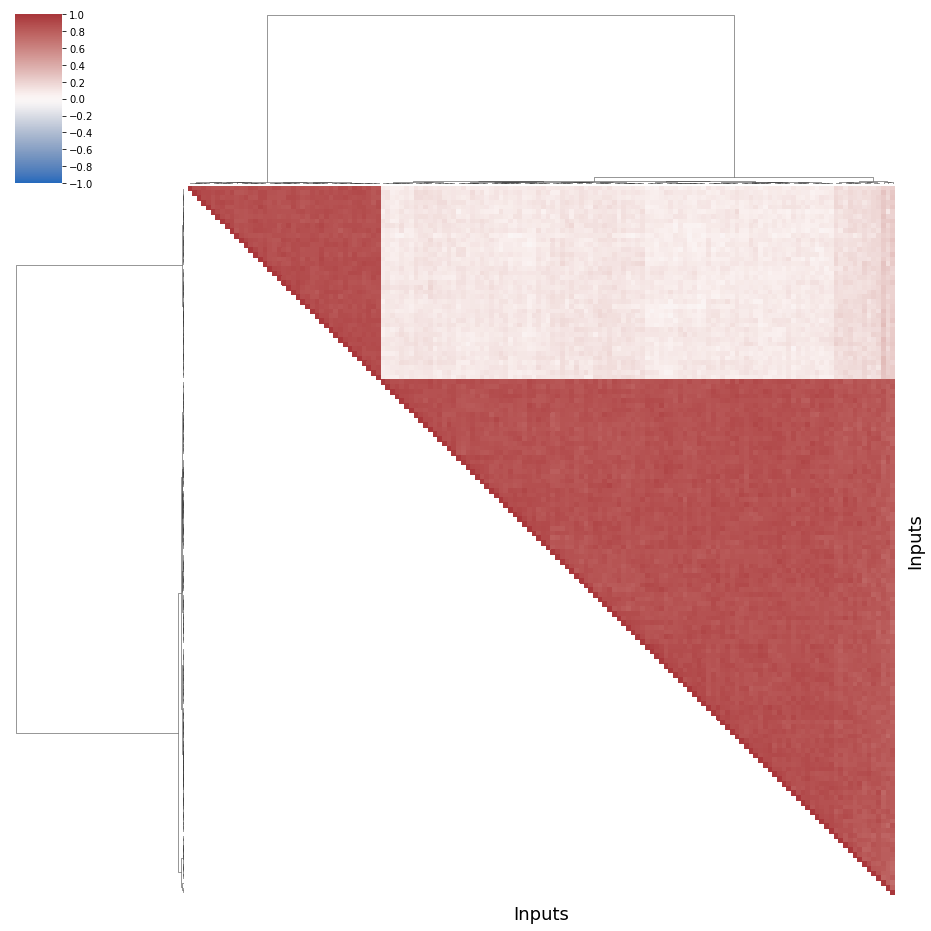


--
Group  1 
--

Properties

name          0.192
tab1      28800.000
tab2    1152031.400
tab4     288000.000
tab5      38400.000
tab6     153600.000
tab8       1920.000
dtype: float64


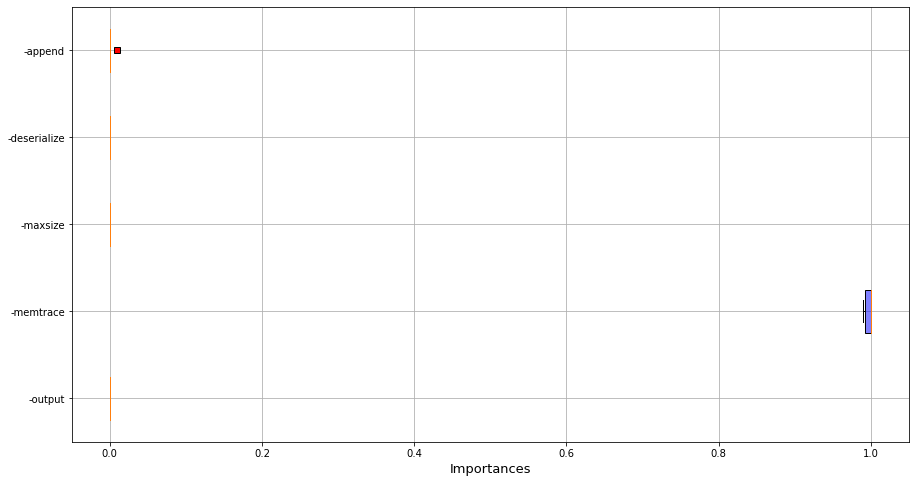

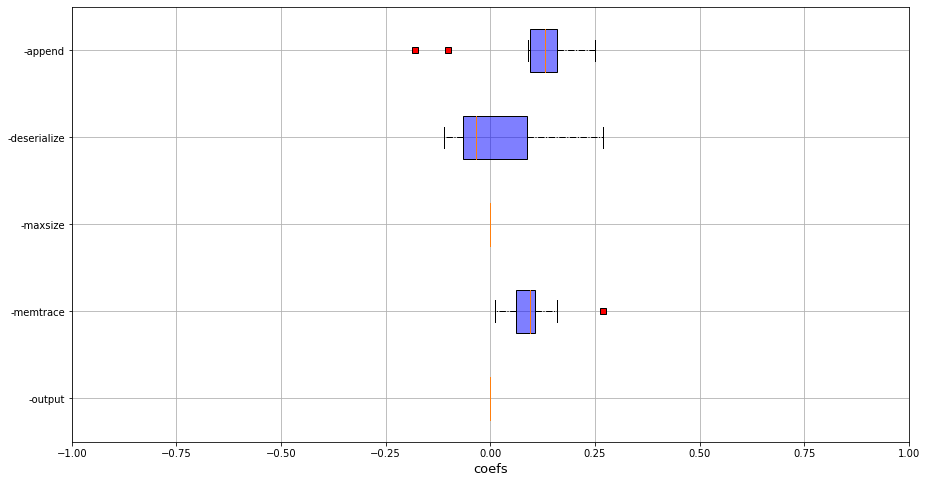


 RQ3 - Performance ratios

Mean =  1.0817092008086742
Std =  0.0

--
Group  2 
--

Properties

name         0.030000
tab1      4500.000000
tab2    180457.666667
tab4     45000.000000
tab5      6000.000000
tab6     24000.000000
tab8       300.000000
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


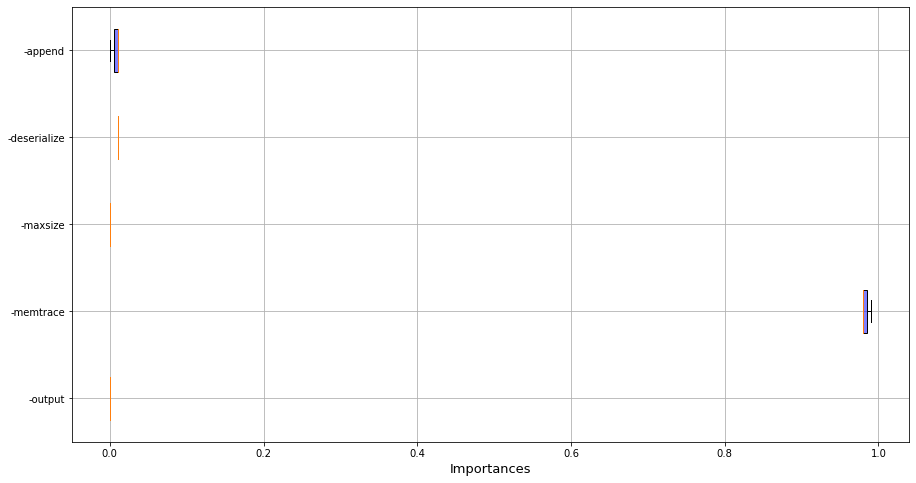

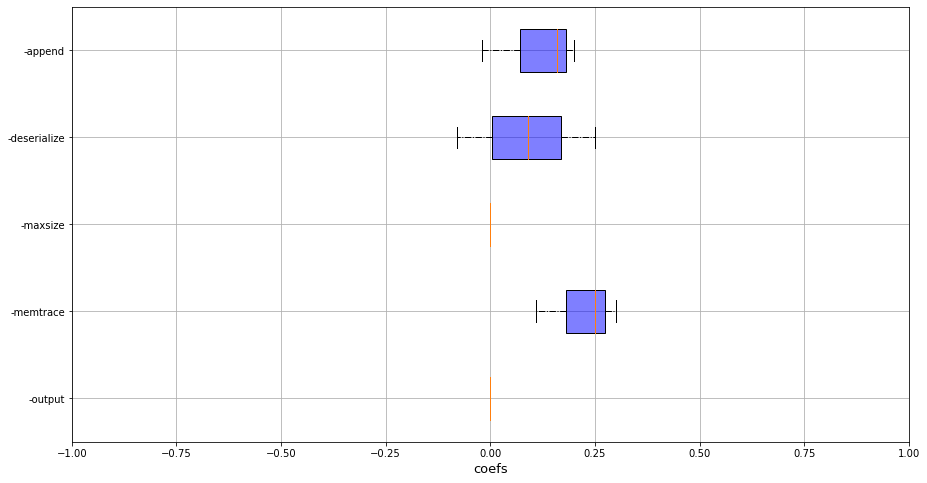


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    6.457292e-01
tab1    8.982812e+04
tab2    3.593557e+06
tab4    8.982812e+05
tab5    1.197708e+05
tab6    4.790833e+05
tab8    5.988542e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


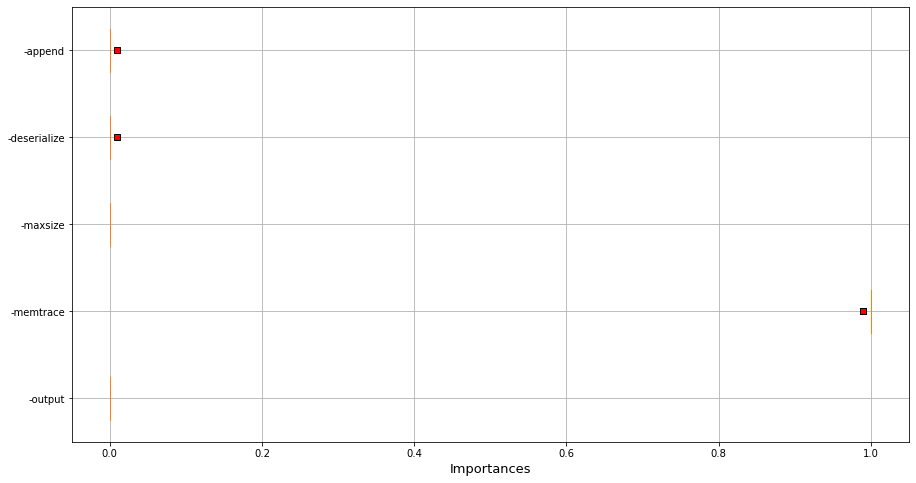

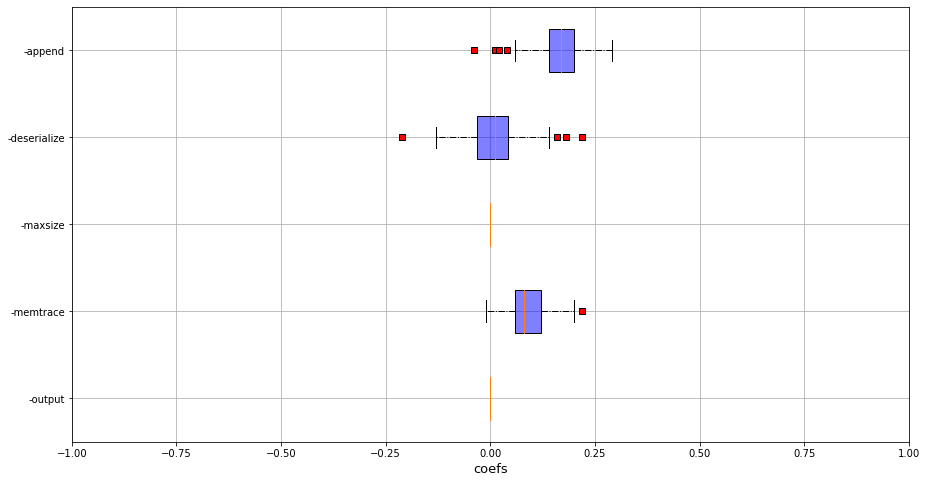


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


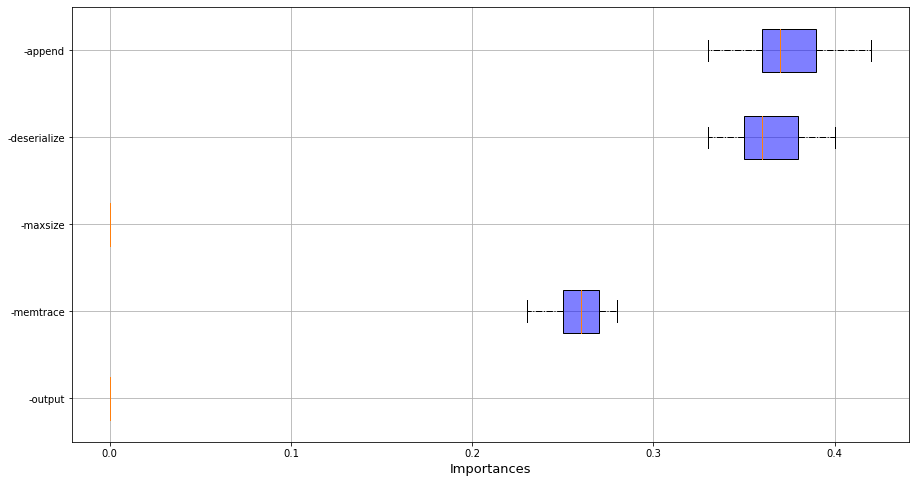

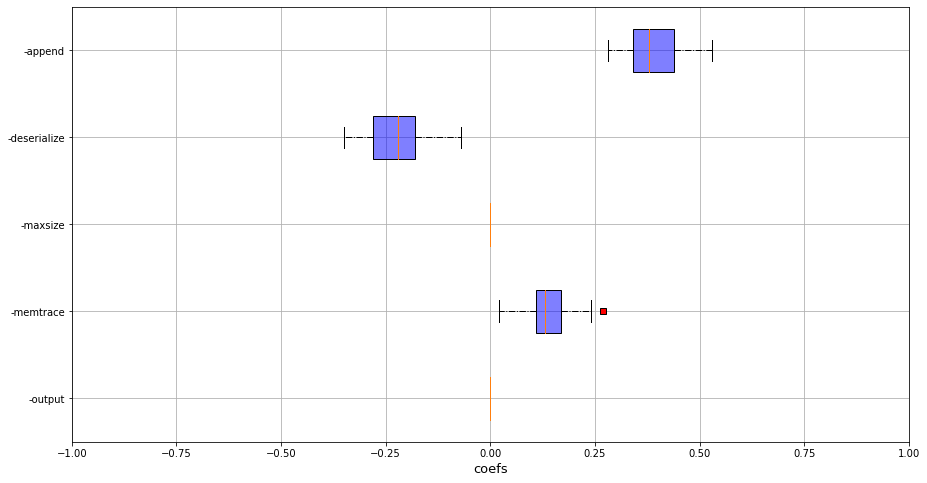


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q11 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


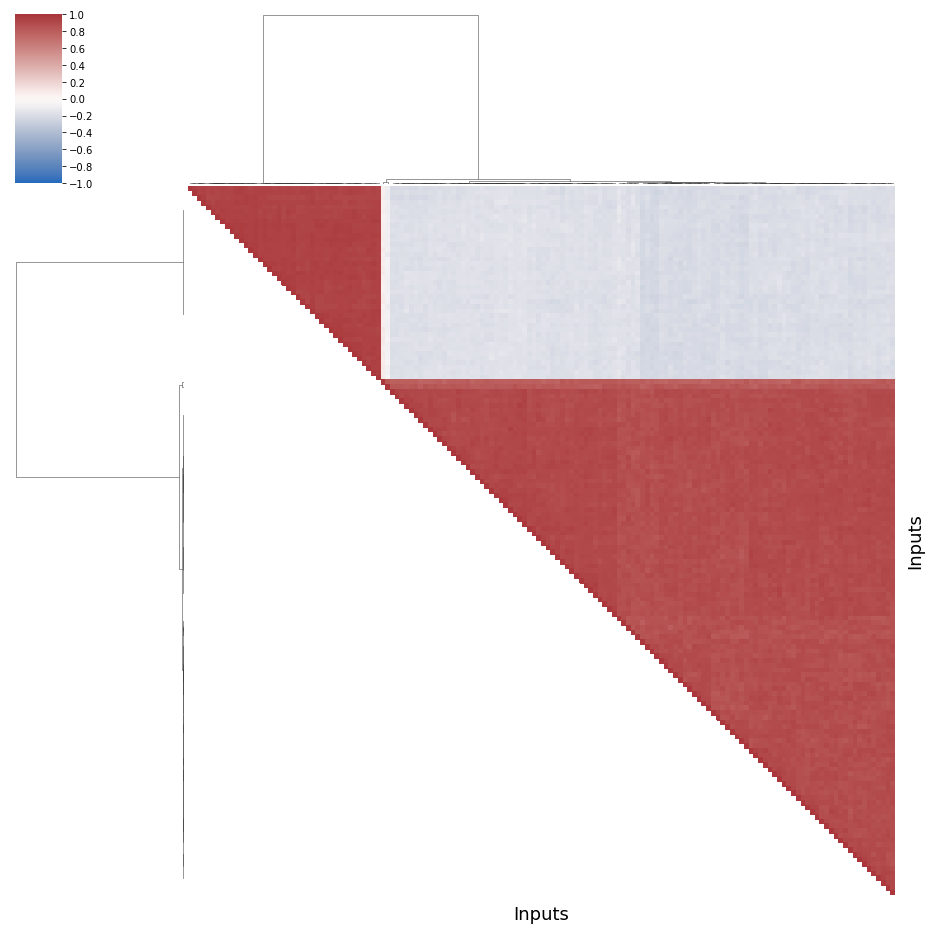


--
Group  1 
--

Properties

name        0.015
tab1     2250.000
tab2    90345.000
tab4    22500.000
tab5     3000.000
tab6    12000.000
tab8      150.000
dtype: float64


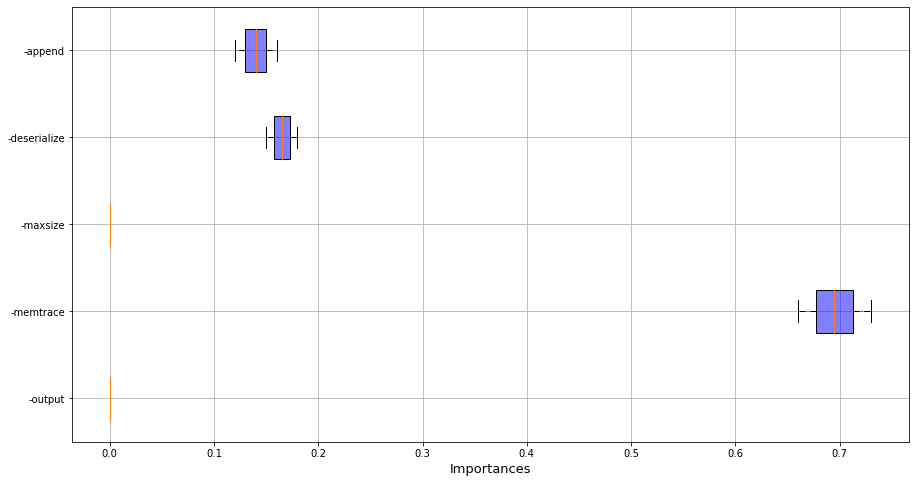

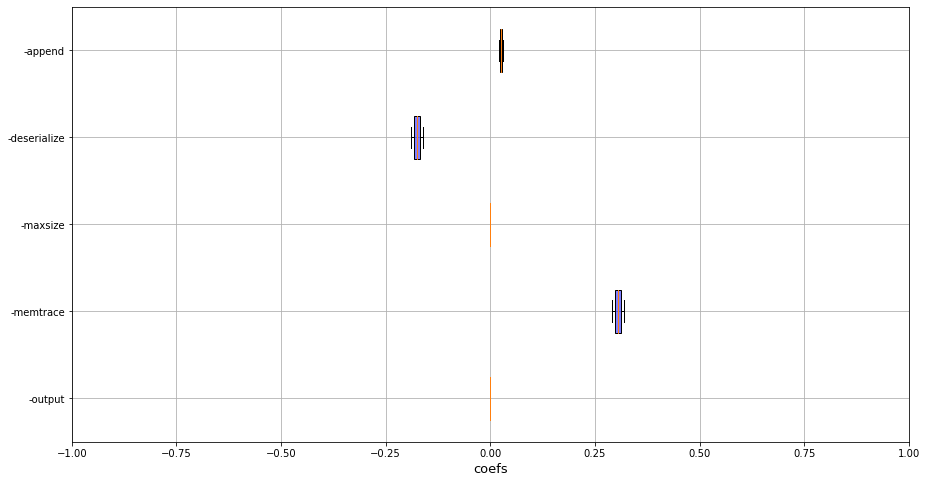


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  2 
--

Properties

name    4.266102e-01
tab1    6.322881e+04
tab2    2.529445e+06
tab4    6.322881e+05
tab5    8.430508e+04
tab6    3.372203e+05
tab8    4.215254e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


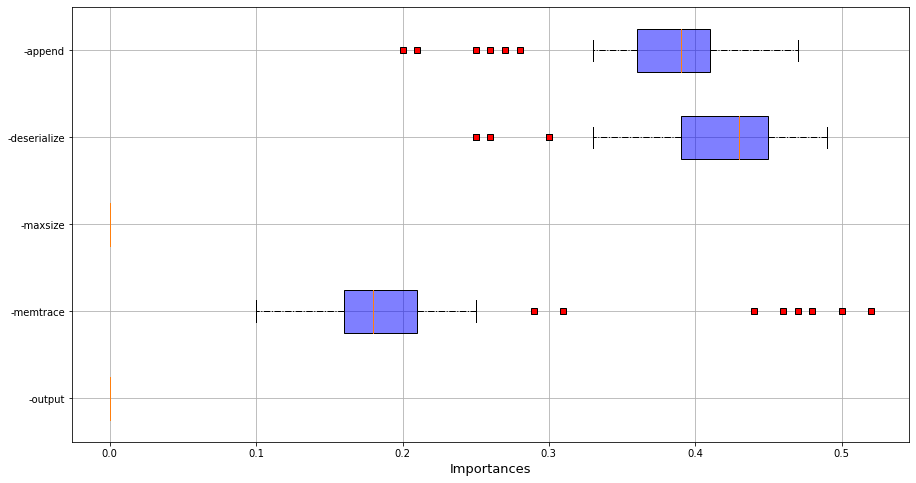

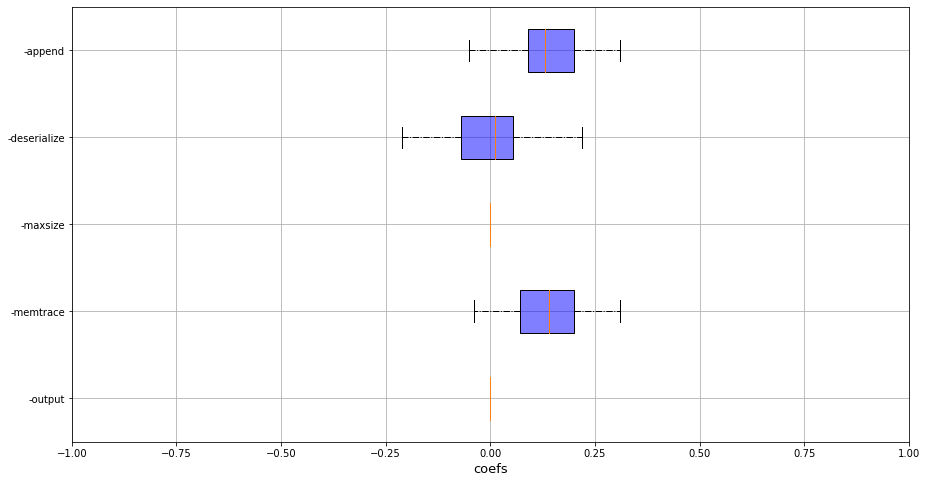


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    8.083333e-01
tab1    1.081250e+05
tab2    4.325525e+06
tab4    1.081250e+06
tab5    1.441667e+05
tab6    5.766667e+05
tab8    7.208333e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


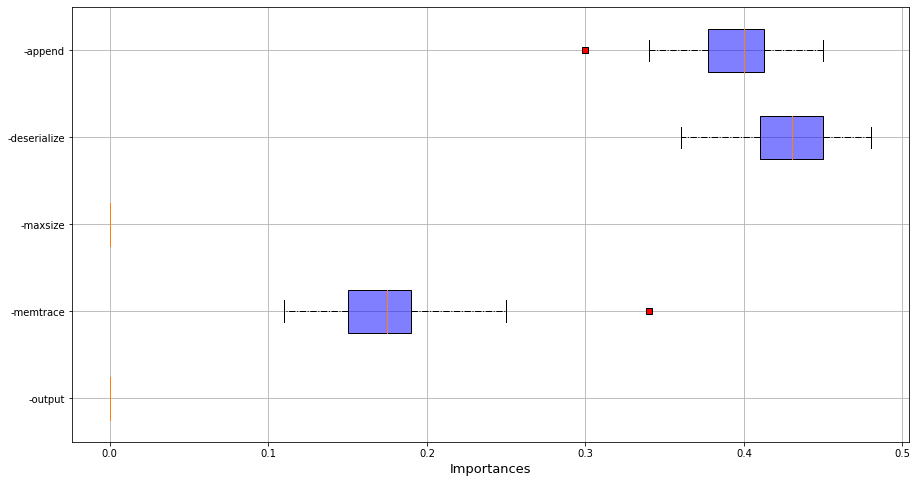

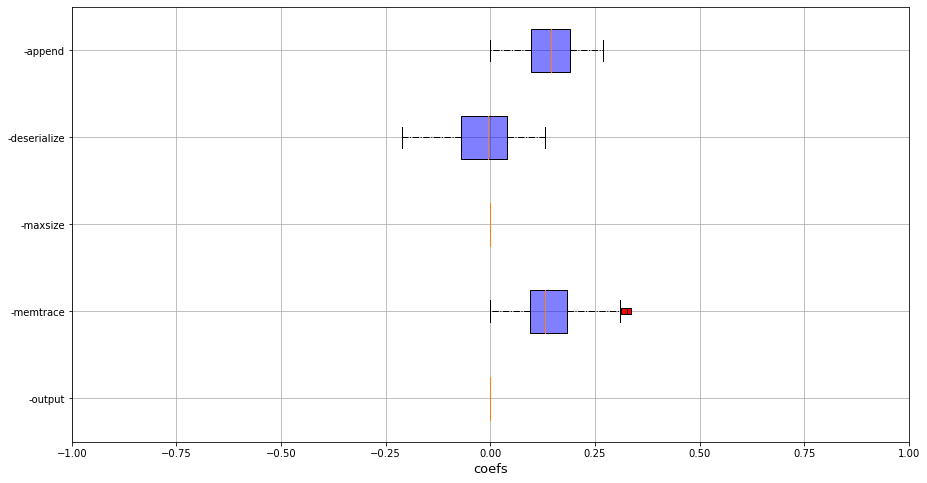


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


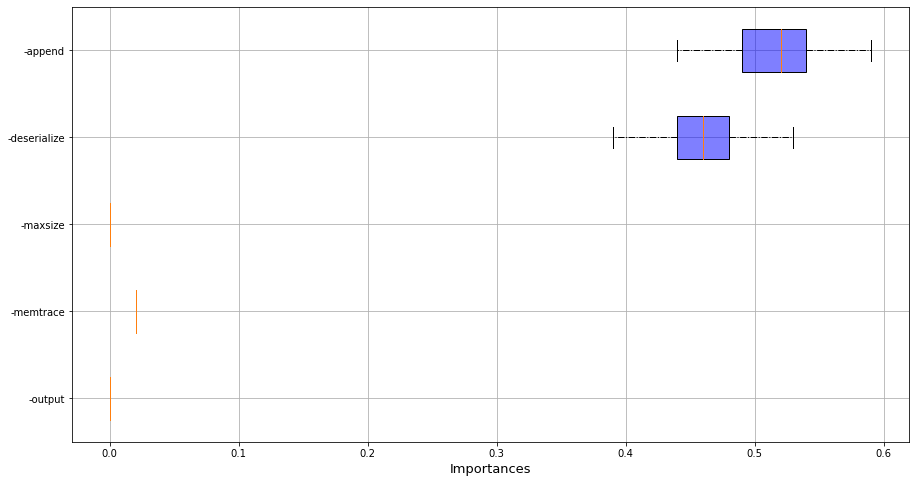

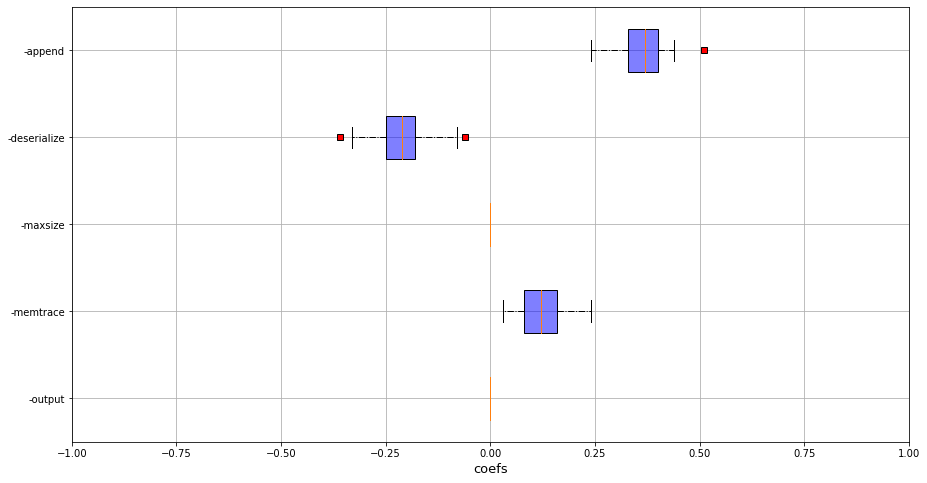


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q12 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


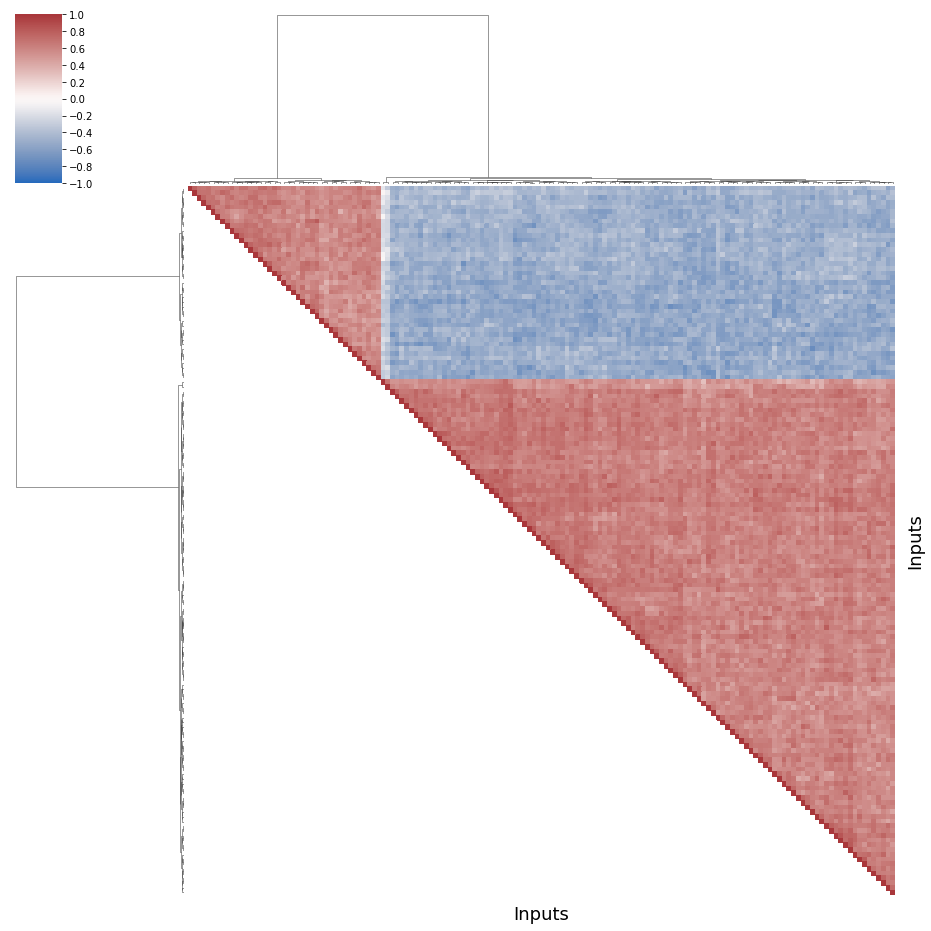


--
Group  1 
--

Properties

name        0.015
tab1     2250.000
tab2    90345.000
tab4    22500.000
tab5     3000.000
tab6    12000.000
tab8      150.000
dtype: float64


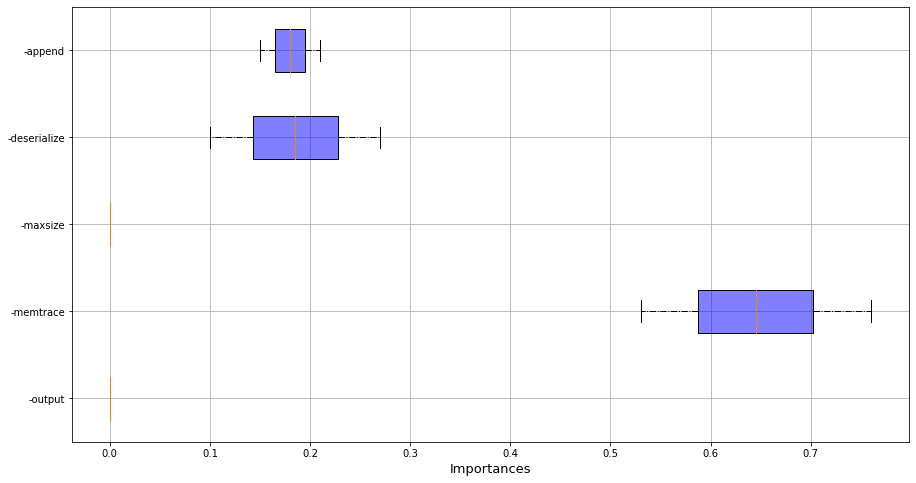

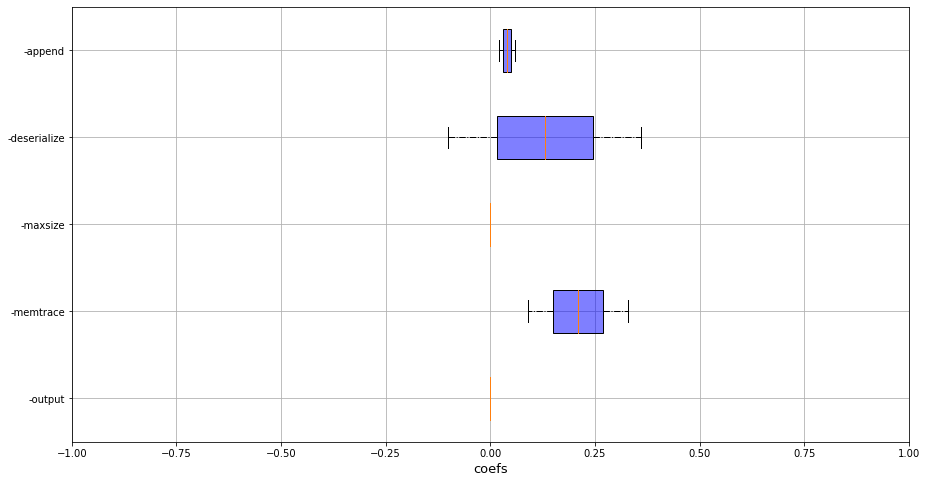


 RQ3 - Performance ratios

Mean =  1.1776591688905835
Std =  0.08463591307662977

--
Group  2 
--

Properties

name    6.473134e-01
tab1    8.881343e+04
tab2    3.552986e+06
tab4    8.881343e+05
tab5    1.184179e+05
tab6    4.736716e+05
tab8    5.920896e+03
dtype: float64


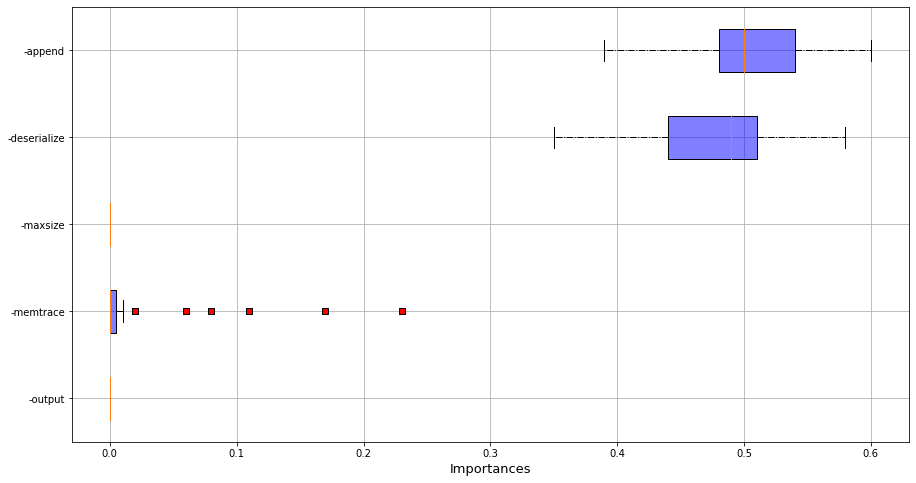

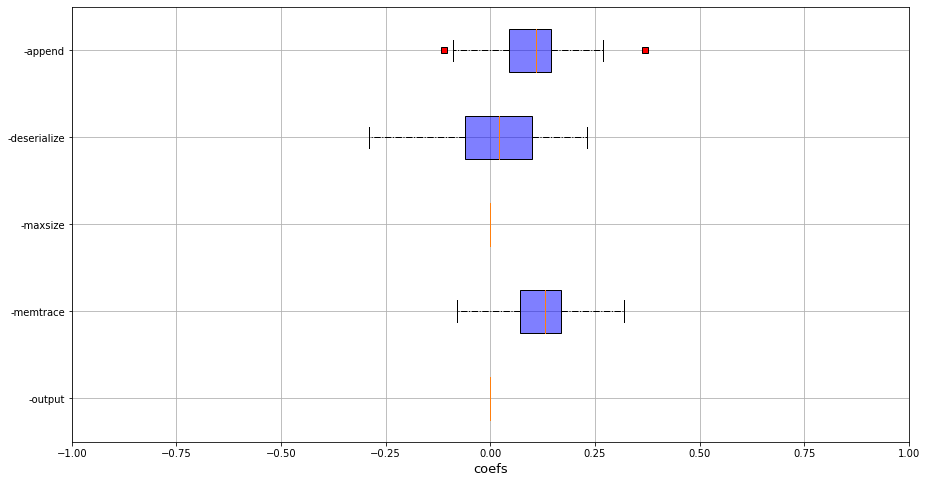


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name          0.515
tab1      74250.000
tab2    2970309.675
tab4     742500.000
tab5      99000.000
tab6     396000.000
tab8       4950.000
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


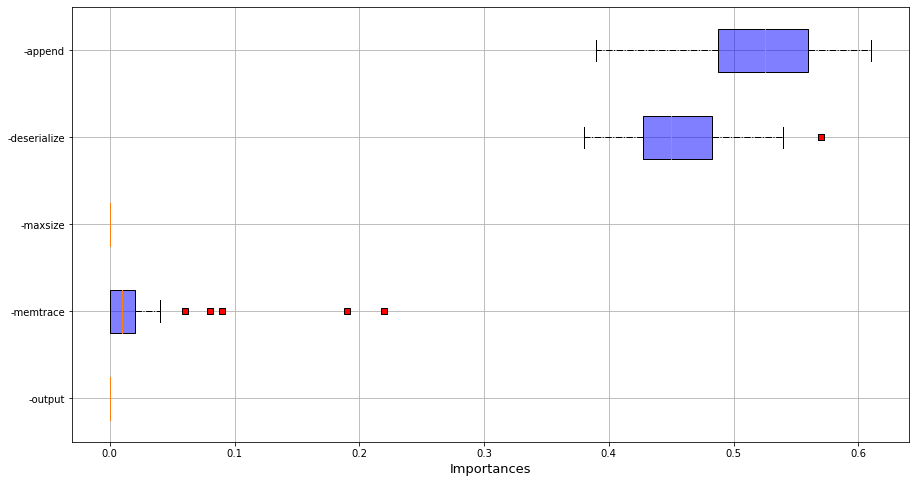

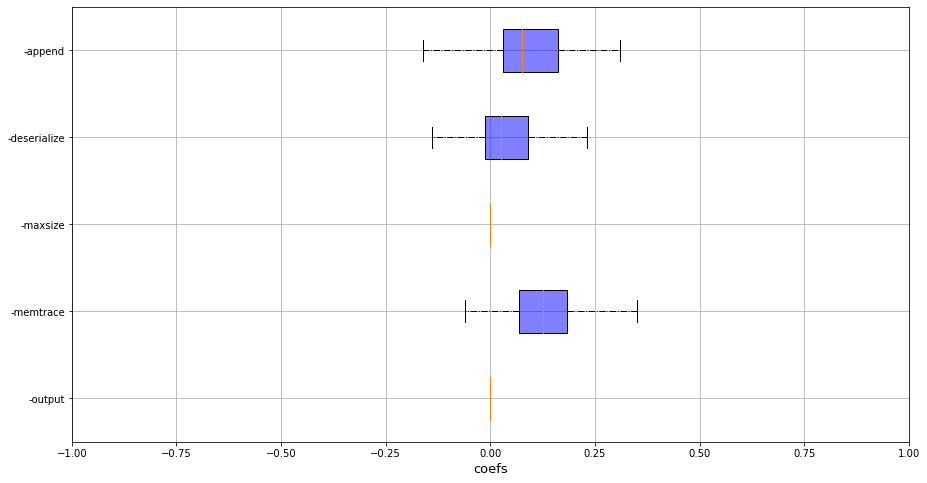


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


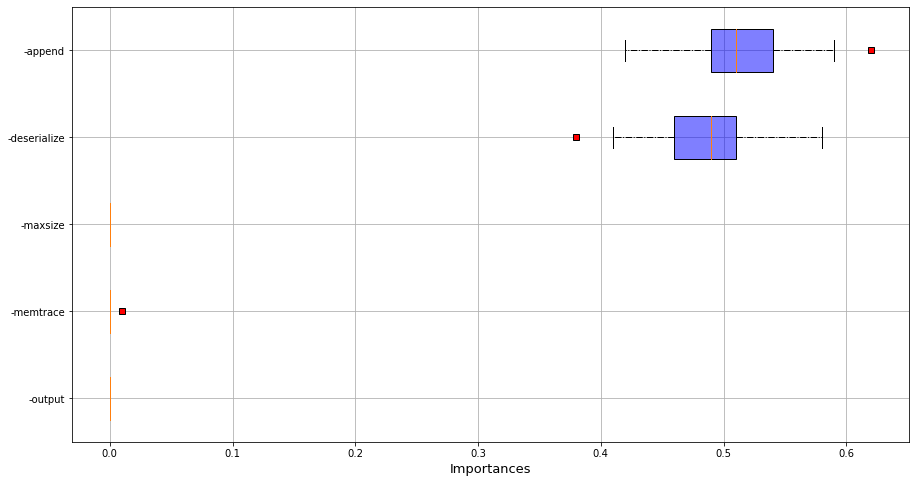

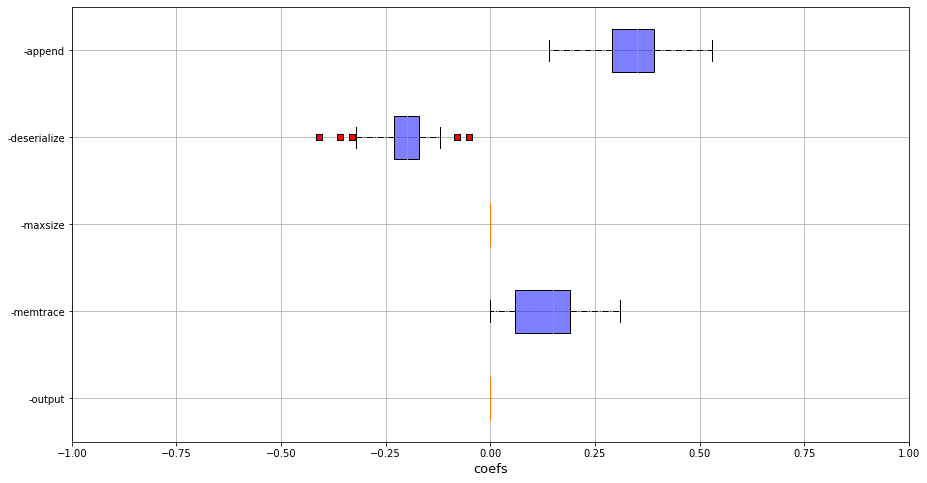


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q13 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


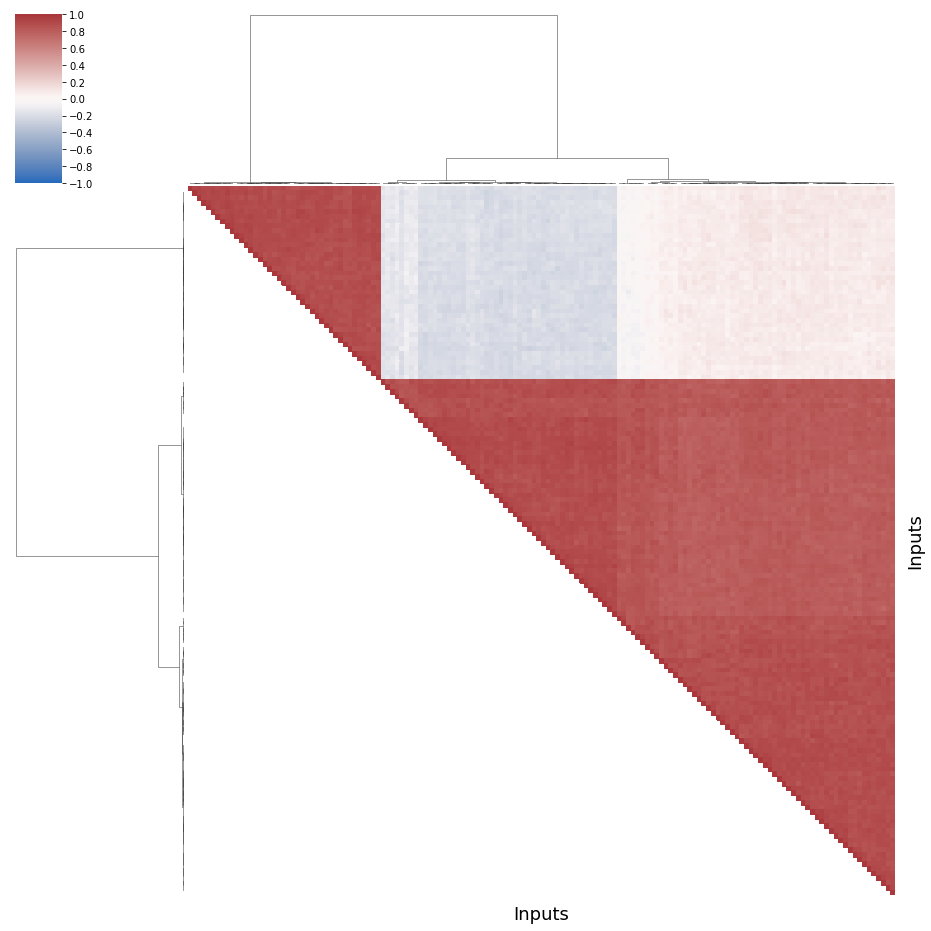


--
Group  1 
--

Properties

name    2.707547e-01
tab1    4.061321e+04
tab2    1.624585e+06
tab4    4.061321e+05
tab5    5.415094e+04
tab6    2.166038e+05
tab8    2.707547e+03
dtype: float64


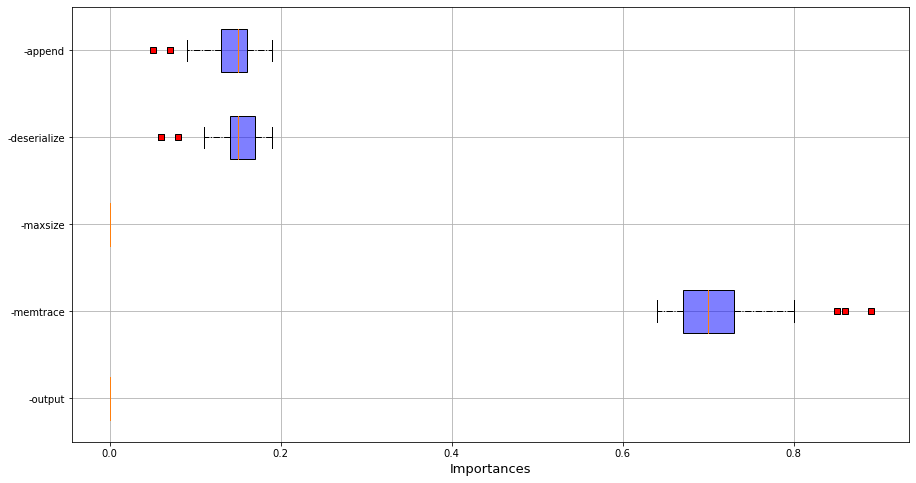

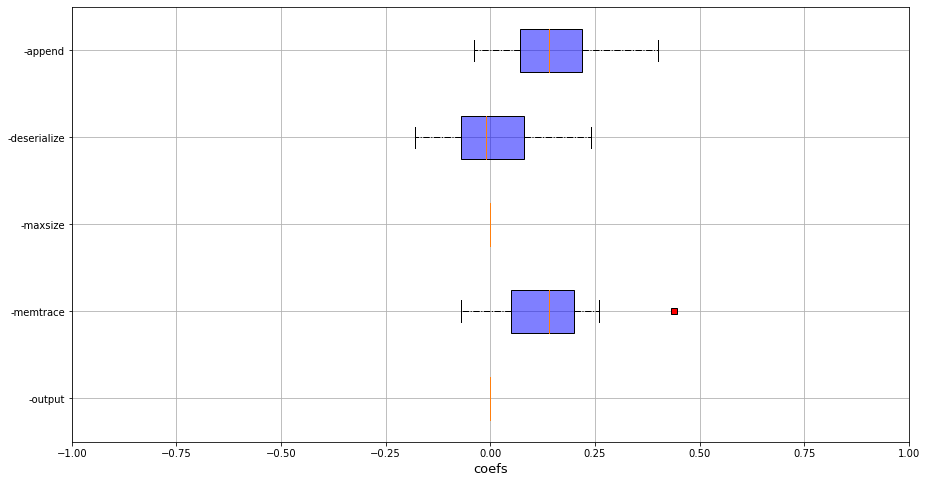


 RQ3 - Performance ratios

Mean =  1.04032041458416
Std =  0.03598974875194609

--
Group  2 
--

Properties

name    5.600000e-01
tab1    8.400000e+04
tab2    3.360133e+06
tab4    8.400000e+05
tab5    1.120000e+05
tab6    4.480000e+05
tab8    5.600000e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


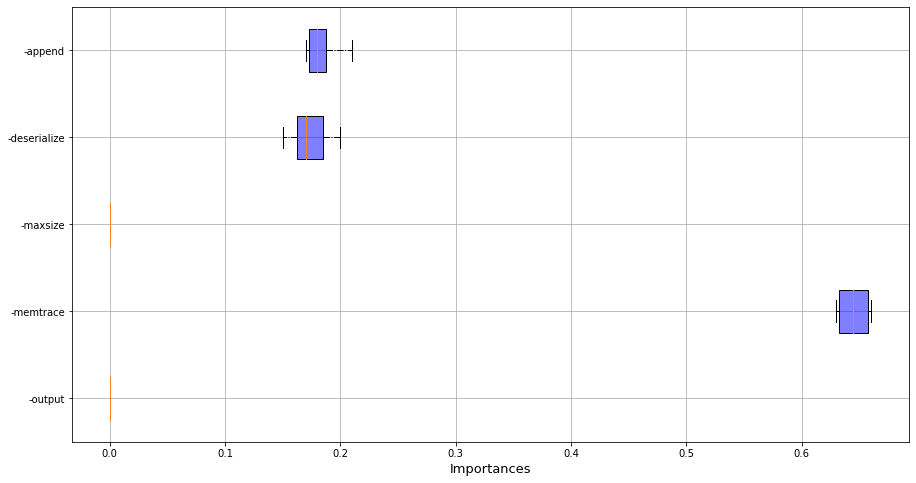

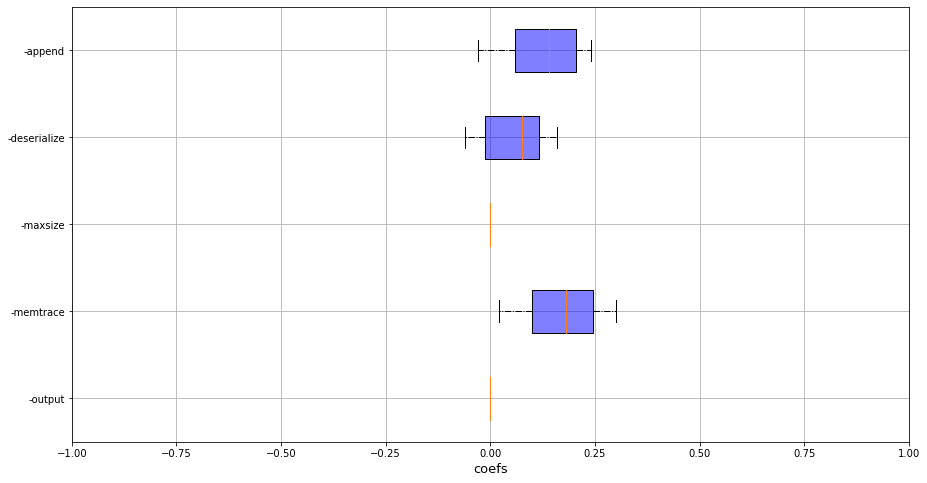


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    9.258000e-01
tab1    1.253700e+05
tab2    5.015587e+06
tab4    1.253700e+06
tab5    1.671600e+05
tab6    6.686400e+05
tab8    8.358000e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


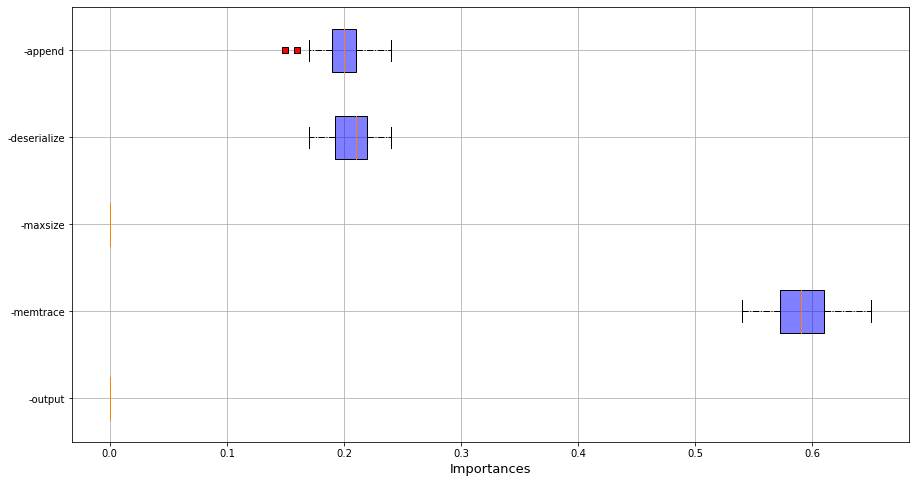

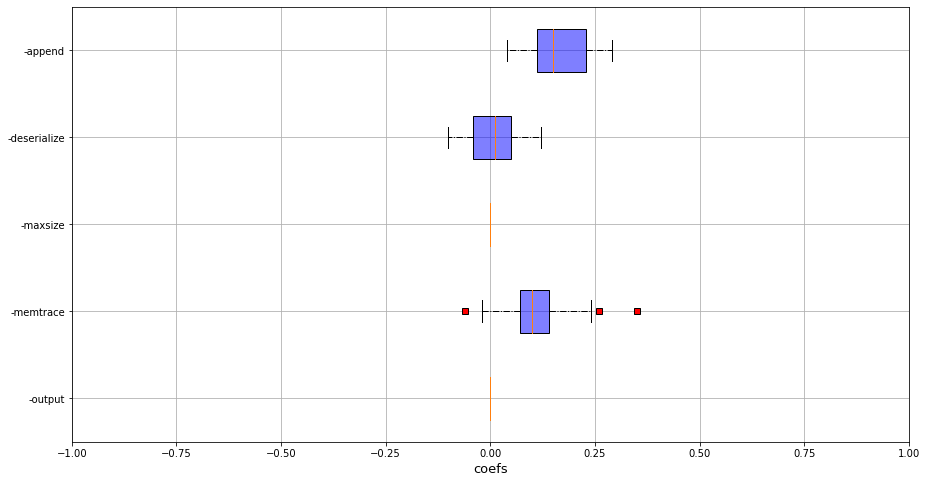


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


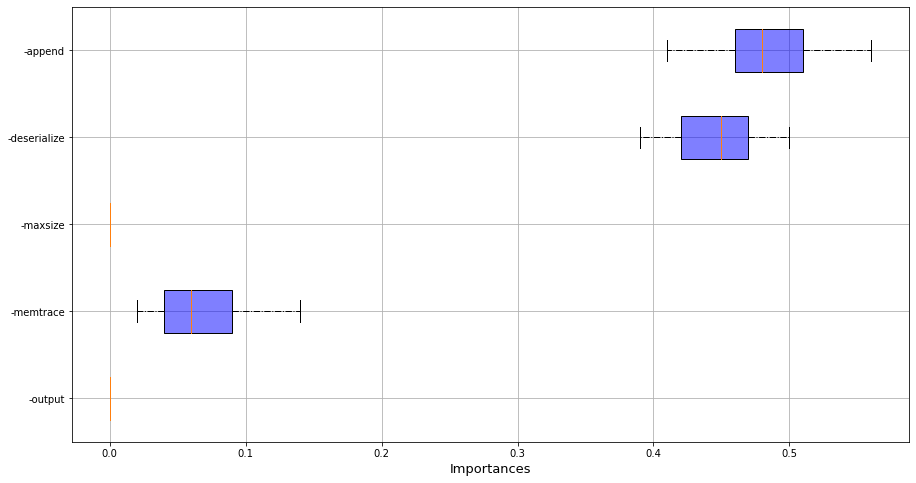

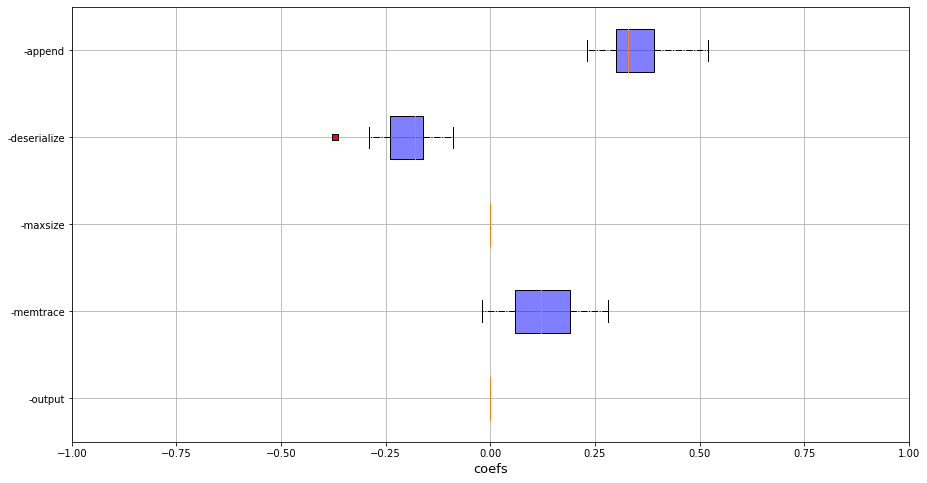


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q14 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


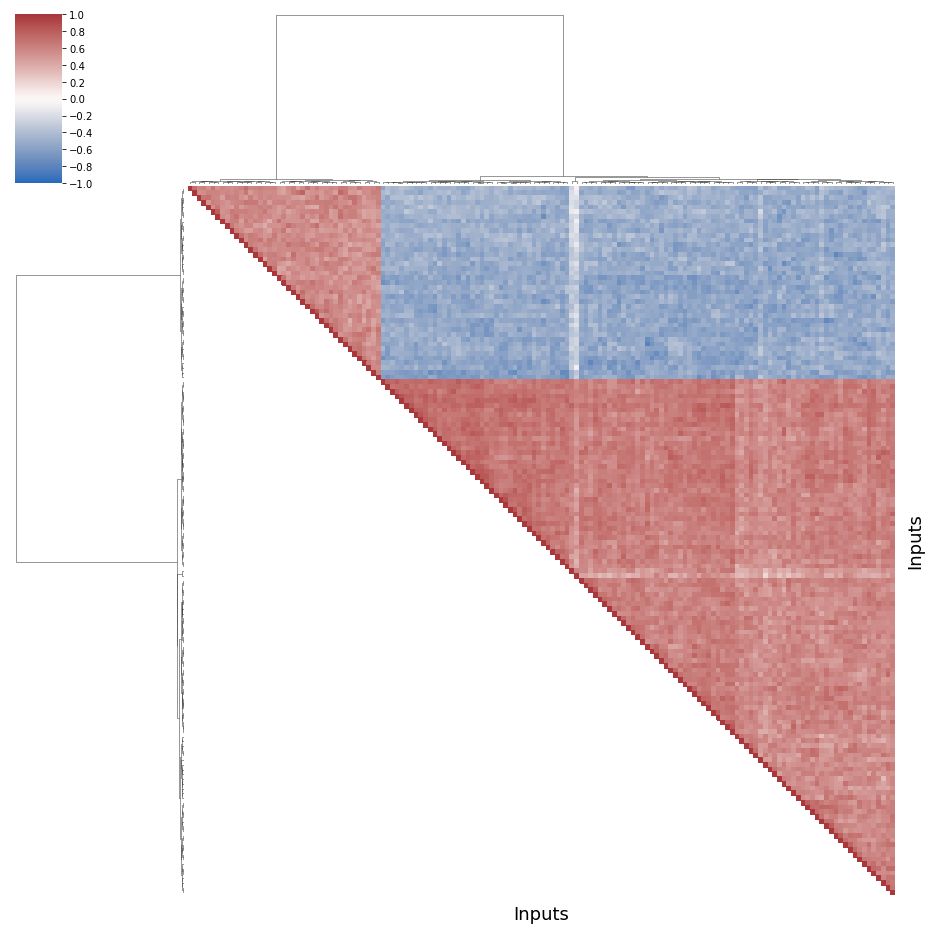


--
Group  1 
--

Properties

name        0.015
tab1     2250.000
tab2    90345.000
tab4    22500.000
tab5     3000.000
tab6    12000.000
tab8      150.000
dtype: float64


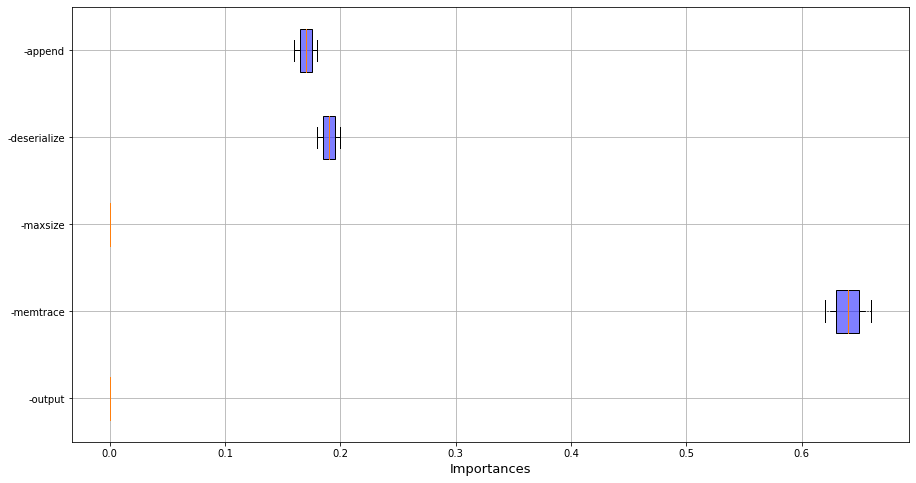

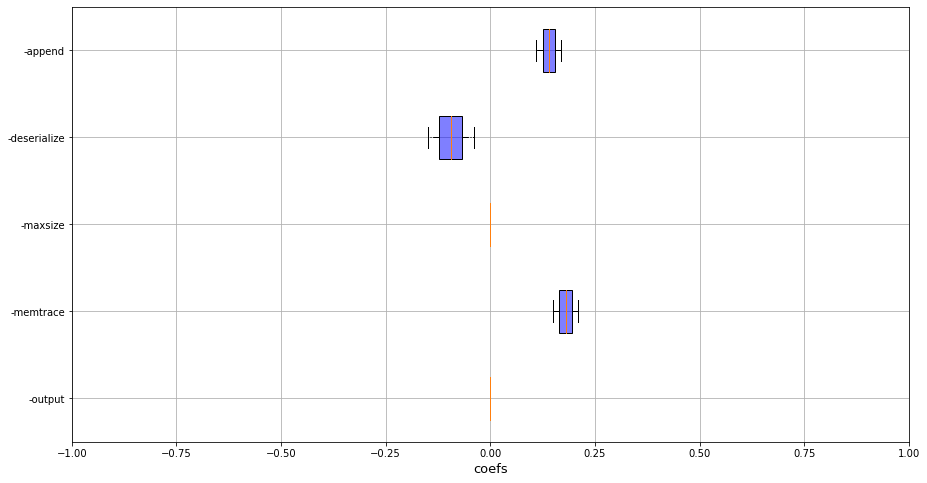


 RQ3 - Performance ratios

Mean =  1.1290322580645162
Std =  0.0

--
Group  2 
--

Properties

name    6.656716e-01
tab1    9.134328e+04
tab2    3.654234e+06
tab4    9.134328e+05
tab5    1.217910e+05
tab6    4.871642e+05
tab8    6.089552e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


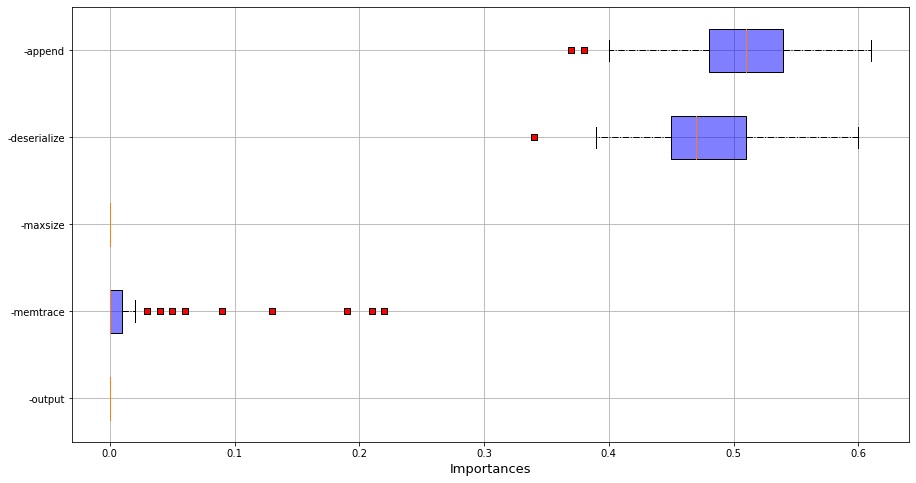

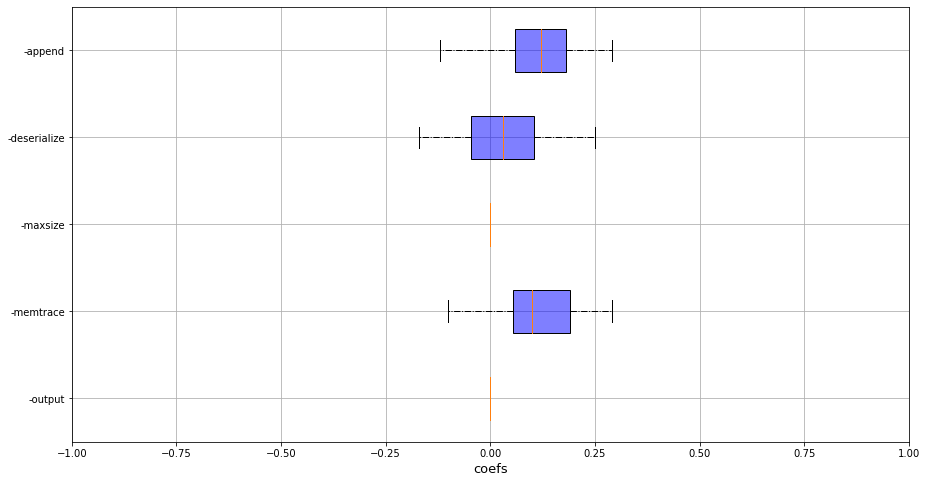


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  3 
--

Properties

name    4.842500e-01
tab1    7.001250e+04
tab2    2.800719e+06
tab4    7.001250e+05
tab5    9.335000e+04
tab6    3.734000e+05
tab8    4.667500e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


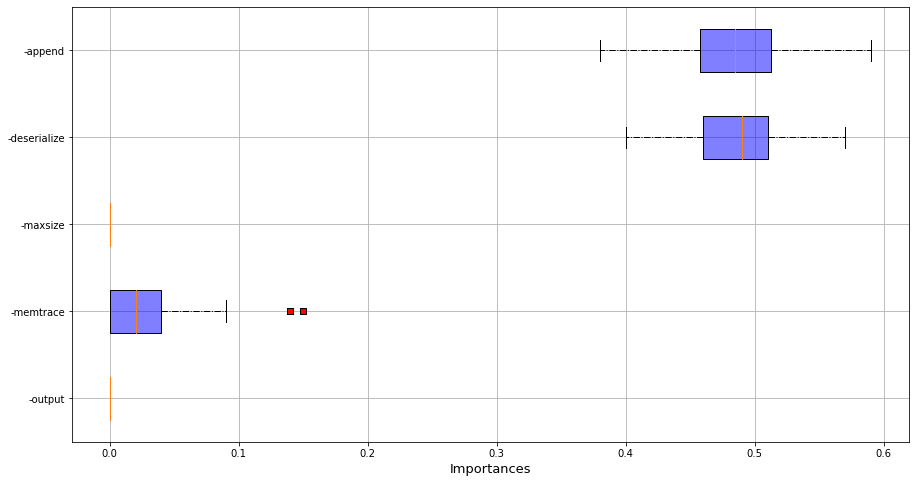

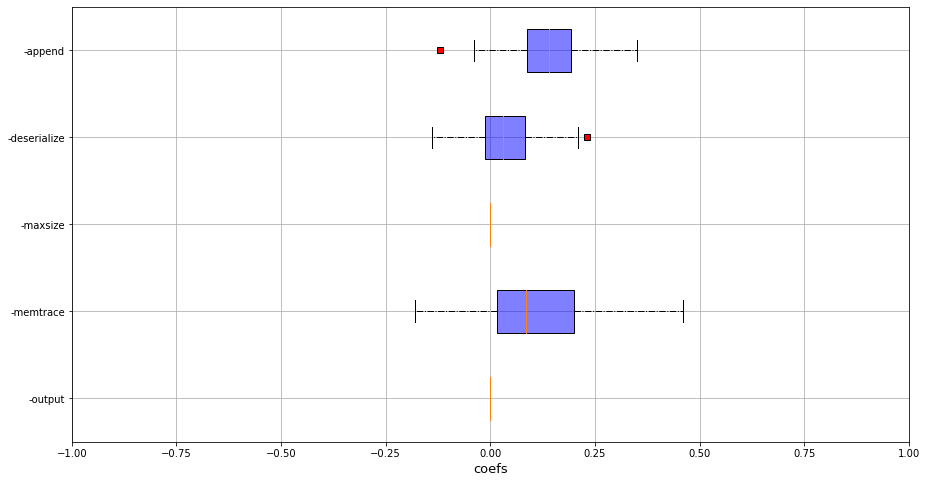


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    4.000000e+00
tab1    5.341463e+05
tab2    2.136366e+07
tab4    5.341463e+06
tab5    7.121951e+05
tab6    2.848780e+06
tab8    3.560976e+04
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


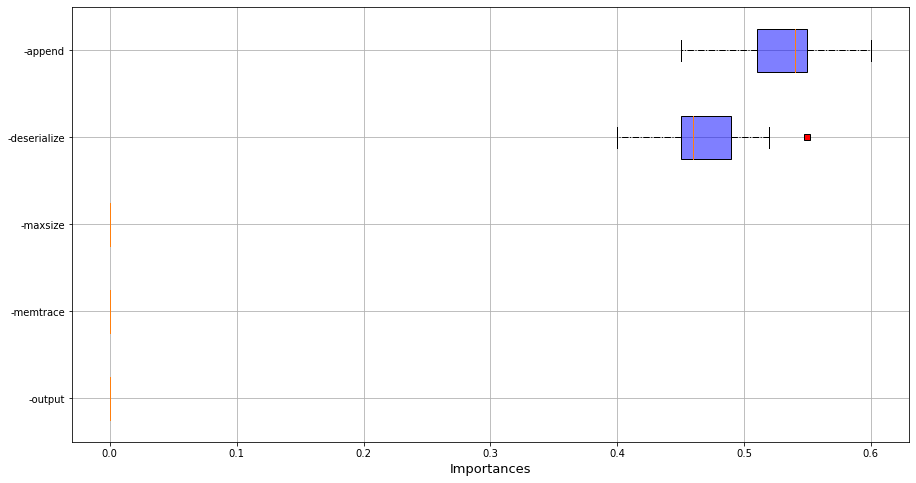

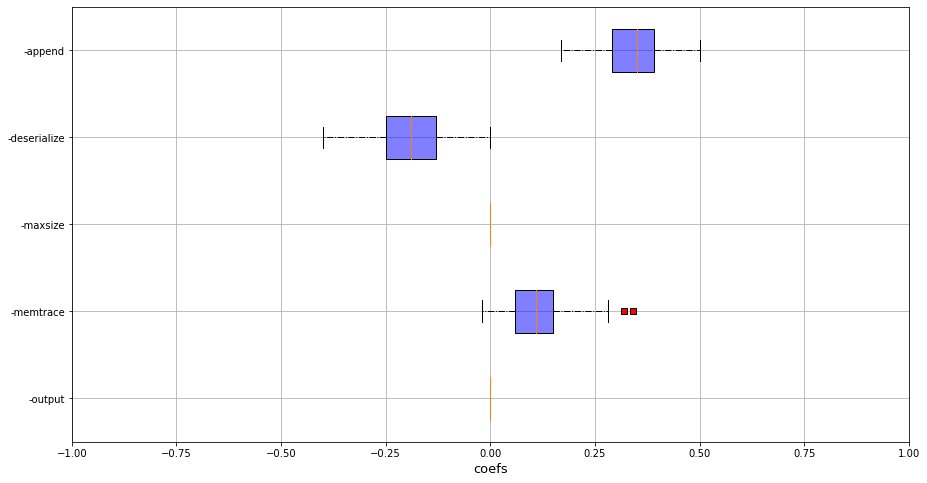


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

---
 q15 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


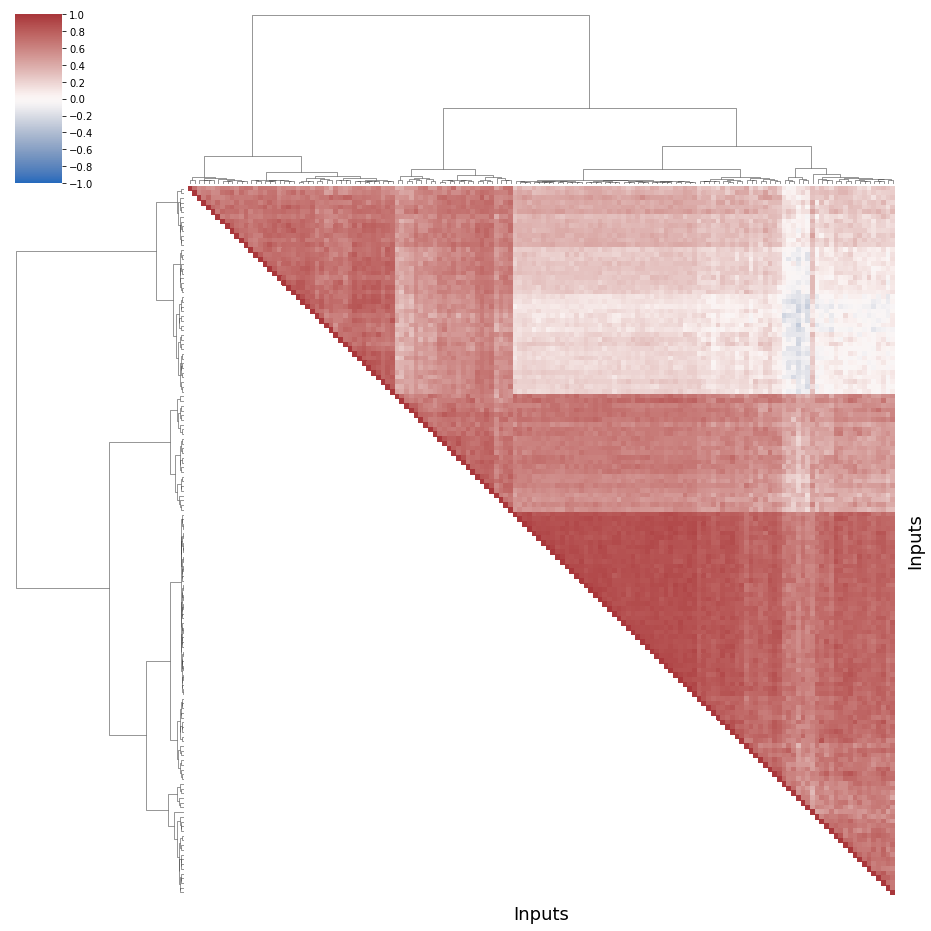


--
Group  1 
--

Properties

name    2.948596e+00
tab1    3.949211e+05
tab2    1.579529e+07
tab4    3.949211e+06
tab5    5.265614e+05
tab6    2.106246e+06
tab8    2.632807e+04
dtype: float64


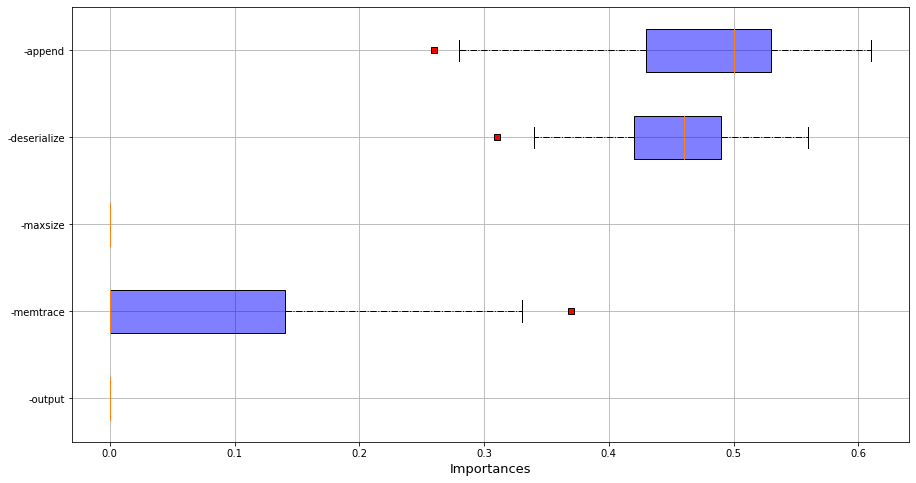

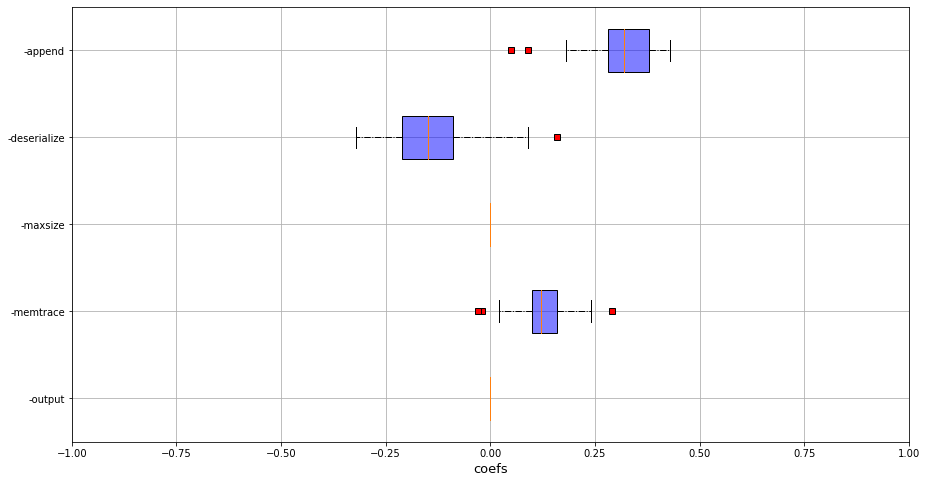


 RQ3 - Performance ratios

Mean =  1.6512291407049238
Std =  0.41411717543975973

--
Group  2 
--

Properties

name    1.725000e-01
tab1    2.587500e+04
tab2    1.035197e+06
tab4    2.587500e+05
tab5    3.450000e+04
tab6    1.380000e+05
tab8    1.725000e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


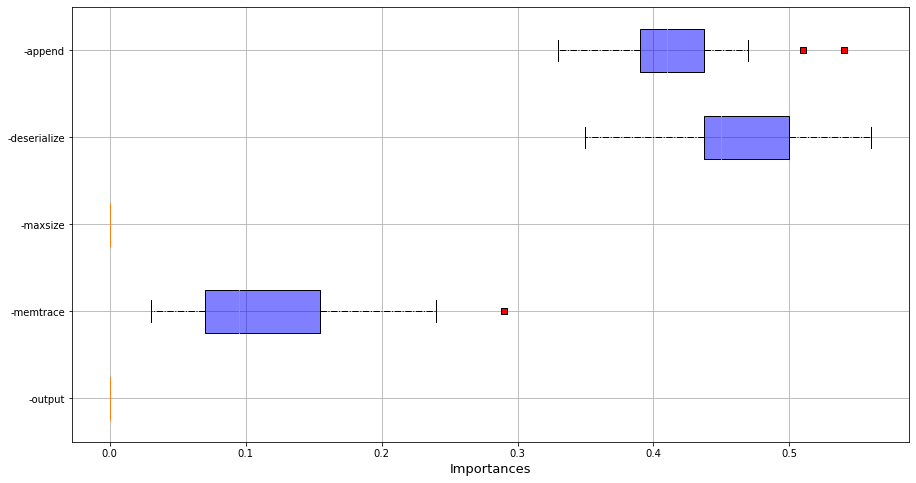

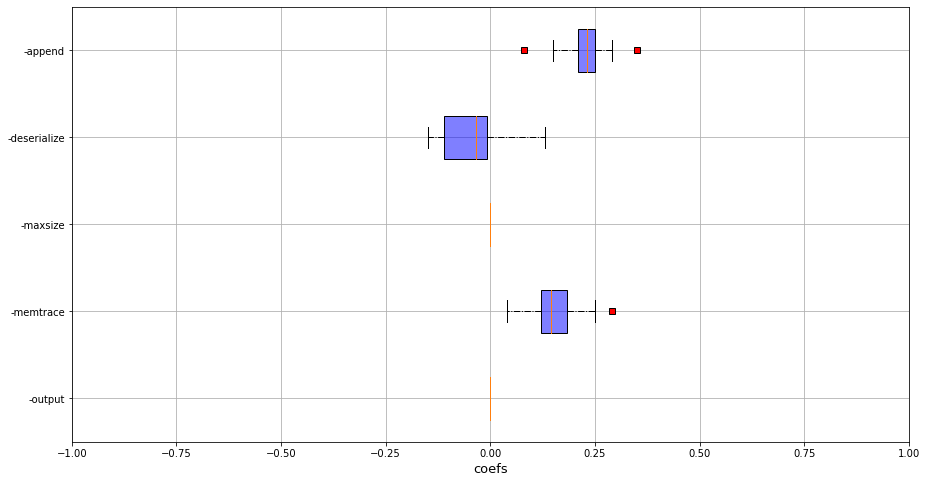


 RQ3 - Performance ratios

Mean =  1.1563186201160043
Std =  0.14723898483240389

--
Group  3 
--

Properties

name    5.332000e-01
tab1    7.998000e+04
tab2    3.199277e+06
tab4    7.998000e+05
tab5    1.066400e+05
tab6    4.265600e+05
tab8    5.332000e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


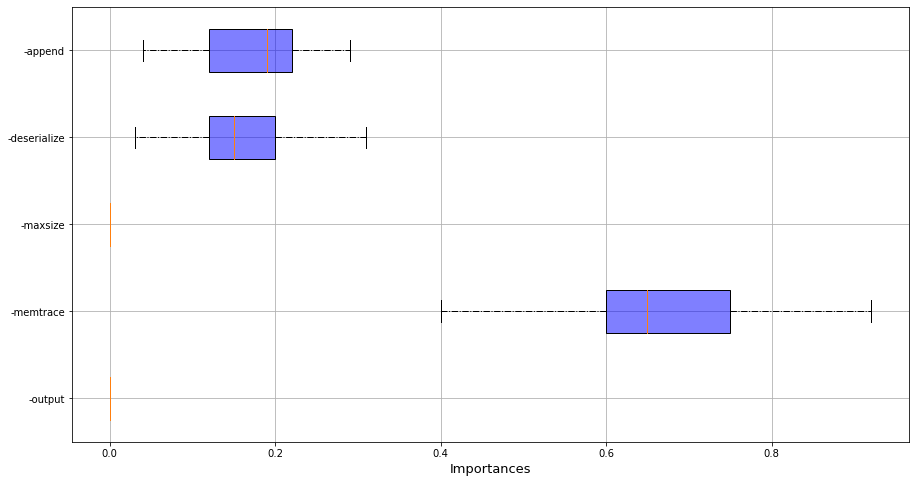

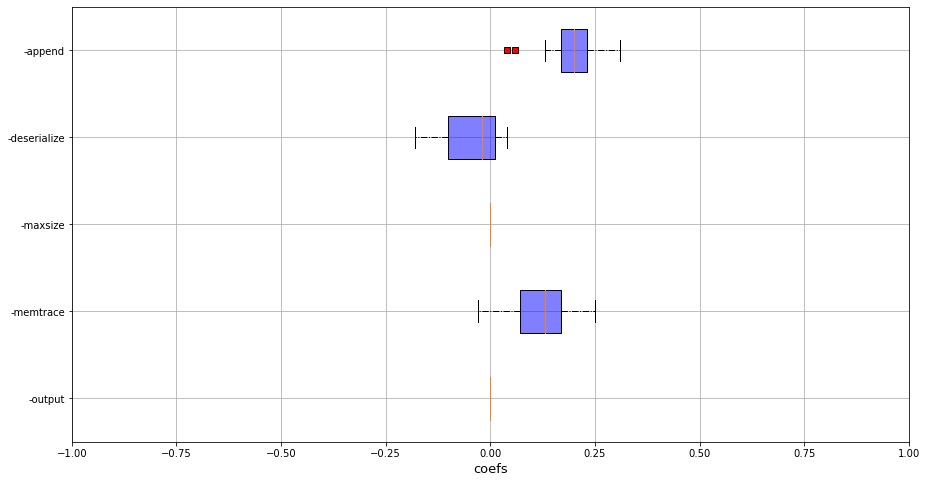


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

--
Group  4 
--

Properties

name    9.650000e-01
tab1    1.294091e+05
tab2    5.177165e+06
tab4    1.294091e+06
tab5    1.725455e+05
tab6    6.901818e+05
tab8    8.627273e+03
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


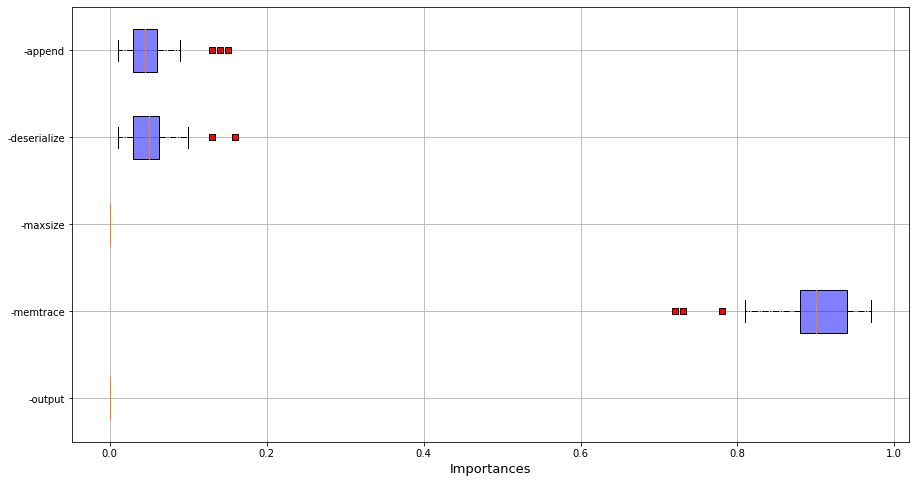

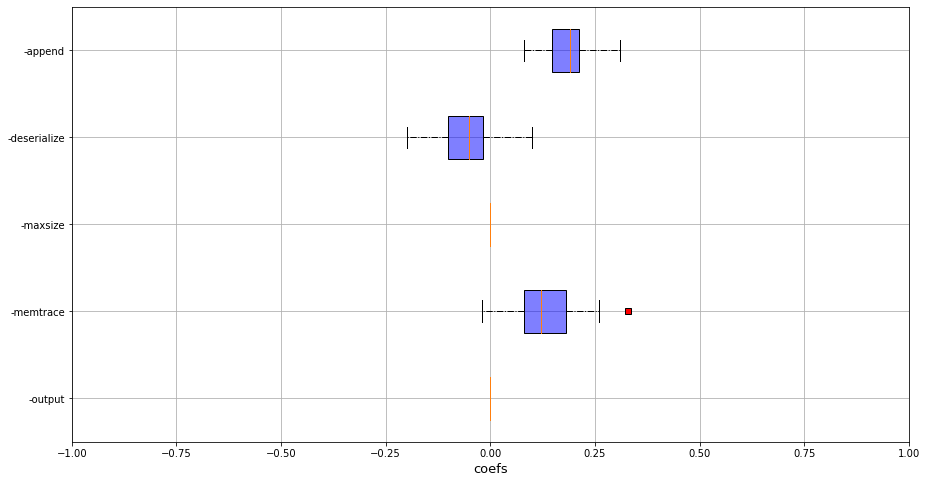


 RQ3 - Performance ratios

Mean =  nan
Std =  nan

-----
 imagemagick 
-----


---
 size 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1370: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input, interpolation=interpolation
/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


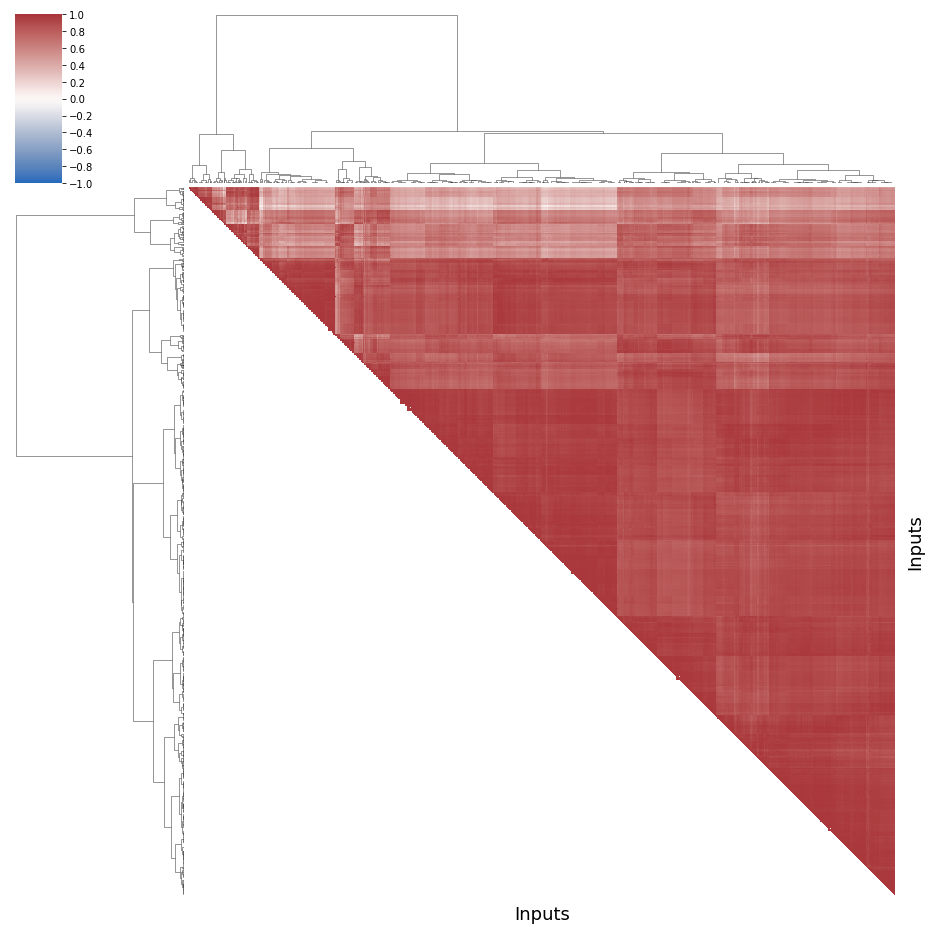


--
Group  1 
--

Properties

size      450438.221184
height       942.196262
width        805.099688
rpix         105.200760
gpix         116.346863
bpix         116.296769
dtype: float64


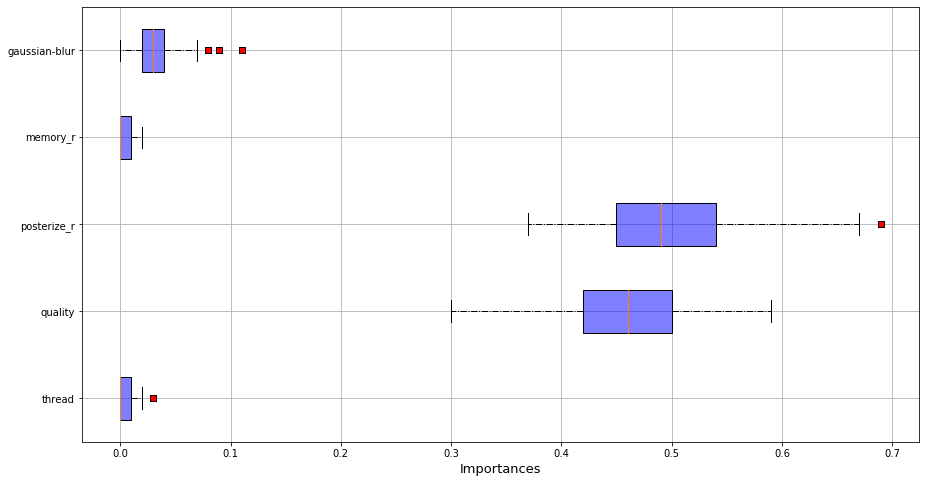

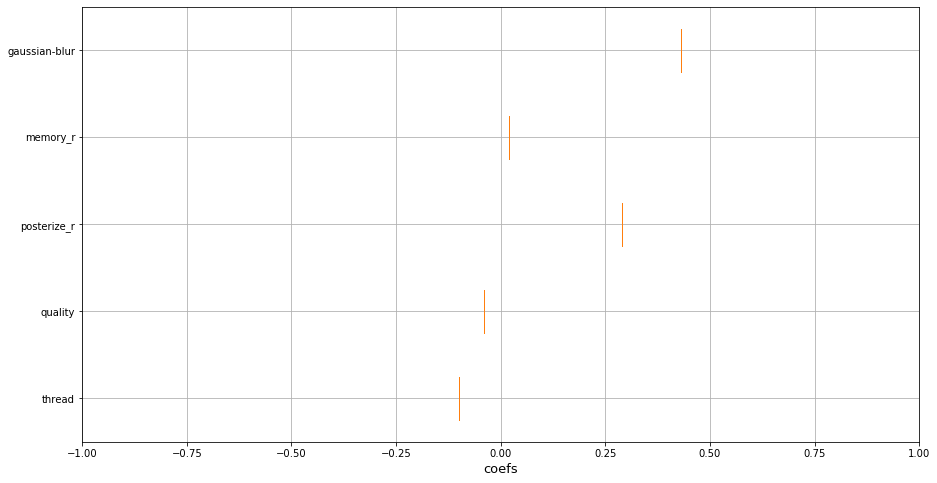


 RQ3 - Performance ratios

Mean =  7.882505290230413
Std =  10.164852646244375

--
Group  2 
--

Properties

size      170941.458015
height       550.760814
width        463.615776
rpix         117.687642
gpix         125.752287
bpix         129.145589
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


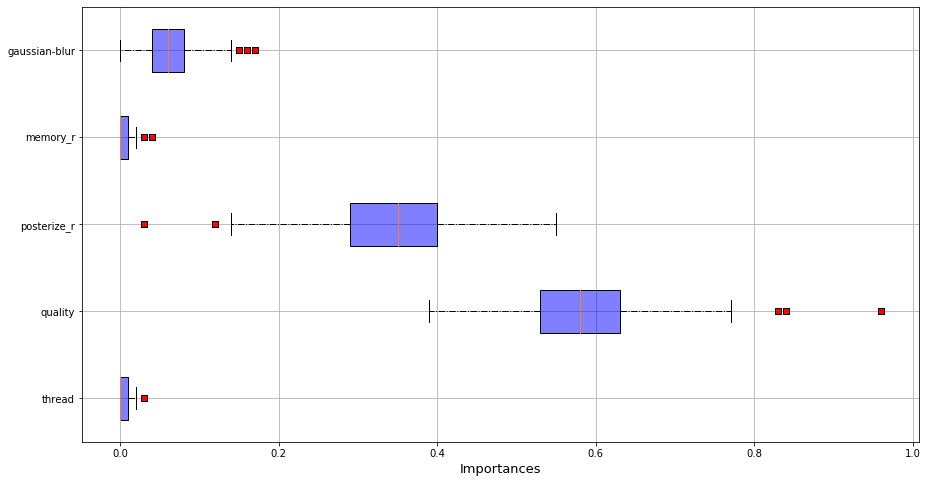

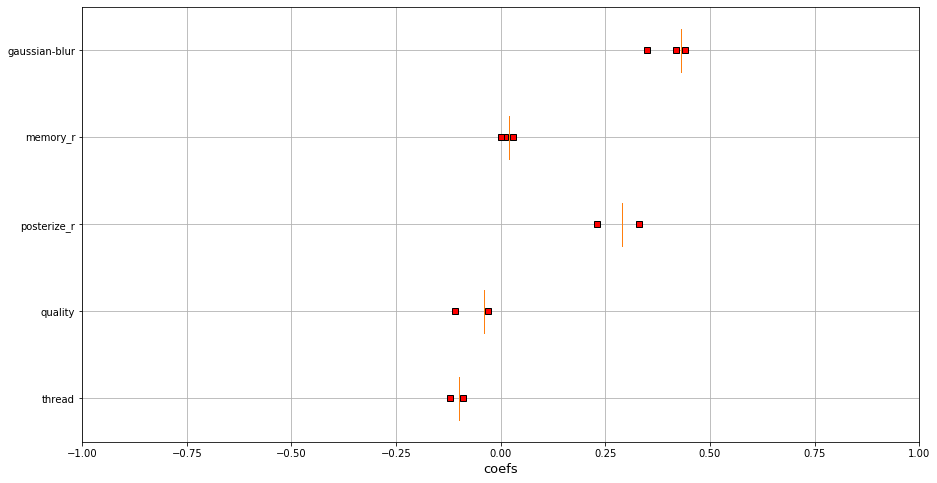


 RQ3 - Performance ratios

Mean =  7.203828632170466
Std =  9.31349743527747

--
Group  3 
--

Properties

size      226556.456989
height       597.989247
width        480.645161
rpix          94.834397
gpix         109.800170
bpix         109.579240
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


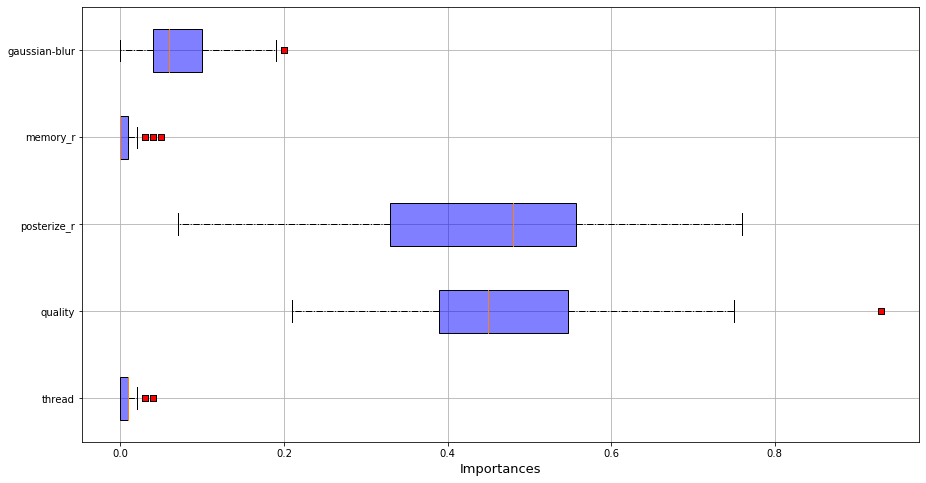

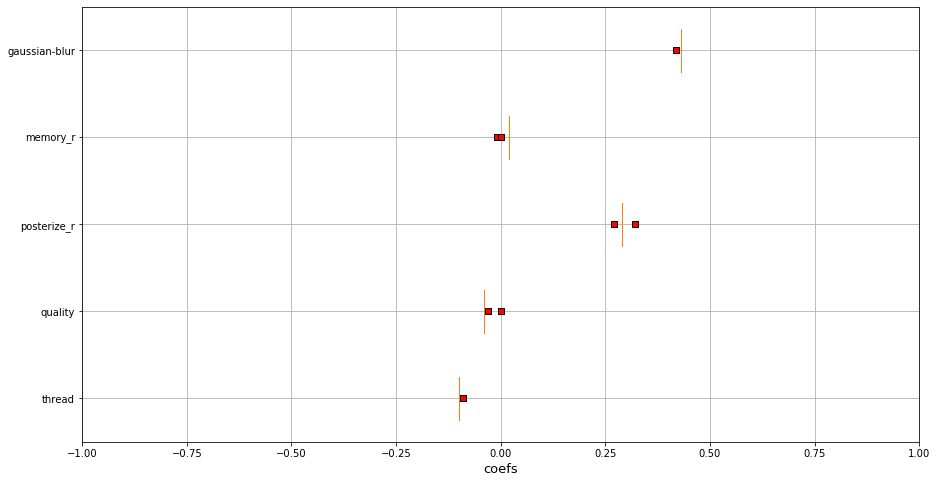


 RQ3 - Performance ratios

Mean =  5.942627908362214
Std =  8.799500587098292

--
Group  4 
--

Properties

size      189781.660000
height       474.430000
width        380.220000
rpix         104.314730
gpix         126.941656
bpix         123.850262
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


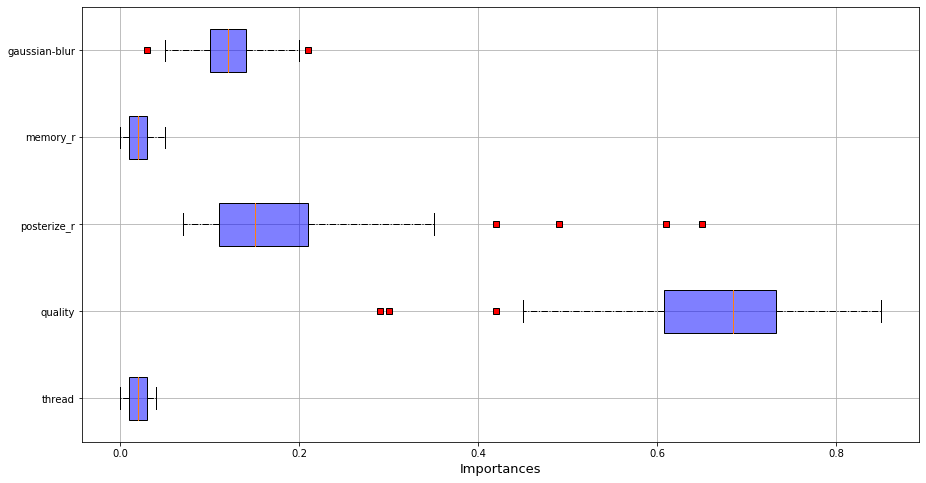

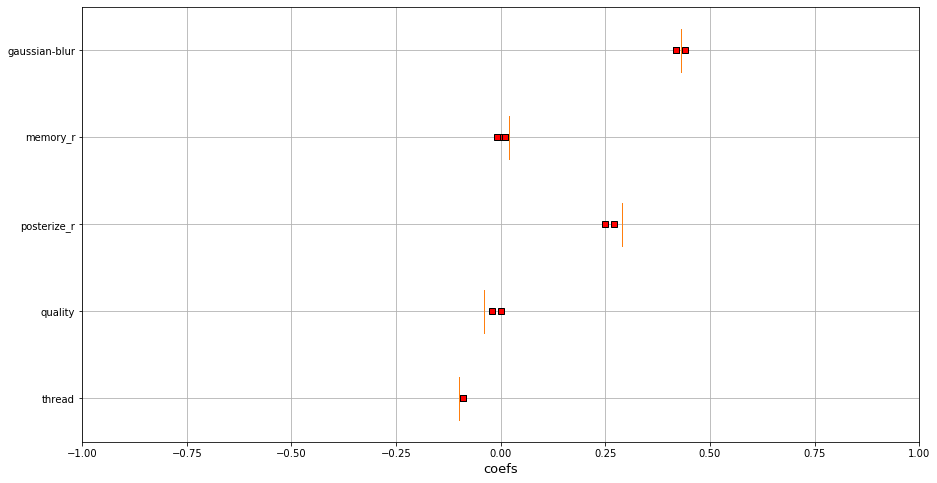


 RQ3 - Performance ratios

Mean =  6.456825372529648
Std =  10.666076587007156

---
 time 
---

RQ1 - correlations and groups 



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


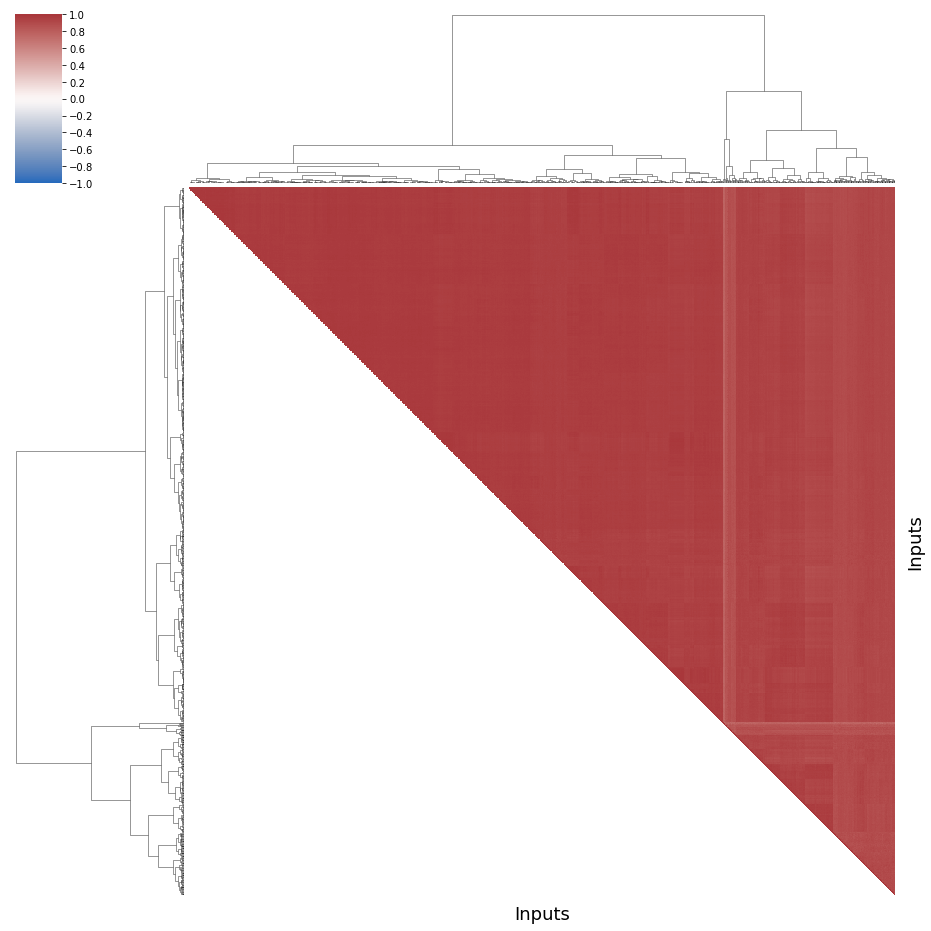


--
Group  1 
--

Properties

size      319426.144180
height       784.994709
width        658.699735
rpix         106.187786
gpix         117.598116
bpix         119.166942
dtype: float64


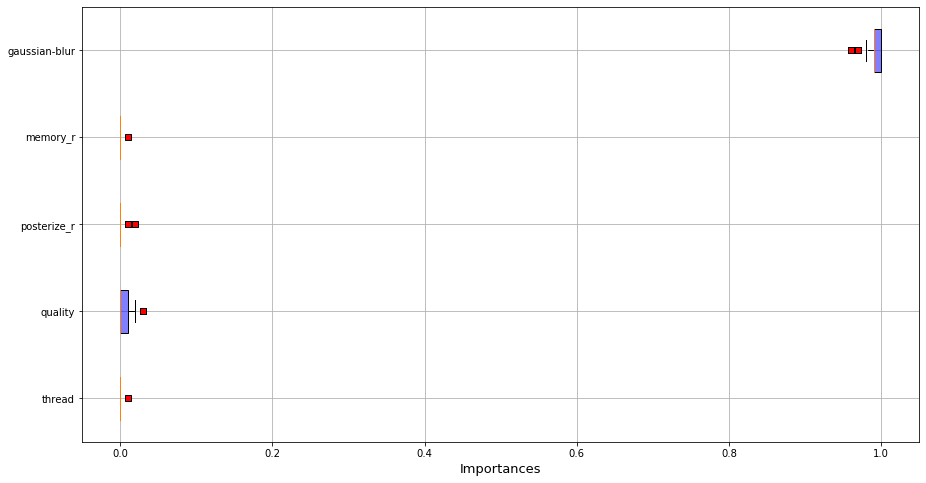

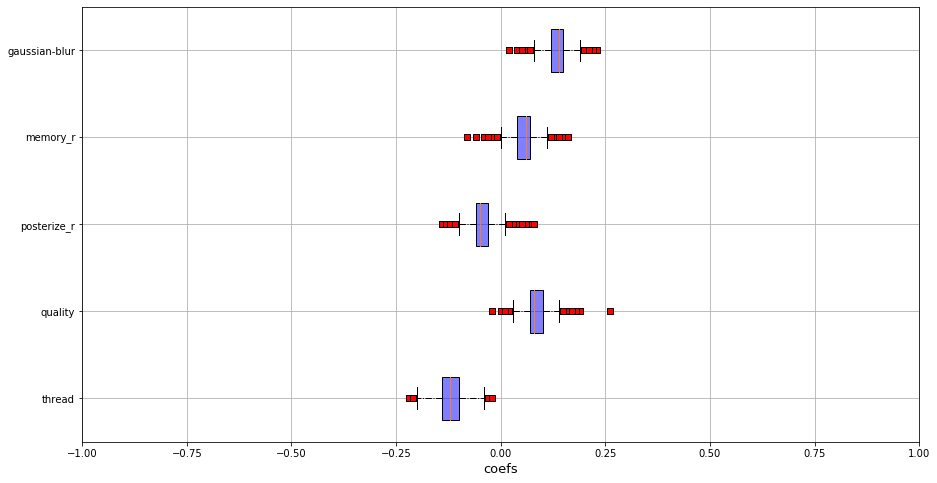


 RQ3 - Performance ratios



/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


Mean =  5.8978903411721335
Std =  9.361011965812109

--
Group  2 
--

Properties

size      92645.398438
height      268.140625
width       231.226562
rpix        115.568943
gpix        126.589287
bpix        123.483322
dtype: float64


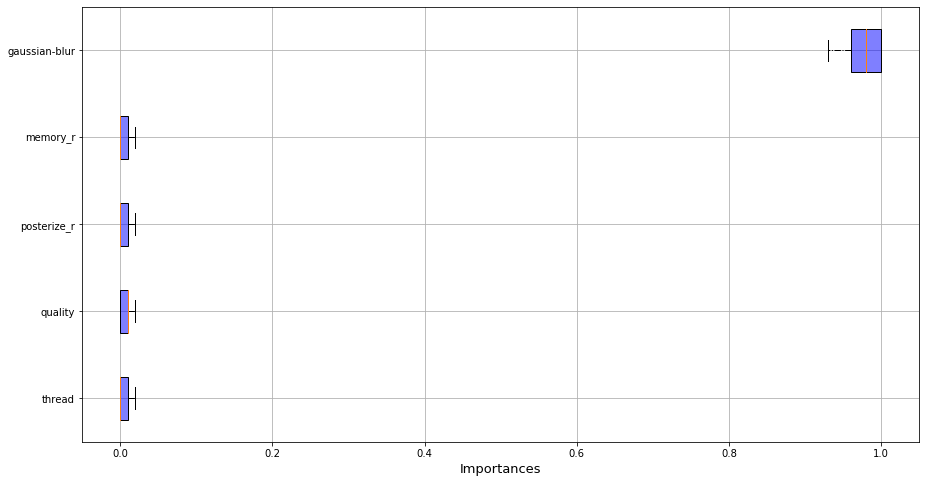

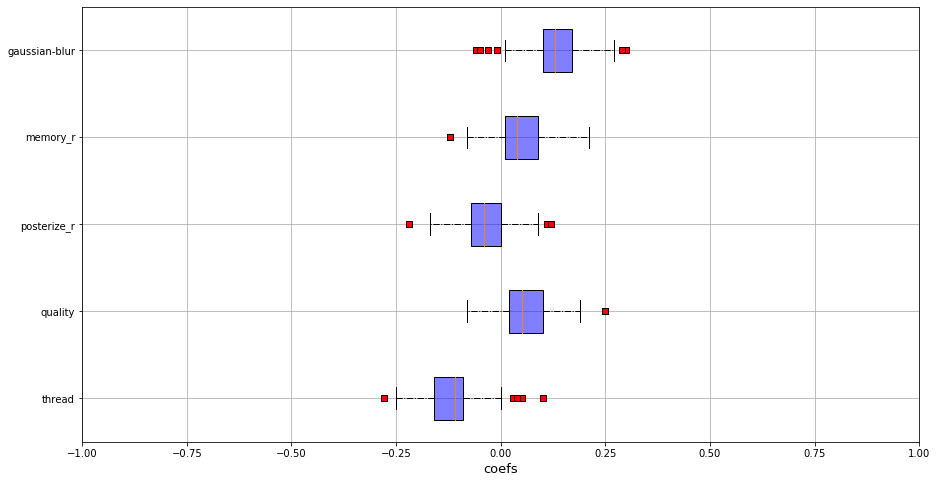


 RQ3 - Performance ratios

Mean =  9.965427717123342
Std =  9.611016544503514

--
Group  3 
--

Properties

size      200885.422680
height       496.195876
width        400.835052
rpix         108.963823
gpix         125.642715
bpix         128.370483
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


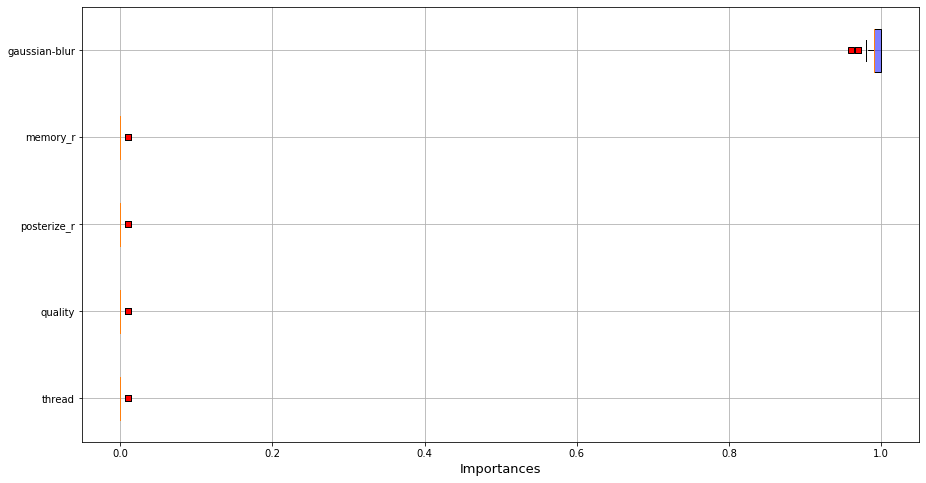

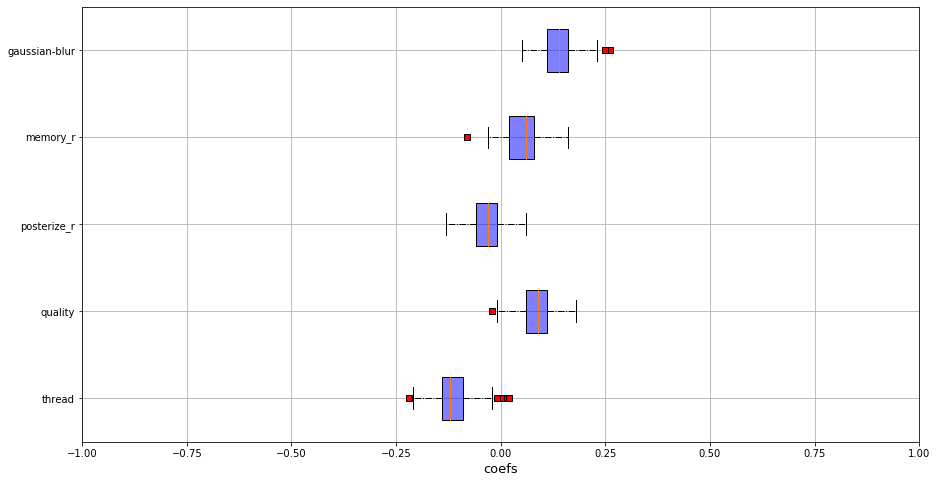


 RQ3 - Performance ratios

Mean =  7.127856887058755
Std =  10.339023399464613

--
Group  4 
--

Properties

size      3035.105263
height      87.052632
width       84.473684
rpix       129.004024
gpix       136.317972
bpix       131.801757
dtype: float64


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


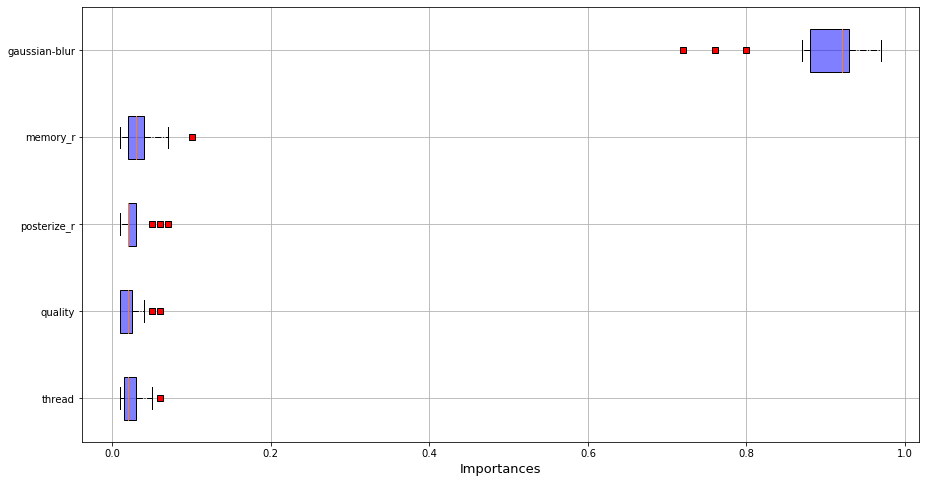

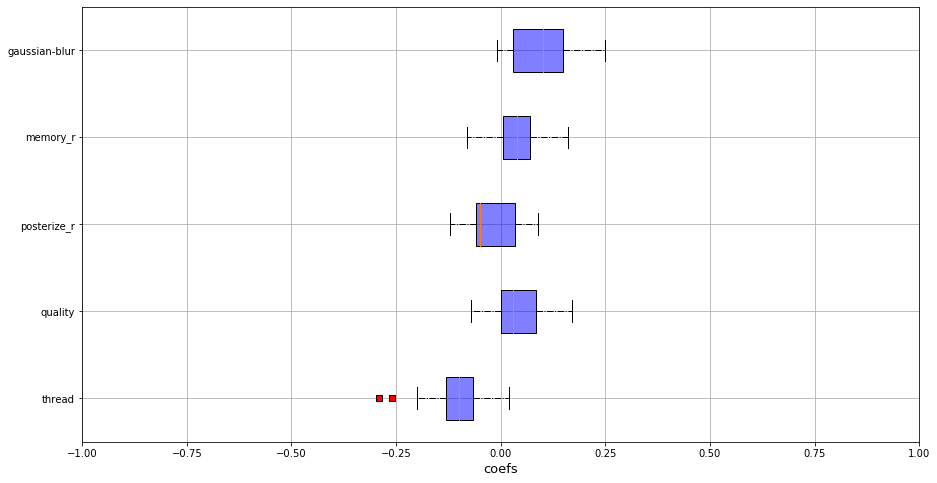


 RQ3 - Performance ratios

Mean =  25.45525362700159
Std =  8.493793081724304


/home/llesoil/anaconda3/envs/x264/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice


In [137]:
for ns in name_systems:
    print("\n-----\n", ns, "\n-----\n")
    for dim in inputs_perf[ns]:
        print("\n---\n", dim, "\n---\n")
        compute_all(ns, dim)